# **HYPOXIA OR NORMOXIA?**
*Studying the Impact of Oxygen Levels on Gene Expression in Cancer Cells*

Crespi Riccardo,
Guidotti Sofia,
Madani Sara,
Papillo Ilaria,
Picciano Alisia

## INTRODUCTION

Understanding the intricate relationship between cancer cells and the human genome is fundamental in unraveling the complexities of cancer progression. Gene expression of cancer cells has an high variability and can undergo many mutations as it grows. Hence, it is crucial to study interactions of cancer cells, if we want to combat them. Instead of directly studying the DNA, we analyse the RNA, which clearly shows which genes are expressed in the cell at a given time, thus allowing us to have a close look at the cell's metabolism.

Central to our investigation is the examination of how **oxygen availability** influences gene expression patterns in cancer cells, particularly under normoxic (normal oxygen levels) and hypoxic (reduced oxygen levels) conditions. Indeed, cancer cells, driven by uncontrolled growth, demand more oxygen than normal cells, especially in regions with extensive metastasis where blood vessels struggle to meet their oxygen demands. This oxygen deprivation can induce abnormal gene expression, leading to increased aggressiveness and treatment resistance in cancer cells. **Identifying hypoxic cells** and **understanding their adaptive responses** are critical steps toward advancing cancer treatment strategies.

The data come from an experiment which involved cultivating cells in two distinct oxygen environments, normoxia (21% oxygen) and hypoxia (1% oxygen), followed by single-cell RNA sequencing using both Smart-Seq and Drop-Seq methods. By employing results from these advanced sequencing techniques, we aim to capture detailed gene expression profiles at the single-cell level, allowing for the exploration of cellular heterogeneity and subtle transcriptional changes induced by varying oxygen levels. We focus on two cell lines: HCC1806, derived from an epitelial breast cancer, and MCF7, originating from breast adenocarcinoma.

Our data, organized in .csv tables, provides a structured framework for analysis, with each column representing a sequenced cell labeled with its growth condition (normoxia or hypoxia), and each row corresponding to a gene identified by its unique symbol. Leveraging exploratory data analysis, unsupervised, and supervised learning techniques, our project aims to **decipher the transcriptional changes associated with oxygen availability** in HCC1806 and MCF7 cell lines. Through this comprehensive approach, we strive to uncover novel insights into the molecular mechanisms underlying cancer adaptation to hypoxic environments, paving the way for targeted therapeutic interventions.

## PRELIMINARY WORK

### PYTHON LIBRARIES

*Loading all necessary librearies here.*

In [2]:
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(color_codes=True)
from scipy.sparse import csr_matrix
import scipy.cluster.hierarchy as shc
from sklearn.cluster import KMeans
!pip install scanpy
import scanpy as sc
!pip install igraph
import igraph
!pip install leidenalg
import leidenalg
from mpl_toolkits.mplot3d import Axes3D
!pip install catboost
import catboost
import joblib
from scipy.stats import kurtosis, skew
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import mutual_info_classif
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, KFold, cross_val_score
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import SGDClassifier, LogisticRegression
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.metrics.pairwise import pairwise_kernels
from scipy.stats import reciprocal
from sklearn.ensemble import VotingClassifier

### IMPORTING DATASETS

*Please, make sure to change the paths as needed on your local machine.*

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df_MCF7_S = pd.read_csv("/content/drive/MyDrive/AI_LAB/SmartSeq/MCF7_SmartS_MetaData.tsv",delimiter="\t",engine='python',index_col=0)
df_MCF7_S_UnF = pd.read_csv("/content/drive/MyDrive/AI_LAB/SmartSeq/MCF7_SmartS_Unfiltered_Data.txt",delimiter="\ ",engine='python',index_col=0)
df_MCF7_S_F = pd.read_csv("/content/drive/MyDrive/AI_LAB/SmartSeq/MCF7_SmartS_Filtered_Data.txt",delimiter="\ ",engine='python',index_col=0)
df_MCF7_S_F_N = pd.read_csv("/content/drive/MyDrive/AI_LAB/SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt",delimiter="\ ",engine='python',index_col=0)

In [ ]:
df_MCF7_D_F_N = pd.read_csv("/content/drive/MyDrive/AI_LAB/DropSeq/MCF7_Filtered_Normalised_3000_Data_train.txt", delimiter = "\ ", engine = 'python', index_col = 0)

In [ ]:
df_HCC1806_S = pd.read_csv("/content/drive/MyDrive/AI_LAB/SmartSeq/HCC1806_SmartS_MetaData.tsv",delimiter="\t",engine='python',index_col=0)
df_HCC1806_S_UnF = pd.read_csv("/content/drive/MyDrive/AI_LAB/SmartSeq/HCC1806_SmartS_Unfiltered_Data.txt",delimiter="\ ",engine='python',index_col=0)
df_HCC1806_S_F = pd.read_csv("/content/drive/MyDrive/AI_LAB/SmartSeq/HCC1806_SmartS_Filtered_Data.txt",delimiter="\ ",engine='python',index_col=0)
df_HCC1806_S_F_N = pd.read_csv("/content/drive/MyDrive/AI_LAB/SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt",delimiter="\ ",engine='python',index_col=0)

In [ ]:
df_HCC1806_D_F_N = pd.read_csv("/content/drive/MyDrive/AI_LAB/DropSeq/HCC1806_Filtered_Normalised_3000_Data_train.txt", delimiter = "\ ", engine = 'python', index_col = 0)

## EXPLORATORY DATA ANALYSIS (EDA)

Before developing any predicitve model, we will thoroughly analyse the provided datasets.

We will first deal with data coming from those cells whose RNA has been extracted with the SmartSeq method, and then focus on those sampled through the DropSeq method. We will always consider both MCF7 and HCC1806 cell lines.

Notice that data coming from SmartSeq were provided to us in unfiltered, filtered and normalized forms. We will first deal with the raw data and then turn our attention to the other two datasets, eventually marking down what filtering techniques have been used.

### EDA - MCF7 SmartSeq Experiment

#### GENERAL OVERVIEW

We start by giving a quick look at the Meta file, which offers an overview of what cells we are dealing with, also indicating in which conditions they were grown in the lab.

In [ ]:
print("Dataframe dimensions:", np.shape(df_MCF7_S))

Dataframe dimensions: (383, 8)


In [ ]:
print("First column: ", df_MCF7_S.iloc[ : , 0])

First column:  Filename
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam      MCF7
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam      MCF7
                                                            ... 
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam    MCF7
output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam    MCF7
Name: Cell Line, Length: 383, dtype: object


In [ ]:
df_MCF7_S.head(5)

,Cell Line,Lane,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A10,Hypo,72,S28,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A11,Hypo,72,S29,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A12,Hypo,72,S30,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A1,Norm,72,S1,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A2,Norm,72,S2,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


As already foretold, the meta file contains information about the experiment, with each line representing a single cell and columns providing us with the following details:

*   **Cell Line**: name of the line where the cell comes from;
*   **Lane**: ID of the plate used to run PCR reactions for that cell (Polymerase Chain Reaction, a techinque used to rapidly amplify a small sample of DNA);
*   **Pos**: position of the cell;
*   **Condition**: normoxia or hypoxia;
*   **Hours**: how long did the experiment last;
*   **Cell name**: an identifying string for each cell;
*   **PrepocessingTag**: method used to reconstruct what genes where expressed in the cell, starting form the extracted RNA;
*   **ProcessingComments**: method used to get to the final list of genes expressed in a cell, refining previous results.

As the reader may already know, single-cell RNA (scRNA) sequencing, which is the technological successor to classical “bulk” RNA-seq, is an RNA sequencing technique where samples are no longer defined at the tissue level but at the individual cell level. The bulk RNA-seq methods would give the average expression of genes in a sample, whilst overlooking the distinct expression profiles given by the cell sub-populations due to their heterogeneity.

Results from scRNA sequencing undergo a processing phase, in which aminoacids expressed in the cells, found from the extracted RNA bases, are first put in the right order to form codons. Last step is gene reconstruction, whose goal is to understand what part of the genome was active in each cell.

From now on, we turn our attention to the actual sequencing data.

In [ ]:
df_MCF7_S_UnF.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22934 entries, "WASH7P" to "MAFIP"
Columns: 383 entries, "output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam" to "output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"
dtypes: int64(383)
memory usage: 67.2+ MB


In [ ]:
df_MCF7_S_UnF.head(5)

,"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,1
"""MIR6859-1""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""WASH9P""",1,0,0,0,0,1,10,1,0,0,...,1,1,0,0,0,0,1,1,4,5
"""OR4F29""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
"""MTND1P23""",0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [ ]:
df_MCF7_S_UnF.describe()

,"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"""
count,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,...,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000
mean,40.817651,0.012253,86.442400,1.024636,14.531351,56.213613,75.397183,62.767725,67.396747,2.240734,...,17.362562,42.080230,34.692422,32.735284,21.992718,17.439391,49.242784,61.545609,68.289352,62.851400
std,465.709940,0.207726,1036.572689,6.097362,123.800530,503.599145,430.471519,520.167576,459.689019,25.449630,...,193.153757,256.775704,679.960908,300.291051,153.441647,198.179666,359.337479,540.847355,636.892085,785.670341
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,17.000000,0.000000,5.000000,0.000000,7.000000,23.000000,39.000000,35.000000,38.000000,1.000000,...,9.000000,30.000000,0.000000,17.000000,12.000000,9.000000,27.000000,30.000000,38.000000,33.000000
max,46744.000000,14.000000,82047.000000,289.000000,10582.000000,46856.000000,29534.000000,50972.000000,36236.000000,1707.000000,...,17800.000000,23355.000000,81952.000000,29540.000000,12149.000000,19285.000000,28021.000000,40708.000000,46261.000000,68790.000000


As a safety measure, we make sure that there are no missing values.

In [ ]:
assert [df_MCF7_S_UnF.isnull() is False]
# no missing values

This dataset has the cells displayed as columns. Rows show us the amount of genes expressed in each cell, per gene type. The different types of genes are stored in the variable below.

In [ ]:
gene_symbols_MCF7_S_UnF = df_MCF7_S_UnF.index
print("Dataframe indexes: ", gene_symbols_MCF7_S_UnF)

Dataframe indexes:  Index(['"WASH7P"', '"MIR6859-1"', '"WASH9P"', '"OR4F29"', '"MTND1P23"',
       '"MTND2P28"', '"MTCO1P12"', '"MTCO2P12"', '"MTATP8P1"', '"MTATP6P1"',
       ...
       '"MT-TH"', '"MT-TS2"', '"MT-TL2"', '"MT-ND5"', '"MT-ND6"', '"MT-TE"',
       '"MT-CYB"', '"MT-TT"', '"MT-TP"', '"MAFIP"'],
      dtype='object', length=22934)


As a *remark*, notice that, for a smoother study of the data, we will sometimes take the **transpose** of the frame, so that genes will appear as columns and cells as rows.

In [ ]:
df_MCF7_S_UnF_T = df_MCF7_S_UnF.T
df_MCF7_S_UnF_T.head(5)

,"""WASH7P""","""MIR6859-1""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""","""MTATP6P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""",0,0,1,0,0,2,2,0,0,29,...,0,0,0,505,147,4,270,0,5,8
"""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,1,1,0,1,0,0,1,0,0,0
"""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,1,1,1,0,12,...,0,0,0,1,0,0,76,0,0,0
"""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,7,...,1,0,0,44,8,0,66,0,1,0
"""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,68,...,0,0,0,237,31,3,727,0,0,0


Let's take a closer look at the different values and check for some outstanding features, possibly indicating outliers.

In [ ]:
description_MCF7_S_UnF = df_MCF7_S_UnF.describe()
print("Global Max Value:", description_MCF7_S_UnF.loc['max'].max())
print("Global Min Value:", description_MCF7_S_UnF.loc['min'].min())

Global Max Value: 190556.0
Global Min Value: 0.0


We can immediately see that the dataframe has a lot of 0 entries and several large values. Indeed, sparsity and outliers will be carefully approached later.

 #### INVESTIGATING CORRELATION

Next, we will study correlation between data to gain some insights on the interaction and similarities between the cells.

In [ ]:
Corr_MCF7_S_Unf = df_MCF7_S_UnF.corr()

In [ ]:
avgCorr_MCF7_S_Unf = (Corr_MCF7_S_Unf.values.max()-Corr_MCF7_S_Unf.values.min()) /2 + Corr_MCF7_S_Unf.values.min()

Number Plotted Cells: (383, 383)
Average Correlation: 0.4989810753533692
Minimum Overall Correlation: -0.0020378492932616927 



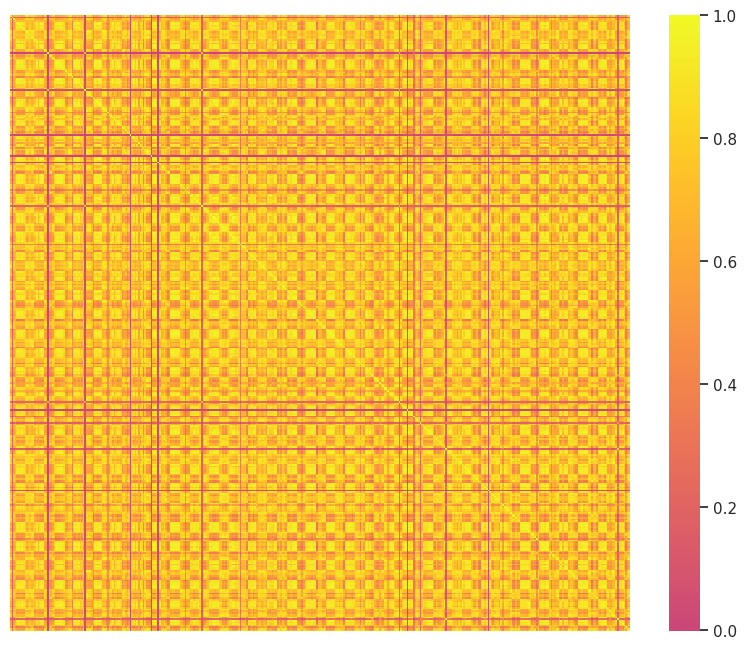

In [ ]:
plt.figure(figsize=(10,8))

sns.heatmap(Corr_MCF7_S_Unf, cmap='plasma', center=0, yticklabels=False, xticklabels=False)
print("Number Plotted Cells:", np.shape(Corr_MCF7_S_Unf))
print("Average Correlation:", avgCorr_MCF7_S_Unf)
print("Minimum Overall Correlation:", Corr_MCF7_S_Unf.values.min(), "\n")

We notice that there are cells with very low correlation. To further inverstigate why this happens, we will take a closer look at some areas of the previous plot, and select from there cells with low and cells with high correlation values, to check for some significant feature which could explain their correlation values.

In [ ]:
plt.figure(figsize=(10,8))

Sub_1_Corr_MCF7_S_Unf = Corr_MCF7_S_Unf.iloc[:15, :15]
sns.heatmap(Sub_1_Corr_MCF7_S_Unf, cmap='plasma', center=0, xticklabels=False)

print("Number of Cells:", Sub_1_Corr_MCF7_S_Unf.shape[0])
print("Maximum Correlation:", Sub_1_Corr_MCF7_S_Unf.values.max())
print("Minimum Correlation:", Sub_1_Corr_MCF7_S_Unf.values.min(), "\n")

In [ ]:
plt.figure(figsize=(10,8))

Sub_2_Corr_MCF7_S_Unf = Corr_MCF7_S_Unf.iloc[383-15:, 383-15:]
sns.heatmap(Sub_2_Corr_MCF7_S_Unf, cmap='plasma', center=0, xticklabels=False)

print("Number of Cells:", Sub_2_Corr_MCF7_S_Unf.shape[0])
print("Maximum Correlation:", Sub_2_Corr_MCF7_S_Unf.values.max())
print("Minimum Correlation:", Sub_2_Corr_MCF7_S_Unf.values.min(), "\n")

In [ ]:
# Sub_1_Corr_MCF7_S_Unf = Corr_MCF7_S_Unf.iloc[:15, :15]
# Sub_2_Corr_MCF7_S_Unf = Corr_MCF7_S_Unf.iloc[383-15:, 383-15:]

# Weakly correlated cells instances
cell_1_weak_corr_MCF7_S_Unf  = Sub_1_Corr_MCF7_S_Unf.stack().idxmin()[0]
cell_2_weak_corr_MCF7_S_Unf = Sub_2_Corr_MCF7_S_Unf.stack().idxmin()[0]

# Strongly correlated cells instances
cell_1_strong_corr_MCF7_S_Unf = Sub_1_Corr_MCF7_S_Unf.stack().idxmax()[0]
cell_2_strong_corr_MCF7_S_Unf = Sub_2_Corr_MCF7_S_Unf.stack().idxmax()[0]

# Notice: .stack().idxmin() and .stack().idxmax() return a list of names of the cells with minimum and maximum correlation coefficient
# Selecting the first element of these lists is not a loss of generalization

In [15]:
def num_nonzero_entries(dataset, cell):
    num_columns = len(dataset.T[cell])
    list = [dataset.T[cell][i]>0 for i in range(num_columns)]
    ret=0
    for var in list:
        if var==True:
            ret+=1
    return ret

In [16]:
def count_nonzero_entries(dataset, cell):
    return sum(dataset[cell])

In [ ]:
print(count_nonzero_entries(df_MCF7_S_UnF, cell_1_weak_corr_MCF7_S_Unf))
print(count_nonzero_entries(df_MCF7_S_UnF, cell_2_weak_corr_MCF7_S_Unf))
print(count_nonzero_entries(df_MCF7_S_UnF, cell_1_strong_corr_MCF7_S_Unf))
print(count_nonzero_entries(df_MCF7_S_UnF, cell_2_strong_corr_MCF7_S_Unf))

281
795636
936112
1057717


From the values above we advance the hypotheses that cells with weak correlation express very few genes. We investigate this idea deeper.

We shall look closely at the four selected cells and investigate the frequency with which each gene is expressed. We do this by plotting a histogram for each cell, as follows.

In [ ]:
def hist_freq_genes(dataset, cell, colour):
    plt.figure(figsize=(10, 6))
    plt.hist(dataset[cell], bins=50, color=colour, edgecolor='black')
    plt.ylim(top=80) # capping the hist at y=80 to make shorter bars more visible
    plt.title('Histogram of Gene Expression in Single Cell: ' + cell, pad=20)
    plt.xlabel('Gene Expression')
    plt.ylabel('Frequency')
    plt.show()

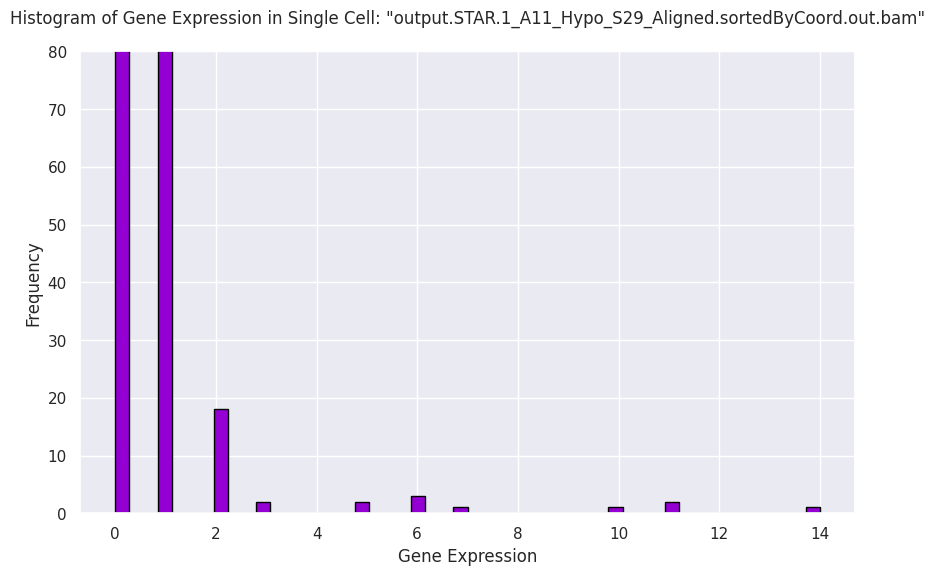

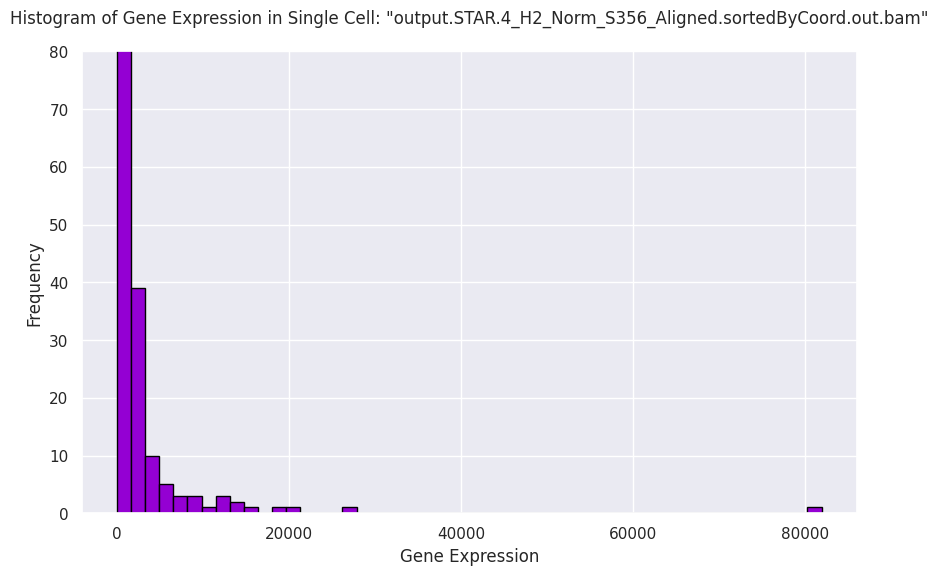

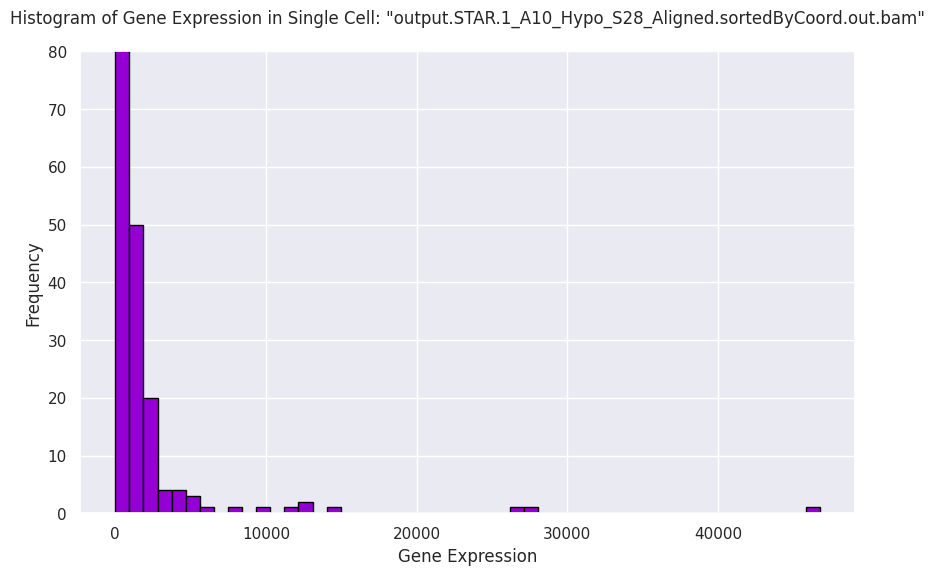

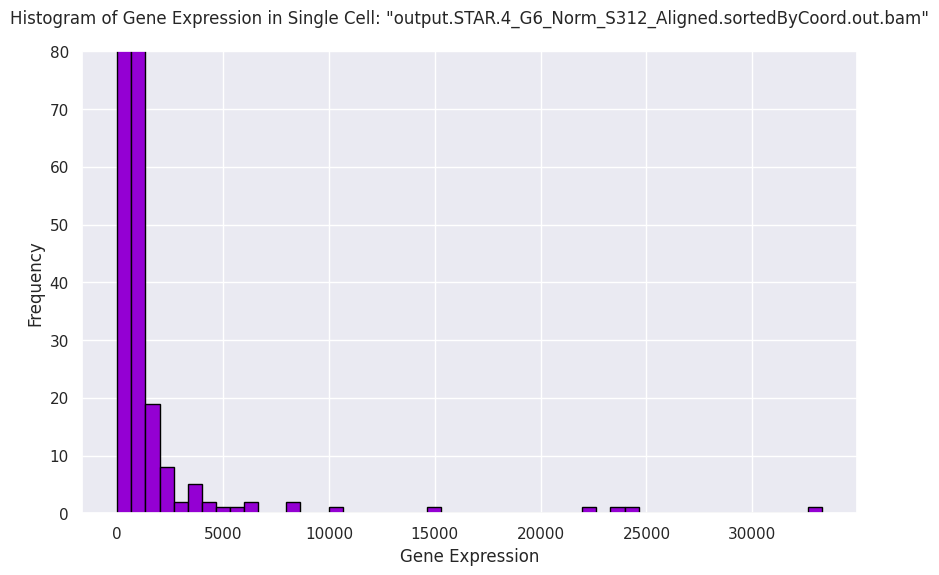

In [ ]:
hist_freq_genes(df_MCF7_S_UnF, cell_1_weak_corr_MCF7_S_Unf, 'darkviolet')
hist_freq_genes(df_MCF7_S_UnF, cell_2_weak_corr_MCF7_S_Unf, 'darkviolet')
hist_freq_genes(df_MCF7_S_UnF, cell_1_strong_corr_MCF7_S_Unf, 'darkviolet')
hist_freq_genes(df_MCF7_S_UnF, cell_2_strong_corr_MCF7_S_Unf, 'darkviolet')

By looking at the histograms, we have a visual confirmation of our previous intutition: the cells with higher correlation have genes expressed more times.

We now want to have a broader view on this phenomenon and check that our intution is not a serendipitous discovery which solely holds for the four selected genes. To do so, for each cell, we compute the average correlation it has with all other genes, and then plot it against the number of genes expressed in the cell.

In [27]:
def corr_average(corr_data, cell):
    corr_values = corr_data[cell].drop(cell).values
    average = corr_values.sum()/len(corr_values)
    return average

In [28]:
def scatter_corr_genes_count(dataset, corr_dataset):
    count_genes = []
    average = []
    for cell in dataset:
        count_genes += [count_nonzero_entries(dataset, cell)]
        average += [corr_average(corr_dataset, cell)]
    plt.figure(figsize=(10, 6))
    plt.scatter(average, count_genes, s=20, alpha=0.5, c='darkviolet')
    # for i, txt in enumerate(corr_dataset.columns[1:]):
    #     plt.annotate(txt, (average[i], num_genes[i]), textcoords="offset points", xytext=(0,10), ha='center')
    plt.xlabel('Average Correlation Coefficient')
    plt.ylabel('Count of Expressed Genes')
    plt.title('Average Correlation vs count of Expressed Genes per Cell')
    plt.grid(True)
    plt.show()

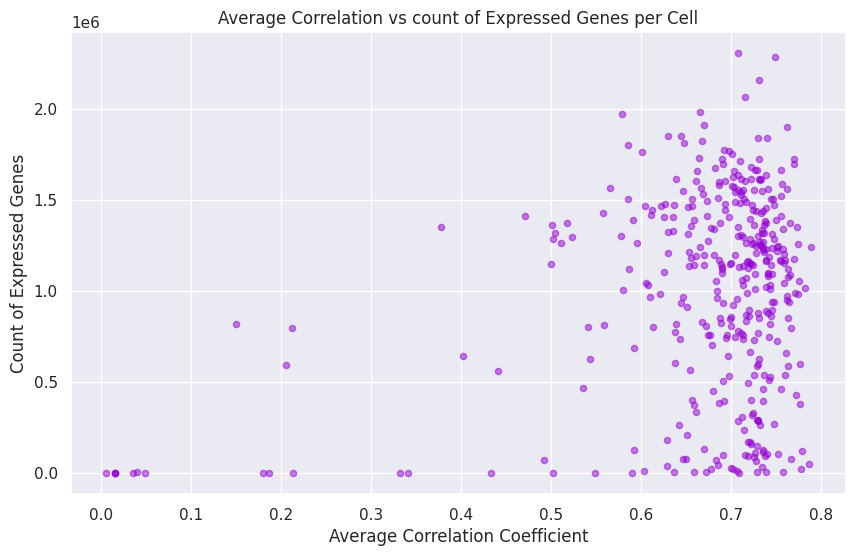

In [ ]:
scatter_corr_genes_count(df_MCF7_S_UnF, Corr_MCF7_S_Unf)

The scatter plot hints at some sort of positive dependence between the number of genes expressed in a cell and its correlation coefficient.

Let's see what happens for the extreme cases where the correlation is 0 or very close to 0.

In [ ]:
pairs_cells_with_zero_corr = []
for cell1 in Corr_MCF7_S_Unf.columns:
    for cell2 in Corr_MCF7_S_Unf.index:
        corr = Corr_MCF7_S_Unf.loc[cell1, cell2]
        if np.isclose(corr, 0, rtol=1e-04, atol=1e-04):
            pairs_cells_with_zero_corr.append((cell1, cell2))
unique_pairs_cells_with_zero_corr = list(set(pairs_cells_with_zero_corr))
cells_with_zero_corr = list(set(cell1 for (cell1,_) in unique_pairs_cells_with_zero_corr))

In [ ]:
cells_with_zero_corr

['"output.STAR.3_E3_Norm_S207_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.4_A11_Hypo_S47_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_H5_Norm_S341_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.2_H10_Hypo_S370_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_D8_Hypo_S170_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.3_G3_Norm_S303_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_E10_Hypo_S220_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.3_G8_Hypo_S326_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.1_H1_Norm_S337_Aligned.sortedByCoord.out.bam"']

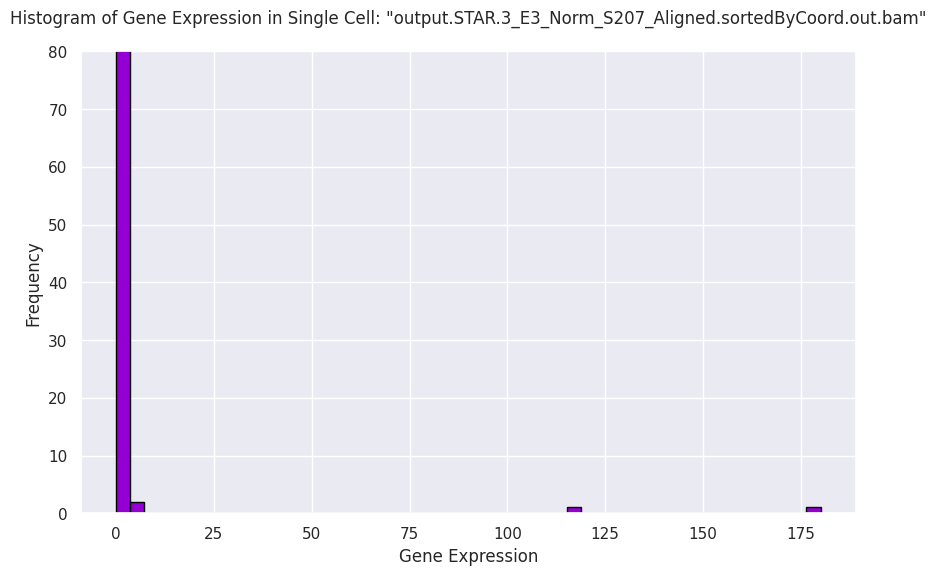

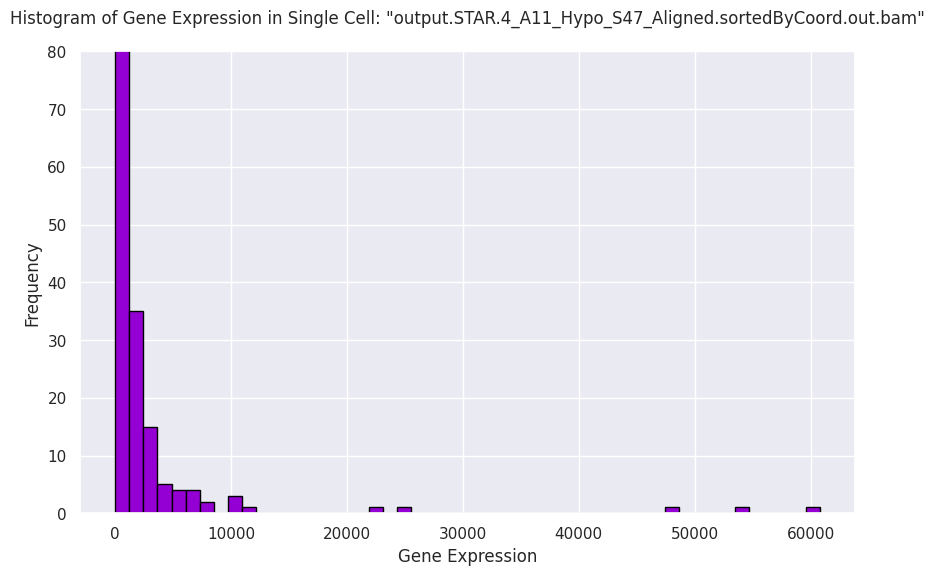

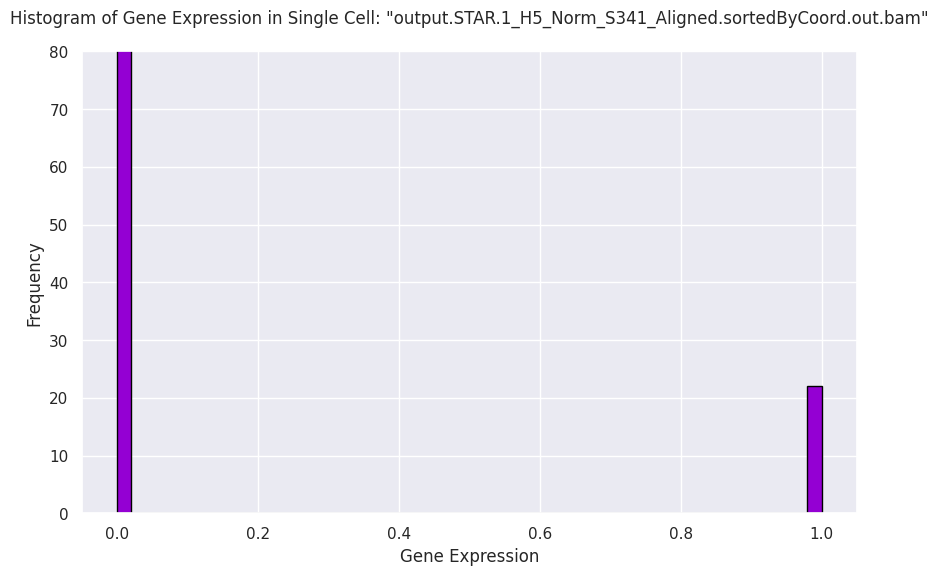

In [ ]:
hist_freq_genes(df_MCF7_S_UnF, cells_with_zero_corr[0], 'darkviolet')
hist_freq_genes(df_MCF7_S_UnF, cells_with_zero_corr[1], 'darkviolet')
hist_freq_genes(df_MCF7_S_UnF, cells_with_zero_corr[2], 'darkviolet')

We see that cells with correlation coefficient close to zero express even less genes, which comes to further confirm our suggestion.

#### OUTLIERS

Now that we have  a more precise idea of the dataset we are dealing with, we move on to identify possible outliers and decide how to treat them.

We first try to find outliers in the standard way, namely defining an interquartile range.

In [ ]:
Q1 = df_MCF7_S_UnF.quantile(0.25)
Q3 = df_MCF7_S_UnF.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

"output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam"    17.0
"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"     0.0
"output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam"     5.0
"output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam"       0.0
"output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam"       7.0
                                                              ... 
"output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam"     9.0
"output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam"    27.0
"output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam"    30.0
"output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam"    38.0
"output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"    33.0
Length: 383, dtype: float64


In [ ]:
IQR.value_counts()

0.00     38
34.00    17
33.00    14
35.00    14
32.00    13
2.00     12
28.00    12
17.00    11
31.00    11
29.00    10
27.00     9
14.00     9
25.00     9
18.00     9
42.00     8
13.00     8
11.00     8
30.00     8
39.00     8
1.00      8
9.00      8
38.00     8
45.00     7
23.00     7
37.00     7
26.00     7
19.00     7
21.00     6
20.00     6
5.00      6
3.00      6
8.00      6
7.00      5
16.00     5
22.00     5
4.00      5
15.00     5
43.00     5
10.00     4
40.00     4
6.00      4
44.00     3
12.00     3
24.00     3
41.00     3
47.00     2
36.00     2
4.75      1
41.75     1
45.75     1
50.00     1
24.75     1
35.75     1
40.75     1
49.00     1
Name: count, dtype: int64

The common approach would proceed to filter out from the frame all data with value beyond 1.5*IQR. Let's try and see what we end up with.

In [ ]:
df_MCF7_S_UnF_noOut = df_MCF7_S_UnF[~((df_MCF7_S_UnF < (Q1 - 1.5 * IQR)) |(df_MCF7_S_UnF > (Q3 + 1.5 * IQR))).any(axis=1)]

In [ ]:
df_MCF7_S_UnF_noOut.T.shape

(383, 6435)

In [ ]:
df_MCF7_S_UnF_noOut.T.head(5)

,"""MIR6859-1""","""CICP3""","""FAM87B""","""MIR429""","""TTLL10""","""C1QTNF12""","""LINC01786""","""MIR6726""","""MIR6727""","""TAS1R3""",...,"""KRTAP10-2""","""IMMTP1""","""LINC01424""","""SSR4P1""","""COL18A1-AS2""","""MIR6815""","""DIP2A-IT1""","""MT-TF""","""MT-TS1""","""MT-TR"""
"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
"""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [ ]:
print("Difference of number of columns:", df_MCF7_S_UnF.T.shape[1]-df_MCF7_S_UnF_noOut.T.shape[1])

Difference of number of columns: 16499


In [ ]:
print("Percentage of removed columns:", (df_MCF7_S_UnF.T.shape[1]-df_MCF7_S_UnF_noOut.T.shape[1])/df_MCF7_S_UnF.T.shape[1]*100, "%")

Percentage of removed columns: 71.94122263887678 %


These numbers already rise the doubt that our dataframe is too small now. But let's look at the violin plot of the new dataset to get a visual interpretation.

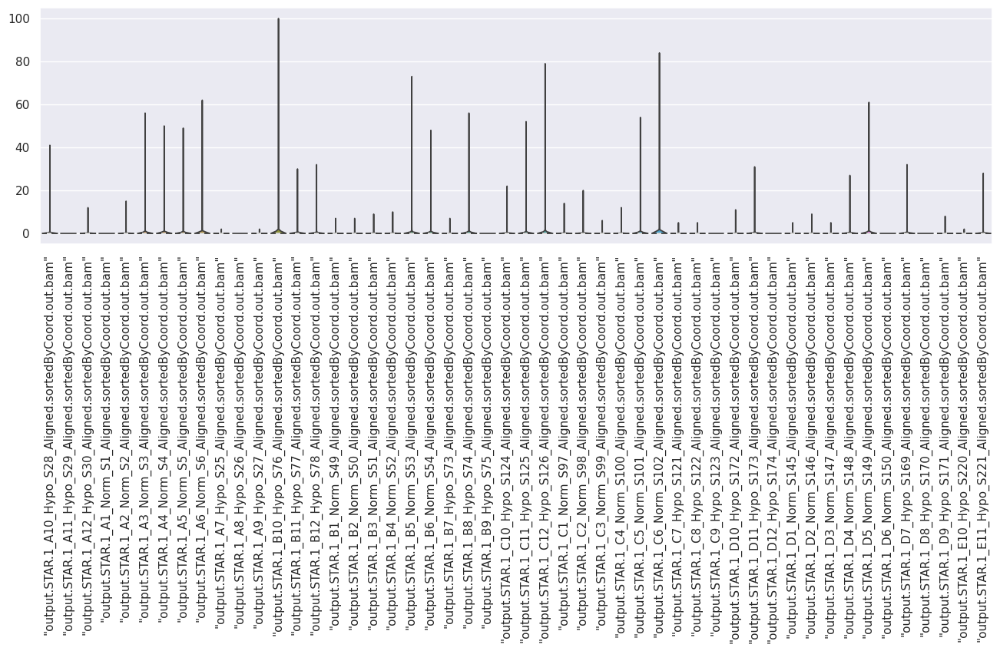

In [ ]:
plt.figure(figsize=(16, 4))
plot = sns.violinplot(data=df_MCF7_S_UnF_noOut.iloc[:, :50], cut=0) # restricting to 50 samples for computational economy
plot.set_xticks(range(0, 50))
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

We see that this filtered dataset has a lot of zeros and low-valued points. Thus, we should refrain from deleting data which are not in the interquartile range.

As a matter of fact, if we remove the detected rows in the transposed data (i.e. any column (gene) of the initial dataset that has values that are below Q1 or above Q3 by more than 1.5 times the IQR), we obtain a final dataframe with 6424 columns, meaning that we deleted 16481 genes, more than 70% of the total!

As a remark, notice that **outliers should not be neglected** in this case, for an observation expresses the RNA sequencing counts, therefore high values should not be seen as errors, but rather as important indicators. Below, you have a visual represenation of what stated herewith.

In [14]:
def scatter_count_genes(dataset):
    count_genes = []
    cells = []
    for cell in dataset:
        count_genes += [count_nonzero_entries(dataset, cell)]
        cells += [cell]
    sorted_count_genes = sorted(count_genes)
    sorted_cells = sorted(cells, key=lambda x: count_nonzero_entries(dataset, x))
    plt.figure(figsize=(10, 6))
    plt.scatter(sorted_cells, sorted_count_genes, s=10, alpha=0.5, c='darkviolet')
    plt.xlabel('Cells')
    plt.ylabel('Count of Expressed Genes')
    plt.title('Cells vs count of Expressed Genes per Cell')
    plt.xticks([])
    plt.grid(True)
    plt.show()

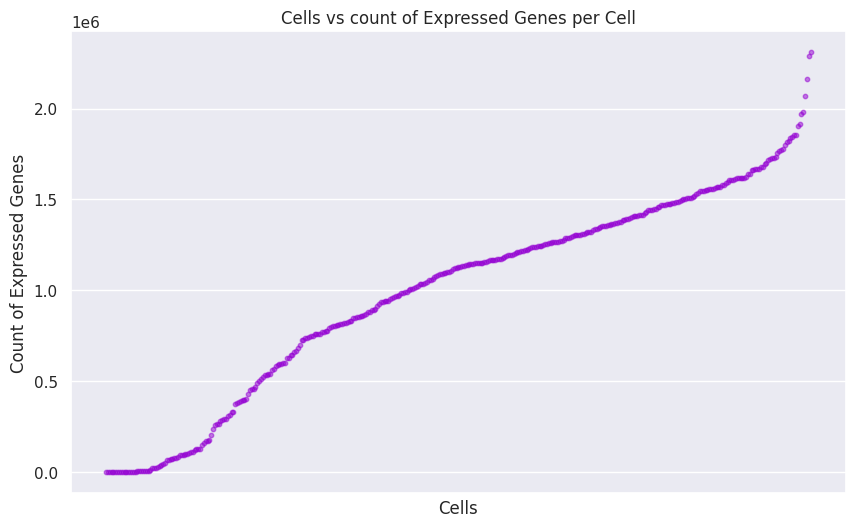

In [ ]:
scatter_count_genes(df_MCF7_S_UnF)

#### SPARSITY

From our previous analysis, data turned out to be very sparse. We further invesitgate this issue, first by computing the sparsity index.

In [18]:
def sparsity(matrix):
    # Total number of elements in the matrix
    total_elements = matrix.size
    # Number of zero elements in the matrix
    zero_elements = np.count_nonzero(matrix == 0)
    # Sparsity calculation
    sparsity_value = (zero_elements / total_elements) * 100
    return sparsity_value

In [ ]:
print('Number of 0s in the matrix:', np.count_nonzero(df_MCF7_S_UnF==0))

print('Sparsity index:', sparsity(df_MCF7_S_UnF), '%')

Number of 0s in the matrix: 5289146
Sparsity index: 60.215316468349066 %


Clearly, data *is* sparse.

As a last attempt to redeem the usefulness of the dataset filtered through interquartile analysis, let's see if adopting it could be useful to address sparsity.

In [ ]:
print('Number of 0 values in the matrix:', np.count_nonzero(df_MCF7_S_UnF_noOut==0))

print('Sparsity index:', sparsity(df_MCF7_S_UnF_noOut), '%')

Number of 0 values in the matrix: 2353391
Sparsity index: 95.48755277214808 %


Also in this case, removing outliers in the way we suggested in the previous paragraph is a really bad idea, for it increases sparsity even more.

Sparse data may cause problems when training models, besides taking up a large amount of memory for data whilst carrying little information.

We will properly address sparsity in the following parts, mainly through dimensionality reduction.

To get an idea of where sparsity comes from, we plot the sparsity matrix of the datset.

In [19]:
def plot_sparsity_matrix(matrix, sparsity):
  plt.figure(figsize=(200, 600))
  plt.spy(matrix, markersize=0.5, color='darkviolet')
  plt.title('Sparsity Matrix (Sparsity: {}%)'.format(sparsity))
  plt.xlabel('Cells')
  plt.ylabel('Genes')
  plt.show()

In [ ]:
# plot_sparsity_matrix(df_MCF7_S_UnF, sparsity(df_MCF7_S_UnF))

We can draw two main conclusion from this huge plot.

*   First, we have a confirmation of the fact that some cells express very few genes, which can be related to the natural status of these cells (they probably are **dying cells**), or also to measurement problems, lab mistakes, etc. These cells are associated to columns which are almost white in the plot above.
*   Second, **some genes are not expressed** among almost all cells, hinting at the uselessness to synthetize the protein or activate the methabolic response encoded in these genes. These are clearly visible as white stripes in the sparicity matrix.

This plot tells us that, even if on the one hand we have a very sparse dataframe, on the other hand this **sparsity is justified by a biological interpretation**.

#### DISTRIBUTION OF THE DATA

Now we look into data to see if some known distribution can be traced. To do so, we compute Skewness and Kurtosis.

**Skewness** is a measure of the asymmetry of the probability distribution of a real-valued random variable about its mean. We say that a distribution is skewed if it is asymmetric around its mean.

**Kurtosis** is a measure of the "tailedness" of the probability distribution of a real-valued random variable. Distributions with a large kurtosis have more tail data than normally distributed data, which appears to bring the tails in toward the mean. Distributions with low kurtosis, instead, have fewer tail data, which appears to push the tails of the bell curve away from the mean.

In [18]:
def skewness_cells(dataset):
    column_names = list(dataset.columns)
    colN = np.shape(dataset)[1]
    df_skew_cells = []

    for i in range(colN):
        v_df = dataset[column_names[i]]
        df_skew_cells += [skew(v_df)]

    return df_skew_cells

In [19]:
def plot_skewness(dataset):
    df_skew_cells = skewness_cells(dataset)
    sns.histplot(df_skew_cells, bins=100, color='darkviolet')
    plt.xlabel('Skewness of single cells expression profiles')
    plt.show()
    print("Mean of skewness values:", np.mean(df_skew_cells))

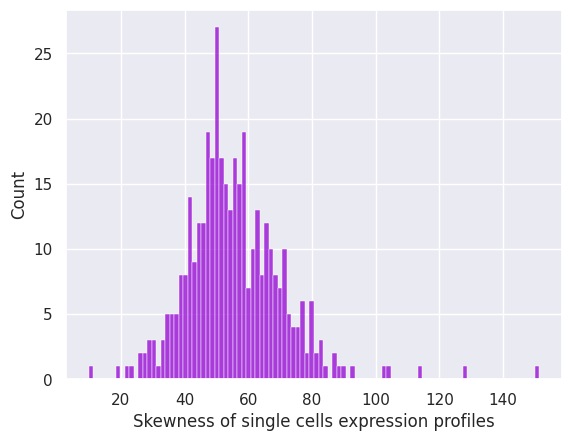

Mean of skewness values: 55.59958034753704


In [ ]:
plot_skewness(df_MCF7_S_UnF)

Skewness has high positive value, indicating that **the distribution is right-skewed**.

In [20]:
def kurtosis_cells(dataset):
    column_names = list(dataset.columns)
    colN = np.shape(dataset)[1]
    df_kurt_cells = []

    for i in range(colN) :
        v_df = dataset[column_names[i]]
        df_kurt_cells += [kurtosis(v_df)]

    return df_kurt_cells

In [21]:
def plot_kurtosis(datset):
    df_kurt_cells = kurtosis_cells(datset)
    sns.histplot(df_kurt_cells, bins=100, color='darkviolet')
    plt.xlabel('Kurtosis of single cells expression profiles')
    plt.show()
    print("Mean of kurtosis values:", np.mean(df_kurt_cells))

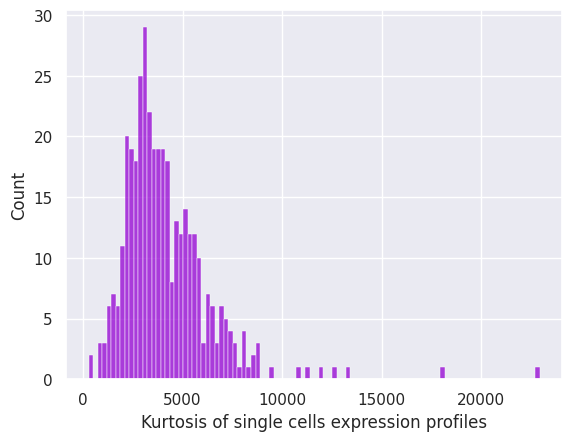

Mean of kurtosis values: 4164.854641341205


In [ ]:
plot_kurtosis(df_MCF7_S_UnF)

Kurtosis is high and positive, hinting at a more **peaked distribution** than a normal one.

Overall, skewness and kurtosis tell us that the distribution of our data is well far from a Gaussian. Although high skewedness and kurtosis are not a problem per se, they could be difficult to deal with sometimes. Hence, in the next section we will try to transform the data and see if they get better distributed.

#### DATA TRANSFORMATION

As a rule of thumb, one usually starts changing highly non-Gaussian distributions by taking the logarithm of its data, since it surely lowers the highest peaks.

In [ ]:
df_MCF7_S_UnF_log2 = np.log2(df_MCF7_S_UnF+1)
df_MCF7_S_UnF_log2_T = df_MCF7_S_UnF_log2.T
df_MCF7_S_UnF_log2_T.head(5)

,"""WASH7P""","""MIR6859-1""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""","""MTATP6P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""",0.0,0.0,1.0,0.0,0.0,1.584963,1.584963,0.0,0.0,4.906891,...,0.0,0.0,0.0,8.982994,7.209453,2.321928,8.082149,0.0,2.584963,3.169925
"""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""",0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,...,1.0,1.0,0.0,1.000000,0.000000,0.000000,1.000000,0.0,0.000000,0.000000
"""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""",0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.0,0.0,3.700440,...,0.0,0.0,0.0,1.000000,0.000000,0.000000,6.266787,0.0,0.000000,0.000000
"""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""",0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,3.000000,...,1.0,0.0,0.0,5.491853,3.169925,0.000000,6.066089,0.0,1.000000,0.000000
"""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""",0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,6.108524,...,0.0,0.0,0.0,7.894818,5.000000,2.000000,9.507795,0.0,0.000000,0.000000


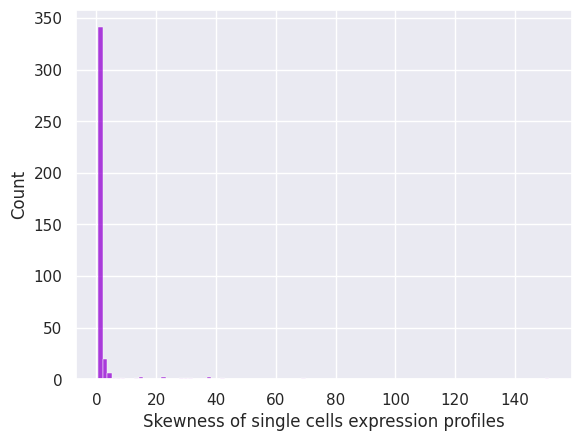

Mean of skewness values: 2.485184439234393


In [ ]:
plot_skewness(df_MCF7_S_UnF_log2)

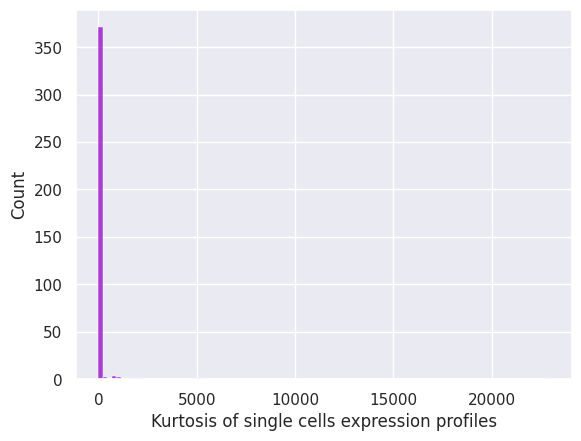

Mean of kurtosis values: 103.16057273373588


In [ ]:
plot_kurtosis(df_MCF7_S_UnF_log2)

As hoped, we see that, although taking the logarithm does not provide us with a well-behaved Gaussian distribution, it significantly lowers the values of skewness and kurtosis. Hence, we will mainly deal with the transformed dataset from now on.

#### CELL FILTERING (back to outliers...)

Now that we have (at least slightly) improved the values of our data, we can turn again our attention to outliers. Indeed, we had already pointed out that some cells have a very low gene expression, hinting at low activity (they are most probably dying). We will proceed by deleting these anomalous cells.

To choose which cells we should remove, we plot for each of them the total gene count versus the number of expressed genes per cell.

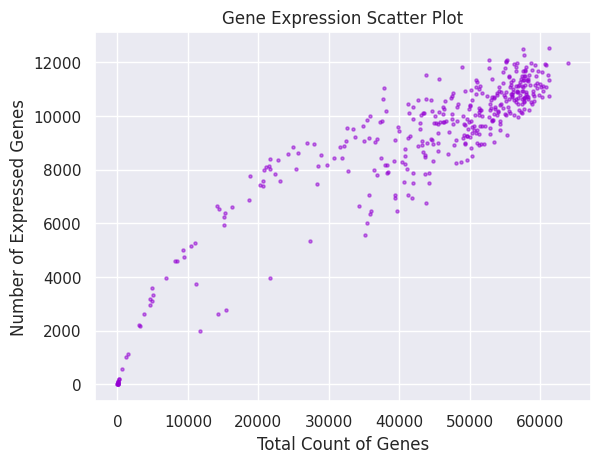

In [ ]:
tot_genes = df_MCF7_S_UnF_log2_T.sum(axis=1)
expressed_genes = (df_MCF7_S_UnF_log2_T!=0).sum(axis=1)

plt.scatter(tot_genes, expressed_genes, color='darkviolet', alpha=0.5, s=5)
plt.xlabel('Total Count of Genes')
plt.ylabel('Number of Expressed Genes')
plt.title('Gene Expression Scatter Plot')
plt.show()

We can immediately detect some cells which can be defined as outliers: the ones with both low gene read and low total gene count, and the ones with extremely high values.

With a **heuristic approach**, we could define some limiting values, drawing lines which discern outliers from the rest of the data.

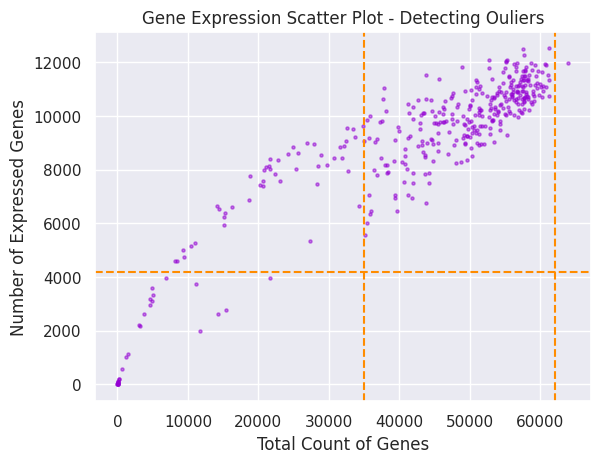

In [ ]:
plt.scatter(tot_genes, expressed_genes, color='darkviolet', alpha=0.5, s=5)
plt.xlabel('Total Count of Genes')
plt.ylabel('Number of Expressed Genes')
plt.title('Gene Expression Scatter Plot - Detecting Ouliers')
plt.axvline(x=35000, color='darkorange', linestyle='--')
plt.axvline(x=62000, color='darkorange', linestyle='--')
plt.axhline(y=4200, color='darkorange', linestyle='--')
plt.show()

Nevertheless, this approach, however straightforward it may be, is very arbitrary and solely relies on the viewer's intuition of the plot. Hence, we will not rush to deleting outliers which have been detected in this way. Still, those graphs are very useful to get at least an initial idea of how outliers should be handled in the dataset and of what to expect from clustering.

#### NORMALIZATION

By the way the data was collected, each cell was sequenced independently, which implies data might need to be normalized across cells.

We start by plotting the distributions of gene expression for all cells.

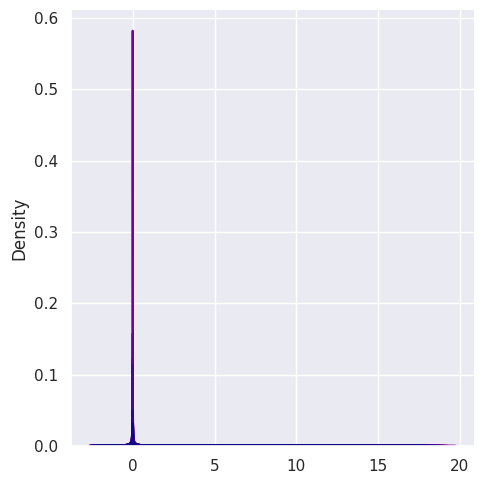

In [ ]:
sns.displot(data=df_MCF7_S_UnF_log2, palette='plasma', kind="kde", bw_adjust=2, legend=False)

At this large scale, we see a high peak around the value 0 (as expected from our previous analysis). Let's have a closer look, say at 10 cells and at a single one.

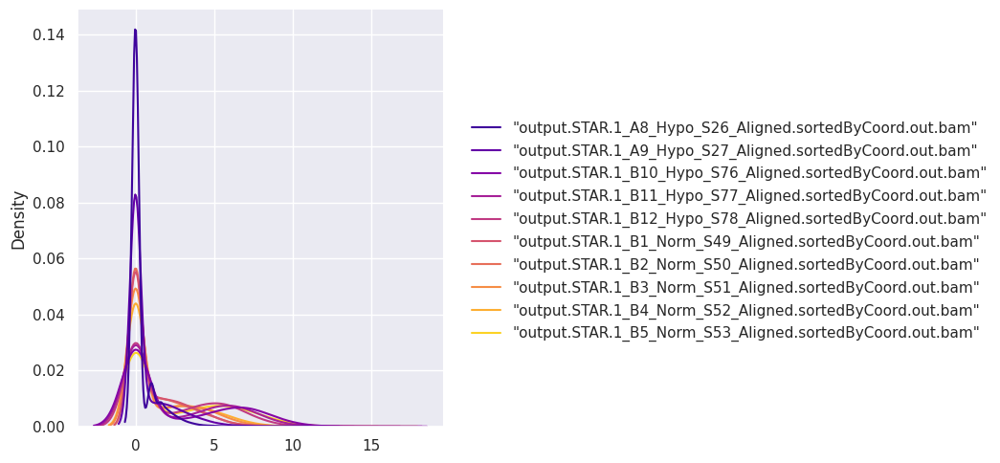

In [ ]:
sns.displot(data=df_MCF7_S_UnF_log2.iloc[:,10:20], palette='plasma', kind="kde", bw_adjust=2)
plt.show()

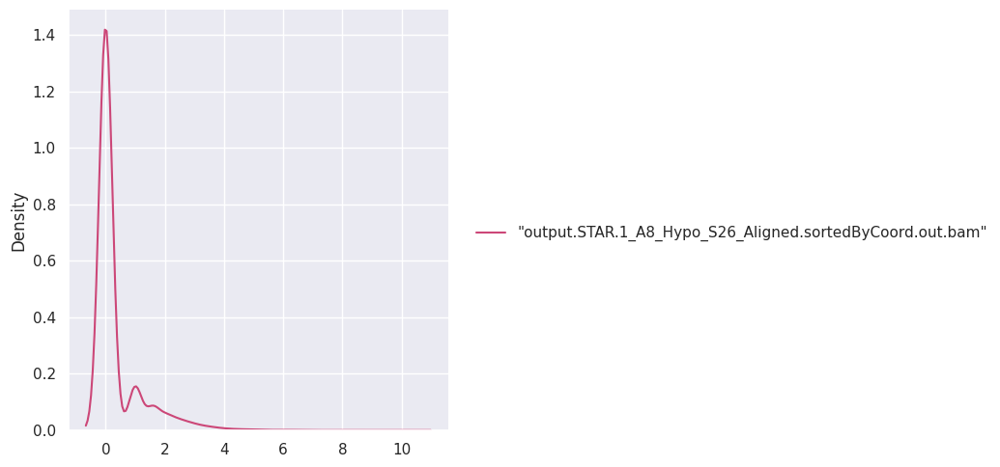

In [ ]:
sns.displot(df_MCF7_S_UnF_log2.iloc[:,10:11], palette='plasma', kind='kde', bw_adjust=2)
plt.show()

Cells feature two main peaks, which are due to the natural fact that there are high and low expressed genes.

We want to perform some good normalization and check how our dataset behaves. We go for standardization, which not only is one of the most used normalization techniques, but also offers a good interpretation of the mathematical operations we perform on the biological data.

In [ ]:
scaler = StandardScaler()
df_MCF7_S_UnF_log2_std = scaler.fit_transform(df_MCF7_S_UnF_log2)
df_MCF7_S_UnF_log2_std = pd.DataFrame(df_MCF7_S_UnF_log2_std, columns=df_MCF7_S_UnF.columns, index=df_MCF7_S_UnF.index)
df_MCF7_S_UnF_log2_std_T = pd.DataFrame(df_MCF7_S_UnF_log2_std.T, columns=df_MCF7_S_UnF.columns, index=df_MCF7_S_UnF.index)

In [ ]:
df_MCF7_S_UnF_log2_std

,"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam""","""output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",-0.688866,-0.083398,-0.565877,-0.438270,-0.724410,-0.740652,-0.801919,-0.859173,-0.805266,-0.529652,...,-0.751682,-0.827878,-0.272259,-0.366046,-0.718394,-0.724894,-0.729708,-0.407334,-0.764335,-0.433909
"""MIR6859-1""",-0.688866,-0.083398,-0.565877,-0.438270,-0.724410,-0.740652,-0.801919,-0.859173,-0.805266,-0.529652,...,-0.751682,-0.827878,-0.272259,-0.742505,-0.718394,-0.724894,-0.729708,-0.740854,-0.764335,-0.768009
"""WASH9P""",-0.324383,-0.083398,-0.565877,-0.438270,-0.724410,-0.400109,0.290540,-0.528807,-0.805266,-0.529652,...,-0.298648,-0.478743,-0.272259,-0.742505,-0.718394,-0.724894,-0.389548,-0.407334,-0.014932,0.095626
"""OR4F29""",-0.688866,-0.083398,-0.565877,-0.438270,-0.724410,-0.740652,-0.801919,-0.859173,-0.805266,-0.529652,...,-0.751682,-0.827878,-0.272259,-0.742505,-0.718394,-0.724894,-0.729708,-0.740854,-0.441585,-0.768009
"""MTND1P23""",-0.688866,-0.083398,-0.565877,-0.438270,-0.724410,-0.740652,-0.801919,-0.859173,-0.805266,-0.529652,...,-0.751682,-0.827878,0.259651,-0.742505,-0.718394,-0.724894,-0.729708,-0.740854,-0.764335,-0.768009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"""MT-TE""",0.157438,-0.083398,-0.565877,-0.438270,0.202078,-0.059566,-0.801919,-0.859173,0.452035,0.314753,...,-0.751682,-0.017211,1.696041,0.131606,-0.718394,-0.278767,0.225243,-0.740854,0.203917,0.007746
"""MT-CYB""",2.256945,8.545421,1.481511,6.065583,3.680022,3.144376,3.362486,2.995537,3.364424,3.653694,...,2.830409,3.323434,6.982759,3.453005,3.572204,3.360452,3.271955,2.077796,2.816072,2.628920
"""MT-TT""",-0.688866,-0.083398,-0.565877,-0.438270,-0.724410,-0.400109,-0.486127,-0.528807,-0.058032,-0.529652,...,-0.751682,0.219528,0.962797,-0.145831,-0.718394,-0.724894,-0.049387,-0.740854,-0.252788,-0.238473
"""MT-TP""",0.253310,-0.083398,-0.565877,0.633896,-0.724410,-0.400109,-0.486127,-0.092087,-0.295199,-0.529652,...,-0.751682,0.536156,2.830312,0.607087,-0.065693,-0.724894,0.290773,-0.212237,0.803581,0.429725


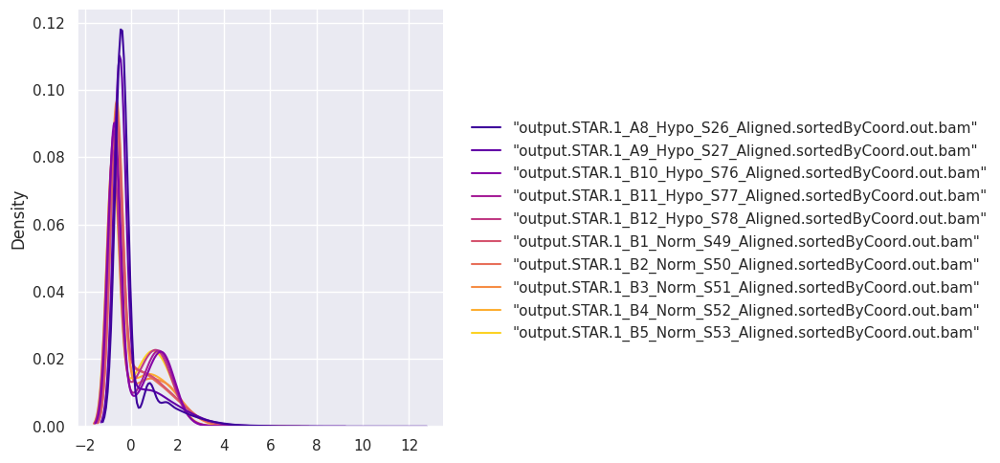

In [ ]:
sns.displot(data=df_MCF7_S_UnF_log2_std.iloc[:,10:20], palette='plasma', kind="kde", bw_adjust=2)
plt.show()

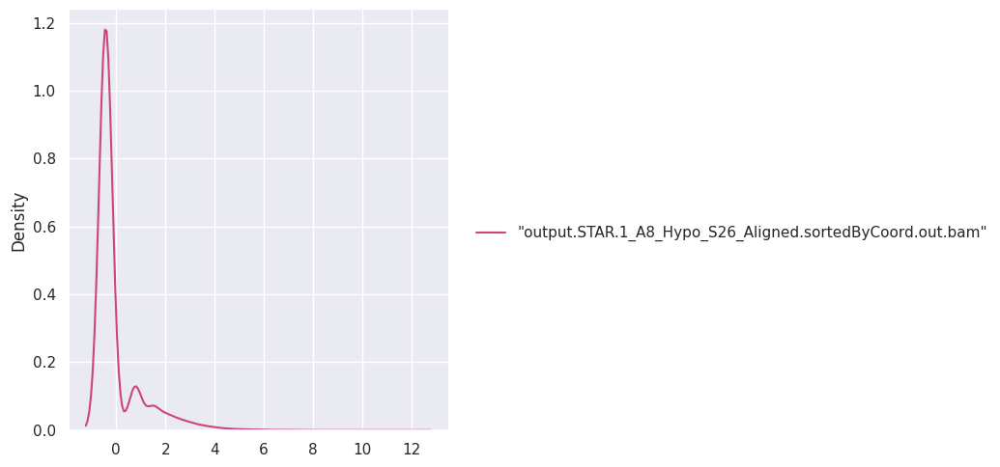

In [ ]:
sns.displot(df_MCF7_S_UnF_log2_std.iloc[:,10:11], palette='plasma', kind="kde", bw_adjust=2)
plt.show()

In [ ]:
print(np.mean(skew(df_MCF7_S_UnF_log2_std)))

2.485184439234394


In [ ]:
print(np.mean(kurtosis(df_MCF7_S_UnF_log2_std)))

103.1605727337359


#### MUTUAL INFORMATION (background to feature selection)

Now that we have thoroughly studied our dataset, we can proceed towards our final objective (i.e. creating a machine learning model able to discern between cells which underwent hypoxia and cells which did not experience lack of oxigen).

Before turning our attention to unsupervised learning, which will shed more light on our data, we would like to have a preview on what genes carry most information on the growth condition of the cells.

To compute the information gain that genes have on the cells with respect to their condition ('Hypoxia' or 'Normoxia'), we can use the mutual information criterion. Mutual information quantifies the amount of information obtained about one variable through observing the other variable.

In [ ]:
condition_column = df_MCF7_S['Condition']

mutual_info = mutual_info_classif(df_MCF7_S_UnF_log2_std.T, condition_column)

In [ ]:
# Create a dictionary mapping gene indices to mutual information scores
gene_info_dict = {gene_index: info_score for gene_index, info_score in enumerate(mutual_info)}

# Sort the genes based on their mutual information scores in descending order
sorted_genes = sorted(gene_info_dict, key=gene_info_dict.get, reverse=True)


In [ ]:
def plot_info(data):
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(data)), mutual_info[data], color='darkviolet')
    plt.xlabel('Genes')
    plt.ylabel('Information Gain')
    plt.title('Information Gain of the Genes')
    plt.grid(False)
    plt.show()

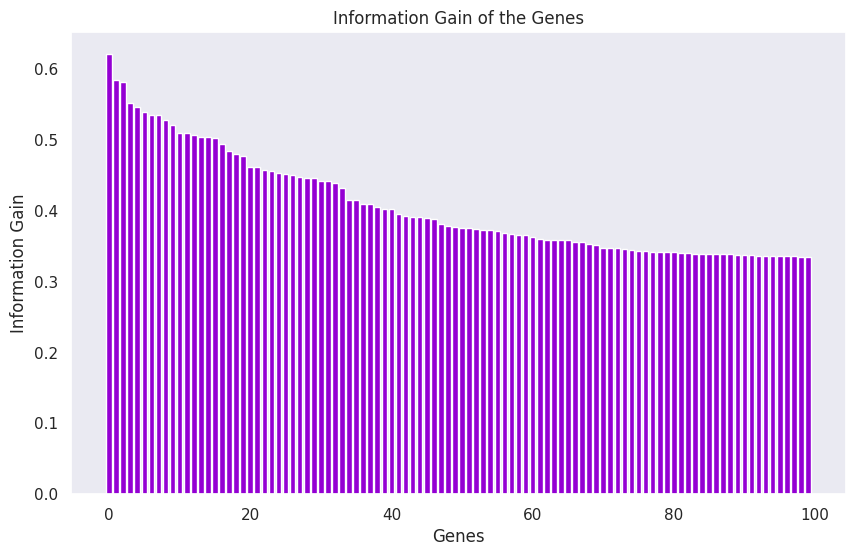

In [ ]:
plot_info(sorted_genes[:100])

We can clearly see that some genes carry more information than others with respect to the condition of the cells. We could even set a treshold value right away and select features by taking out from the dataset those genes which have a lower information gain than the treshold.

However, we will use this study on mutual information just as a background for the following unsupervised learning, which will have a more methodological approach, compared to the arbitrary setting of a treshold.

### EDA - HCC1806 SmartSeq Experiment

We move on to study the HCC1806 experiment. We will proceed in the same way as for the MCF7. In order not to make this report too lengthy and boring, we will try to keep it short with the commments, mostly underlying the differences with the previous dataset.

#### GENERAL OVERVIEW

In [ ]:
print("Dataframe dimensions:", np.shape(df_HCC1806_S))

Dataframe dimensions: (243, 8)


In [ ]:
print("First column: ", df_HCC1806_S.iloc[ : , 0])

First column:  Filename
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam     HCC1806
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam       HCC1806
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam      HCC1806
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam        HCC1806
                                                                         ...   
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam    HCC1806
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam      HCC1806
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam     HCC1806
output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam     HCC1806
Name: Cell Line, Length: 243, dtype: object


In [ ]:
df_HCC1806_S.head(5)

,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,HCC1806,1,A10,Normo,24,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,HCC1806,1,A12,Normo,24,S26,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,HCC1806,1,A1,Hypo,24,S97,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,HCC1806,1,A2,Hypo,24,S104,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,HCC1806,1,A3,Hypo,24,S4,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


In [ ]:
df_HCC1806_S_UnF.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23396 entries, "WASH7P" to "MAFIP"
Columns: 243 entries, "output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam" to "output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"
dtypes: int64(243)
memory usage: 43.6+ MB


In [ ]:
df_HCC1806_S_UnF.head(5)

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""CICP27""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""DDX11L17""",0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""WASH9P""",0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
"""OR4F29""",2,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_HCC1806_S_UnF.describe()

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
count,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,...,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000
mean,99.565695,207.678278,9.694734,150.689007,35.700504,47.088434,152.799453,135.869422,38.363908,45.512139,...,76.361771,105.566593,54.026116,29.763806,28.905411,104.740725,35.181569,108.197940,37.279962,76.303855
std,529.532443,981.107905,65.546050,976.936548,205.885369,545.367706,864.974182,870.729740,265.062493,366.704721,...,346.659348,536.881574,344.068304,186.721266,135.474736,444.773045,170.872090,589.082268,181.398951,369.090274
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,1.000000
75%,51.000000,125.000000,5.000000,40.000000,22.000000,17.000000,81.000000,76.000000,22.000000,18.000000,...,56.000000,67.000000,29.000000,18.000000,19.000000,76.000000,24.000000,68.000000,22.000000,44.000000
max,35477.000000,69068.000000,6351.000000,70206.000000,17326.000000,47442.000000,43081.000000,62813.000000,30240.000000,35450.000000,...,19629.000000,30987.000000,21894.000000,13457.000000,11488.000000,33462.000000,15403.000000,34478.000000,10921.000000,28532.000000


In [ ]:
assert [df_HCC1806_S_UnF.isnull() is False]
# no missing values

In [ ]:
df_HCC1806_S_UnF_T = df_HCC1806_S_UnF.T
df_HCC1806_S_UnF_T.head(5)

,"""WASH7P""","""CICP27""","""DDX11L17""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",0,0,0,0,2,250,54,1740,6,1,...,17,5,15,3852,900,22,4208,26,66,0
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,424,100,2340,5,1,...,49,29,36,7457,1439,43,6491,62,71,4
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,11,0,22,0,0,...,0,0,0,93,12,0,25,0,1,0
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,63,16,1020,3,0,...,43,17,8,1479,234,0,4819,11,3,7
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,27,3,303,0,0,...,0,0,3,303,33,0,310,4,9,0


In [ ]:
gene_symbols_HCC1806_S_UnF = df_HCC1806_S_UnF.index
print("Dataframe indexes: ", gene_symbols_HCC1806_S_UnF)

Dataframe indexes:  Index(['"WASH7P"', '"CICP27"', '"DDX11L17"', '"WASH9P"', '"OR4F29"',
       '"MTND1P23"', '"MTND2P28"', '"MTCO1P12"', '"MTCO2P12"', '"MTATP8P1"',
       ...
       '"MT-TH"', '"MT-TS2"', '"MT-TL2"', '"MT-ND5"', '"MT-ND6"', '"MT-TE"',
       '"MT-CYB"', '"MT-TT"', '"MT-TP"', '"MAFIP"'],
      dtype='object', length=23396)


In [ ]:
description_HCC1806_S_UnF = df_HCC1806_S_UnF.describe()
print("Global Max Value:", description_HCC1806_S_UnF.loc['max'].max())
print("Global Min Value:", description_HCC1806_S_UnF.loc['min'].min())

Global Max Value: 210944.0
Global Min Value: 0.0


#### INVESTIGATING CORRELATION

In [ ]:
Corr_HCC1806_S_Unf = df_HCC1806_S_UnF.corr()

In [ ]:
avgCorr_HCC1806_S_Unf = (Corr_HCC1806_S_Unf.values.max()-Corr_HCC1806_S_Unf.values.min()) /2 + Corr_HCC1806_S_Unf.values.min()

In [ ]:
plt.figure(figsize=(10,8))

sns.heatmap(Corr_HCC1806_S_Unf, cmap='plasma', center=0, yticklabels=False, xticklabels=False)  # plotting the matrix for the first 100 cells only for computational reasons

print("Number Plotted Cells:", np.shape(Corr_HCC1806_S_Unf))
print("Average Correlation:", avgCorr_HCC1806_S_Unf)
print("Minimum Overall Correlation:", Corr_HCC1806_S_Unf.values.min(), "\n")

Also here, there are cells with very low correlation.

In [ ]:
plt.figure(figsize=(10,8))

Sub_1_Corr_HCC1806_S_Unf = Corr_HCC1806_S_Unf.iloc[:15, :15]
sns.heatmap(Sub_1_Corr_HCC1806_S_Unf, cmap='plasma', center=0, xticklabels=False)

print("Number of Cells:", Sub_1_Corr_HCC1806_S_Unf.shape[0])
print("Maximum Correlation:", Sub_1_Corr_HCC1806_S_Unf.values.max())
print("Minimum Correlation:", Sub_1_Corr_HCC1806_S_Unf.values.min(), "\n")

In [ ]:
plt.figure(figsize=(10,8))

Sub_2_Corr_HCC1806_S_Unf = Corr_HCC1806_S_Unf.iloc[243-20:, 243-20:]
sns.heatmap(Sub_2_Corr_HCC1806_S_Unf, cmap='plasma', center=0, xticklabels=False)

print("Number of Cells:", Sub_2_Corr_HCC1806_S_Unf.shape[0])
print("Maximum Correlation:", Sub_2_Corr_HCC1806_S_Unf.values.max())
print("Minimum Correlation:", Sub_2_Corr_HCC1806_S_Unf.values.min(), "\n")

In [ ]:
# Weakly correlated cells instances
cell_1_weak_corr_HCC1806_S_Unf  = Sub_1_Corr_HCC1806_S_Unf.stack().idxmin()[0]
cell_2_weak_corr_HCC1806_S_Unf = Sub_2_Corr_HCC1806_S_Unf.stack().idxmin()[0]

# Strongly correlated cells instances
cell_1_strong_corr_HCC1806_S_Unf = Sub_1_Corr_HCC1806_S_Unf.stack().idxmax()[0]
cell_2_strong_corr_HCC1806_S_Unf = Sub_2_Corr_HCC1806_S_Unf.stack().idxmax()[0]

In [ ]:
print(count_nonzero_entries(df_HCC1806_S_UnF, cell_1_weak_corr_HCC1806_S_Unf))
print(count_nonzero_entries(df_HCC1806_S_UnF, cell_2_weak_corr_HCC1806_S_Unf))
print(count_nonzero_entries(df_HCC1806_S_UnF, cell_1_strong_corr_HCC1806_S_Unf))
print(count_nonzero_entries(df_HCC1806_S_UnF, cell_2_strong_corr_HCC1806_S_Unf))

1101681
1028798
2329439
604465


The idea that cells with a higher number of expressed genes have higher correlation **does not seem to hold** for the HCC1806. Still, we repeat the analysis performed before to have a clearer overview of the data.

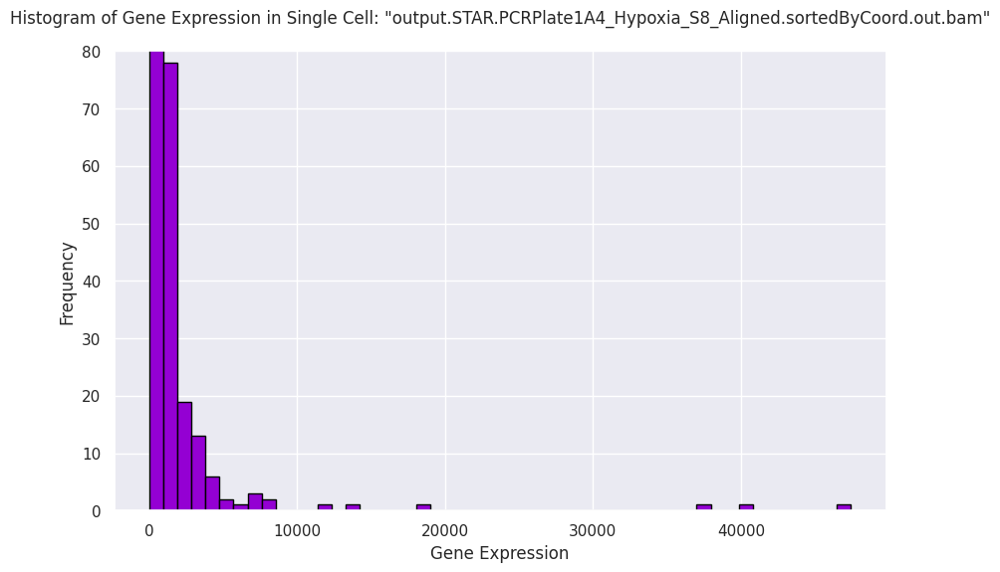

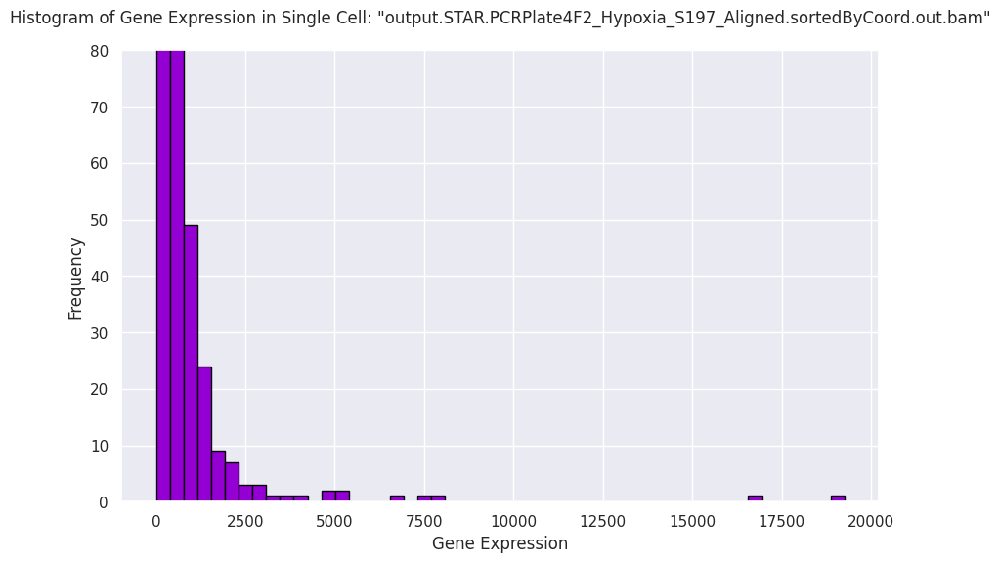

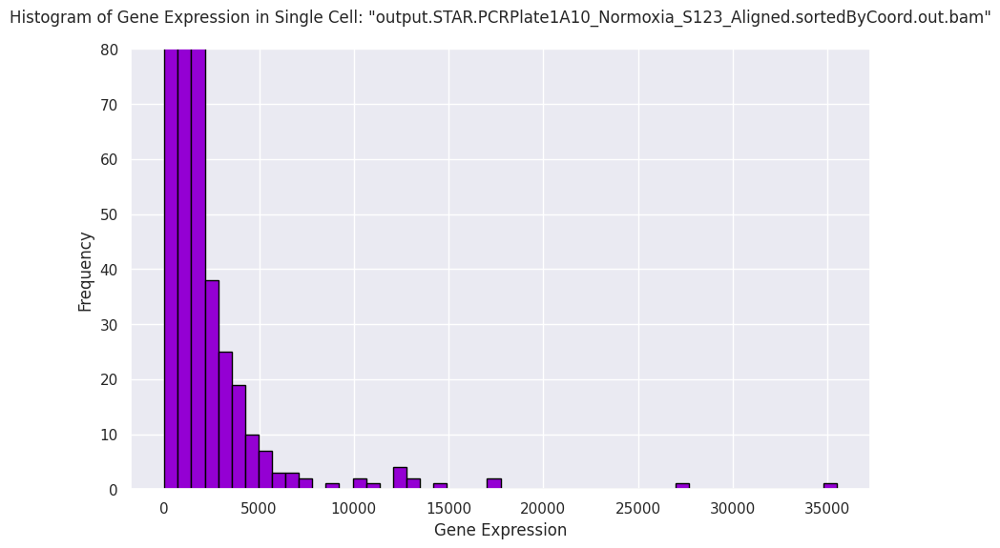

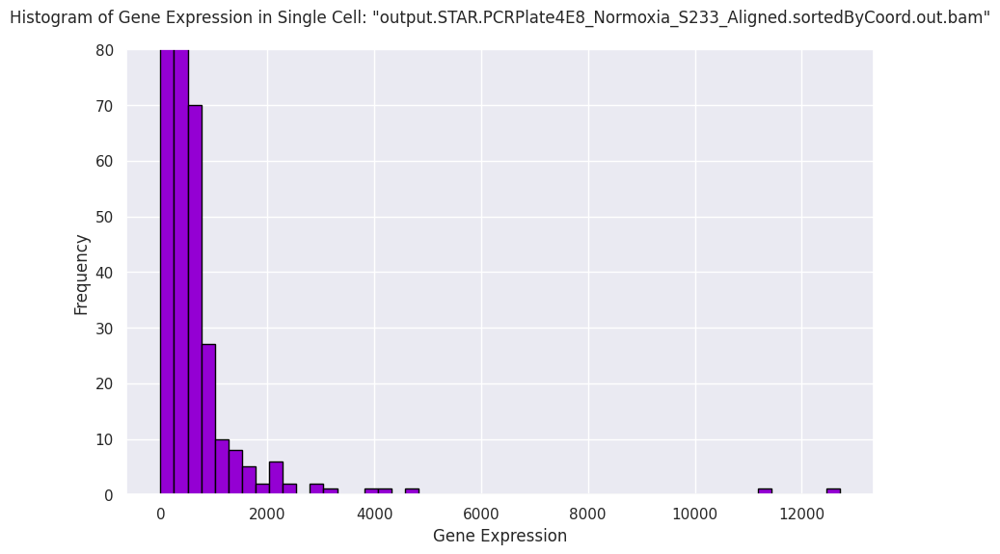

In [ ]:
hist_freq_genes(df_HCC1806_S_UnF, cell_1_weak_corr_HCC1806_S_Unf, 'darkviolet')
hist_freq_genes(df_HCC1806_S_UnF, cell_2_weak_corr_HCC1806_S_Unf, 'darkviolet')
hist_freq_genes(df_HCC1806_S_UnF, cell_1_strong_corr_HCC1806_S_Unf, 'darkviolet')
hist_freq_genes(df_HCC1806_S_UnF, cell_2_strong_corr_HCC1806_S_Unf, 'darkviolet')

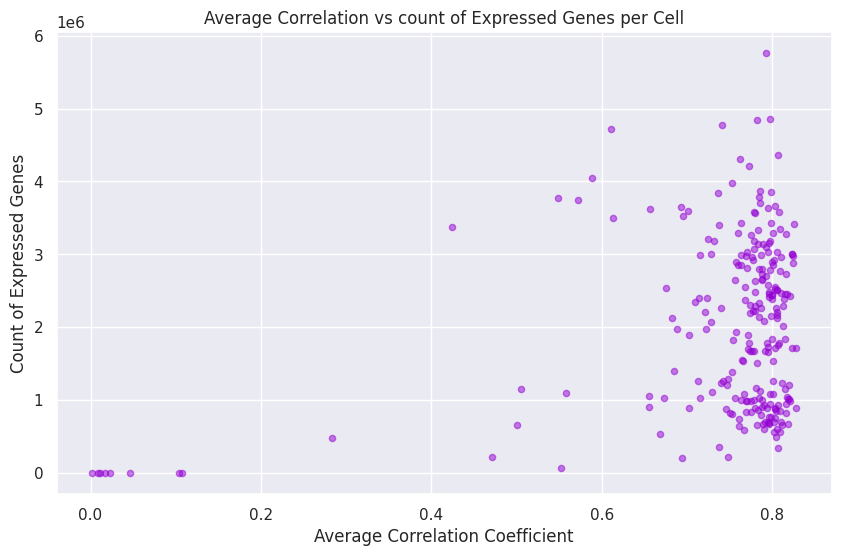

In [ ]:
scatter_corr_genes_count(df_HCC1806_S_UnF, Corr_HCC1806_S_Unf)

The plots show that cells with very low correation have little to zero genes expressed, but there is  no clear correlation between high coefficients and high number of genes expressed.

Let's see what happens for the extreme cases where the correlation is 0 or very close to 0.

In [ ]:
pairs_cells_with_zero_corr = []
for cell1 in Corr_HCC1806_S_Unf.columns:
    for cell2 in Corr_HCC1806_S_Unf.index:
        corr = Corr_HCC1806_S_Unf.loc[cell1, cell2]
        if np.isclose(corr, 0, rtol=1e-04, atol=1e-04):
            pairs_cells_with_zero_corr.append((cell1, cell2))
unique_pairs_cells_with_zero_corr = list(set(pairs_cells_with_zero_corr))
cells_with_zero_corr = list(set(cell1 for (cell1,_) in unique_pairs_cells_with_zero_corr))

In [ ]:
cells_with_zero_corr

['"output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate2F8_Normoxia_S51_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate2C8_Normoxia_S49_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate4A3_Hypoxia_S200_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate3D11_Normoxia_S92_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1G9_Normoxia_S121_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate3D10_Normoxia_S188_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate3D3_Hypoxia_S72_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate1D10_Normoxia_S125_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate3G11_Normoxia_S93_Aligned.sortedByCoord.out.bam"',
 '"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"']

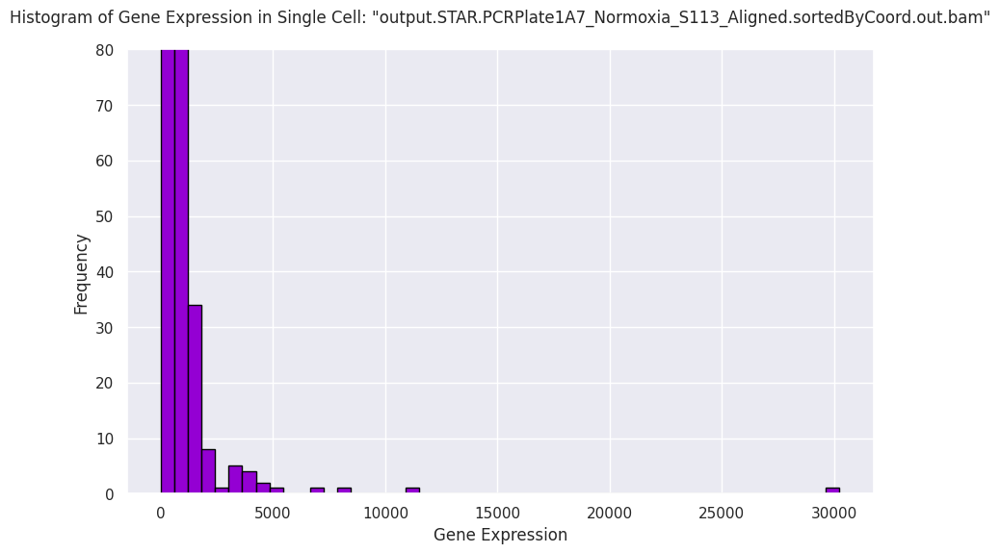

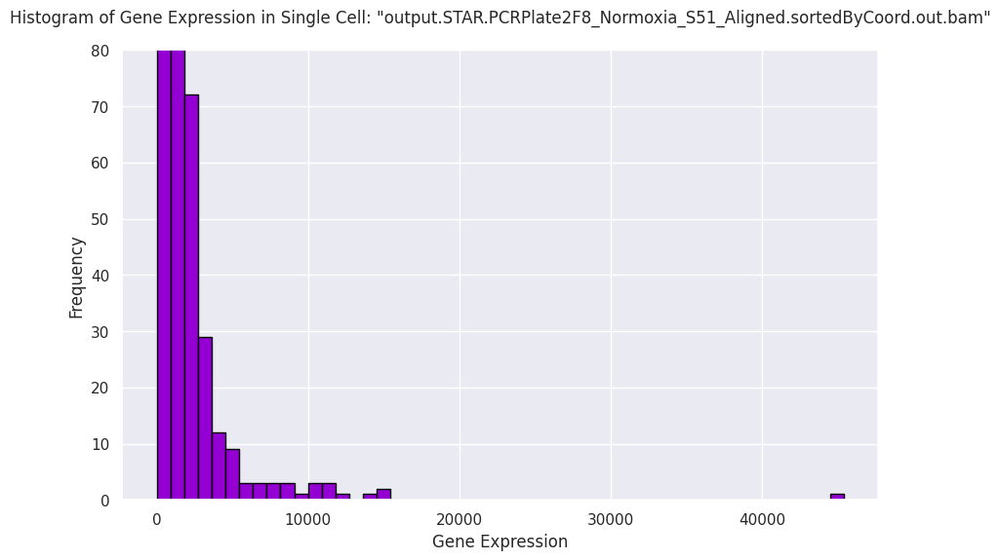

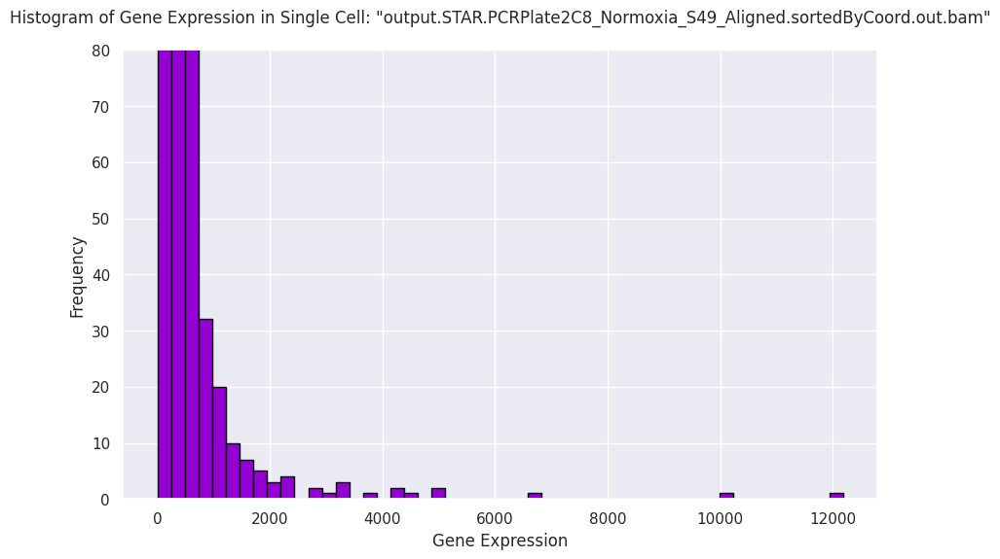

In [ ]:
hist_freq_genes(df_HCC1806_S_UnF, cells_with_zero_corr[0], 'darkviolet')
hist_freq_genes(df_HCC1806_S_UnF, cells_with_zero_corr[1], 'darkviolet')
hist_freq_genes(df_HCC1806_S_UnF, cells_with_zero_corr[2], 'darkviolet')

In general, in the HCC1806 experiment, *correlation among cells is not proportional to gene count*, unlike in MCF7. Still, in both datasets there are cells expressing very few genes (probably dying cells).

#### OUTLIERS

In [ ]:
Q1 = df_HCC1806_S_UnF.quantile(0.25)
Q3 = df_HCC1806_S_UnF.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"     51.0
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     125.0
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"         5.0
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"       40.0
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"         22.0
                                                                          ...  
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"     76.0
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"     24.0
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"       68.0
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"      22.0
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"      44.0
Length: 243, dtype: float64


In [ ]:
IQR.value_counts()

22.0     9
0.0      9
16.0     7
29.0     7
25.0     7
        ..
132.0    1
6.0      1
84.0     1
28.0     1
41.0     1
Name: count, Length: 102, dtype: int64

In [ ]:
df_HCC1806_S_UnF_noOut = df_HCC1806_S_UnF[~((df_HCC1806_S_UnF < (Q1 - 1.5 * IQR)) |(df_HCC1806_S_UnF > (Q3 + 1.5 * IQR))).any(axis=1)]

In [ ]:
df_HCC1806_S_UnF_noOut.T.shape

(243, 10815)

In [ ]:
df_HCC1806_S_UnF_noOut.T.head(5)

,"""WASH7P""","""CICP27""","""DDX11L17""","""WASH9P""","""OR4F29""","""MTATP8P1""","""OR4F16""","""CICP3""","""LINC01409""","""FAM87B""",...,"""FTCD""","""YBEY""","""C21orf58""","""DIP2A-IT1""","""DSTNP1""","""MT-TF""","""MT-TI""","""MT-TS1""","""MT-TD""","""MAFIP"""
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",0,0,0,0,2,1,0,0,0,0,...,0,0,13,1,0,3,3,0,3,0
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,1,0,0,3,0,...,0,14,0,0,0,13,3,0,0,4
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,20,0,0,52,1,2,0,0,7
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,14,0,0,0,1,0,1,0


In [ ]:
print("Difference of number of columns:", df_HCC1806_S_UnF.T.shape[1]-df_HCC1806_S_UnF_noOut.T.shape[1])

Difference of number of columns: 12581


In [ ]:
print("Percentage of removed columns:", (df_HCC1806_S_UnF.T.shape[1]-df_HCC1806_S_UnF_noOut.T.shape[1])/df_HCC1806_S_UnF.T.shape[1]*100, "%")

Percentage of removed columns: 53.774149427252524 %


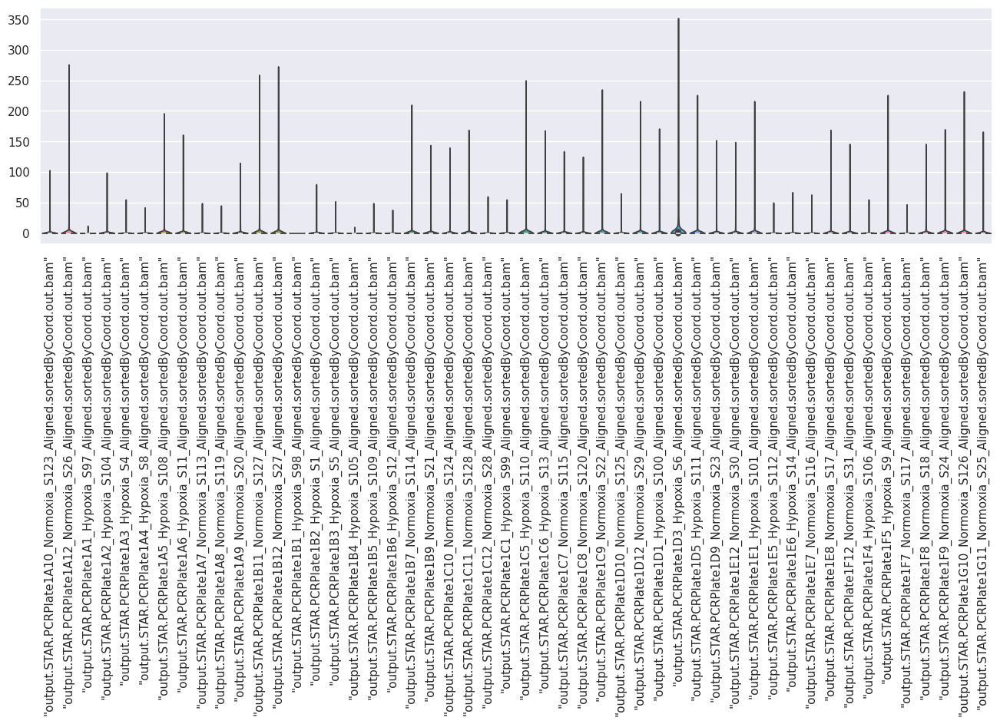

In [ ]:
plt.figure(figsize=(16, 4))
plot = sns.violinplot(data=df_HCC1806_S_UnF_noOut.iloc[:, :50], cut=0)
plot.set_xticks(range(0, 50))
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.show()

As for the MCF7 experiment, also in HCC1806 **removing outliers found by computing the interquartile range is not a good idea at all**.

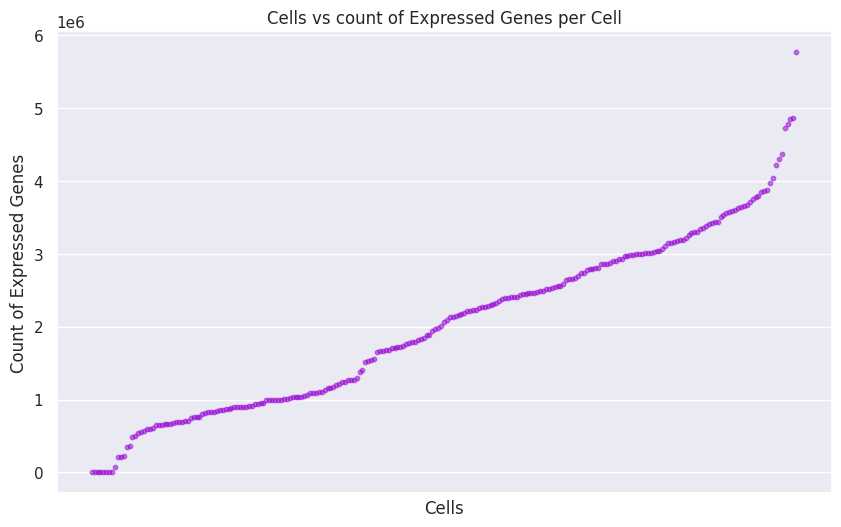

In [ ]:
scatter_count_genes(df_HCC1806_S_UnF)

#### SPARSITY

In [ ]:
print('Number of 0s in the matrix:', np.count_nonzero(df_HCC1806_S_UnF==0))

print('Sparsity index:', sparsity(df_HCC1806_S_UnF), '%')

Number of 0s in the matrix: 3174951
Sparsity index: 55.8456230779135 %


In [ ]:
print('Number of 0 values in the matrix:', np.count_nonzero(df_HCC1806_S_UnF_noOut==0))

print('Sparsity index:', sparsity(df_HCC1806_S_UnF_noOut), '%')

Number of 0 values in the matrix: 2279335
Sparsity index: 86.73120133026642 %


Clearly, data is sparse also here, and removing outliers increases sparsity even more.

In [ ]:
# plot_sparsity_matrix(df_HCC1806_S_UnF, sparsity(df_HCC1806_S_UnF))

Also in HCC1806 experiment, some cells seem to have little if no genes expressed (they are dying cells), while some genes are not synthetized in any cel.

#### DISTRIBUTION OF THE DATA

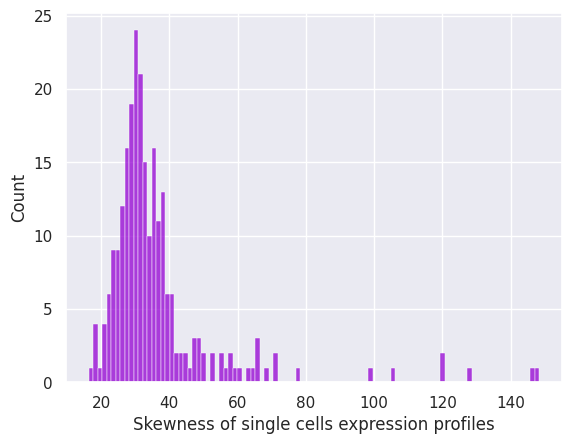

Mean of skewness values: 36.75112201656807


In [ ]:
plot_skewness(df_HCC1806_S_UnF)

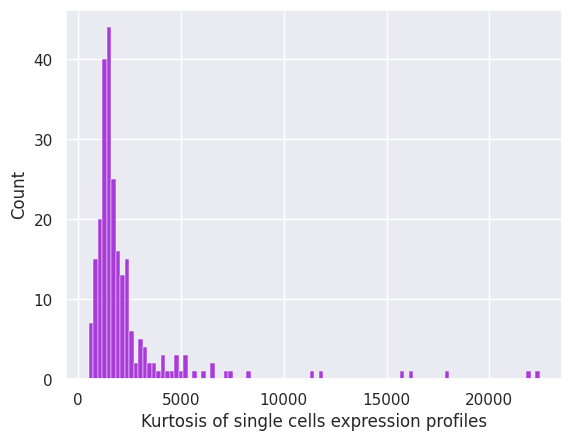

Mean of kurtosis values: 2396.1365186183593


In [ ]:
plot_kurtosis(df_HCC1806_S_UnF)

Even though skewness and kurtosis in HCC1806 are not as high as for MCF7, they still hint at a **non-Gaussian distribution**. Trying to smooth data and peaks could be extremely useful also in this case.

#### DATA TRANSFORMATION

In [ ]:
df_HCC1806_S_UnF_log2 = np.log2(df_HCC1806_S_UnF+1)
df_HCC1806_S_UnF_log2_T = df_HCC1806_S_UnF_log2.T
df_HCC1806_S_UnF_log2_T.head(5)

,"""WASH7P""","""CICP27""","""DDX11L17""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",0.0,0.0,0.0,0.0,1.584963,7.971544,5.781360,10.765700,2.807355,1.0,...,4.169925,2.584963,4.000000,11.911766,9.815383,4.523562,12.039262,4.754888,6.066089,0.000000
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",0.0,0.0,0.0,0.0,0.000000,8.731319,6.658211,11.192909,2.584963,1.0,...,5.643856,4.906891,5.209453,12.864573,10.491853,5.459432,12.664447,5.977280,6.169925,2.321928
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",0.0,0.0,0.0,0.0,0.000000,3.584963,0.000000,4.523562,0.000000,0.0,...,0.000000,0.000000,0.000000,6.554589,3.700440,0.000000,4.700440,0.000000,1.000000,0.000000
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",0.0,0.0,0.0,0.0,0.000000,6.000000,4.087463,9.995767,2.000000,0.0,...,5.459432,4.169925,3.169925,10.531381,7.876517,0.000000,12.234817,3.584963,2.000000,3.000000
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",0.0,0.0,0.0,0.0,0.000000,4.807355,2.000000,8.247928,0.000000,0.0,...,0.000000,0.000000,2.000000,8.247928,5.087463,0.000000,8.280771,2.321928,3.321928,0.000000


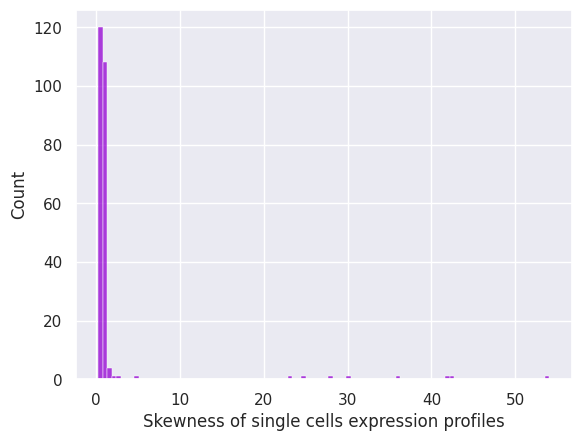

Mean of skewness values: 1.9446881179286346


In [ ]:
plot_skewness(df_HCC1806_S_UnF_log2)

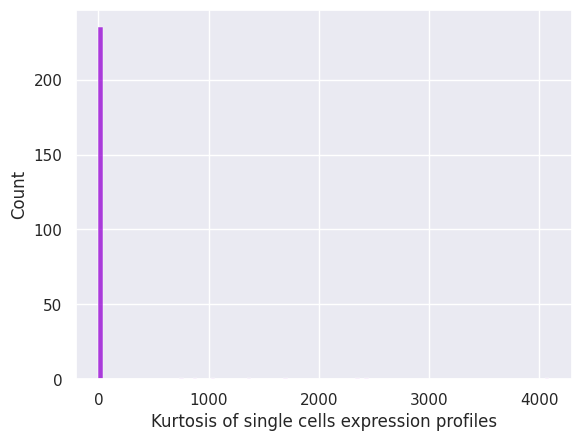

Mean of kurtosis values: 59.56389270416662


In [ ]:
plot_kurtosis(df_HCC1806_S_UnF_log2)

Applying a logarithmic transformation to the HCC1806 dataset appears to be higly beneficial, for it drastically lowers skweness and kurtosis.

#### CELL FILTERING (back to outliers...)

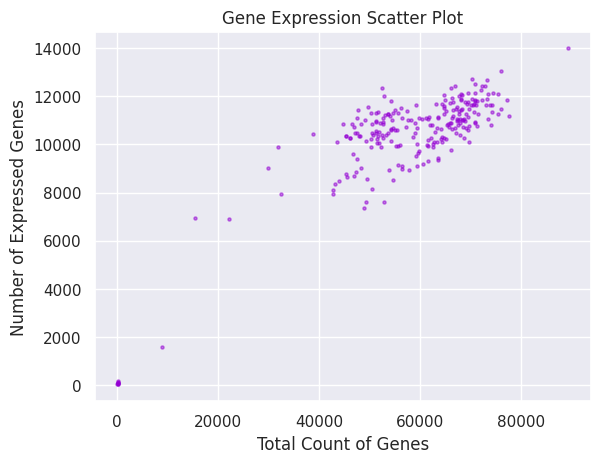

In [ ]:
tot_genes = df_HCC1806_S_UnF_log2_T.sum(axis=1)
expressed_genes = (df_HCC1806_S_UnF_log2_T!=0).sum(axis=1)

plt.scatter(tot_genes, expressed_genes, color='darkviolet', alpha=0.5, s=5)
plt.xlabel('Total Count of Genes')
plt.ylabel('Number of Expressed Genes')
plt.title('Gene Expression Scatter Plot')
plt.show()

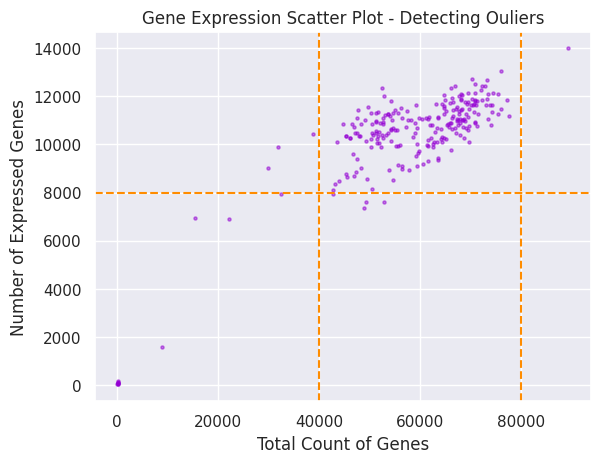

In [ ]:
plt.scatter(tot_genes, expressed_genes, color='darkviolet', alpha=0.5, s=5)
plt.xlabel('Total Count of Genes')
plt.ylabel('Number of Expressed Genes')
plt.title('Gene Expression Scatter Plot - Detecting Ouliers')
plt.axvline(x=40000, color='darkorange', linestyle='--')
plt.axvline(x=80000, color='darkorange', linestyle='--')
plt.axhline(y=8000, color='darkorange', linestyle='--')
plt.show()

From the plot, we see that in HCC1806 data **most cells cluster together**, leaving some outliers with extremely low or incredibly high gene count.

#### NORMALIZATION

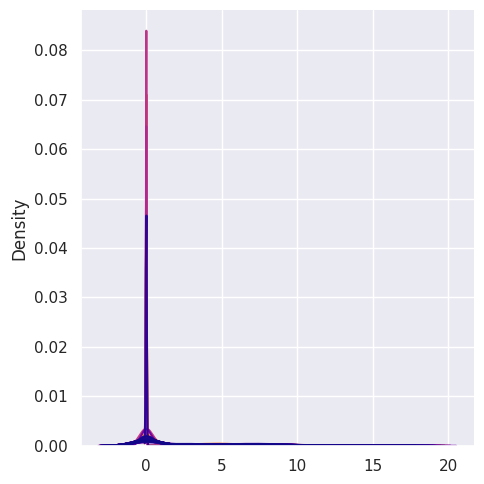

In [ ]:
sns.displot(data=df_HCC1806_S_UnF_log2, palette='plasma', kind="kde", bw_adjust=2, legend=False)

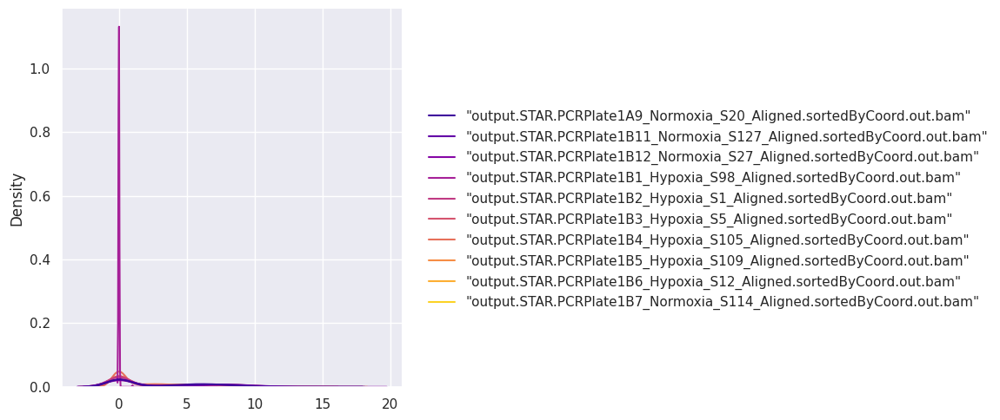

In [ ]:
sns.displot(data=df_HCC1806_S_UnF_log2.iloc[:,10:20], palette='plasma', kind="kde", bw_adjust=2)
plt.show()

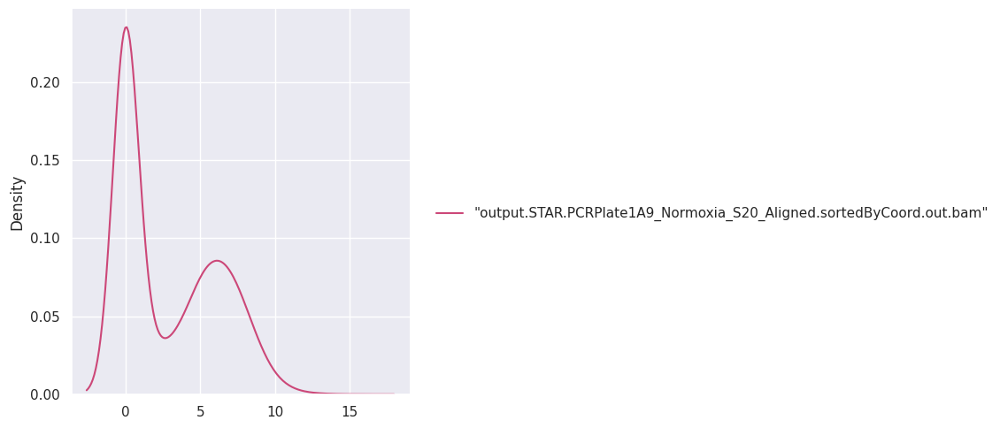

In [ ]:
sns.displot(df_HCC1806_S_UnF_log2.iloc[:,10:11], palette='plasma', kind="kde", bw_adjust=2,)
plt.show()

In [ ]:
scaler = StandardScaler()
df_HCC1806_S_UnF_log2_std = scaler.fit_transform(df_HCC1806_S_UnF_log2)
df_HCC1806_S_UnF_log2_std = pd.DataFrame(df_HCC1806_S_UnF_log2_std, columns=df_HCC1806_S_UnF.columns, index=df_HCC1806_S_UnF.index)
df_HCC1806_S_UnF_log2_std_T = pd.DataFrame(df_HCC1806_S_UnF_log2_std.T, columns=df_HCC1806_S_UnF.columns, index=df_HCC1806_S_UnF.index)

In [ ]:
df_HCC1806_S_UnF_log2_std_T

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""WASH7P""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""CICP27""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""DDX11L17""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""WASH9P""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""OR4F29""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"""MT-TE""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""MT-CYB""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""MT-TT""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""MT-TP""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


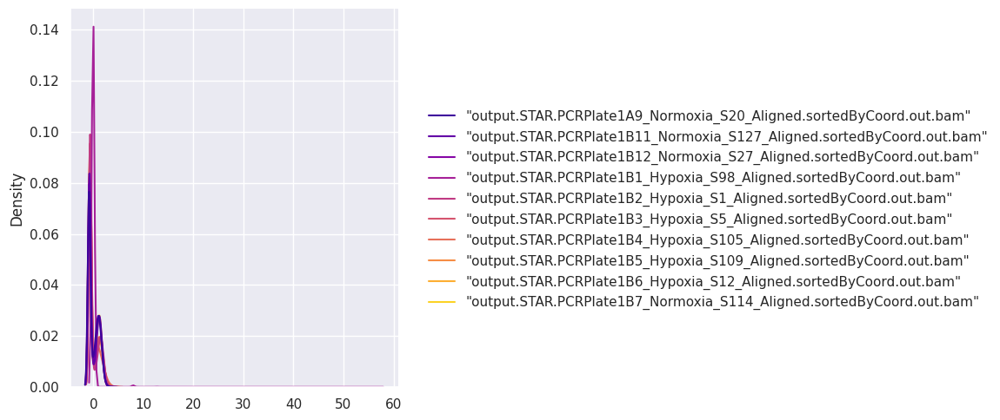

In [ ]:
sns.displot(data=df_HCC1806_S_UnF_log2_std.iloc[:,10:20], palette='plasma', kind="kde", bw_adjust=2)
plt.show()

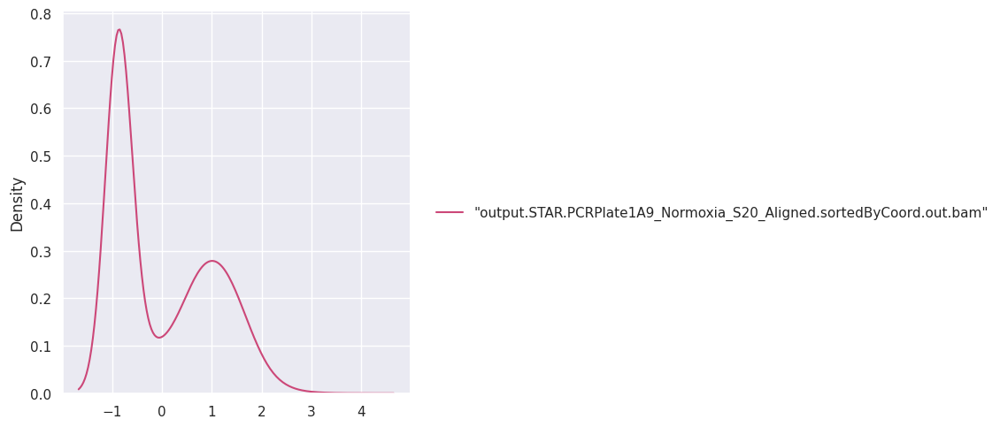

In [ ]:
sns.displot(df_HCC1806_S_UnF_log2_std.iloc[:,10:11], palette='plasma', kind="kde", bw_adjust=2)
plt.show()

In [ ]:
print(np.mean(skew(df_HCC1806_S_UnF_log2_std)))

1.9446881179286344


In [ ]:
print(np.mean(kurtosis(df_HCC1806_S_UnF_log2_std)))

59.56389270416662


#### MUTUAL INFORMATION (background to feature selection)

In [ ]:
condition_column = df_HCC1806_S['Condition']

mutual_info = mutual_info_classif(df_HCC1806_S_UnF_log2_std.T, condition_column)

In [ ]:
gene_info_dict = {gene_index: info_score for gene_index, info_score in enumerate(mutual_info)}

sorted_genes = sorted(gene_info_dict, key=gene_info_dict.get, reverse=True)


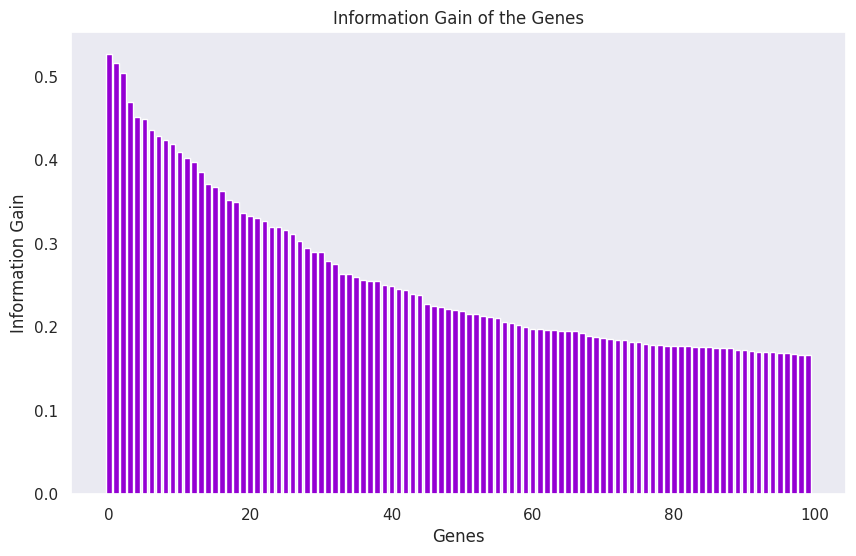

In [ ]:
plot_info(sorted_genes[:100])

### EDA - MCF7 DropSeq Experiment

Now we start exploring the datasets obtained with by droplet-based single-cell RNA-sequencing or Drop-Seq for short.

For the DropSeq experiments (contrary to the SmartSeq experiments) we were given already filtered and normalised data, and no meta data. So in the following we look at what we have and try to understand how the data was brought into this format. In any case, this data is ready to train a classifier.

#### GENERAL OVERVIEW

In [ ]:
print("Dataframe dimensions:", np.shape(df_MCF7_D_F_N))

Dataframe dimensions: (3000, 21626)


In [ ]:
df_MCF7_D_F_N.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3000 entries, "MALAT1" to "SUDS3"
Columns: 21626 entries, "AAAAACCTATCG_Normoxia" to "TTTTTTGTATGT_Hypoxia"
dtypes: int64(21626)
memory usage: 495.1+ MB


We notice that this dataset is much larger compared to the MCF7 SmartSeq dataset. This is due to the nature of the RNA sequencing methods. SmartSeq typically requires more labor-intensive sample preparation compared to droplet-based methods like DropSeq, and it may be less scalable for analysing large numbers of cells. So generally there's more data obtained with the DropSeq method.

In [ ]:
print("First column: ", df_MCF7_D_F_N.iloc[ : , 0])

First column:  "MALAT1"       1
"MT-RNR2"      0
"NEAT1"        0
"H1-5"         0
"TFF1"         4
              ..
"BRWD1-AS2"    0
"RPS19BP1"     0
"AUNIP"        0
"TNK2"         0
"SUDS3"        0
Name: "AAAAACCTATCG_Normoxia", Length: 3000, dtype: int64


In [ ]:
df_MCF7_D_F_N.head(10)

,"""AAAAACCTATCG_Normoxia""","""AAAACAACCCTA_Normoxia""","""AAAACACTCTCA_Normoxia""","""AAAACCAGGCAC_Normoxia""","""AAAACCTAGCTC_Normoxia""","""AAAACCTCCGGG_Normoxia""","""AAAACTCGTTGC_Normoxia""","""AAAAGAGCTCTC_Normoxia""","""AAAAGCTAGGCG_Normoxia""","""AAAATCGCATTT_Normoxia""",...,"""TTTTACAGGATC_Hypoxia""","""TTTTACCACGTA_Hypoxia""","""TTTTATGCTACG_Hypoxia""","""TTTTCCAGACGC_Hypoxia""","""TTTTCGCGCTCG_Hypoxia""","""TTTTCGCGTAGA_Hypoxia""","""TTTTCGTCCGCT_Hypoxia""","""TTTTCTCCGGCT_Hypoxia""","""TTTTGTTCAAAG_Hypoxia""","""TTTTTTGTATGT_Hypoxia"""
"""MALAT1""",1,3,3,6,4,5,1,13,3,3,...,0,2,1,0,1,0,1,0,0,4
"""MT-RNR2""",0,0,0,2,0,0,2,1,7,0,...,0,0,0,0,0,0,0,0,0,0
"""NEAT1""",0,0,0,0,0,2,0,1,2,0,...,0,0,0,0,0,0,0,0,0,0
"""H1-5""",0,0,0,0,0,2,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0
"""TFF1""",4,1,1,1,0,0,0,2,0,1,...,2,3,8,0,0,3,4,2,6,0
"""MT-RNR1""",0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
"""H4C3""",0,1,0,1,0,0,0,3,4,0,...,1,4,10,0,6,7,1,4,0,6
"""GDF15""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""KRT81""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
"""MT-CO3""",0,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


This dataset has the cells displayed as columns and the genes appearing as rows. So for each gene we have a value which indicates the amount of that gene expressed in the cell corresponding to the column. For each cell we can see whether it was cultivated in a normoxic or a hypoxic environment.

For some applications we'll need the transpose, so we compute it now.

In [ ]:
df_MCF7_D_F_N_T = df_MCF7_D_F_N.T
df_MCF7_D_F_N_T.head(10)

,"""MALAT1""","""MT-RNR2""","""NEAT1""","""H1-5""","""TFF1""","""MT-RNR1""","""H4C3""","""GDF15""","""KRT81""","""MT-CO3""",...,"""MROH1""","""SKIDA1""","""MICALL1""","""RARG""","""MYO1F""","""BRWD1-AS2""","""RPS19BP1""","""AUNIP""","""TNK2""","""SUDS3"""
"""AAAAACCTATCG_Normoxia""",1,0,0,0,4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAAACAACCCTA_Normoxia""",3,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAAACACTCTCA_Normoxia""",3,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAAACCAGGCAC_Normoxia""",6,2,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAAACCTAGCTC_Normoxia""",4,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
"""AAAACCTCCGGG_Normoxia""",5,0,2,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAAACTCGTTGC_Normoxia""",1,2,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
"""AAAAGAGCTCTC_Normoxia""",13,1,1,0,2,1,3,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAAAGCTAGGCG_Normoxia""",3,7,2,0,0,0,4,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAAATCGCATTT_Normoxia""",3,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
gene_symbols_df_MCF7_D_F_N = df_MCF7_D_F_N.index
print("Genes: ", gene_symbols_df_MCF7_D_F_N)

cells_df_MCF7_D_F_N = df_MCF7_D_F_N_T.index
print("Cells:", cells_df_MCF7_D_F_N)

Genes:  Index(['"MALAT1"', '"MT-RNR2"', '"NEAT1"', '"H1-5"', '"TFF1"', '"MT-RNR1"',
       '"H4C3"', '"GDF15"', '"KRT81"', '"MT-CO3"',
       ...
       '"MROH1"', '"SKIDA1"', '"MICALL1"', '"RARG"', '"MYO1F"', '"BRWD1-AS2"',
       '"RPS19BP1"', '"AUNIP"', '"TNK2"', '"SUDS3"'],
      dtype='object', length=3000)
Cells: Index(['"AAAAACCTATCG_Normoxia"', '"AAAACAACCCTA_Normoxia"',
       '"AAAACACTCTCA_Normoxia"', '"AAAACCAGGCAC_Normoxia"',
       '"AAAACCTAGCTC_Normoxia"', '"AAAACCTCCGGG_Normoxia"',
       '"AAAACTCGTTGC_Normoxia"', '"AAAAGAGCTCTC_Normoxia"',
       '"AAAAGCTAGGCG_Normoxia"', '"AAAATCGCATTT_Normoxia"',
       ...
       '"TTTTACAGGATC_Hypoxia"', '"TTTTACCACGTA_Hypoxia"',
       '"TTTTATGCTACG_Hypoxia"', '"TTTTCCAGACGC_Hypoxia"',
       '"TTTTCGCGCTCG_Hypoxia"', '"TTTTCGCGTAGA_Hypoxia"',
       '"TTTTCGTCCGCT_Hypoxia"', '"TTTTCTCCGGCT_Hypoxia"',
       '"TTTTGTTCAAAG_Hypoxia"', '"TTTTTTGTATGT_Hypoxia"'],
      dtype='object', length=21626)


In [ ]:
description_df_MCF7_D_F_N = df_MCF7_D_F_N.describe()
description_df_MCF7_D_F_N

,"""AAAAACCTATCG_Normoxia""","""AAAACAACCCTA_Normoxia""","""AAAACACTCTCA_Normoxia""","""AAAACCAGGCAC_Normoxia""","""AAAACCTAGCTC_Normoxia""","""AAAACCTCCGGG_Normoxia""","""AAAACTCGTTGC_Normoxia""","""AAAAGAGCTCTC_Normoxia""","""AAAAGCTAGGCG_Normoxia""","""AAAATCGCATTT_Normoxia""",...,"""TTTTACAGGATC_Hypoxia""","""TTTTACCACGTA_Hypoxia""","""TTTTATGCTACG_Hypoxia""","""TTTTCCAGACGC_Hypoxia""","""TTTTCGCGCTCG_Hypoxia""","""TTTTCGCGTAGA_Hypoxia""","""TTTTCGTCCGCT_Hypoxia""","""TTTTCTCCGGCT_Hypoxia""","""TTTTGTTCAAAG_Hypoxia""","""TTTTTTGTATGT_Hypoxia"""
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,...,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,0.034000,0.030333,0.027000,0.032333,0.045333,0.047333,0.030000,0.027333,0.032000,0.027333,...,0.052333,0.043667,0.033667,0.033000,0.025333,0.037000,0.046333,0.055667,0.038000,0.033000
std,0.277254,0.220823,0.195662,0.233751,0.246235,0.299649,0.204403,0.292030,0.281074,0.237918,...,0.364654,0.244499,0.340449,0.302117,0.208261,0.286924,0.301469,0.358623,0.240642,0.244808
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,4.000000,4.000000,5.000000,6.000000,4.000000,8.000000,6.000000,13.000000,7.000000,6.000000,...,7.000000,4.000000,10.000000,8.000000,6.000000,7.000000,7.000000,9.000000,6.000000,6.000000


In [ ]:
print("Global Max Value:", description_df_MCF7_D_F_N.loc['max'].max())
print("Global Min Value:", description_df_MCF7_D_F_N.loc['min'].min())

Global Max Value: 175.0
Global Min Value: 0.0


#### CORRELATION

We want to analyse the correlation to gain insights on the interaction and similarities between the cells.

In [ ]:
sparse_df_MCF7_D_F_N = csr_matrix(df_MCF7_D_F_N.values)
dense_df_MCF7_D_F_N = sparse_df_MCF7_D_F_N.toarray()
correlation_df_MCF7_D_F_N = np.corrcoef(dense_df_MCF7_D_F_N.T)

In [ ]:
avgCorr_MCF7_D_F_N_T = (correlation_df_MCF7_D_F_N.max() - correlation_df_MCF7_D_F_N.min()) / 2 + correlation_df_MCF7_D_F_N.min()
avgCorr_MCF7_D_F_N_T

0.486811337312416

Due to the huge dimension of this dataset we aggregate the data, but this doesn't distort information, as we're not looking into the correlation in the tiniest details, just trying to get a general idea.

In [ ]:
# defining groups of variables for aggregation
groups_df_MCF7_D_F_N = [df_MCF7_D_F_N.columns[i:i+10] for i in range(0, len(df_MCF7_D_F_N.columns), 10)]

# aggregating data by calculating the mean for each group of variables
aggr_df_MCF7_D_F_N = pd.concat([df_MCF7_D_F_N[group].mean(axis=1) for group in groups_df_MCF7_D_F_N], axis=1)

# computing correlation matrix for the aggregated data
corr_aggr_df_MCF7_D_F_N = np.corrcoef(aggr_df_MCF7_D_F_N.T)

# some info
print("Number Cells:", np.shape(corr_aggr_df_MCF7_D_F_N))
print("Average Correlation:", avgCorr_MCF7_D_F_N_T)
print("Minimum Correlation:", corr_aggr_df_MCF7_D_F_N.min())
print("Maximum Correlation:", corr_aggr_df_MCF7_D_F_N.max())

# visualisation
plt.figure(figsize=(10, 8))
sns.heatmap(corr_aggr_df_MCF7_D_F_N, cmap='plasma', center=0, yticklabels=False, xticklabels=False)
plt.show()

To give a bit more analytical context and get more precise information on the correlations, we count the instances with high and with low correlation.

In [ ]:
high_threshold = 0.9
low_threshold = 0.1

highly_correlated_pairs = np.where(np.abs(correlation_df_MCF7_D_F_N) > high_threshold)
low_correlated_pairs = np.where(np.abs(correlation_df_MCF7_D_F_N) < low_threshold)

num_high_correlation = 0
num_low_correlation = 0

for i, j in zip(*highly_correlated_pairs):
    if i != j:
        correlation_coefficient = correlation_df_MCF7_D_F_N[i, j]
        if correlation_coefficient > high_threshold:
            num_high_correlation += 1

for i, j in zip(*low_correlated_pairs):
    if i != j:
        correlation_coefficient = correlation_df_MCF7_D_F_N[i, j]
        if correlation_coefficient < low_threshold:
            num_low_correlation += 1

print(f"Number of pairs with correlation coefficient above {high_threshold}: {num_high_correlation}")
print(f"Number of pairs with correlation coefficient below {low_threshold}: {num_low_correlation}")

# Number of pairs with correlation coefficient above 0.9: 79536
# Number of pairs with correlation coefficient below 0.1: 30429274

Turns out, the aggregation of the data did distort information, since it practically eliminated all instances with low correlation. The correlation matrix still remains a great tool for visualisation purposes, but it's always necessary to approach things in different ways.

We will now zoom in to a part with visibly (from the plot above) generally higher correlations (upper-left corner) to take a closer look, and then repeat the same process for an area with visibly generally lower correlations (upper-right corner).

In [ ]:
sub_1_corr_df_MCF7_D_F_N = corr_aggr_df_MCF7_D_F_N[:100, :100]

sub_1_avg_corr = (np.max(sub_1_corr_df_MCF7_D_F_N) - np.min(sub_1_corr_df_MCF7_D_F_N)) / 2 + np.min(sub_1_corr_df_MCF7_D_F_N)
sub_1_num_cells = sub_1_corr_df_MCF7_D_F_N.size
sub_1_min_corr = np.min(sub_1_corr_df_MCF7_D_F_N)
sub_1_max_corr = np.max(sub_1_corr_df_MCF7_D_F_N)

print("Number of Cells:", sub_1_num_cells)
print("Average Correlation:", sub_1_avg_corr)
print("Minimum Correlation:", sub_1_min_corr)
print("Maximum Correlation:", sub_1_max_corr)

plt.figure(figsize=(10, 8))
sns.heatmap(sub_1_corr_df_MCF7_D_F_N, cmap='plasma', center=0, xticklabels=False)
plt.show()

In [ ]:
sub_2_corr_df_MCF7_D_F_N = corr_aggr_df_MCF7_D_F_N[:100, 2163-100:]

sub_2_avg_corr = (np.max(sub_2_corr_df_MCF7_D_F_N) - np.min(sub_2_corr_df_MCF7_D_F_N)) / 2 + np.min(sub_2_corr_df_MCF7_D_F_N)
sub_2_num_cells = sub_2_corr_df_MCF7_D_F_N.size
sub_2_min_corr = np.min(sub_2_corr_df_MCF7_D_F_N)
sub_2_max_corr = np.max(sub_2_corr_df_MCF7_D_F_N)

print("Number of Cells:", sub_2_num_cells)
print("Average Correlation:", sub_2_avg_corr)
print("Minimum Correlation:", sub_2_min_corr)
print("Maximum Correlation:", sub_2_max_corr)

plt.figure(figsize=(10, 8))
sns.heatmap(sub_2_corr_df_MCF7_D_F_N, cmap='plasma', center=0, xticklabels=False)
plt.show()

In [ ]:
# weakly correlated cells instances
cell_1_weak_corr_MCF7_D_F_N = np.unravel_index(np.argmin(sub_1_corr_df_MCF7_D_F_N), sub_1_corr_df_MCF7_D_F_N.shape)[0]
cell_2_weak_corr_MCF7_D_F_N = np.unravel_index(np.argmin(sub_2_corr_df_MCF7_D_F_N), sub_2_corr_df_MCF7_D_F_N.shape)[0]

# strongly correlated cells instances
cell_1_strong_corr_MCF7_D_F_N = np.unravel_index(np.argmax(sub_1_corr_df_MCF7_D_F_N), sub_1_corr_df_MCF7_D_F_N.shape)[0]
cell_2_strong_corr_MCF7_D_F_N = np.unravel_index(np.argmax(sub_2_corr_df_MCF7_D_F_N), sub_2_corr_df_MCF7_D_F_N.shape)[0]

In [ ]:
def num_nonzero_entries_np(dataset, cell):
    num_columns = dataset.shape[1]
    count = 0
    for i in range(num_columns):
        if dataset.iloc[cell, i] > 0:
            count += 1
    return count

In [ ]:
def count_nonzero_entries_np(dataset, cell):
    return sum(dataset.iloc[cell] > 0)

In [ ]:
print(count_nonzero_entries_np(df_MCF7_D_F_N, cell_1_weak_corr_MCF7_D_F_N))
print(count_nonzero_entries_np(df_MCF7_D_F_N, cell_2_weak_corr_MCF7_D_F_N))
print(count_nonzero_entries_np(df_MCF7_D_F_N, cell_1_strong_corr_MCF7_D_F_N))
print(count_nonzero_entries_np(df_MCF7_D_F_N, cell_2_strong_corr_MCF7_D_F_N))

24
24
7622
256


Before drawing any conclusions we look at a scatter plot of the average correlation coefficient vs the count of expressed genes per cell.

In [ ]:
def corr_average(corr_data, cell):
    """
    Calculate the average correlation for a given cell index.

    Parameters:
        corr_data (numpy.ndarray): The correlation matrix.
        cell (int): The index of the cell for which to calculate the average correlation.

    Returns:
        float: The average correlation for the given cell.
    """
    # extracting correlations for the specified cell
    corr_values = np.delete(corr_data[cell], cell)  # Remove self-correlation

    # calculating average correlation
    average = corr_values.sum() / len(corr_values)

    return average

In [ ]:
def scatter_corr_genes_count(dataset, corr_dataset):
    """
    Scatter plot of the average correlation coefficient vs the count of expressed genes per cell.

    Parameters:
        dataset (pandas.DataFrame): The dataset containing counts of expressed genes per cell.
        corr_dataset (numpy.ndarray): The correlation matrix dataset.
    """
    count_genes = []
    average = []

    # calculating count of expressed genes and average correlation for each cell
    for cell in range(dataset.shape[0]):
        count_genes.append(dataset.iloc[cell].astype(bool).sum())  # Count non-zero entries
        average.append(corr_average(corr_dataset, cell))

    # visualisation
    plt.figure(figsize=(10, 6))
    plt.scatter(average, count_genes, s=20, alpha=0.5, c='darkviolet')
    plt.xlabel('Average Correlation Coefficient')
    plt.ylabel('Count of Expressed Genes')
    plt.title('Average Correlation vs Count of Expressed Genes per Cell')
    plt.grid(True)
    plt.show()

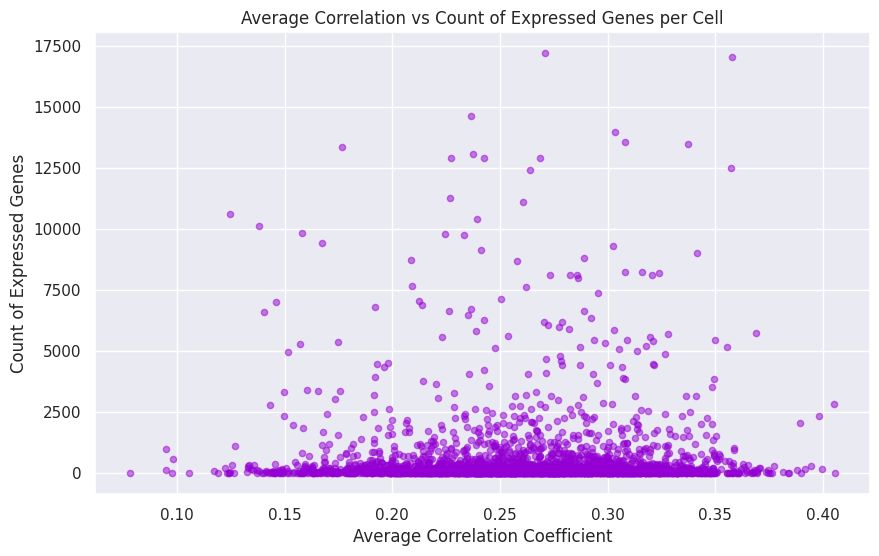

In [ ]:
scatter_corr_genes_count(df_MCF7_D_F_N, correlation_df_MCF7_D_F_N)

We see that while the count of expressed genes tends to be low (this is due to the design of the DropSeq method), it's mostly independent from the average correlation coefficient.

#### OUTLIERS

First approach is to look at the interquantile range.

In [4]:
Q1_df_MCF7_D_F_N = df_MCF7_D_F_N.quantile(0.25)
Q3_df_MCF7_D_F_N = df_MCF7_D_F_N.quantile(0.75)
IQR_df_MCF7_D_F_N = Q3_df_MCF7_D_F_N - Q1_df_MCF7_D_F_N
print(IQR_df_MCF7_D_F_N)

"AAAAACCTATCG_Normoxia"    0.0
"AAAACAACCCTA_Normoxia"    0.0
"AAAACACTCTCA_Normoxia"    0.0
"AAAACCAGGCAC_Normoxia"    0.0
"AAAACCTAGCTC_Normoxia"    0.0
                          ... 
"TTTTCGCGTAGA_Hypoxia"     0.0
"TTTTCGTCCGCT_Hypoxia"     0.0
"TTTTCTCCGGCT_Hypoxia"     0.0
"TTTTGTTCAAAG_Hypoxia"     0.0
"TTTTTTGTATGT_Hypoxia"     0.0
Length: 21626, dtype: float64


In [5]:
IQR_df_MCF7_D_F_N.value_counts()

0.0    21626
Name: count, dtype: int64

In [6]:
df_MCF7_D_F_N_noOut = df_MCF7_D_F_N[~((df_MCF7_D_F_N < (Q1_df_MCF7_D_F_N - 1.5 * IQR_df_MCF7_D_F_N)) |(df_MCF7_D_F_N > (Q3_df_MCF7_D_F_N + 1.5 * IQR_df_MCF7_D_F_N))).any(axis=1)]
df_MCF7_D_F_N_noOut.shape

(0, 21626)

In [7]:
print("Difference of number of columns:", df_MCF7_D_F_N.T.shape[1]-df_MCF7_D_F_N_noOut.T.shape[1])

Difference of number of columns: 3000


In [8]:
print("Percentage of removed columns:", (df_MCF7_D_F_N.T.shape[1]-df_MCF7_D_F_N_noOut.T.shape[1])/df_MCF7_D_F_N.T.shape[1]*100, "%")

Percentage of removed columns: 100.0 %


In [9]:
df_MCF7_D_F_N_noOut.head(10)

,"""AAAAACCTATCG_Normoxia""","""AAAACAACCCTA_Normoxia""","""AAAACACTCTCA_Normoxia""","""AAAACCAGGCAC_Normoxia""","""AAAACCTAGCTC_Normoxia""","""AAAACCTCCGGG_Normoxia""","""AAAACTCGTTGC_Normoxia""","""AAAAGAGCTCTC_Normoxia""","""AAAAGCTAGGCG_Normoxia""","""AAAATCGCATTT_Normoxia""",...,"""TTTTACAGGATC_Hypoxia""","""TTTTACCACGTA_Hypoxia""","""TTTTATGCTACG_Hypoxia""","""TTTTCCAGACGC_Hypoxia""","""TTTTCGCGCTCG_Hypoxia""","""TTTTCGCGTAGA_Hypoxia""","""TTTTCGTCCGCT_Hypoxia""","""TTTTCTCCGGCT_Hypoxia""","""TTTTGTTCAAAG_Hypoxia""","""TTTTTTGTATGT_Hypoxia"""


We see that no genes would be expressed this way. The outliers carry the information in this case. 

In [11]:
value_counts_dict = {}

for column in df_MCF7_D_F_N.columns:
    value_counts_dict[column] = df_MCF7_D_F_N[column].value_counts().to_dict()

print(value_counts_dict)

{'"AAAAACCTATCG_Normoxia"': {0: 2952, 2: 39, 1: 3, 4: 3, 3: 3}, '"AAAACAACCCTA_Normoxia"': {0: 2928, 1: 61, 2: 5, 3: 4, 4: 2}, '"AAAACACTCTCA_Normoxia"': {0: 2930, 1: 63, 2: 5, 3: 1, 5: 1}, '"AAAACCAGGCAC_Normoxia"': {0: 2922, 1: 68, 2: 5, 3: 3, 6: 1, 4: 1}, '"AAAACCTAGCTC_Normoxia"': {0: 2885, 1: 98, 2: 14, 3: 2, 4: 1}, '"AAAACCTCCGGG_Normoxia"': {0: 2891, 1: 89, 2: 16, 5: 2, 3: 1, 8: 1}, '"AAAACTCGTTGC_Normoxia"': {0: 2919, 1: 76, 2: 4, 6: 1}, '"AAAAGAGCTCTC_Normoxia"': {0: 2938, 1: 55, 2: 4, 3: 2, 13: 1}, '"AAAAGCTAGGCG_Normoxia"': {0: 2956, 2: 39, 3: 2, 7: 1, 4: 1, 1: 1}, '"AAAATCGCATTT_Normoxia"': {0: 2944, 1: 41, 2: 9, 3: 3, 4: 2, 6: 1}, '"AAAATCTACATA_Normoxia"': {0: 2940, 1: 50, 2: 5, 3: 3, 7: 1, 4: 1}, '"AAAATGGCTCTC_Normoxia"': {0: 2924, 1: 63, 2: 9, 3: 3, 5: 1}, '"AAAATGGGCCGG_Normoxia"': {0: 2874, 1: 116, 2: 6, 3: 2, 6: 1, 4: 1}, '"AAACAAACTCAA_Normoxia"': {0: 2912, 1: 71, 2: 12, 4: 2, 3: 2, 6: 1}, '"AAACAACGAATT_Normoxia"': {0: 2900, 1: 84, 2: 12, 3: 2, 5: 2}, '"AAACAATGAG

All this confirms the approach we applied for the datasets we cleaned ourselves, where we considered the outliers to be important. In fact, they're essential indicators, and upon removing them we'd be left with practically no data.

Again, the reason for this lies in the intricacies of the DropSeq method. Empty drops generate noise in the data. Usually, the Drop-Seq method captures around 5-10% of the input cells.

In [ ]:
df1_MCF7_D_F_N = df_MCF7_D_F_N + 1
df1_MCF7_D_F_N_log2 = df1_MCF7_D_F_N.apply(np.log2)
# I'm selecting part of the data as the plots would otherwise take too long to generate
df1_MCF7_D_F_N_log2_small = df1_MCF7_D_F_N_log2.iloc[:, :50]
np.shape(df1_MCF7_D_F_N_log2_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df1_MCF7_D_F_N_log2_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

We took the logarithm of the data for visualisation purposes, below is how the plots would normally look. 

In [ ]:
df1_MCF7_D_F_N = df_MCF7_D_F_N + 1
# df1_MCF7_D_F_N_log2 = df1_MCF7_D_F_N.apply(np.log2)
# I'm selecting part of the data as the plots would otherwise take too long to generate
df1_MCF7_D_F_N_small = df1_MCF7_D_F_N.iloc[:, :50]
np.shape(df1_MCF7_D_F_N_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df1_MCF7_D_F_N_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

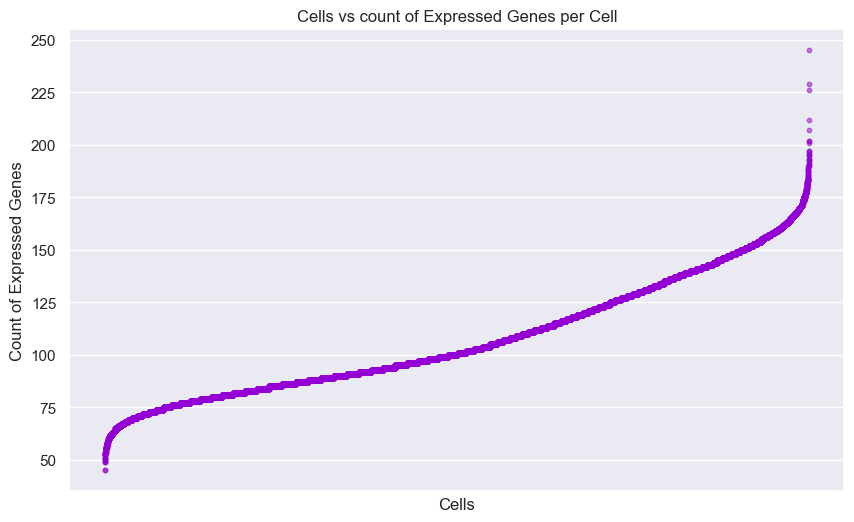

In [17]:
scatter_count_genes(df_MCF7_D_F_N)

Both the violin plot and the scatter plot show that most cells express very few genes, so the "outliers" are the most important ones, containing large part of the information.

#### SPARSITY

Above there were already some hints at the dataset being very sparse. We could see it from the "head" and also from the values in the description. Now we look into it further. Since in this case we're dealing with a dataset that's already normalised and filtered, the purpose of this analysis is to verify the methods we used for the SmartSeq datasets.

In [ ]:
print('Number of 0s in the matrix:', np.count_nonzero(df_MCF7_D_F_N==0))

print('Sparsity index:', sparsity(df_MCF7_D_F_N), '%')

Number of 0s in the matrix: 63275144
Sparsity index: 97.52943062363205 %


In [ ]:
df_MCF7_D_F_N_spars_matrix = plot_sparsity_matrix(df_MCF7_D_F_N, sparsity(df_MCF7_D_F_N))
df_MCF7_D_F_N_spars_matrix

Clearly, data is very sparse. The index is even higher than for the SmartSeq datasets. The reason is again the difference between the two sequencing methods, DropSeq tends to generate much more noise.

#### DISTRIBUTION OF THE DATASET

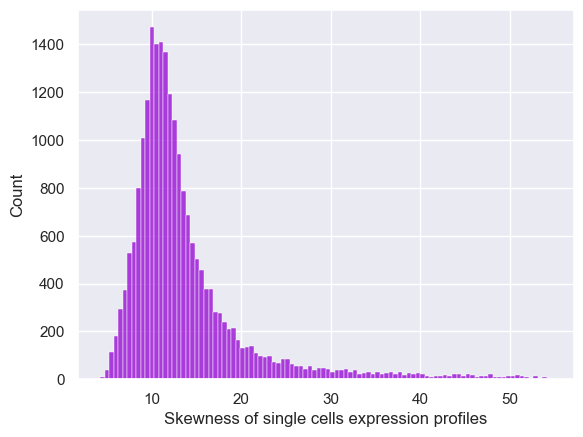

Mean of skewness values: 13.854582213581528


In [22]:
plot_skewness(df_MCF7_D_F_N)

Skewness has high positive value, indicating that the distribution is right-skewed.

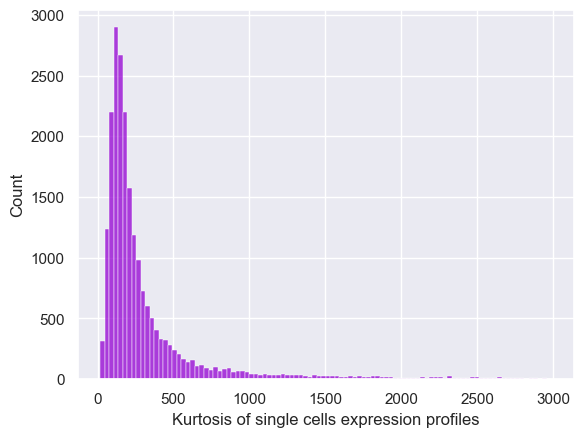

Mean of kurtosis values: 322.99451155416557


In [23]:
plot_kurtosis(df_MCF7_D_F_N)

The high positive value of the kurtosis confirms the peak we see in the plot.

From both plots we can see that the data has already been normalised, even just from seeing how "smooth" the histograms are.
Further checks coming...

In [24]:
X_df_MCF7_D_F_N = df_MCF7_D_F_N.to_numpy()
X_df_MCF7_D_F_N
np.shape(X_df_MCF7_D_F_N)

Xnorm_df_MCF7_D_F_N = np.random.normal(0, 2, 10000000)   # create random values based on a normal distribution
Xnorm_df_MCF7_D_F_N

print( "Excess kurtosis of normal distribution: ",  kurtosis(Xnorm_df_MCF7_D_F_N) )
print( "Skewness of normal distribution: ", skew(Xnorm_df_MCF7_D_F_N) )

Excess kurtosis of normal distribution:  0.0008172671800767972
Skewness of normal distribution:  0.00020337011340313934


The excess kurtosis is a measure of the tails of the distribution compared to a normal distribution. A value of 0 indicates a normal distribution. Positive values indicate heavier tails, and negative values indicate lighter tails. In this case we can see the distribution is almost normal.

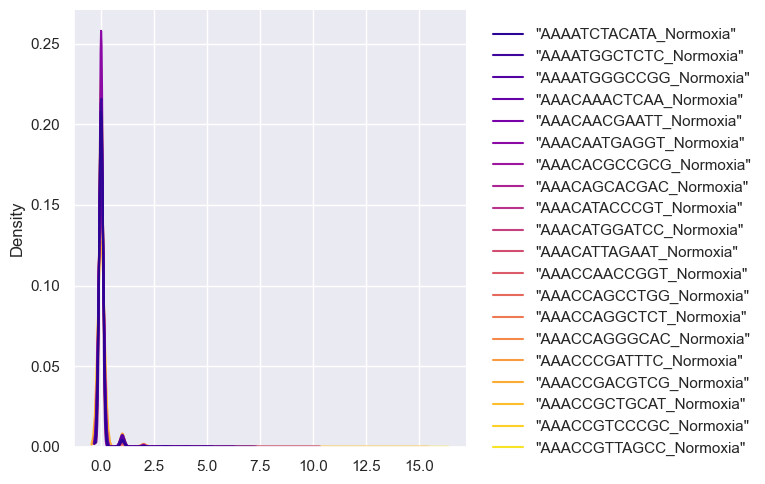

In [25]:
df_MCF7_D_F_N_small = df_MCF7_D_F_N.iloc[:, 10:30]  #just selecting part of the samples so run time not too long
sns.displot(data=df_MCF7_D_F_N_small,palette='plasma',kind="kde", bw_adjust=2)

The main component of the plot is the KDE curve, which is a smoothed estimate of the probability density function (PDF) of the data. The KDE curve represents the distribution of the data in a continuous manner, allowing us to visualise the shape, central tendency, and spread of the distribution. So overall this plot provides a smooth, continuous representation of the data distribution, making it easier to identify features such as peaks, valleys, and modes.

In [ ]:
sns.pairplot(df_MCF7_D_F_N.iloc[:, :10])

These plots show the univariate distribution of each variable.

### EDA - HCC1806 DropSeq Experiment

Now, we turn our attention to HCC1806-DropSeq, of which we analyse the main features.

#### GENERAL OVERVIEW

In [ ]:
print("Dataframe dimensions:", np.shape(df_HCC1806_D_F_N))

Dataframe dimensions: (3000, 14682)


In [ ]:
df_HCC1806_D_F_N.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3000 entries, "H1-5" to "ZNF682"
Columns: 14682 entries, "AAAAAACCCGGC_Normoxia" to "TTTTTTTGAATC_Hypoxia"
dtypes: int64(14682)
memory usage: 336.1+ MB


We notice that this dataset is much larger compared to the HCC1806 SmartSeq dataset. This is due to the nature of the RNA sequencing methods. SmartSeq typically requires more labor-intensive sample preparation compared to droplet-based methods like DropSeq, and it may be less scalable for analysing large numbers of cells. So generally there's more data obtained with the DropSeq method.

In [ ]:
print("First column: ", df_HCC1806_D_F_N.iloc[ : , 0])

First column:  "H1-5"       2
"MALAT1"     3
"MT-RNR2"    0
"ARVCF"      0
"BCYRN1"     0
            ..
"SCCPDH"     0
"NTAN1"      0
"CLIP2"      0
"DUSP23"     0
"ZNF682"     0
Name: "AAAAAACCCGGC_Normoxia", Length: 3000, dtype: int64


In [ ]:
df_HCC1806_D_F_N.head(10)

,"""AAAAAACCCGGC_Normoxia""","""AAAACCGGATGC_Normoxia""","""AAAACGAGCTAG_Normoxia""","""AAAACTTCCCCG_Normoxia""","""AAAAGCCTACCC_Normoxia""","""AAACACAAATCT_Normoxia""","""AAACCAAGCCCA_Normoxia""","""AAACCATGCACT_Normoxia""","""AAACCTCCGGCT_Normoxia""","""AAACGCCGGTCC_Normoxia""",...,"""TTTTCTGATGGT_Hypoxia""","""TTTTGATTCAGA_Hypoxia""","""TTTTGCAACTGA_Hypoxia""","""TTTTGCCGGGCC_Hypoxia""","""TTTTGTTAGCCT_Hypoxia""","""TTTTTACCAATC_Hypoxia""","""TTTTTCCGTGCA_Hypoxia""","""TTTTTGCCTGGG_Hypoxia""","""TTTTTGTAACAG_Hypoxia""","""TTTTTTTGAATC_Hypoxia"""
"""H1-5""",2,2,5,1,0,0,0,0,1,0,...,0,1,0,2,1,0,0,0,3,1
"""MALAT1""",3,3,2,3,12,3,1,2,0,0,...,3,1,1,1,4,0,4,1,3,6
"""MT-RNR2""",0,0,0,0,0,0,0,0,0,1,...,1,2,2,2,0,0,1,0,1,0
"""ARVCF""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""BCYRN1""",0,1,1,0,0,1,1,2,0,3,...,1,1,0,1,1,0,0,1,0,0
"""ATXN7L2""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""IGFBP3""",0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,1,1
"""H1-3""",2,0,3,0,0,0,0,0,1,0,...,1,0,0,4,1,0,0,0,1,0
"""CTIF""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""RNF123""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


This dataset has the cells displayed as columns and the genes appearing as rows. So for each gene we have a value which indicates the amount of that gene expressed in the cell corresponding to the column. For each cell we can see whether it was cultivated in a normoxic or a hypoxic environment.

For some applications we'll need the transpose, so we compute it now.

In [ ]:
df_HCC1806_D_F_N_T = df_HCC1806_D_F_N.T
df_HCC1806_D_F_N_T.head(10)

,"""H1-5""","""MALAT1""","""MT-RNR2""","""ARVCF""","""BCYRN1""","""ATXN7L2""","""IGFBP3""","""H1-3""","""CTIF""","""RNF123""",...,"""BATF3""","""CDKN3""","""DLD""","""PMPCA""","""ZNF165""","""SCCPDH""","""NTAN1""","""CLIP2""","""DUSP23""","""ZNF682"""
"""AAAAAACCCGGC_Normoxia""",2,3,0,0,0,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAAACCGGATGC_Normoxia""",2,3,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAAACGAGCTAG_Normoxia""",5,2,0,0,1,0,1,3,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAAACTTCCCCG_Normoxia""",1,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAAAGCCTACCC_Normoxia""",0,12,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAACACAAATCT_Normoxia""",0,3,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAACCAAGCCCA_Normoxia""",0,1,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
"""AAACCATGCACT_Normoxia""",0,2,0,0,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAACCTCCGGCT_Normoxia""",1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
"""AAACGCCGGTCC_Normoxia""",0,0,1,0,3,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
gene_symbols_df_HCC1806_D_F_N = df_HCC1806_D_F_N.index
print("Genes: ", gene_symbols_df_HCC1806_D_F_N)

cells_df_HCC1806_D_F_N = df_HCC1806_D_F_N_T.index
print("Cells:", cells_df_HCC1806_D_F_N)

Genes:  Index(['"H1-5"', '"MALAT1"', '"MT-RNR2"', '"ARVCF"', '"BCYRN1"', '"ATXN7L2"',
       '"IGFBP3"', '"H1-3"', '"CTIF"', '"RNF123"',
       ...
       '"BATF3"', '"CDKN3"', '"DLD"', '"PMPCA"', '"ZNF165"', '"SCCPDH"',
       '"NTAN1"', '"CLIP2"', '"DUSP23"', '"ZNF682"'],
      dtype='object', length=3000)
Cells: Index(['"AAAAAACCCGGC_Normoxia"', '"AAAACCGGATGC_Normoxia"',
       '"AAAACGAGCTAG_Normoxia"', '"AAAACTTCCCCG_Normoxia"',
       '"AAAAGCCTACCC_Normoxia"', '"AAACACAAATCT_Normoxia"',
       '"AAACCAAGCCCA_Normoxia"', '"AAACCATGCACT_Normoxia"',
       '"AAACCTCCGGCT_Normoxia"', '"AAACGCCGGTCC_Normoxia"',
       ...
       '"TTTTCTGATGGT_Hypoxia"', '"TTTTGATTCAGA_Hypoxia"',
       '"TTTTGCAACTGA_Hypoxia"', '"TTTTGCCGGGCC_Hypoxia"',
       '"TTTTGTTAGCCT_Hypoxia"', '"TTTTTACCAATC_Hypoxia"',
       '"TTTTTCCGTGCA_Hypoxia"', '"TTTTTGCCTGGG_Hypoxia"',
       '"TTTTTGTAACAG_Hypoxia"', '"TTTTTTTGAATC_Hypoxia"'],
      dtype='object', length=14682)


In [ ]:
description_df_HCC1806_D_F_N = df_HCC1806_D_F_N.describe()
description_df_HCC1806_D_F_N

,"""AAAAAACCCGGC_Normoxia""","""AAAACCGGATGC_Normoxia""","""AAAACGAGCTAG_Normoxia""","""AAAACTTCCCCG_Normoxia""","""AAAAGCCTACCC_Normoxia""","""AAACACAAATCT_Normoxia""","""AAACCAAGCCCA_Normoxia""","""AAACCATGCACT_Normoxia""","""AAACCTCCGGCT_Normoxia""","""AAACGCCGGTCC_Normoxia""",...,"""TTTTCTGATGGT_Hypoxia""","""TTTTGATTCAGA_Hypoxia""","""TTTTGCAACTGA_Hypoxia""","""TTTTGCCGGGCC_Hypoxia""","""TTTTGTTAGCCT_Hypoxia""","""TTTTTACCAATC_Hypoxia""","""TTTTTCCGTGCA_Hypoxia""","""TTTTTGCCTGGG_Hypoxia""","""TTTTTGTAACAG_Hypoxia""","""TTTTTTTGAATC_Hypoxia"""
count,3000.00000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.00000,3000.000000,3000.000000,...,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000
mean,0.02900,0.041667,0.024333,0.021667,0.029667,0.020000,0.036000,0.02600,0.034000,0.029333,...,0.043000,0.049667,0.037000,0.047667,0.057000,0.023333,0.041667,0.041667,0.043333,0.040000
std,0.23276,0.309778,0.231860,0.189409,0.323761,0.170126,0.250449,0.23525,0.231362,0.218683,...,0.271739,0.319219,0.279864,0.259648,0.304053,0.214797,0.236536,0.285116,0.267356,0.282418
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,5.00000,9.000000,7.000000,4.000000,12.000000,3.000000,4.000000,6.00000,4.000000,4.000000,...,4.000000,7.000000,7.000000,4.000000,5.000000,4.000000,4.000000,5.000000,5.000000,6.000000


In [ ]:
print("Global Max Value:", description_df_HCC1806_D_F_N.loc['max'].max())
print("Global Min Value:", description_df_HCC1806_D_F_N.loc['min'].min())

Global Max Value: 110.0
Global Min Value: 0.0


#### CORRELATION

We want to analyse the correlation to gain insights on the interaction and similarities between the cells.

In [4]:
sparse_df_HCC1806_D_F_N = csr_matrix(df_HCC1806_D_F_N.values)
dense_df_HCC1806_D_F_N = sparse_df_HCC1806_D_F_N.toarray()
correlation_df_HCC1806_D_F_N = np.corrcoef(dense_df_HCC1806_D_F_N.T)

In [5]:
avgCorr_HCC1806_D_F_N_T = (correlation_df_HCC1806_D_F_N.max() - correlation_df_HCC1806_D_F_N.min()) / 2 + correlation_df_HCC1806_D_F_N.min()
avgCorr_HCC1806_D_F_N_T

0.48927921213311437

Due to the huge dimension of this dataset we aggregate the data, but this doesn't distort information, as we're not looking into the correlation in the tiniest details, just trying to get a general idea.

In [ ]:
# defining groups of variables for aggregation
groups_df_HCC1806_D_F_N = [df_HCC1806_D_F_N.columns[i:i+10] for i in range(0, len(df_HCC1806_D_F_N.columns), 10)]

# aggregating data by calculating the mean for each group of variables
aggr_df_HCC1806_D_F_N = pd.concat([df_HCC1806_D_F_N[group].mean(axis=1) for group in groups_df_HCC1806_D_F_N], axis=1)

# computing correlation matrix for the aggregated data
corr_aggr_df_HCC1806_D_F_N = np.corrcoef(aggr_df_HCC1806_D_F_N.T)

# some info
print("Number Cells:", np.shape(corr_aggr_df_HCC1806_D_F_N))
print("Average Correlation:", avgCorr_HCC1806_D_F_N_T)
print("Minimum Correlation:", corr_aggr_df_HCC1806_D_F_N.min())
print("Maximum Correlation:", corr_aggr_df_HCC1806_D_F_N.max())

# visualisation
plt.figure(figsize=(10, 8))
sns.heatmap(corr_aggr_df_HCC1806_D_F_N, cmap='plasma', center=0, yticklabels=False, xticklabels=False)
plt.show()

We notice that the correlation is distributed on a smaller interval compared to MCF7-DropSeq. However, the average correlation in the two datasets is almost the same.

To give a bit more analytical context and get more precise information on the correlations, we count the instances with high and with low correlation.

In [6]:
high_threshold = 0.9
low_threshold = 0.1

highly_correlated_pairs = np.where(np.abs(correlation_df_HCC1806_D_F_N) > high_threshold)
low_correlated_pairs = np.where(np.abs(correlation_df_HCC1806_D_F_N) < low_threshold)

num_high_correlation = 0
num_low_correlation = 0

for i, j in zip(*highly_correlated_pairs):
    if i != j:
        correlation_coefficient = correlation_df_HCC1806_D_F_N[i, j]
        if correlation_coefficient > high_threshold:
            num_high_correlation += 1

for i, j in zip(*low_correlated_pairs):
    if i != j:
        correlation_coefficient = correlation_df_HCC1806_D_F_N[i, j]
        if correlation_coefficient < low_threshold:
            num_low_correlation += 1

print(f"Number of pairs with correlation coefficient above {high_threshold}: {num_high_correlation}")
print(f"Number of pairs with correlation coefficient below {low_threshold}: {num_low_correlation}")

Number of pairs with correlation coefficient above 0.9: 178
Number of pairs with correlation coefficient below 0.1: 7176598


Turns out, the aggregation of the data did distort information, since it practically eliminated all instances with low correlation. The correlation matrix still remains a great tool for visualisation purposes, but it's always necessary to approach things in different ways. 

We will now zoom in to a part with visibly (from the plot above) generally higher correlations (upper-left corner) to take a closer look, and then repeat the same process for an area with visibly generally lower correlations (upper-right corner).

In [ ]:
sub_1_corr_df_HCC1806_D_F_N = corr_aggr_df_HCC1806_D_F_N[:100, :100]

sub_1_avg_corr = (np.max(sub_1_corr_df_HCC1806_D_F_N) - np.min(sub_1_corr_df_HCC1806_D_F_N)) / 2 + np.min(sub_1_corr_df_HCC1806_D_F_N)
sub_1_num_cells = sub_1_corr_df_HCC1806_D_F_N.size
sub_1_min_corr = np.min(sub_1_corr_df_HCC1806_D_F_N)
sub_1_max_corr = np.max(sub_1_corr_df_HCC1806_D_F_N)

print("Number of Cells:", sub_1_num_cells)
print("Average Correlation:", sub_1_avg_corr)
print("Minimum Correlation:", sub_1_min_corr)
print("Maximum Correlation:", sub_1_max_corr)

plt.figure(figsize=(10, 8))
sns.heatmap(sub_1_corr_df_HCC1806_D_F_N, cmap='plasma', center=0, xticklabels=False)
plt.show()

In [ ]:
sub_2_corr_df_HCC1806_D_F_N = corr_aggr_df_HCC1806_D_F_N[:100, 1469-100:]

sub_2_avg_corr = (np.max(sub_2_corr_df_HCC1806_D_F_N) - np.min(sub_2_corr_df_HCC1806_D_F_N)) / 2 + np.min(sub_2_corr_df_HCC1806_D_F_N)
sub_2_num_cells = sub_2_corr_df_HCC1806_D_F_N.size
sub_2_min_corr = np.min(sub_2_corr_df_HCC1806_D_F_N)
sub_2_max_corr = np.max(sub_2_corr_df_HCC1806_D_F_N)

print("Number of Cells:", sub_2_num_cells)
print("Average Correlation:", sub_2_avg_corr)
print("Minimum Correlation:", sub_2_min_corr)
print("Maximum Correlation:", sub_2_max_corr)

plt.figure(figsize=(10, 8))
sns.heatmap(sub_2_corr_df_HCC1806_D_F_N, cmap='plasma', center=0, xticklabels=False)
plt.show()

In [ ]:
# weakly correlated cells instances
cell_1_weak_corr_HCC1806_D_F_N = np.unravel_index(np.argmin(sub_1_corr_df_HCC1806_D_F_N), sub_1_corr_df_HCC1806_D_F_N.shape)[0]
cell_2_weak_corr_HCC1806_D_F_N = np.unravel_index(np.argmin(sub_2_corr_df_HCC1806_D_F_N), sub_2_corr_df_HCC1806_D_F_N.shape)[0]

# strongly correlated cells instances
cell_1_strong_corr_HCC1806_D_F_N = np.unravel_index(np.argmax(sub_1_corr_df_HCC1806_D_F_N), sub_1_corr_df_HCC1806_D_F_N.shape)[0]
cell_2_strong_corr_HCC1806_D_F_N = np.unravel_index(np.argmax(sub_2_corr_df_HCC1806_D_F_N), sub_2_corr_df_HCC1806_D_F_N.shape)[0]

In [ ]:
print(count_nonzero_entries_np(df_HCC1806_D_F_N, cell_1_weak_corr_HCC1806_D_F_N))
print(count_nonzero_entries_np(df_HCC1806_D_F_N, cell_2_weak_corr_HCC1806_D_F_N))
print(count_nonzero_entries_np(df_HCC1806_D_F_N, cell_1_strong_corr_HCC1806_D_F_N))
print(count_nonzero_entries_np(df_HCC1806_D_F_N, cell_2_strong_corr_HCC1806_D_F_N))

8
20
4537
9039


Before drawing any conclusions we look at a scatter plot of the average correlation coefficient vs the count of expressed genes per cell.

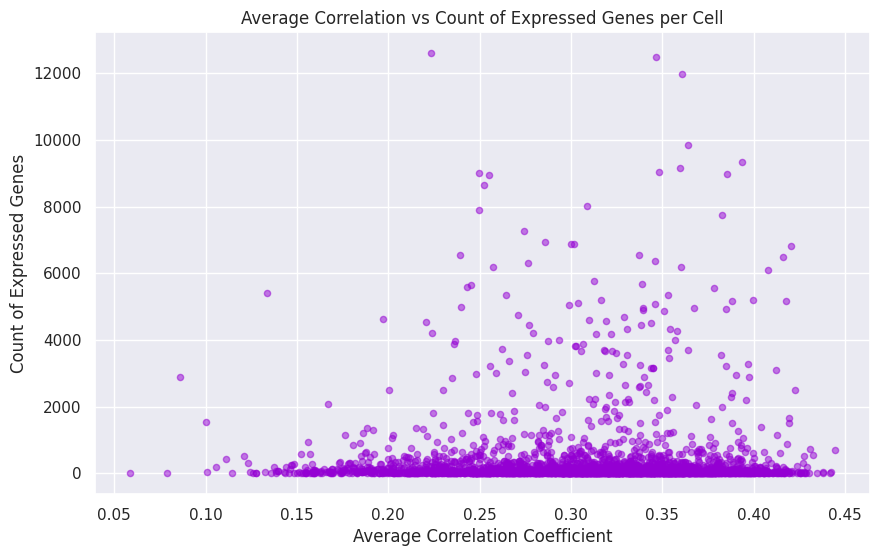

In [ ]:
scatter_corr_genes_count(df_HCC1806_D_F_N, correlation_df_HCC1806_D_F_N)

We see that while the count of expressed genes tends to be low (this is due to the design of the DropSeq method), it's mostly independent from the average correlation coefficient.

#### OUTLIERS

First approach is to look at the interquantile range.

In [7]:
Q1_df_HCC1806_D_F_N = df_HCC1806_D_F_N.quantile(0.25)
Q3_df_HCC1806_D_F_N = df_HCC1806_D_F_N.quantile(0.75)
IQR_df_HCC1806_D_F_N = Q3_df_HCC1806_D_F_N - Q1_df_HCC1806_D_F_N
print(IQR_df_HCC1806_D_F_N)

"AAAAAACCCGGC_Normoxia"    0.0
"AAAACCGGATGC_Normoxia"    0.0
"AAAACGAGCTAG_Normoxia"    0.0
"AAAACTTCCCCG_Normoxia"    0.0
"AAAAGCCTACCC_Normoxia"    0.0
                          ... 
"TTTTTACCAATC_Hypoxia"     0.0
"TTTTTCCGTGCA_Hypoxia"     0.0
"TTTTTGCCTGGG_Hypoxia"     0.0
"TTTTTGTAACAG_Hypoxia"     0.0
"TTTTTTTGAATC_Hypoxia"     0.0
Length: 14682, dtype: float64


In [8]:
IQR_df_HCC1806_D_F_N.value_counts()

0.0    14682
Name: count, dtype: int64

In [9]:
df_HCC1806_D_F_N_noOut = df_HCC1806_D_F_N[~((df_HCC1806_D_F_N < (Q1_df_HCC1806_D_F_N - 1.5 * IQR_df_HCC1806_D_F_N)) |(df_HCC1806_D_F_N > (Q3_df_HCC1806_D_F_N + 1.5 * IQR_df_HCC1806_D_F_N))).any(axis=1)]
df_HCC1806_D_F_N_noOut.shape

(0, 14682)

In [10]:
print("Difference of number of columns:", df_HCC1806_D_F_N.T.shape[1]-df_HCC1806_D_F_N_noOut.T.shape[1])

Difference of number of columns: 3000


In [11]:
print("Percentage of removed columns:", (df_HCC1806_D_F_N.T.shape[1]-df_HCC1806_D_F_N_noOut.T.shape[1])/df_HCC1806_D_F_N.T.shape[1]*100, "%")

Percentage of removed columns: 100.0 %


In [12]:
df_HCC1806_D_F_N_noOut.head(10)

,"""AAAAAACCCGGC_Normoxia""","""AAAACCGGATGC_Normoxia""","""AAAACGAGCTAG_Normoxia""","""AAAACTTCCCCG_Normoxia""","""AAAAGCCTACCC_Normoxia""","""AAACACAAATCT_Normoxia""","""AAACCAAGCCCA_Normoxia""","""AAACCATGCACT_Normoxia""","""AAACCTCCGGCT_Normoxia""","""AAACGCCGGTCC_Normoxia""",...,"""TTTTCTGATGGT_Hypoxia""","""TTTTGATTCAGA_Hypoxia""","""TTTTGCAACTGA_Hypoxia""","""TTTTGCCGGGCC_Hypoxia""","""TTTTGTTAGCCT_Hypoxia""","""TTTTTACCAATC_Hypoxia""","""TTTTTCCGTGCA_Hypoxia""","""TTTTTGCCTGGG_Hypoxia""","""TTTTTGTAACAG_Hypoxia""","""TTTTTTTGAATC_Hypoxia"""


We see that no genes would be expressed this way. The outliers carry the information in this case. 

In [13]:
value_counts_dict = {}

for column in df_HCC1806_D_F_N.columns:
    value_counts_dict[column] = df_HCC1806_D_F_N[column].value_counts().to_dict()

print(value_counts_dict)

{'"AAAAAACCCGGC_Normoxia"': {0: 2938, 1: 46, 2: 11, 3: 2, 4: 2, 5: 1}, '"AAAACCGGATGC_Normoxia"': {0: 2907, 1: 77, 2: 11, 3: 3, 9: 1, 8: 1}, '"AAAACGAGCTAG_Normoxia"': {0: 2949, 1: 39, 2: 8, 3: 2, 5: 1, 7: 1}, '"AAAACTTCCCCG_Normoxia"': {0: 2949, 1: 43, 2: 4, 3: 2, 4: 2}, '"AAAAGCCTACCC_Normoxia"': {0: 2950, 1: 35, 2: 5, 3: 5, 4: 3, 12: 1, 5: 1}, '"AAACACAAATCT_Normoxia"': {0: 2951, 1: 41, 2: 5, 3: 3}, '"AAACCAAGCCCA_Normoxia"': {0: 2919, 1: 66, 3: 6, 2: 6, 4: 3}, '"AAACCATGCACT_Normoxia"': {0: 2949, 1: 34, 2: 12, 4: 2, 3: 2, 6: 1}, '"AAACCTCCGGCT_Normoxia"': {0: 2921, 1: 63, 2: 10, 3: 5, 4: 1}, '"AAACGCCGGTCC_Normoxia"': {0: 2934, 1: 50, 2: 11, 3: 4, 4: 1}, '"AAACGCCGTTCC_Normoxia"': {0: 2930, 1: 49, 2: 12, 3: 4, 4: 3, 5: 2}, '"AAACGGACGCTC_Normoxia"': {0: 2919, 1: 58, 2: 16, 3: 4, 4: 2, 6: 1}, '"AAACGTAGAGCG_Normoxia"': {0: 2932, 1: 45, 3: 7, 2: 6, 5: 4, 4: 3, 7: 1, 12: 1, 6: 1}, '"AAACGTTCACTG_Normoxia"': {0: 2911, 1: 82, 2: 4, 3: 2, 4: 1}, '"AAACTCATAAAT_Normoxia"': {0: 2903, 1: 85

All this confirms the approach we applied for the datasets we cleaned ourselves, where we considered the outliers to be important. In fact, they're essential indicators, and upon removing them we'd be left with practically no data.

Again, the reason for this lies in the intricacies of the DropSeq method. Empty drops generate noise in the data. Usually, the Drop-Seq method captures around 5-10% of the input cells.

In [ ]:
df1_HCC1806_D_F_N = df_HCC1806_D_F_N + 1
df1_HCC1806_D_F_N_log2 = df1_HCC1806_D_F_N.apply(np.log2)
# I'm selecting part of the data as the plots would otherwise take too long to generate
df1_HCC1806_D_F_N_log2_small = df1_HCC1806_D_F_N_log2.iloc[:, :50]
np.shape(df1_HCC1806_D_F_N_log2_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df1_HCC1806_D_F_N_log2_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

We took the logarithm of the data for visualisation purposes, below is how the plots would normally look. 

In [ ]:
df1_HCC1806_D_F_N = df_HCC1806_D_F_N + 1
# df1_HCC1806_D_F_N_log2 = df1_HCC1806_D_F_N.apply(np.log2)
# I'm selecting part of the data as the plots would otherwise take too long to generate
df1_HCC1806_D_F_N_small = df1_HCC1806_D_F_N.iloc[:, :50]
np.shape(df1_HCC1806_D_F_N_small)
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df1_HCC1806_D_F_N_small,palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)

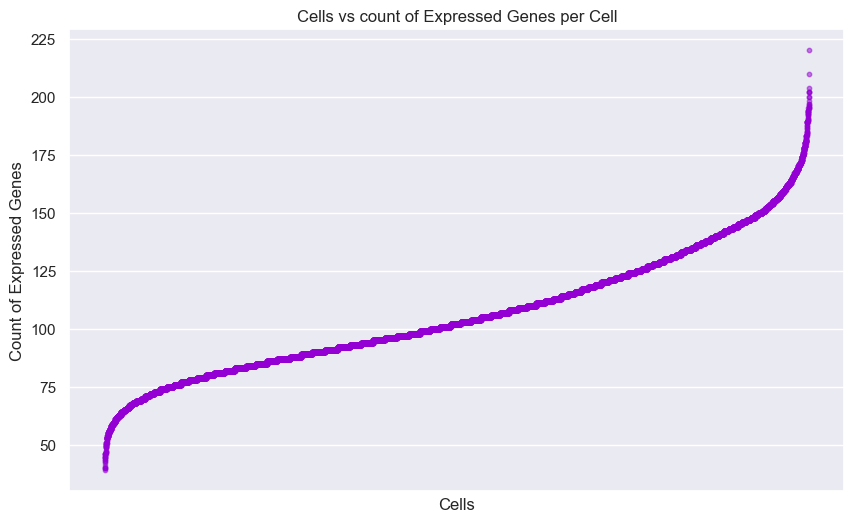

In [29]:
scatter_count_genes(df_HCC1806_D_F_N)

Both the violin plot and the scatter plot show that most cells express very few genes, so the "outliers" are the most important ones, containing large part of the information.

#### SPARSITY

Above there were already some hints at the dataset being very sparse. We could see it from the "head" and also from the values in the description. Now we look into it further. Since in this case we're dealing with a dataset that's already normalised and filtered, the purpose of this analysis is to verify the methods we used for the SmartSeq datasets.

In [31]:
print('Number of 0s in the matrix:', np.count_nonzero(df_HCC1806_D_F_N==0))

print('Sparsity index:', sparsity(df_HCC1806_D_F_N), '%')

Number of 0s in the matrix: 43005440
Sparsity index: 97.63756073196204 %


In [ ]:
df_HCC1806_D_F_N_spars_matrix = plot_sparsity_matrix(df_HCC1806_D_F_N, sparsity(df_HCC1806_D_F_N))
# df_HCC1806_D_F_N_spars_matrix

Clearly, data is very sparse. The index is even higher than for the SmartSeq datasets. The reason is again the difference between the two sequencing methods, DropSeq tends to generate much more noise.

#### DISTRIBUTION OF THE DATASET

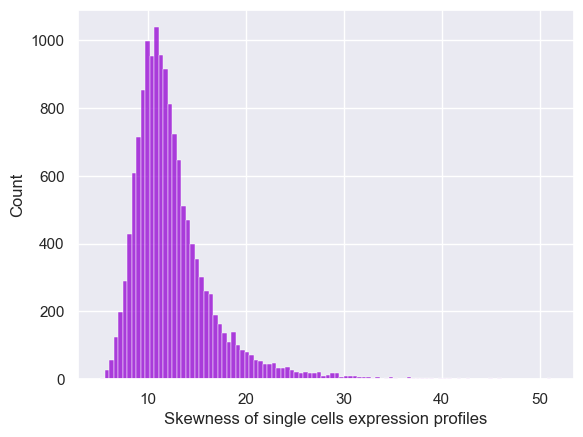

Mean of skewness values: 12.640167633634317


In [33]:
plot_skewness(df_HCC1806_D_F_N)

Skewness has high positive value, indicating that the distribution is right-skewed.

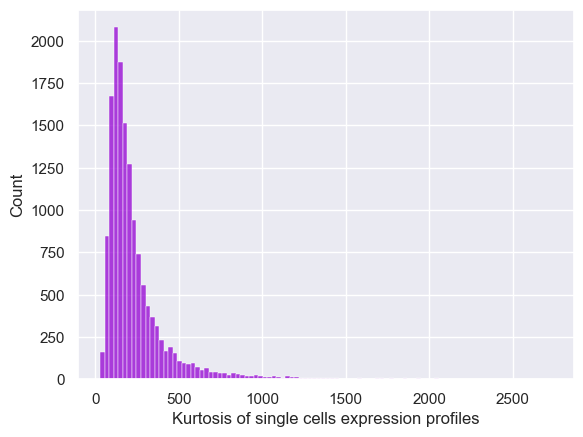

Mean of kurtosis values: 240.66713886817368


In [34]:
plot_kurtosis(df_HCC1806_D_F_N)

The high positive value of the kurtosis confirms the peak we see in the plot.

From both plots we can see that the data has already been normalised, even just from seeing how "smooth" the histograms are.
Further checks coming...

In [35]:
X_df_HCC1806_D_F_N = df_HCC1806_D_F_N.to_numpy()
X_df_HCC1806_D_F_N
np.shape(X_df_HCC1806_D_F_N)

Xnorm_df_HCC1806_D_F_N = np.random.normal(0, 2, 10000000)   # create random values based on a normal distribution
Xnorm_df_HCC1806_D_F_N

print( "Excess kurtosis of normal distribution: ",  kurtosis(Xnorm_df_HCC1806_D_F_N) )
print( "Skewness of normal distribution: ", skew(Xnorm_df_HCC1806_D_F_N) )

Excess kurtosis of normal distribution:  0.0003587629533110537
Skewness of normal distribution:  -0.0009078839845795542


The excess kurtosis is a measure of the tails of the distribution compared to a normal distribution. A value of 0 indicates a normal distribution. Positive values indicate heavier tails, and negative values indicate lighter tails. In this case we can see the distribution is almost normal.

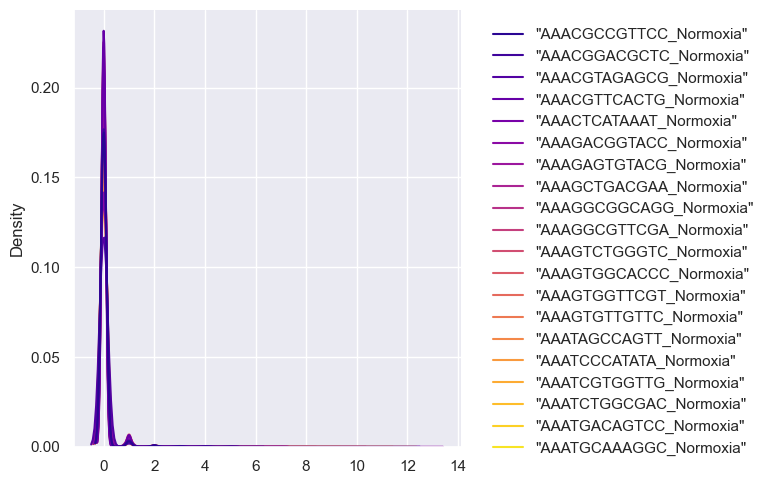

In [36]:
df_HCC1806_D_F_N_small = df_HCC1806_D_F_N.iloc[:, 10:30]  #just selecting part of the samples so run time not too long
sns.displot(data=df_HCC1806_D_F_N_small,palette='plasma',kind="kde", bw_adjust=2)

The main component of the plot is the KDE curve, which is a smoothed estimate of the probability density function (PDF) of the data. The KDE curve represents the distribution of the data in a continuous manner, allowing us to visualise the shape, central tendency, and spread of the distribution. So overall this plot provides a smooth, continuous representation of the data distribution, making it easier to identify features such as peaks, valleys, and modes.

In [ ]:
sns.pairplot(df_HCC1806_D_F_N.iloc[:, :10])

These plots show the univariate distribution of each variable.

### FILTERING

The original unfiltered dataset presents some issues that are resolved by the filtering. We further analyse the differences between the two datasets in order to attempt understanding the reasoning behind this process.

#### Shape

First of all, we start by analysing the data structures of the two datasets for the cell line type MCF7. Then, we procede with the same analysis on the second cell line type HCC1806.

In [ ]:
print("Dataframe dimensions:", np.shape(df_MCF7_S_UnF))
print("Dataframe dimensions:", np.shape(df_MCF7_S_F))

Dataframe dimensions: (22934, 383)
Dataframe dimensions: (18945, 313)


In [ ]:
print("Dataframe dimensions:", np.shape(df_HCC1806_S_UnF))
print("Dataframe dimensions:", np.shape(df_HCC1806_S_F))

Dataframe dimensions: (23396, 243)
Dataframe dimensions: (19503, 227)


 We notice that both some columns and some rows have been removed. Our first aim is to deduce the criteria with which the genes and cells have been selected for removal. We start by isolating the cells (columns) and genes (rows) that have been removed.

In [ ]:
missing_columns_MCF7_S = df_MCF7_S_UnF.columns.difference(df_MCF7_S_F.columns)
list_missing_MCF7_S = missing_columns_MCF7_S.tolist()
isolated_columns_MCF7_S = df_MCF7_S_UnF[list_missing_MCF7_S]
print(list_missing_MCF7_S)
print("Dataframe dimensions:", np.shape(isolated_columns_MCF7_S))

['"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_A8_Hypo_S26_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_A9_Hypo_S27_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_B10_Hypo_S76_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_B1_Norm_S49_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_B2_Norm_S50_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_B3_Norm_S51_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_B9_Hypo_S75_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_C3_Norm_S99_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_C7_Hypo_S121_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_C8_Hypo_S122_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_C9_Hypo_S123_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_D10_Hypo_S172_Aligned.sortedByCoord.out.bam"', '"output.STAR.1_D12_Hypo_S174_Aligned.sortedByCoord.out.bam"', '"output.STAR.1

In [ ]:
missing_rows_MCF7_S = df_MCF7_S_UnF.index.difference(df_MCF7_S_F.index)
list_missing_rows_MCF7_S = missing_rows_MCF7_S.tolist()
isolated_rows_MCF7_S = df_MCF7_S_UnF.loc[list_missing_rows_MCF7_S]
print(list_missing_rows_MCF7_S)
print("Dataframe dimensions:", np.shape(isolated_rows_MCF7_S))

['"A1CF"', '"A2M"', '"A2ML1"', '"A2MP1"', '"AANAT"', '"ABCA13"', '"ABCA4"', '"ABCA8"', '"ABCB11"', '"ABCC13"', '"ABCC5-AS1"', '"ABCC9"', '"ABCG4"', '"ABHD12B"', '"ABHD17AP4"', '"ABHD17AP5"', '"ABITRAMP1"', '"ABO"', '"ABRA"', '"ABT1P1"', '"ACAN"', '"ACAP2-IT1"', '"ACER1"', '"ACER2P1"', '"ACKR4P1"', '"ACOXL-AS1"', '"ACP4"', '"ACSL5"', '"ACSM4"', '"ACTBL2"', '"ACTL6B"', '"ACTN2"', '"ACTN3"', '"ACTP1"', '"ACTR3-AS1"', '"ADAM21"', '"ADAM21P1"', '"ADAM29"', '"ADAMTS10"', '"ADAMTS14"', '"ADAMTS15"', '"ADAMTS2"', '"ADAMTS20"', '"ADAMTS3"', '"ADAMTS4"', '"ADAMTS5"', '"ADAMTS6"', '"ADAMTS7P1"', '"ADARB2"', '"ADCY10"', '"ADCY2"', '"ADCY4"', '"ADGRA1"', '"ADGRA1-AS1"', '"ADGRD2"', '"ADGRE1"', '"ADGRE3"', '"ADGRF5P1"', '"ADGRG3"', '"ADH4"', '"ADH5P2"', '"ADH6"', '"ADIPOQ"', '"ADIPOQ-AS1"', '"ADM-DT"', '"ADORA3"', '"ADRA1B"', '"ADRA1D"', '"ADTRP"', '"AFAP1L1"', '"AFF2"', '"AGBL1"', '"AGBL4-AS1"', '"AGBL5-AS1"', '"AGGF1P1"', '"AGK-DT"', '"AGPAT4"', '"AGRP"', '"AGT"', '"AGXT"', '"AHCYP2"', '"AHCYP4"',

In [ ]:
missing_columns_HCC1806_S = df_HCC1806_S_UnF.columns.difference(df_HCC1806_S_F.columns)
list_missing_HCC1806_S = missing_columns_HCC1806_S.tolist()
isolated_columns_HCC1806_S = df_HCC1806_S_UnF[list_missing_HCC1806_S]
print(list_missing_HCC1806_S)
print("Dataframe dimensions:", np.shape(isolated_columns_HCC1806_S))

['"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate1B1_Hypoxia_S98_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate1B4_Hypoxia_S105_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate1D3_Hypoxia_S6_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate1F8_Normoxia_S18_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate1G6_Hypoxia_S15_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate2E12_Normoxia_S61_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate2F12_Normoxia_S62_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate2G10_Normoxia_S157_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate2H2_Hypoxia_S35_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate3D10_Normoxia_S188_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate3D11_Normoxia_S92_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam"', '"output.STAR.PCRPlate3D3_Hypoxia_S72_Aligned.sortedByCoord.ou

In [ ]:
missing_rows_HCC1806_S = df_HCC1806_S_UnF.index.difference(df_HCC1806_S_F.index)
list_missing_rows_HCC1806_S = missing_rows_HCC1806_S.tolist()
isolated_rows_HCC1806_S = df_HCC1806_S_UnF.loc[list_missing_rows_HCC1806_S]
print(list_missing_rows_HCC1806_S)
print("Dataframe dimensions:", np.shape(isolated_rows_HCC1806_S))

['"A1CF"', '"A2M"', '"AACSP1"', '"AADACL2"', '"AANAT"', '"AARD"', '"ABCA13"', '"ABCB4"', '"ABCB5"', '"ABCC6P1"', '"ABCC8"', '"ABT1P1"', '"ACAP2-IT1"', '"ACE2"', '"ACHE"', '"ACMSD"', '"ACOT1"', '"ACOT6"', '"ACOX2"', '"ACP3"', '"ACP4"', '"ACSL6"', '"ACSM4"', '"ACTBP6"', '"ACTE1P"', '"ACTG1P22"', '"ACTG1P3"', '"ACTL11P"', '"ACTL6B"', '"ACTN3"', '"ACTR3-AS1"', '"ACTR3P3"', '"ACVR2B-AS1"', '"ADA2"', '"ADAM1A"', '"ADAM1B"', '"ADAMTS13"', '"ADAMTS3"', '"ADAMTS4"', '"ADAMTS7P1"', '"ADAMTS7P3"', '"ADAMTS8"', '"ADAMTS9-AS2"', '"ADAMTSL4-AS2"', '"ADCY2"', '"ADCY5"', '"ADGRD2"', '"ADGRE3"', '"ADGRF2"', '"ADGRL4"', '"ADH1B"', '"ADH1C"', '"ADH4"', '"ADH7"', '"ADI1P1"', '"ADRA1B"', '"ADRA2B"', '"AFF3"', '"AFTPH-DT"', '"AGAP14P"', '"AGBL1"', '"AGBL1-AS1"', '"AGBL5-IT1"', '"AGKP1"', '"AGRP"', '"AHCYP2"', '"AHCYP3"', '"AHCYP5"', '"AHSG"', '"AIMP1P2"', '"AIRN"', '"AK6P1"', '"AK6P2"', '"AKAP14"', '"AKAP6"', '"AKIRIN1P2"', '"AKIRIN2P1"', '"AKR1B1P8"', '"AKR1C8P"', '"AKR7A2P2"', '"ALDH3B2"', '"ALDH8A1"', '"

#### Removed cells

##### Gene expression using violin plots


 We begin our analysis by checking whether gene expression for each cell may have any relation to the filtering process. In particular, we want to check if too high/ too small gene expression may have been a reason to eliminate a cell.\
 We start by plotting the violin plots of the features' values for each cell so that each plot corresponds to one cell. This allows us to easily visualise the gene expression for each cell and compare the overall trend for the Unfiltered and Filtered Dataset.

In [ ]:
def violin_plot(df):
  np.shape(df)
  plt.figure(figsize=(30,15))
  plot=sns.violinplot(data=df,palette="Set3",cut=0)
  plt.xticks([])
  plt.show()

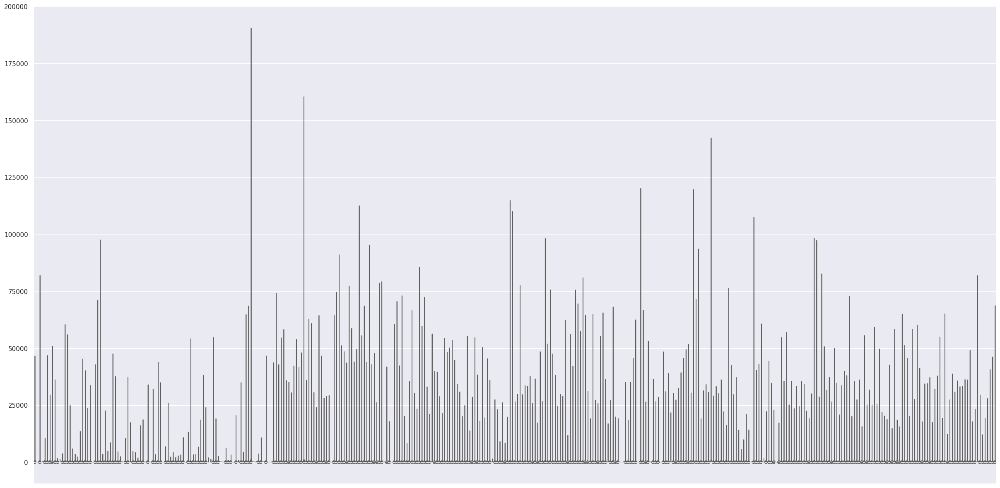

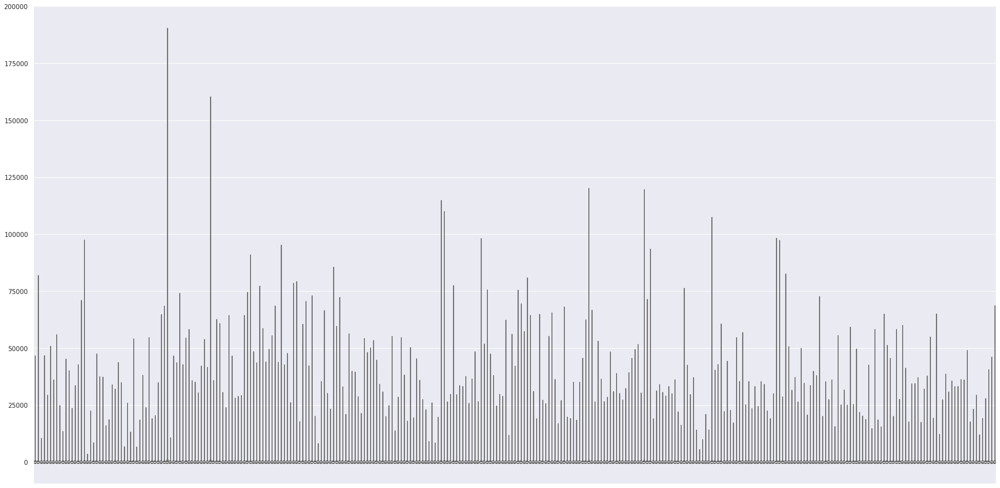

In [ ]:
violin_plot(df_MCF7_S_UnF)
violin_plot(df_MCF7_S_F)

It seems that the cells with values near 0, i.e. with low gene expression, have been removed. We check if a similar pattern can be noticed for the second cell line type HCC1806.

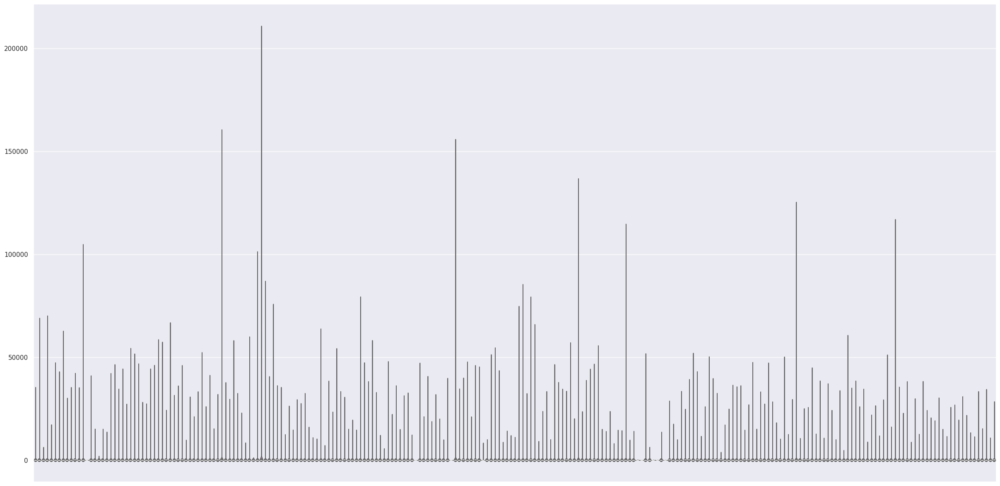

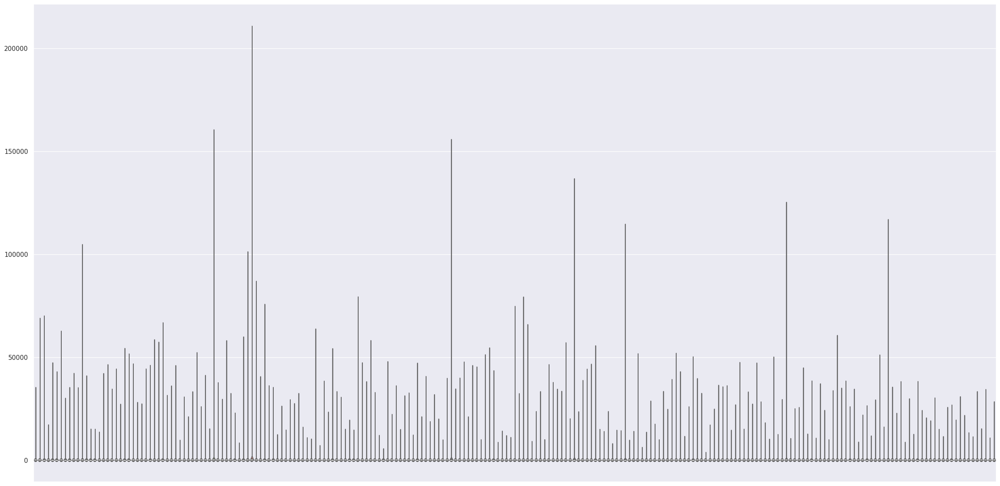

In [ ]:
violin_plot(df_HCC1806_S_UnF)
violin_plot(df_HCC1806_S_F)

It seems that our intuition may be correct and the same observations can be made about the HCC1806 datasets as well.

In order to better visualize the gene expression of the missing columns we repeat the violin plot construction on those columns only and see if nearly all of them have really low values.

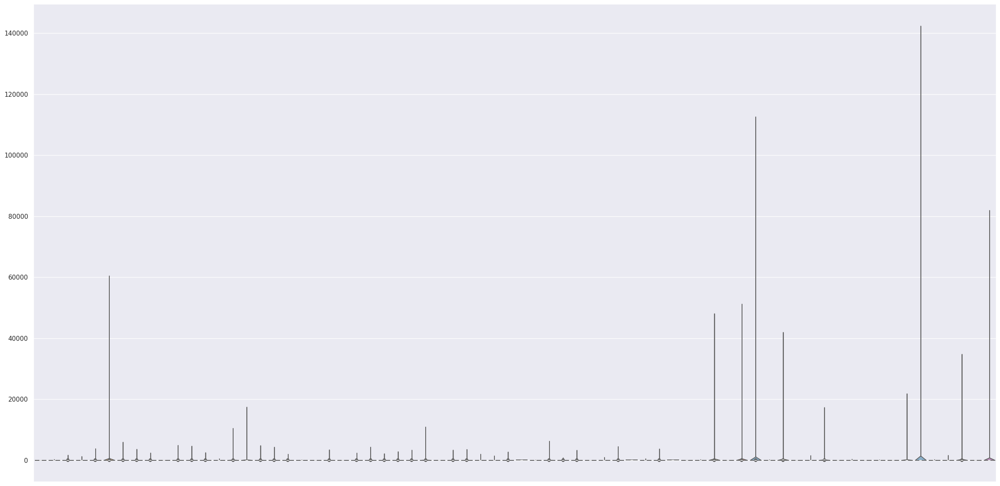

In [ ]:
violin_plot(isolated_columns_MCF7_S)

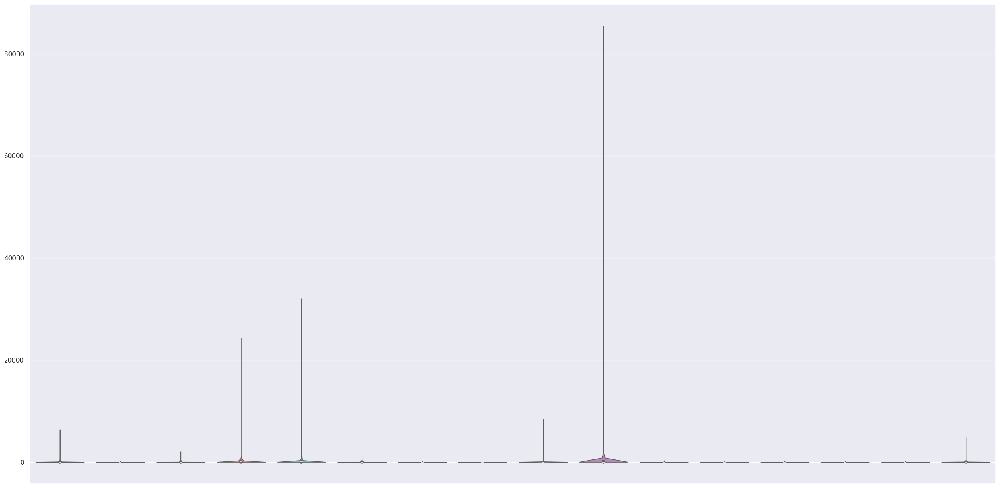

In [ ]:
violin_plot(isolated_columns_HCC1806_S)

##### Gene expression using histogram

In the next section, we briefly check whether the amount of different genes expressed by a cell had any relevance when erasing/retaining a column. \
Our strategy was to build an histogram that portayed along the y axis the number of genes that were expressed by a cell, regardless of the gene expression value. We did so by keeping count of non zero values for each cell.\
We will plot for both MCF7 and HCC1806 the histogram for unfiltered dataset, filtered dataset and missing cells in this order, and then draw our conclusions. We have built a unique function to plot the histogram.

In [ ]:
def plot_nonzero_histogram(DS):
  non_zero_counts = (DS != 0).sum()
  #Plot histogram
  plt.figure(figsize=(30,15))
  plt.bar(non_zero_counts.index, non_zero_counts.values, width=0.8)
  plt.xlabel('Columns')
  plt.ylabel('Number of rows with non-zero values')
  plt.title('Histogram of non-zero values per column')
  plt.xticks([])
  plt.show()

**MCF7**

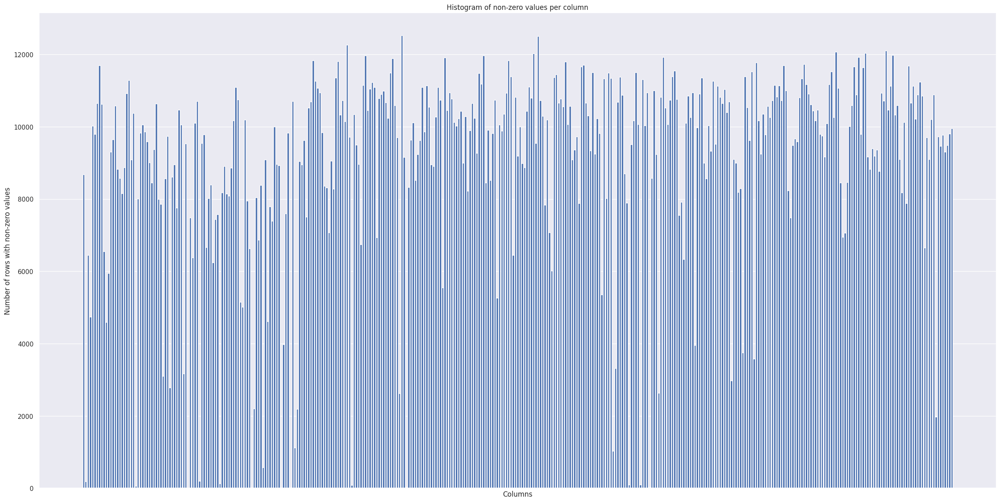

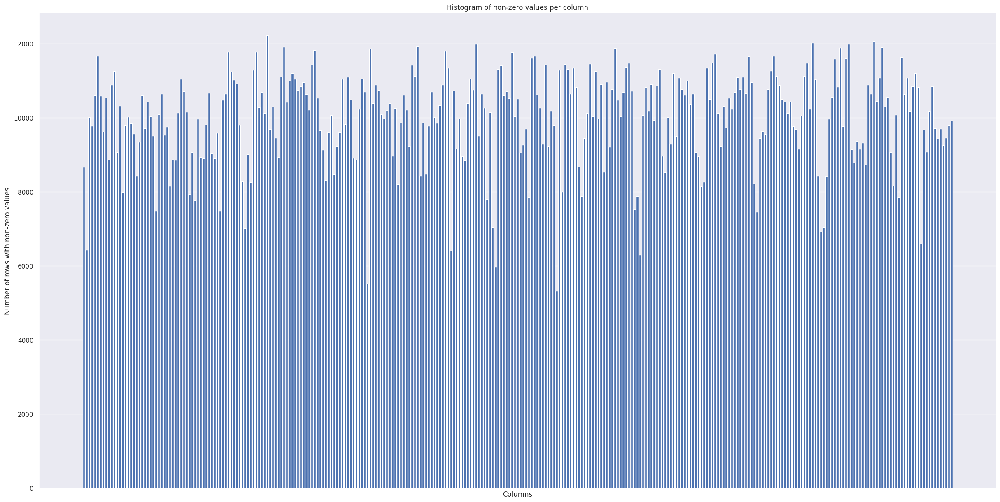

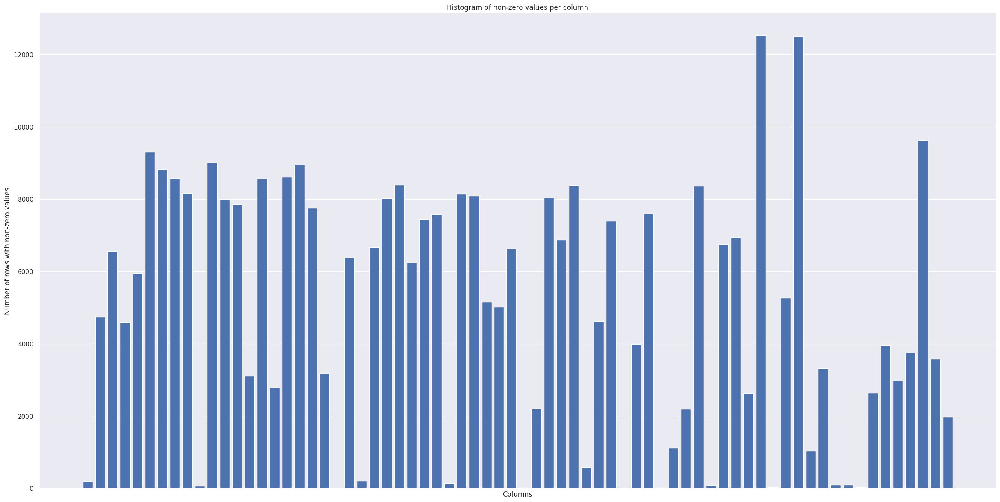

In [ ]:
plot_nonzero_histogram(df_MCF7_S_UnF)
plot_nonzero_histogram(df_MCF7_S_F)
plot_nonzero_histogram(isolated_columns_MCF7_S)

**HCC1806**

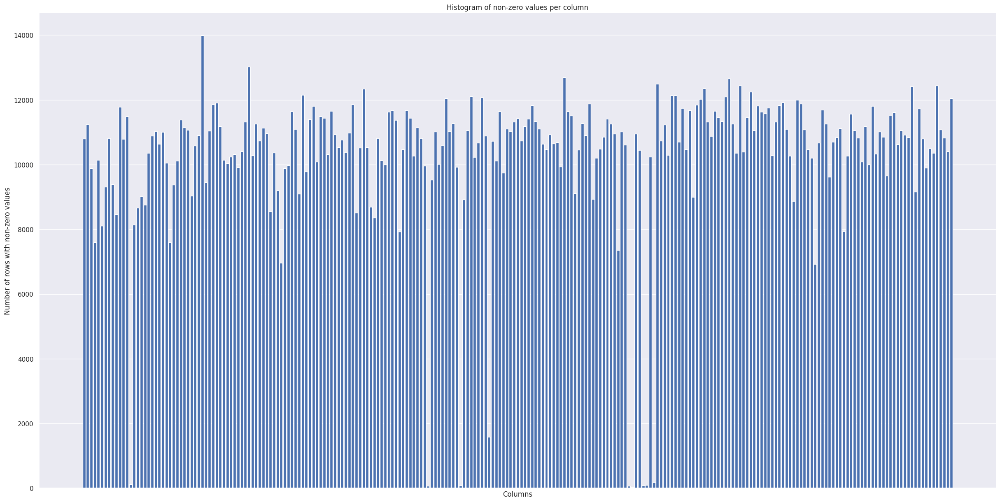

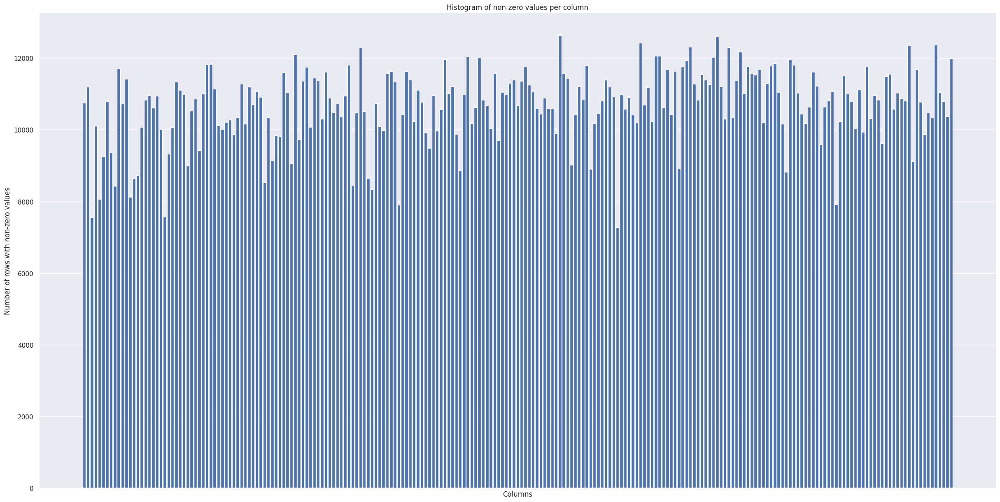

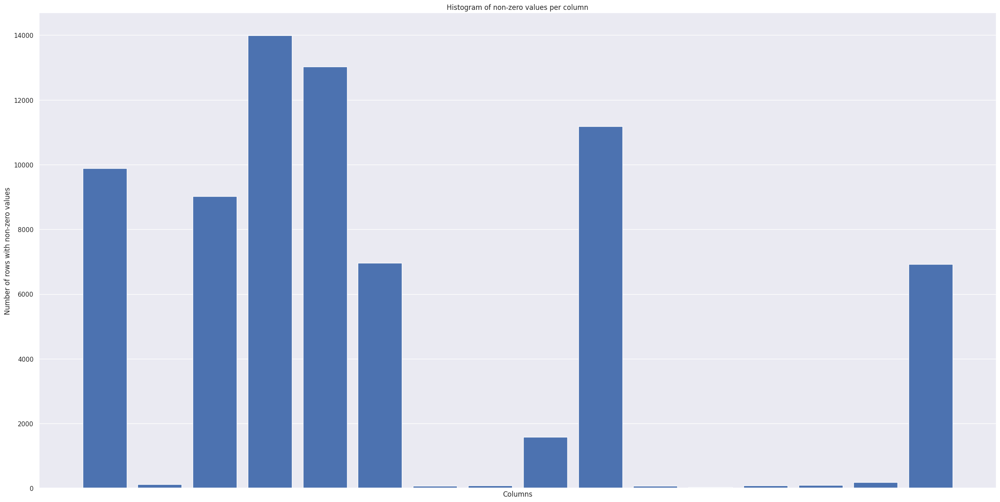

In [ ]:
plot_nonzero_histogram(df_HCC1806_S_UnF)
plot_nonzero_histogram(df_HCC1806_S_F)
plot_nonzero_histogram(isolated_columns_HCC1806_S)

It seems that most columns that have been removed express a large number of genes. However, it is clearly visible by observing the differences between the plot for the whole Unfiltered and Filtered datasets that the cells that present a non-zero expression value for many genes have been removed. \
Therefore, we can gather that the filtering process took into account the gene expression distribution rather than how many genes were expressed.  Still, we have some cells which have been dropped for some other reason, unrelated to both gene expression and to the number of genes expressed.\
We will continue our study by focusing on correlation and variance.

##### Correlation and Variance

In this section we proceed our analysis by focusing on the correlation of the missing cells with respect to the others. Our hypothesis is that correlation may have been relevant in the filtering process. In the EDA section we saw how high correlation for MCF7 can be linked to high gene expression, so we wanted to verify if for this cell type low correlation might have been a filtering criteria.

In [ ]:
# Identify the missing columns
missing_columns_MCF7_S = df_MCF7_S_UnF.columns.difference(df_MCF7_S_F.columns)
list_missing_MCF7_S = missing_columns_MCF7_S.tolist()

# Calculate the correlation matrix of the unfiltered dataset
correlation_matrix = df_MCF7_S_UnF.corr()

# Analyze the correlations of the missing columns with all columns
correlations_of_isolated = correlation_matrix.loc[list_missing_MCF7_S]

# Calculate the average correlations for each isolated column
average_correlations = correlations_of_isolated.mean(axis=1)

# Calculate the overall average correlation of the isolated columns with all columns
overall_average_correlation = average_correlations.mean()

# Print the results
print("Average correlations of isolated columns:")
print(average_correlations)

print("Overall average correlation of isolated columns:", overall_average_correlation)

Average correlations of isolated columns:
"output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam"    0.182000
"output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam"      0.678748
"output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam"     0.787064
"output.STAR.1_A8_Hypo_S26_Aligned.sortedByCoord.out.bam"     0.702987
"output.STAR.1_A9_Hypo_S27_Aligned.sortedByCoord.out.bam"     0.726206
                                                                ...   
"output.STAR.3_H7_Hypo_S373_Aligned.sortedByCoord.out.bam"    0.739821
"output.STAR.4_A12_Hypo_S48_Aligned.sortedByCoord.out.bam"    0.493793
"output.STAR.4_A3_Norm_S21_Aligned.sortedByCoord.out.bam"     0.578513
"output.STAR.4_A5_Norm_S23_Aligned.sortedByCoord.out.bam"     0.041984
"output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam"    0.214466
Length: 70, dtype: float64
Overall average correlation of isolated columns: 0.5654042764051218


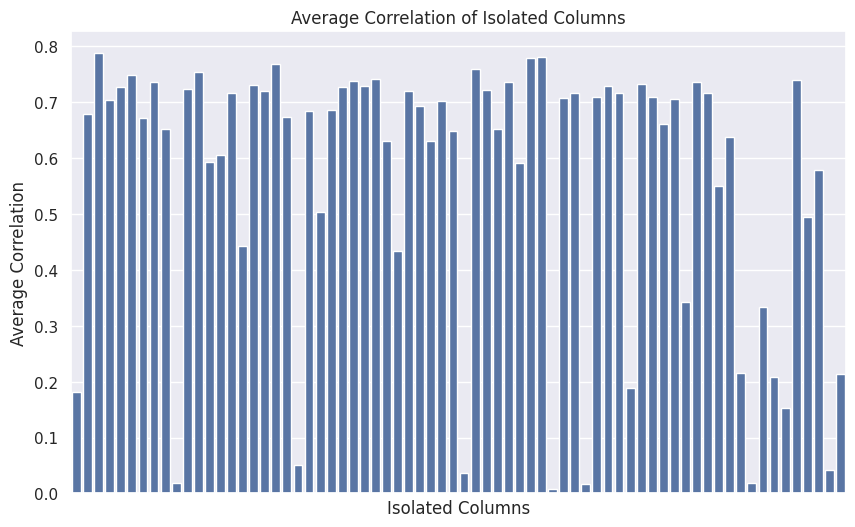

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=average_correlations.index, y=average_correlations.values)
plt.xticks([])
plt.xlabel('Isolated Columns')
plt.ylabel('Average Correlation')
plt.title('Average Correlation of Isolated Columns')
plt.show()

Except for some isolated cases, it seems that the cells that have been dropped have high correlation values. We decide to conduct the same analysis on the second cell type.

In [ ]:
# Identify the missing columns
missing_columns_HCC1806_S = df_HCC1806_S_UnF.columns.difference(df_HCC1806_S_F.columns)
list_missing_HCC1806_S = missing_columns_HCC1806_S.tolist()

# Calculate the correlation matrix of the unfiltered dataset
correlation_matrix = df_HCC1806_S_UnF.corr()

# Analyze the correlations of the missing columns with all columns
correlations_of_isolated = correlation_matrix.loc[list_missing_HCC1806_S]

# Calculate the average correlations for each isolated column
average_correlations = correlations_of_isolated.mean(axis=1)

# Calculate the overall average correlation of the isolated columns with all columns
overall_average_correlation = average_correlations.mean()

# Print the results
print("Average correlations of isolated columns:")
print(average_correlations)

print("Overall average correlation of isolated columns:", overall_average_correlation)

Average correlations of isolated columns:
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"       0.748490
"output.STAR.PCRPlate1B1_Hypoxia_S98_Aligned.sortedByCoord.out.bam"       0.049950
"output.STAR.PCRPlate1B4_Hypoxia_S105_Aligned.sortedByCoord.out.bam"      0.695549
"output.STAR.PCRPlate1D3_Hypoxia_S6_Aligned.sortedByCoord.out.bam"        0.615021
"output.STAR.PCRPlate1F8_Normoxia_S18_Aligned.sortedByCoord.out.bam"      0.809268
"output.STAR.PCRPlate1G6_Hypoxia_S15_Aligned.sortedByCoord.out.bam"       0.554004
"output.STAR.PCRPlate2E12_Normoxia_S61_Aligned.sortedByCoord.out.bam"     0.013097
"output.STAR.PCRPlate2F12_Normoxia_S62_Aligned.sortedByCoord.out.bam"     0.111348
"output.STAR.PCRPlate2G10_Normoxia_S157_Aligned.sortedByCoord.out.bam"    0.286545
"output.STAR.PCRPlate2H2_Hypoxia_S35_Aligned.sortedByCoord.out.bam"       0.793553
"output.STAR.PCRPlate3D10_Normoxia_S188_Aligned.sortedByCoord.out.bam"    0.021090
"output.STAR.PCRPlate3D11_Normoxia_S92_Aligne

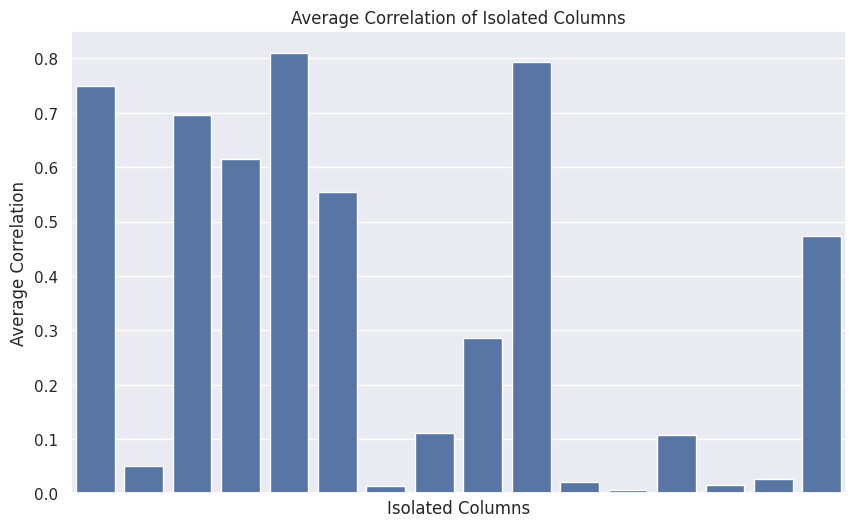

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=average_correlations.index, y=average_correlations.values)
plt.xticks([])
plt.xlabel('Isolated Columns')
plt.ylabel('Average Correlation')
plt.title('Average Correlation of Isolated Columns')
plt.show()

 Our hypothesis is that some cells with high correlation have been dropped to avoid redundancy. In order to further investigate our supposition we analyze the variance of the missing cells.

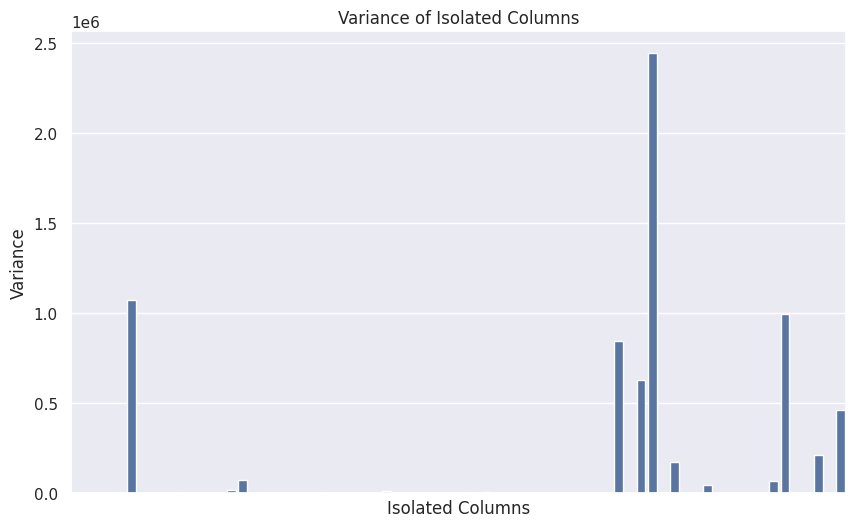

In [ ]:
# Calculate the variance of the isolated columns
variance_isolated = df_MCF7_S_UnF[list_missing_MCF7_S].var()

# Plot the variances
plt.figure(figsize=(10, 6))
sns.barplot(x=variance_isolated.index, y=variance_isolated.values)
plt.xticks([])
plt.xlabel('Isolated Columns')
plt.ylabel('Variance')
plt.title('Variance of Isolated Columns')
plt.show()

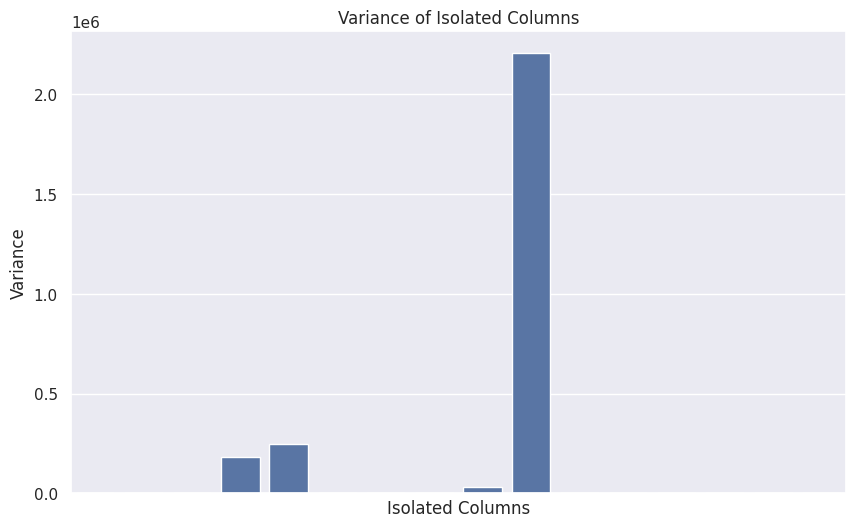

In [ ]:
# Calculate the variance of the isolated columns
variance_isolated = df_HCC1806_S_UnF[list_missing_HCC1806_S].var()

# Plot the variances
plt.figure(figsize=(10, 6))
sns.barplot(x=variance_isolated.index, y=variance_isolated.values)
plt.xticks([])
plt.xlabel('Isolated Columns')
plt.ylabel('Variance')
plt.title('Variance of Isolated Columns')
plt.show()

It seems that our hypothesis may be correct. As a matter of fact, high correlation combined with very low variance can cause redundancy and therefore may be part of the reason why the cells are missing in the filtered dataset.

#### Removed Genes

Since we have observed that not only cells but genes have been the target of the filtering, we will plot the violin plot for gene sample from the missing rows to clarify whether it may be possible that low gene expression is related the filtering of rows too.\
We have decided to only plot a few of the genes from the missing rows dataframe in order to simplify the visualisation, since the size of the datasets would be too large to be thourougly explored.

**MCF7**

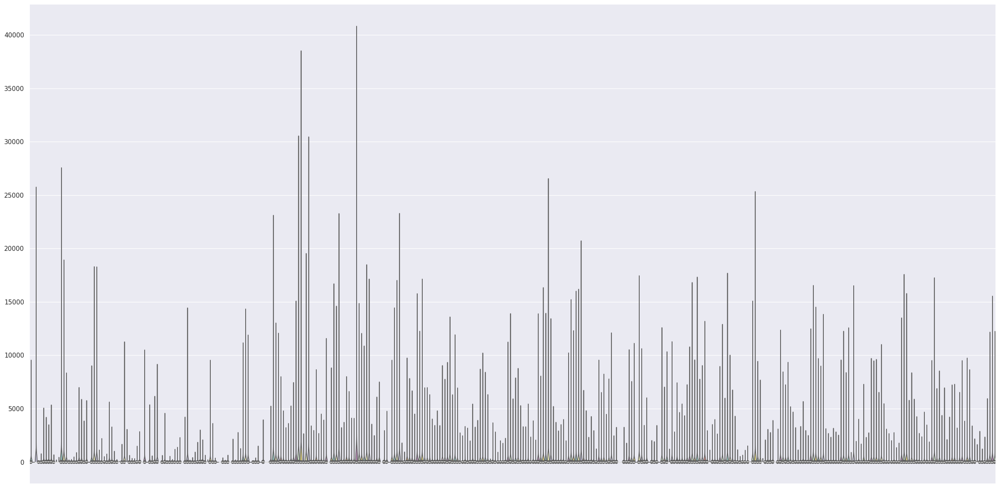

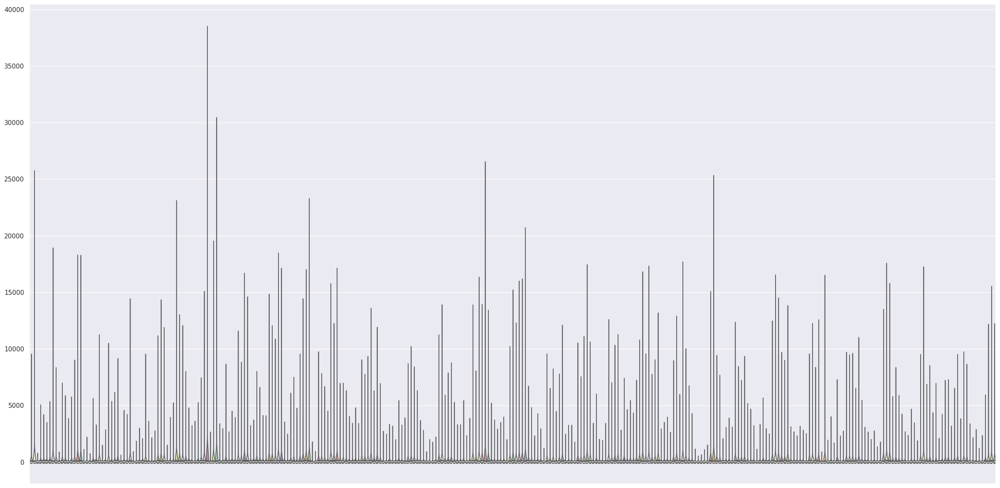

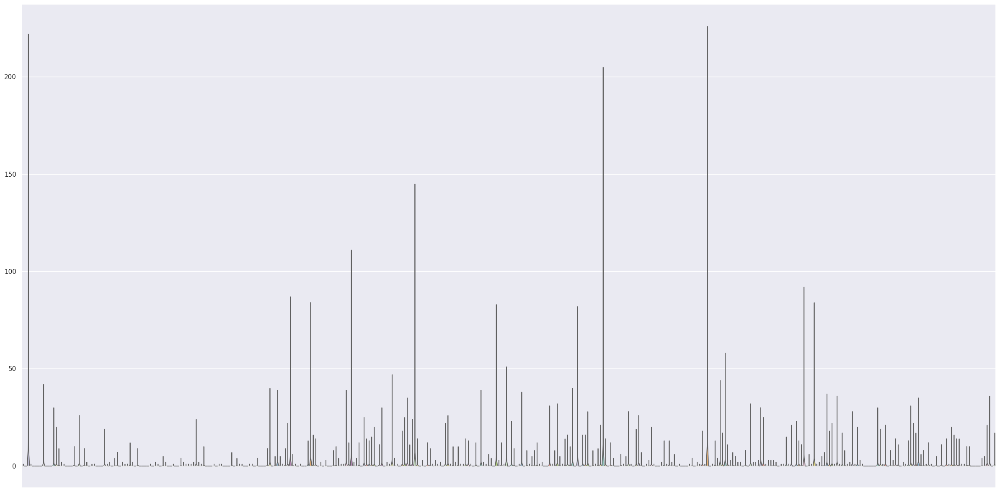

In [ ]:
violin_plot(df_MCF7_S_UnF.iloc[:200])
violin_plot(df_MCF7_S_F.iloc[:200])
violin_plot(isolated_rows_MCF7_S.iloc[:200])

**HCC1806**

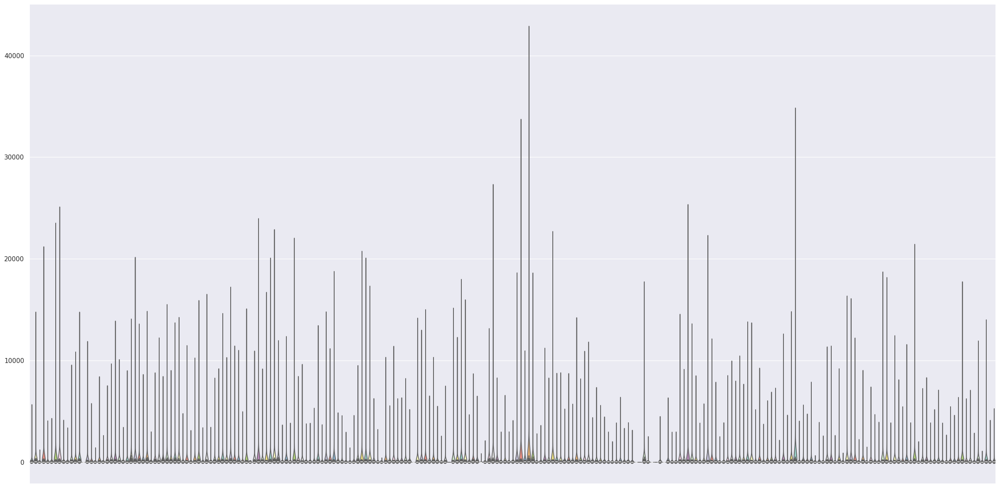

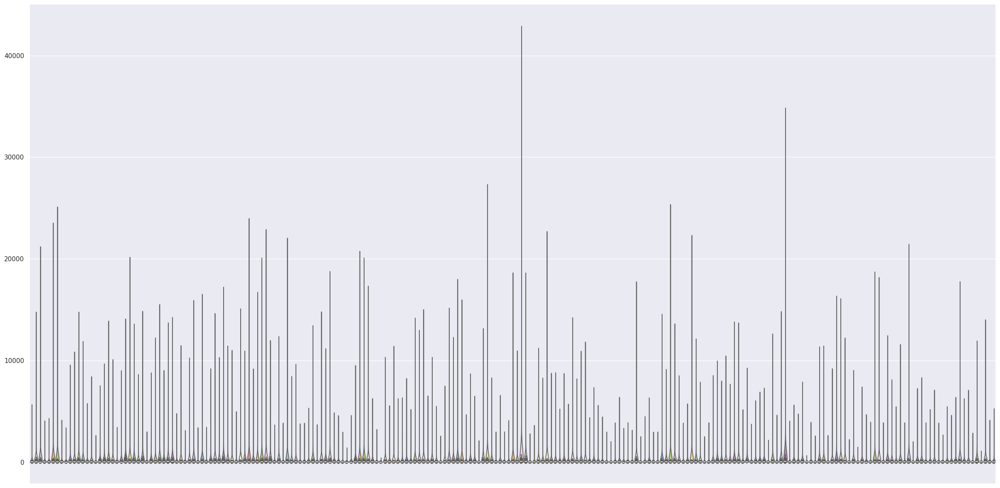

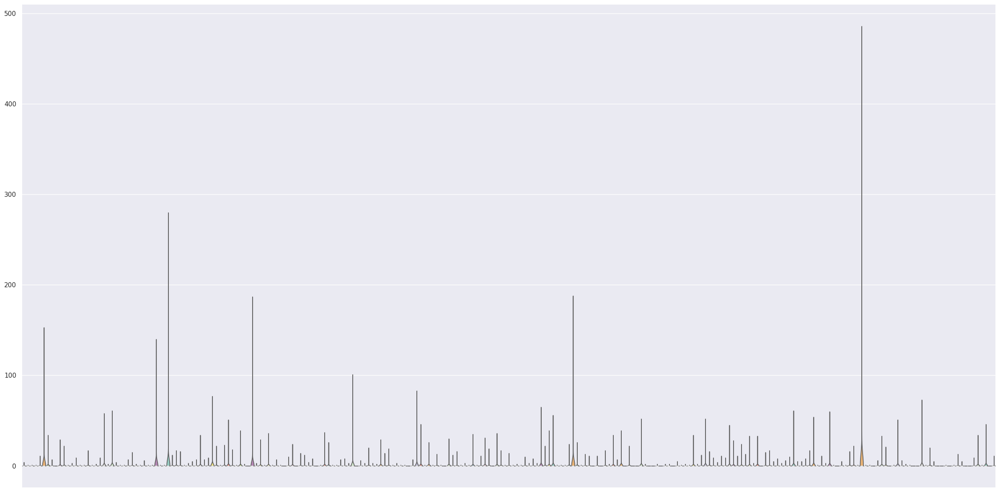

In [ ]:
violin_plot(df_HCC1806_S_UnF.iloc[:200])
violin_plot(df_HCC1806_S_F.iloc[:200])
violin_plot(isolated_rows_HCC1806_S.iloc[:200])

It seems that low expression may be a reason why some genes have been removed. However, there are some exceptions that may have different reasoning. \

#### Others

We have managed to find a plausible explanation for most cells that have been removed and a good part of the genes. However, there are some exceptions that may be unrelated to any of our previous assumptions.\
When undergoing a filtering process there are a few criteria that may be relevant:

*   Biological Reasonings: for instance, some cells may have been dropped due to high presence of mitochondria
*   Sample/Statistical Filtering
* Biological Replicates
* Others



## UNSUPERVISED LEARNING

### PCA

The goal of PCA is to reduce the dimensionality of the data while retaining as much as possible of the variation present in the original dataset. In the follwing section, we will perform this unsupervised learning technique on the datasets at hand.

Our general purpose during PCA will be to reduce the number of significant genes (hence, dimensions of the training dataset), keeping those with a high variance (taking a 95% treshold).

#### MCF7 - SmartSeq

In [ ]:
data_MCF7 = df_MCF7_S_F_N.T

Notice that this data has already been filtered and normalized, hence it is already suitable for PCA.

In [ ]:
pca_MCF7 = PCA(n_components=0.95)
df_MCF7_pca95 = pca_MCF7.fit_transform(data_MCF7)
print("Number of Components:", pca_MCF7.n_components_)
print(f"Explained Variance: {format(pca_MCF7.explained_variance_ratio_)}")

Number of Components: 20
Explained Variance: [0.6344835  0.09107496 0.06270155 0.04033215 0.03156572 0.01538185
 0.01138705 0.01009336 0.00898676 0.00758287 0.00614321 0.00492391
 0.00467293 0.00430685 0.00377886 0.00331298 0.00300167 0.0027689
 0.00266241 0.00228027]


We may see how much explained variance increases with the number of components, and also how much information each component adds up to the total explained variance.

In [ ]:
cumsum_eigenvalues_MCF7 = np.cumsum(pca_MCF7.explained_variance_ratio_)
explained_var_ratio_MCF7 = pca_MCF7.explained_variance_ratio_

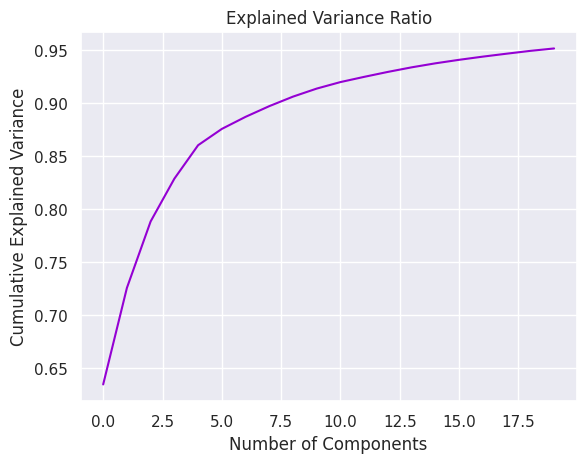

In [ ]:
plt.plot(cumsum_eigenvalues_MCF7, color='darkviolet')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance Ratio')
plt.show()

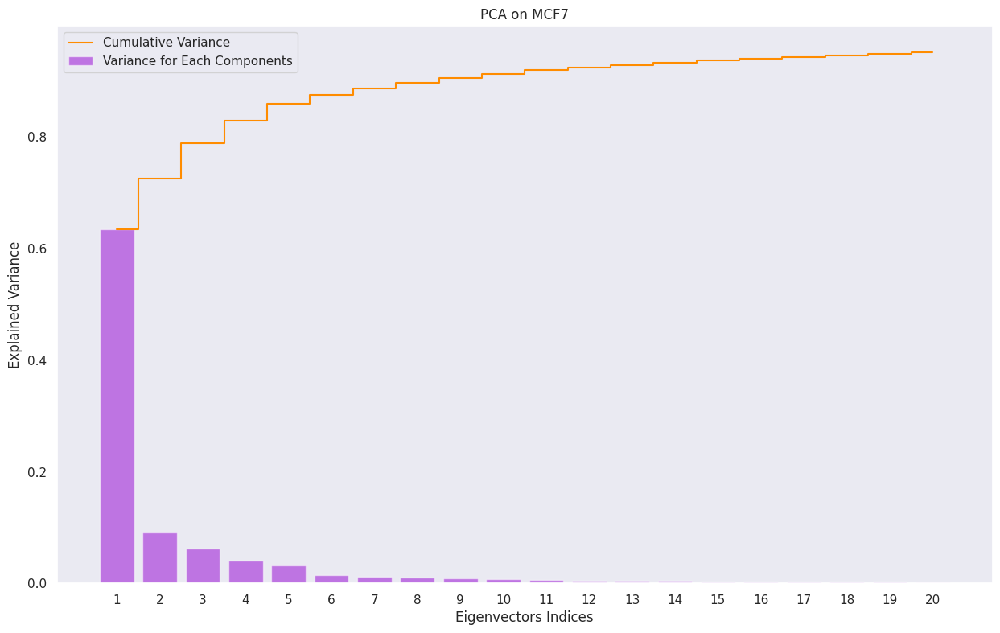

In [ ]:
plt.figure(figsize=(15,9))
plt.bar(range(0,len(explained_var_ratio_MCF7)), explained_var_ratio_MCF7, alpha=0.5, align='center', label='Variance for Each Components',color='darkviolet')
plt.step(range(0,len(cumsum_eigenvalues_MCF7)), cumsum_eigenvalues_MCF7, where='mid',label='Cumulative Variance', color='darkorange')
plt.ylabel('Explained Variance')
plt.xlabel('Eigenvectors Indices')
plt.legend(loc='best', frameon=True)
plt.title("PCA on MCF7")
plt.grid(visible=False)
plt.xticks([i for i in range(len(pca_MCF7.explained_variance_ratio_))], [i+1 for i in range(len(pca_MCF7.explained_variance_ratio_))])
plt.show()

We immediately notice that the first component holds more than 60% of the information, while the second has a much lower variance.

Now that we have looked for the genes that are more significant, the next step is to concatenate the datasets and set as target variables hypoxia and normoxia.

After that, to better visualize what we are doing, we will perform a 2D and 3D dimensionality reduction and plot it.

In [ ]:
data_MCF7.index = df_MCF7_S_F_N.T.index.str[1:-1]
data_MCF7

,"""CYP1B1""","""CYP1B1-AS1""","""CYP1A1""","""NDRG1""","""DDIT4""","""PFKFB3""","""HK2""","""AREG""","""MYBL2""","""ADM""",...,"""CD27-AS1""","""DNAI7""","""MAFG""","""LZTR1""","""BCO2""","""GRIK5""","""SLC25A27""","""DENND5A""","""CDK5R1""","""FAM13A-AS1"""
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,343,140,0,0,386,75,0,0,476,0,...,63,0,17,59,0,0,0,51,0,0
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,131,59,0,1,289,42,0,856,1586,0,...,0,0,1,25,0,0,0,34,0,0
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,452,203,0,0,0,0,0,0,775,0,...,15,0,23,0,0,0,0,0,0,0
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,27,7,0,0,288,214,15,242,1191,0,...,1,0,3,10,0,0,0,4,0,0
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,5817,2669,0,654,2484,1603,748,436,0,0,...,0,0,63,0,0,0,0,60,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,196,102,1,243,266,278,78,1,199,0,...,79,0,1,0,0,0,0,45,19,0
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,504,238,0,62,417,932,275,0,33,0,...,86,0,0,0,0,0,0,0,0,0
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,34565,13717,11274,1263,4256,5663,701,0,0,0,...,0,0,45,0,0,0,0,140,0,32
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,20024,7835,563,925,12733,2187,1141,0,20,81,...,0,0,57,8,0,0,0,7,0,11


In [ ]:
data_MCF7_merged = pd.concat([data_MCF7, df_MCF7_S['Condition']], axis=1, join='inner')
data_MCF7_merged

,"""CYP1B1""","""CYP1B1-AS1""","""CYP1A1""","""NDRG1""","""DDIT4""","""PFKFB3""","""HK2""","""AREG""","""MYBL2""","""ADM""",...,"""DNAI7""","""MAFG""","""LZTR1""","""BCO2""","""GRIK5""","""SLC25A27""","""DENND5A""","""CDK5R1""","""FAM13A-AS1""",Condition
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,343,140,0,0,386,75,0,0,476,0,...,0,17,59,0,0,0,51,0,0,Norm
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,131,59,0,1,289,42,0,856,1586,0,...,0,1,25,0,0,0,34,0,0,Norm
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,452,203,0,0,0,0,0,0,775,0,...,0,23,0,0,0,0,0,0,0,Norm
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,27,7,0,0,288,214,15,242,1191,0,...,0,3,10,0,0,0,4,0,0,Norm
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,5817,2669,0,654,2484,1603,748,436,0,0,...,0,63,0,0,0,0,60,0,0,Hypo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,196,102,1,243,266,278,78,1,199,0,...,0,1,0,0,0,0,45,19,0,Norm
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,504,238,0,62,417,932,275,0,33,0,...,0,0,0,0,0,0,0,0,0,Norm
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,34565,13717,11274,1263,4256,5663,701,0,0,0,...,0,45,0,0,0,0,140,0,32,Hypo
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,20024,7835,563,925,12733,2187,1141,0,20,81,...,0,57,8,0,0,0,7,0,11,Hypo


In [ ]:
pca_MCF7_2 = PCA(n_components=2)
pca_MCF7_2D = pca_MCF7_2.fit_transform(data_MCF7)
data_MCF7_pca_2D = pd.DataFrame(data=pca_MCF7_2D, columns=['PC1', 'PC2'])
data_MCF7_pca_2D.head()


,PC1,PC2
0,-26874.672396,766.013957
1,-26354.743000,5039.849020
2,-29351.253485,2414.726753
3,-24813.833293,-75.979072
4,4454.732179,-1836.273354


In [ ]:
print('Explained variance per principal component: {}'.format(pca_MCF7_2.explained_variance_ratio_))

Explained variance per principal component: [0.6344835  0.09107496]


As already suggested from the previous plot, PC1 holds about 63% of the information, while PC2 only 9% circa.

<Figure size 640x480 with 0 Axes>

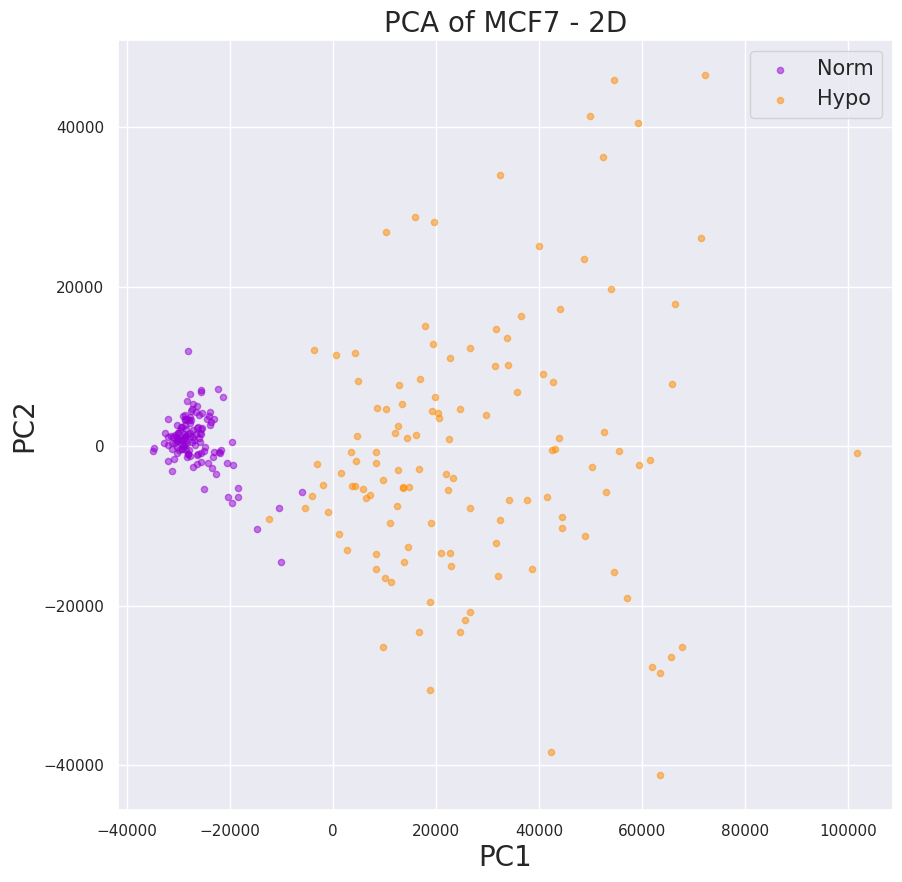

In [ ]:
plt.figure()
plt.figure(figsize=(10,10))
plt.xlabel('PC1', fontsize=20)
plt.ylabel('PC2', fontsize=20)
plt.title('PCA of MCF7 - 2D', fontsize=20)
targets = ['Norm', 'Hypo']
colors = ['darkviolet', 'darkorange']
for target, color in zip(targets, colors):
    indices = np.where(data_MCF7_merged['Condition'] == target)
    plt.scatter(data_MCF7_pca_2D.loc[indices, 'PC1'], data_MCF7_pca_2D.loc[indices, 'PC2'], color=color, alpha=0.5, s=20)
plt.legend(targets, prop={'size': 15})
plt.show()

This simple plot already provides us with some interesting information: apparently, the cells in norm conditions all have negative PC1 and are much less spread then cells in hypoxia.

In [ ]:
pca_MCF7_3 = PCA(n_components=3)
pca_MCF7_3D = pca_MCF7_3.fit_transform(data_MCF7)
data_MCF7_pca_3D = pd.DataFrame(data=pca_MCF7_3D, columns=['PC1', 'PC2', 'PC3'])
data_MCF7_pca_3D.head()

,PC1,PC2,PC3
0,-26874.672396,766.013957,-880.248212
1,-26354.743000,5039.849020,-5372.826810
2,-29351.253485,2414.726753,-3076.254097
3,-24813.833293,-75.979072,-3934.877134
4,4454.732179,-1836.273354,-1595.912695


In [ ]:
print('Explained variance per principal component: {}'.format(pca_MCF7_3.explained_variance_ratio_))

Explained variance per principal component: [0.6344835  0.09107496 0.06270155]


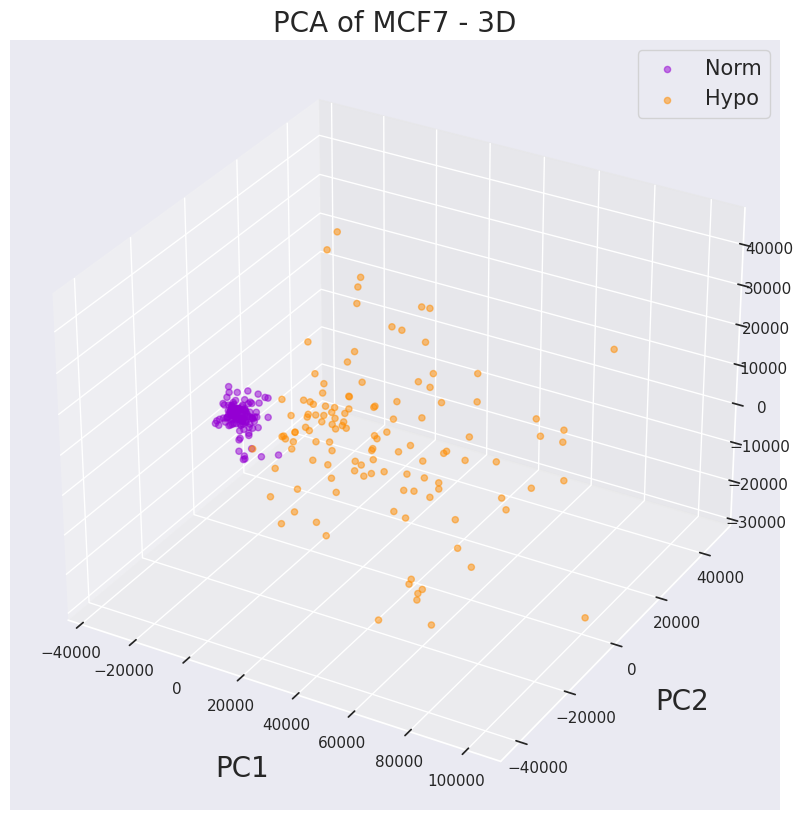

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('PC1', fontsize=20, labelpad=20)
ax.set_ylabel('PC2', fontsize=20, labelpad=20)
ax.set_zlabel('PC3', fontsize=20, labelpad=20)
ax.set_title('PCA of MCF7 - 3D', fontsize=20)
targets = ['Norm', 'Hypo']
colors = ['darkviolet', 'darkorange']
for target, color in zip(targets, colors):
    indices = np.where(data_MCF7_merged['Condition'] == target)
    ax.scatter(data_MCF7_pca_3D.loc[indices, 'PC1'], data_MCF7_pca_3D.loc[indices, 'PC2'], data_MCF7_pca_3D.loc[indices, 'PC3'], color=color, alpha=0.5, s=20)
plt.legend(targets, prop={'size': 15})
plt.show()

This 3D plot seems to confirm our previous observation: norm cells seem to stick closer together, while hypo cells are more spread apart.

#### HCC1806 - SmartSeq

Now we move on to perform a principal component analysis for the other dataset as well. We will proceed by following the same steps as before, highlighting specific results and differences between the two dataframes.

In [ ]:
data_HCC1806 = df_HCC1806_S_F_N.T

In [ ]:
pca_HCC1806 = PCA(n_components=0.95)
df_HCC1806_pca95 = pca_HCC1806.fit_transform(data_HCC1806)
print("Number of Components:", pca_HCC1806.n_components_)
print(f"Explained Variance: {format(pca_HCC1806.explained_variance_ratio_)}")

Number of Components: 34
Explained Variance: [0.29018923 0.18101256 0.12288734 0.07970126 0.04956884 0.03640102
 0.02737402 0.02113149 0.01743474 0.01317286 0.01208516 0.0111941
 0.00880007 0.00783661 0.00748447 0.00693555 0.00579659 0.00509238
 0.00467221 0.00422117 0.00399608 0.00383594 0.00365575 0.00342266
 0.00304432 0.00285331 0.00257095 0.00235782 0.0022066  0.00215775
 0.00209672 0.00204413 0.00186566 0.00174111]


The HCC1806 data have 35 PCs instead of 20. Let's check their explained variance.

In [ ]:
cumsum_eigenvalues_HCC1806 = np.cumsum(pca_HCC1806.explained_variance_ratio_)
explained_var_ratio_HCC1806 = pca_HCC1806.explained_variance_ratio_

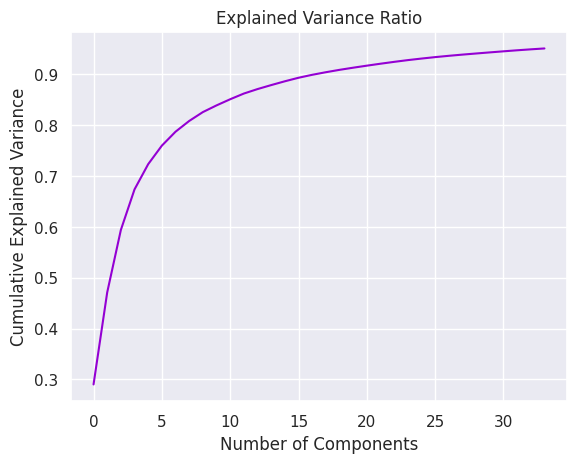

In [ ]:
plt.plot(np.cumsum(pca_HCC1806.explained_variance_ratio_), color='darkviolet')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance Ratio')
plt.show()

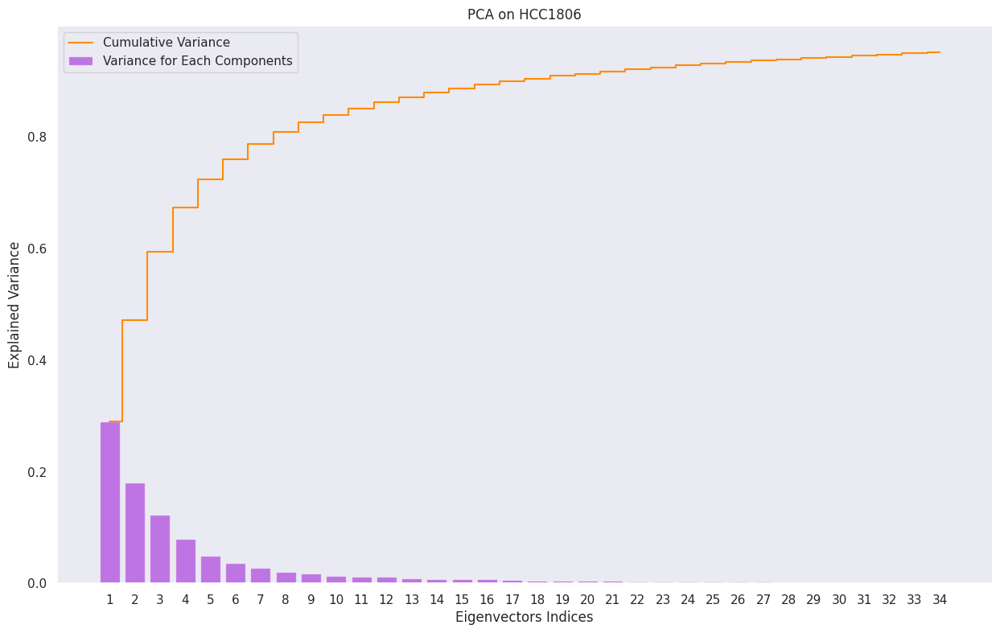

In [ ]:
plt.figure(figsize=(15,9))
plt.bar(range(0,len(explained_var_ratio_HCC1806)), explained_var_ratio_HCC1806, alpha=0.5, align='center', label='Variance for Each Components',color='darkviolet')
plt.step(range(0,len(cumsum_eigenvalues_HCC1806)), cumsum_eigenvalues_HCC1806, where='mid',label='Cumulative Variance', color='darkorange')
plt.ylabel('Explained Variance')
plt.xlabel('Eigenvectors Indices')
plt.legend(loc='best', frameon=True)
plt.title("PCA on HCC1806")
plt.grid(visible=False)
plt.xticks([i for i in range(len(pca_HCC1806.explained_variance_ratio_))], [i+1 for i in range(len(pca_HCC1806.explained_variance_ratio_))])
plt.show()

Also for the HCC1806 experiment, the first component explaines most of the variance. However, in this case it is accountable for approximately 30% of the total variance, and the second and third components are much more significant than in MCF7.

In [ ]:
data_HCC1806.index = df_HCC1806_S_F_N.T.index.str[1:-1]
data_HCC1806

,"""DDIT4""","""ANGPTL4""","""CALML5""","""KRT14""","""CCNB1""","""IGFBP3""","""AKR1C2""","""KRT6A""","""NDRG1""","""KRT4""",...,"""MST1R""","""ZYG11A""","""NRG1""","""RBMS3""","""VCPIP1""","""LINC02693""","""OR8B9P""","""NEAT1""","""ZDHHC23""","""ODAD2"""
output.STAR.PCRPlate1G12_Normoxia_S32_Aligned.sortedByCoord.out.bam,0,48,0,321,298,82,6250,634,0,0,...,78,10,136,0,0,29,0,29,0,0
output.STAR.PCRPlate1G1_Hypoxia_S102_Aligned.sortedByCoord.out.bam,8739,2101,55,96,1824,1938,62,0,522,413,...,279,0,264,0,134,68,0,213,0,0
output.STAR.PCRPlate1G2_Hypoxia_S2_Aligned.sortedByCoord.out.bam,13098,14032,0,0,1616,247,430,907,348,0,...,311,0,38,0,0,0,0,92,0,0
output.STAR.PCRPlate1G3_Hypoxia_S7_Aligned.sortedByCoord.out.bam,2880,356,0,6211,3,3430,79,1953,592,176,...,125,0,16,0,4,1,0,1,0,0
output.STAR.PCRPlate1G4_Hypoxia_S107_Aligned.sortedByCoord.out.bam,7777,5661,4383,0,145,4618,246,85,206,0,...,268,1,25,0,0,0,0,128,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,79,5,0,2098,554,99,798,4211,64,0,...,11,0,264,0,10,34,0,24,0,0
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,167,1,0,27,3585,134,3,596,11,0,...,251,0,120,25,0,53,0,177,53,0
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,10186,3147,0,149,1012,111,716,617,744,0,...,94,0,55,0,157,43,0,113,0,0
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,238,41,2867,814,2207,297,1023,2879,1,0,...,149,0,42,0,26,0,0,13,5,0


In [ ]:
data_HCC1806_merged = pd.concat([data_HCC1806, df_HCC1806_S['Condition']], axis=1, join='inner') #!!!PROBLEM ON MERGING
data_HCC1806_merged

,"""DDIT4""","""ANGPTL4""","""CALML5""","""KRT14""","""CCNB1""","""IGFBP3""","""AKR1C2""","""KRT6A""","""NDRG1""","""KRT4""",...,"""ZYG11A""","""NRG1""","""RBMS3""","""VCPIP1""","""LINC02693""","""OR8B9P""","""NEAT1""","""ZDHHC23""","""ODAD2""",Condition
output.STAR.PCRPlate1G12_Normoxia_S32_Aligned.sortedByCoord.out.bam,0,48,0,321,298,82,6250,634,0,0,...,10,136,0,0,29,0,29,0,0,Normo
output.STAR.PCRPlate1G1_Hypoxia_S102_Aligned.sortedByCoord.out.bam,8739,2101,55,96,1824,1938,62,0,522,413,...,0,264,0,134,68,0,213,0,0,Hypo
output.STAR.PCRPlate1G2_Hypoxia_S2_Aligned.sortedByCoord.out.bam,13098,14032,0,0,1616,247,430,907,348,0,...,0,38,0,0,0,0,92,0,0,Hypo
output.STAR.PCRPlate1G3_Hypoxia_S7_Aligned.sortedByCoord.out.bam,2880,356,0,6211,3,3430,79,1953,592,176,...,0,16,0,4,1,0,1,0,0,Hypo
output.STAR.PCRPlate1G4_Hypoxia_S107_Aligned.sortedByCoord.out.bam,7777,5661,4383,0,145,4618,246,85,206,0,...,1,25,0,0,0,0,128,0,0,Hypo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,79,5,0,2098,554,99,798,4211,64,0,...,0,264,0,10,34,0,24,0,0,Normo
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,167,1,0,27,3585,134,3,596,11,0,...,0,120,25,0,53,0,177,53,0,Normo
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,10186,3147,0,149,1012,111,716,617,744,0,...,0,55,0,157,43,0,113,0,0,Hypo
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,238,41,2867,814,2207,297,1023,2879,1,0,...,0,42,0,26,0,0,13,5,0,Normo


In [ ]:
pca_HCC1806_2 = PCA(n_components=2)
pca_HCC1806_2D = pca_HCC1806_2.fit_transform(data_HCC1806)
data_HCC1806_pca_2D = pd.DataFrame(data=pca_HCC1806_2D, columns=['PC1', 'PC2'])
data_HCC1806_pca_2D.head()

,PC1,PC2
0,12484.174026,-14826.664862
1,-12606.976256,12610.742560
2,-7012.948466,1899.037673
3,-5643.489317,4219.796240
4,19036.152532,9662.303833


In [ ]:
print('Explained variance per principal component: {}'.format(pca_HCC1806_2.explained_variance_ratio_))

Explained variance per principal component: [0.29018923 0.18101256]


As already noticed, now it looks like we have less variance explained if we consider only two variables. Indeed, PC1 holds 29% of the information, PC2 18%.

<Figure size 640x480 with 0 Axes>

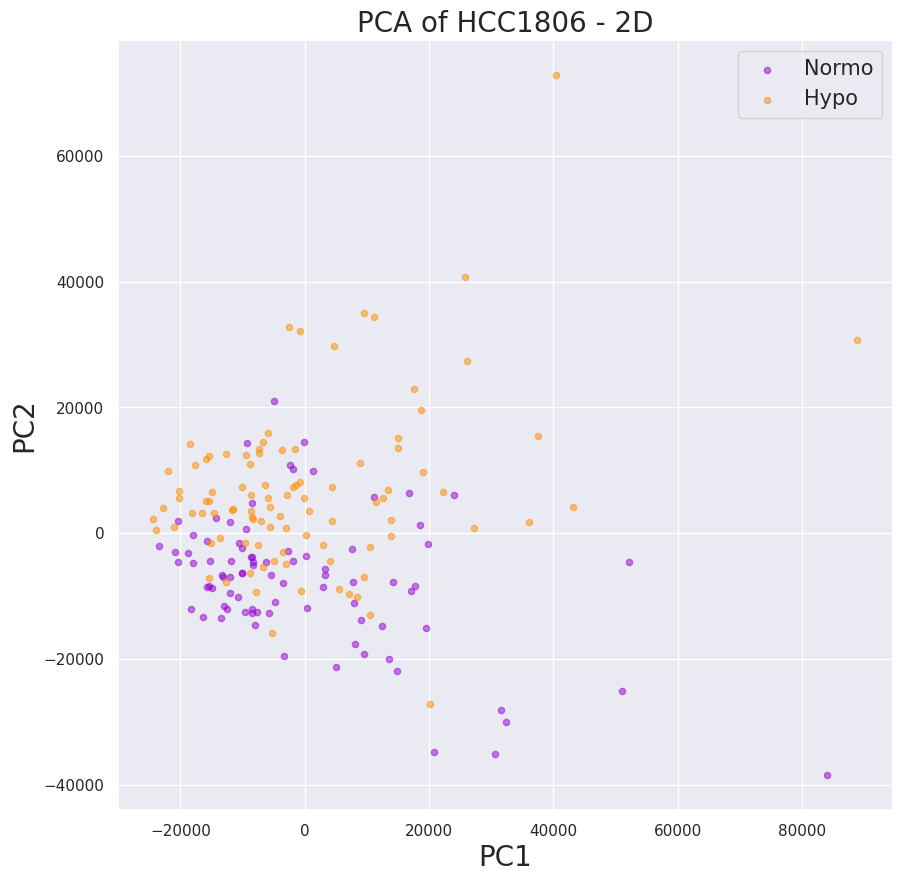

In [ ]:
plt.figure()
plt.figure(figsize=(10,10))
plt.xlabel('PC1', fontsize=20)
plt.ylabel('PC2', fontsize=20)
plt.title('PCA of HCC1806 - 2D', fontsize=20)
targets = ['Normo', 'Hypo']
colors = ['darkviolet', 'darkorange']
for target, color in zip(targets, colors):
    indices = np.where(data_HCC1806_merged['Condition'] == target)
    plt.scatter(data_HCC1806_pca_2D.loc[indices, 'PC1'], data_HCC1806_pca_2D.loc[indices, 'PC2'], color=color, alpha=0.5, s=20)
plt.legend(targets, prop={'size': 15})
plt.show()

Now the pattern does not look as clear as before. We try a 3D visualization to see if it is clearer.

In [ ]:
pca_HCC1806_3 = PCA(n_components=3)
pca_HCC1806_3D = pca_HCC1806_3.fit_transform(data_HCC1806)
data_HCC1806_pca_3D = pd.DataFrame(data=pca_HCC1806_3D, columns=['PC1', 'PC2', 'PC3'])
data_HCC1806_pca_3D.head()

,PC1,PC2,PC3
0,12484.174026,-14826.664862,7360.236985
1,-12606.976256,12610.742561,-3858.152345
2,-7012.948466,1899.037673,-4994.955126
3,-5643.489317,4219.796241,5613.389137
4,19036.152531,9662.303834,-15784.171644


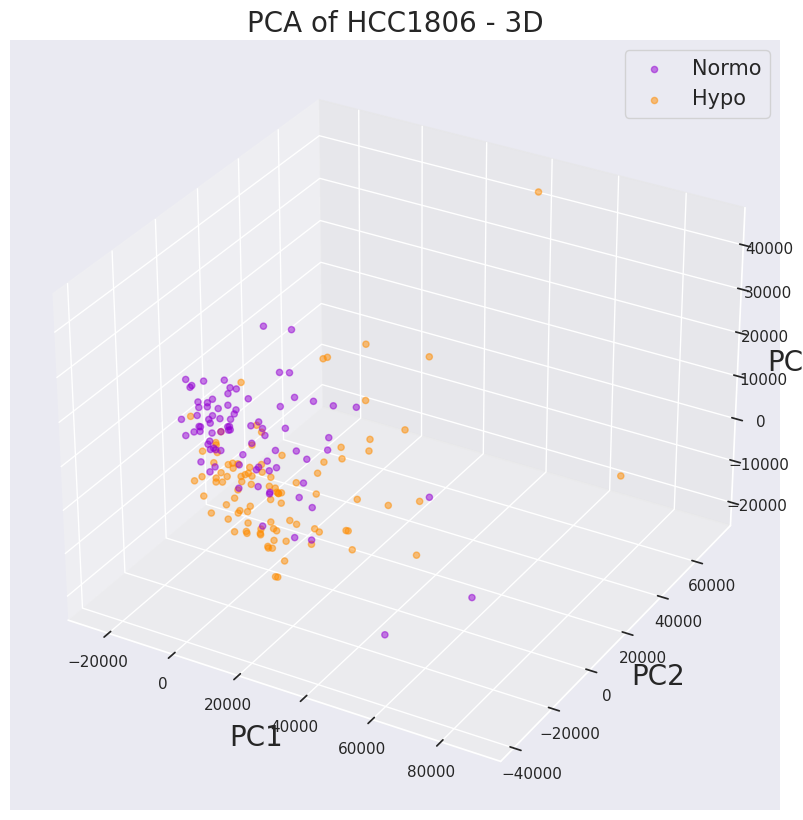

In [ ]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('PC1', fontsize=20)
ax.set_ylabel('PC2', fontsize=20)
ax.set_zlabel('PC3', fontsize=20)
ax.set_title('PCA of HCC1806 - 3D', fontsize=20)
targets = ['Normo', 'Hypo']
colors = ['darkviolet', 'darkorange']
for target, color in zip(targets, colors):
    indices = np.where(data_HCC1806_merged['Condition'] == target)
    ax.scatter(data_HCC1806_pca_3D.loc[indices, 'PC1'], data_HCC1806_pca_3D.loc[indices, 'PC2'], data_HCC1806_pca_3D.loc[indices, 'PC3'], color=color, alpha=0.5, s=20)
plt.legend(targets, prop={'size': 15})
plt.show()

This approach seems to be working, the distinction in 3D is clearer then in 2D, which was expected, for the variance explained by the third PC is 12%, which is not negligible with respect to the variance explained by PC2, which amounts to 18%.

#### MCF7 - DropSeq

Now we move on to perform a principal component analysis for drop datasets as well. We will proceed by following the same steps as before, highlighting specific results and differences between the two dataframes.

In [ ]:
data_MCF7_D = df_MCF7_D_F_N.T

In [ ]:
pca_MCF7D = PCA(n_components=0.95)
df_MCF7D_pca95 = pca_MCF7D.fit_transform(data_MCF7_D)
print("Number of Components:", pca_MCF7D.n_components_)
print(f"Explained Variance: {format(pca_MCF7D.explained_variance_ratio_)}")

Number of Components: 761
Explained Variance: [2.49484717e-01 8.62724032e-02 4.43335965e-02 2.62755428e-02
 2.12800016e-02 1.41762832e-02 1.30208701e-02 1.01788159e-02
 9.22151861e-03 8.48443923e-03 8.21781215e-03 7.32529852e-03
 7.14501512e-03 6.65567257e-03 6.22033436e-03 5.95017635e-03
 5.85730768e-03 5.57005279e-03 5.24990682e-03 4.90466457e-03
 4.68277347e-03 4.51194458e-03 4.46673750e-03 4.38467966e-03
 4.30293124e-03 4.20941955e-03 4.00442991e-03 3.99223921e-03
 3.94580856e-03 3.85397524e-03 3.80026121e-03 3.76025664e-03
 3.69906797e-03 3.64845214e-03 3.58044388e-03 3.50911948e-03
 3.39405874e-03 3.29360252e-03 3.26490619e-03 3.17336975e-03
 3.13404051e-03 3.06714254e-03 2.87340239e-03 2.84222253e-03
 2.80010276e-03 2.74698014e-03 2.74076757e-03 2.69342243e-03
 2.67351183e-03 2.59394388e-03 2.53954228e-03 2.46208935e-03
 2.40801047e-03 2.39567615e-03 2.36770430e-03 2.31716696e-03
 2.27694749e-03 2.24593399e-03 2.21148198e-03 2.20159415e-03
 2.17054781e-03 2.15390948e-03 2.137554

We may see how much explained variance increses with the number of components, and also how much information each component adds up to the total explained variance.

In [ ]:
cumsum_eigenvalues_MCF7D = np.cumsum(pca_MCF7D.explained_variance_ratio_)
explained_var_ratio_MCF7D = pca_MCF7D.explained_variance_ratio_

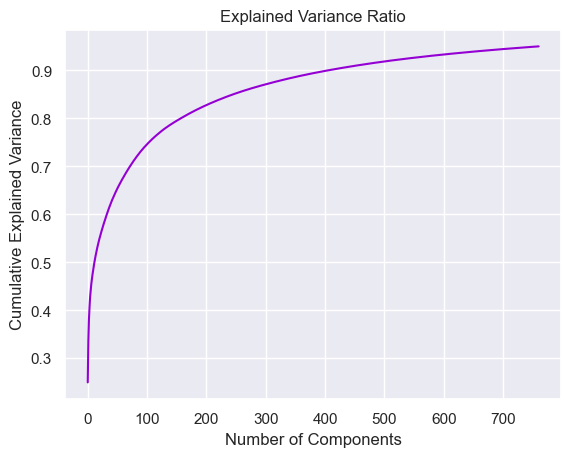

In [ ]:
plt.plot(cumsum_eigenvalues_MCF7D, color='darkviolet')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance Ratio')
plt.show()

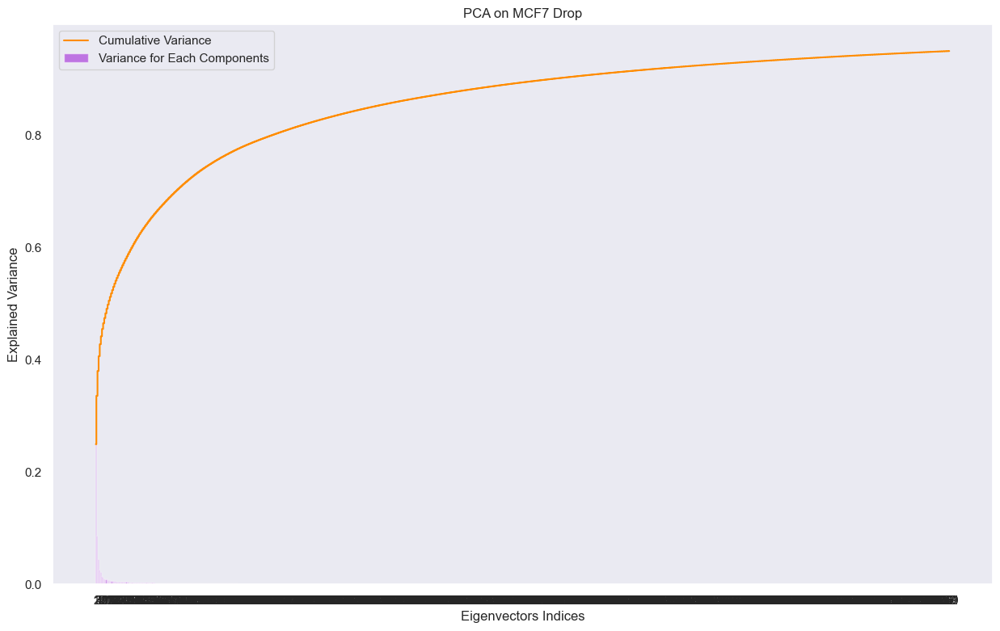

In [ ]:
plt.figure(figsize=(15,9))
plt.bar(range(0,len(explained_var_ratio_MCF7D)), explained_var_ratio_MCF7D, alpha=0.5, align='center', label='Variance for Each Components',color='darkviolet')
plt.step(range(0,len(cumsum_eigenvalues_MCF7D)), cumsum_eigenvalues_MCF7D, where='mid',label='Cumulative Variance', color='darkorange')
plt.ylabel('Explained Variance')
plt.xlabel('Eigenvectors Indices')
plt.legend(loc='best', frameon=True)
plt.title("PCA on MCF7 Drop")
plt.grid(visible=False)
plt.xticks([i for i in range(len(pca_MCF7D.explained_variance_ratio_))], [i+1 for i in range(len(pca_MCF7D.explained_variance_ratio_))])
plt.show()

In [ ]:
data_MCF7D_merged = df_MCF7_D_F_N.T
data_MCF7D_merged['Condition'] = ['Hypoxia' if "Hypo" in index else "Normoxia" for index in data_MCF7D_merged.index]
data_MCF7D_merged

,"""MALAT1""","""MT-RNR2""","""NEAT1""","""H1-5""","""TFF1""","""MT-RNR1""","""H4C3""","""GDF15""","""KRT81""","""MT-CO3""",...,"""SKIDA1""","""MICALL1""","""RARG""","""MYO1F""","""BRWD1-AS2""","""RPS19BP1""","""AUNIP""","""TNK2""","""SUDS3""",Condition
"""AAAAACCTATCG_Normoxia""",1,0,0,0,4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Normoxia
"""AAAACAACCCTA_Normoxia""",3,0,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,Normoxia
"""AAAACACTCTCA_Normoxia""",3,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Normoxia
"""AAAACCAGGCAC_Normoxia""",6,2,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,Normoxia
"""AAAACCTAGCTC_Normoxia""",4,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,Normoxia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"""TTTTCGCGTAGA_Hypoxia""",0,0,0,0,3,0,7,0,0,0,...,0,0,0,0,0,0,0,0,0,Hypoxia
"""TTTTCGTCCGCT_Hypoxia""",1,0,0,0,4,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,Hypoxia
"""TTTTCTCCGGCT_Hypoxia""",0,0,0,1,2,0,4,0,0,0,...,0,0,0,0,0,0,0,0,1,Hypoxia
"""TTTTGTTCAAAG_Hypoxia""",0,0,0,0,6,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Hypoxia


In [ ]:
pca_MCF7D_2 = PCA(n_components=2)
pca_MCF7D_2D = pca_MCF7D_2.fit_transform(data_MCF7_D)
data_MCF7D_pca_2D = pd.DataFrame(data=pca_MCF7D_2D, columns=['PC1', 'PC2'])
data_MCF7D_pca_2D.head()

,PC1,PC2
0,-2.429843,-0.939195
1,0.051804,-1.966959
2,0.150210,-2.236822
3,3.458502,-2.619389
4,1.832195,-3.690200


In [ ]:
print('Explained variance per principal component: {}'.format(pca_MCF7D_2.explained_variance_ratio_))

Explained variance per principal component: [0.24948472 0.0862724 ]


First principal component explains about 25% of information, second principal component only 8%.

We use PCA with 2 and 3 principal components to visualize the data.

<Figure size 640x480 with 0 Axes>

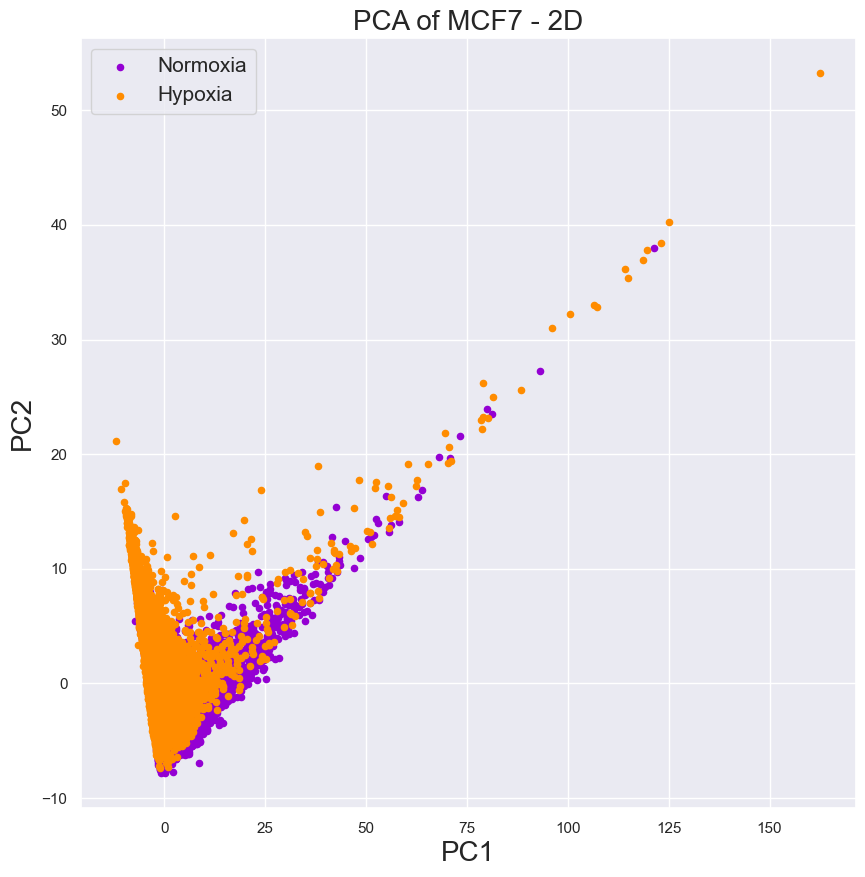

In [ ]:
plt.figure()
plt.figure(figsize=(10,10))
plt.xlabel('PC1', fontsize=20)
plt.ylabel('PC2', fontsize=20)
plt.title('PCA of MCF7 - 2D', fontsize=20)
targets = ['Normoxia', 'Hypoxia']
colors = ['darkviolet', 'darkorange']
for target, color in zip(targets, colors):
    indices = np.where(data_MCF7D_merged['Condition'] == target)
    plt.scatter(data_MCF7D_pca_2D.loc[indices, 'PC1'], data_MCF7D_pca_2D.loc[indices, 'PC2'], color=color, s=20)
plt.legend(targets, prop={'size': 15})
plt.show()

In [ ]:
pca_MCF7D_3 = PCA(n_components=3)
pca_MCF7D_3D = pca_MCF7D_3.fit_transform(data_MCF7_D)
data_MCF7D_pca_3D = pd.DataFrame(data=pca_MCF7D_3D, columns=['PC1', 'PC2', 'PC3'])
data_MCF7D_pca_3D.head()

,PC1,PC2,PC3
0,-2.429843,-0.939195,-0.771420
1,0.051804,-1.966959,0.602203
2,0.150210,-2.236822,2.892320
3,3.458502,-2.619389,2.491507
4,1.832195,-3.690200,-0.016163


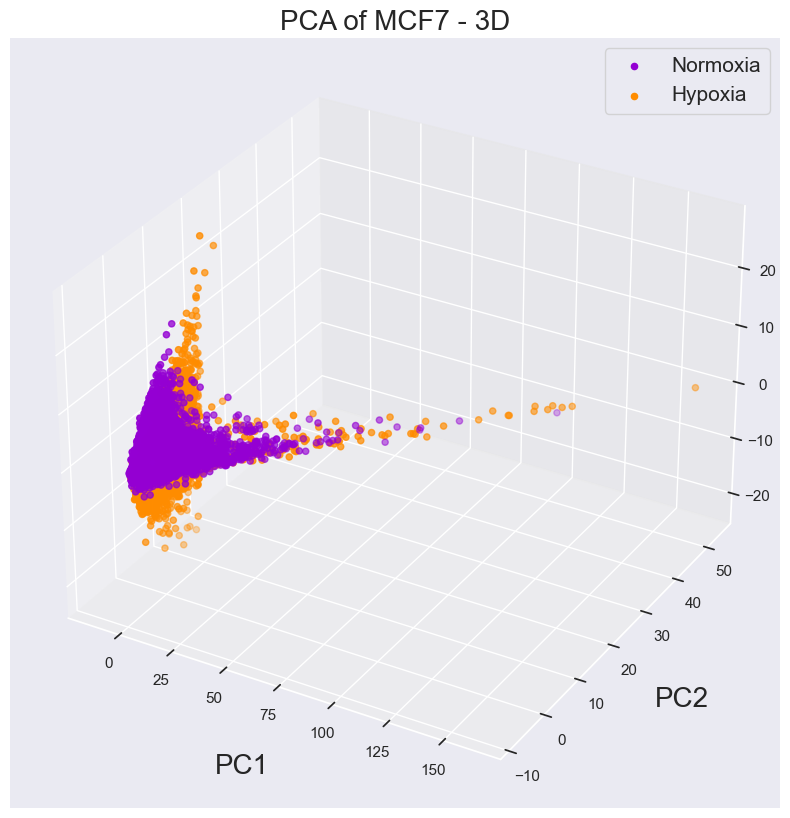

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('PC1', fontsize=20, labelpad=20)
ax.set_ylabel('PC2', fontsize=20, labelpad=20)
ax.set_zlabel('PC3', fontsize=20, labelpad=20)
ax.set_title('PCA of MCF7 - 3D', fontsize=20)
targets = ['Normoxia', 'Hypoxia']
colors = ['darkviolet', 'darkorange']
for target, color in zip(targets, colors):
    indices = np.where(data_MCF7D_merged['Condition'] == target)
    ax.scatter(data_MCF7D_pca_3D.loc[indices, 'PC1'], data_MCF7D_pca_3D.loc[indices, 'PC2'], data_MCF7D_pca_3D.loc[indices, 'PC3'], color=color, s=20)
plt.legend(targets, prop={'size': 15})
plt.show()

#### HCC1806 - DropSeq

Now we move on to perform principal component analysis for the other drop dataset as well.

In [ ]:
data_HCC1806D = df_HCC1806_D_F_N.T

In [ ]:
pca_HCC1806D = PCA(n_components=0.95)
df_HCC1806D_pca95 = pca_HCC1806D.fit_transform(data_HCC1806D)
print("Number of Components:", pca_HCC1806D.n_components_)
print(f"Explained Variance: {format(pca_HCC1806D.explained_variance_ratio_)}")

Number of Components: 844
Explained Variance: [8.42324280e-02 6.31606719e-02 3.88313939e-02 2.86625432e-02
 2.37918611e-02 2.15674691e-02 1.67483247e-02 1.48044703e-02
 1.43919415e-02 1.25207503e-02 1.15350858e-02 1.14281083e-02
 9.88305907e-03 9.50755387e-03 9.21652544e-03 8.59572942e-03
 8.06758779e-03 7.51640737e-03 7.28384250e-03 7.18463401e-03
 6.83072434e-03 6.31045086e-03 6.20457846e-03 5.82192410e-03
 5.70198427e-03 5.61458438e-03 5.56278485e-03 5.47274062e-03
 5.40164381e-03 5.26731478e-03 5.15247523e-03 5.05828474e-03
 4.89218322e-03 4.80799238e-03 4.64190243e-03 4.48433305e-03
 4.34550137e-03 4.28534754e-03 4.20440217e-03 4.13014216e-03
 4.08767041e-03 3.98559741e-03 3.96802982e-03 3.85912962e-03
 3.78022562e-03 3.76009057e-03 3.71756536e-03 3.70153449e-03
 3.65176143e-03 3.63078875e-03 3.60673066e-03 3.53271433e-03
 3.49510187e-03 3.46628428e-03 3.43581161e-03 3.40106285e-03
 3.37809618e-03 3.32508318e-03 3.31241109e-03 3.21526749e-03
 3.19289994e-03 3.13546967e-03 3.087782

In [ ]:
cumsum_eigenvalues_HCC1806D = np.cumsum(pca_HCC1806D.explained_variance_ratio_)
explained_var_ratio_HCC1806D = pca_HCC1806D.explained_variance_ratio_

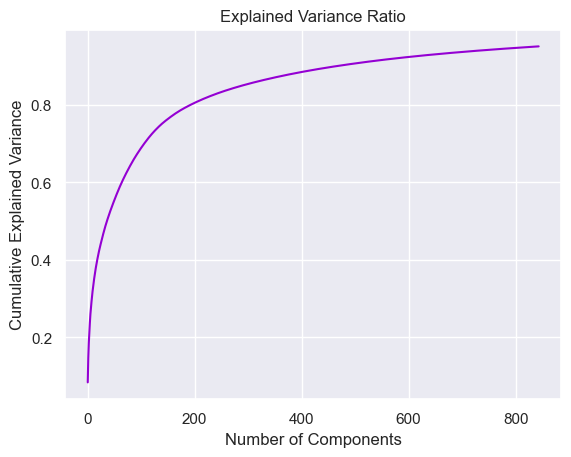

In [ ]:
plt.plot(np.cumsum(pca_HCC1806D.explained_variance_ratio_), color='darkviolet')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance Ratio')
plt.show()

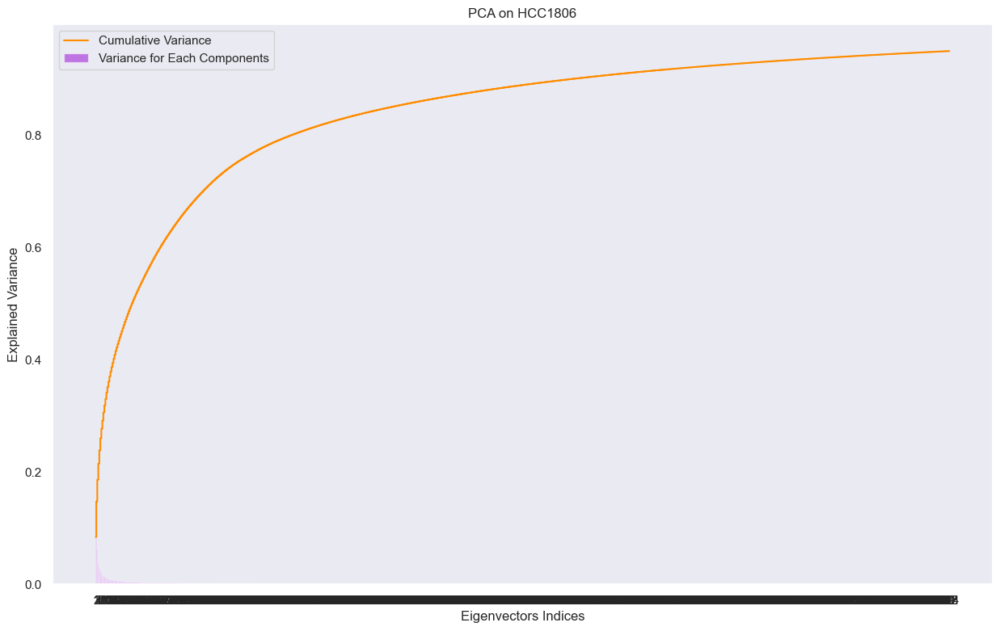

In [ ]:
plt.figure(figsize=(15,9))
plt.bar(range(0,len(explained_var_ratio_HCC1806D)), explained_var_ratio_HCC1806D, alpha=0.5, align='center', label='Variance for Each Components',color='darkviolet')
plt.step(range(0,len(cumsum_eigenvalues_HCC1806D)), cumsum_eigenvalues_HCC1806D, where='mid',label='Cumulative Variance', color='darkorange')
plt.ylabel('Explained Variance')
plt.xlabel('Eigenvectors Indices')
plt.legend(loc='best', frameon=True)
plt.title("PCA on HCC1806")
plt.grid(visible=False)
plt.xticks([i for i in range(len(pca_HCC1806D.explained_variance_ratio_))], [i+1 for i in range(len(pca_HCC1806D.explained_variance_ratio_))])
plt.show()

In [ ]:
data_HCC1806D_merged = df_HCC1806_D_F_N.T
data_HCC1806D_merged['Condition'] = ['Hypoxia' if "Hypo" in index else "Normoxia" for index in data_HCC1806D_merged.index]
data_HCC1806D_merged

,"""H1-5""","""MALAT1""","""MT-RNR2""","""ARVCF""","""BCYRN1""","""ATXN7L2""","""IGFBP3""","""H1-3""","""CTIF""","""RNF123""",...,"""CDKN3""","""DLD""","""PMPCA""","""ZNF165""","""SCCPDH""","""NTAN1""","""CLIP2""","""DUSP23""","""ZNF682""",Condition
"""AAAAAACCCGGC_Normoxia""",2,3,0,0,0,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,Normoxia
"""AAAACCGGATGC_Normoxia""",2,3,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Normoxia
"""AAAACGAGCTAG_Normoxia""",5,2,0,0,1,0,1,3,0,0,...,0,0,0,0,0,0,0,0,0,Normoxia
"""AAAACTTCCCCG_Normoxia""",1,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Normoxia
"""AAAAGCCTACCC_Normoxia""",0,12,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Normoxia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"""TTTTTACCAATC_Hypoxia""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Hypoxia
"""TTTTTCCGTGCA_Hypoxia""",0,4,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Hypoxia
"""TTTTTGCCTGGG_Hypoxia""",0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Hypoxia
"""TTTTTGTAACAG_Hypoxia""",3,3,1,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,Hypoxia


In [ ]:
pca_HCC1806D_2 = PCA(n_components=2)
pca_HCC1806D_2D = pca_HCC1806D_2.fit_transform(data_HCC1806D)
data_HCC1806D_pca_2D = pd.DataFrame(data=pca_HCC1806D_2D, columns=['PC1', 'PC2'])
data_HCC1806D_pca_2D.head()

,PC1,PC2
0,5.621087,-0.864559
1,-1.926516,4.207505
2,1.333853,3.897914
3,4.694903,-1.233716
4,5.909635,-1.314043


In [ ]:
print('Explained variance per principal component: {}'.format(pca_HCC1806D_2.explained_variance_ratio_))

Explained variance per principal component: [0.08423243 0.06316067]


Now the two first principal component carry less information: about 8% and 6%.

We use PCA with 2 and 3 principal components to visualize the data.

<Figure size 640x480 with 0 Axes>

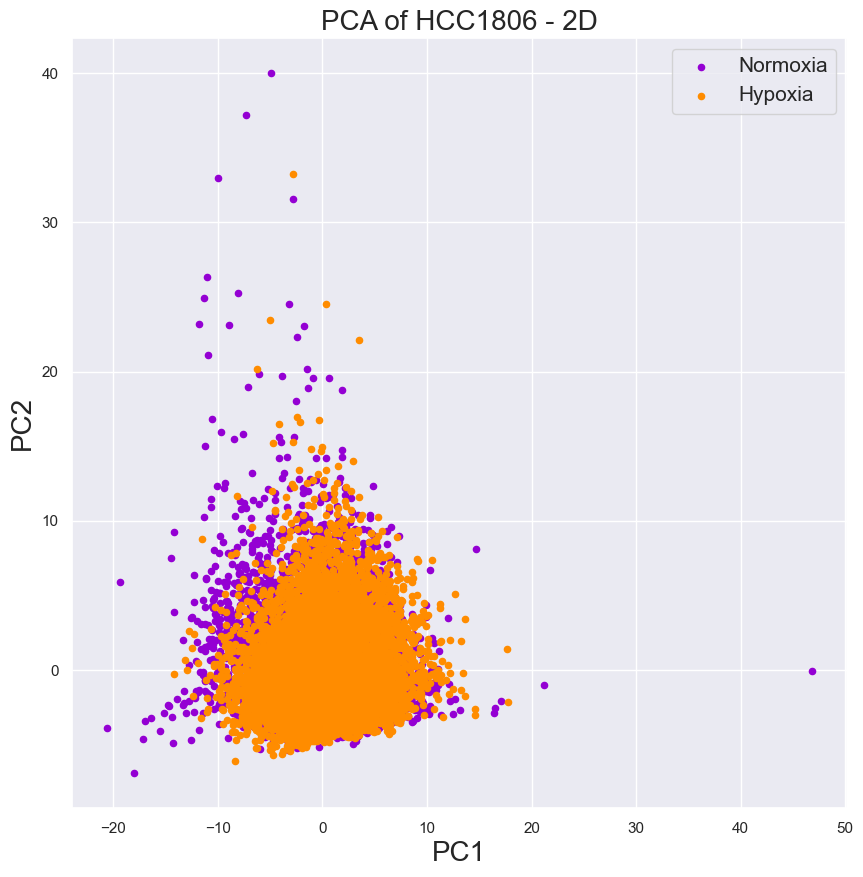

In [ ]:
plt.figure()
plt.figure(figsize=(10,10))
plt.xlabel('PC1', fontsize=20)
plt.ylabel('PC2', fontsize=20)
plt.title('PCA of HCC1806 - 2D', fontsize=20)
targets = ['Normoxia', 'Hypoxia']
colors = ['darkviolet', 'darkorange']
for target, color in zip(targets, colors):
    indices = np.where(data_HCC1806D_merged['Condition'] == target)
    plt.scatter(data_HCC1806D_pca_2D.loc[indices, 'PC1'], data_HCC1806D_pca_2D.loc[indices, 'PC2'], color=color, s=20)
plt.legend(targets, prop={'size': 15})
plt.show()

In [ ]:
pca_HCC1806D_3 = PCA(n_components=3)
pca_HCC1806D_3D = pca_HCC1806D_3.fit_transform(data_HCC1806D)
data_HCC1806D_pca_3D = pd.DataFrame(data=pca_HCC1806D_3D, columns=['PC1', 'PC2', 'PC3'])
data_HCC1806D_pca_3D.head()

,PC1,PC2,PC3
0,5.621087,-0.864566,-0.792472
1,-1.926515,4.207504,2.688841
2,1.333853,3.897911,-0.789105
3,4.694902,-1.233716,-0.562764
4,5.909634,-1.314038,8.939282


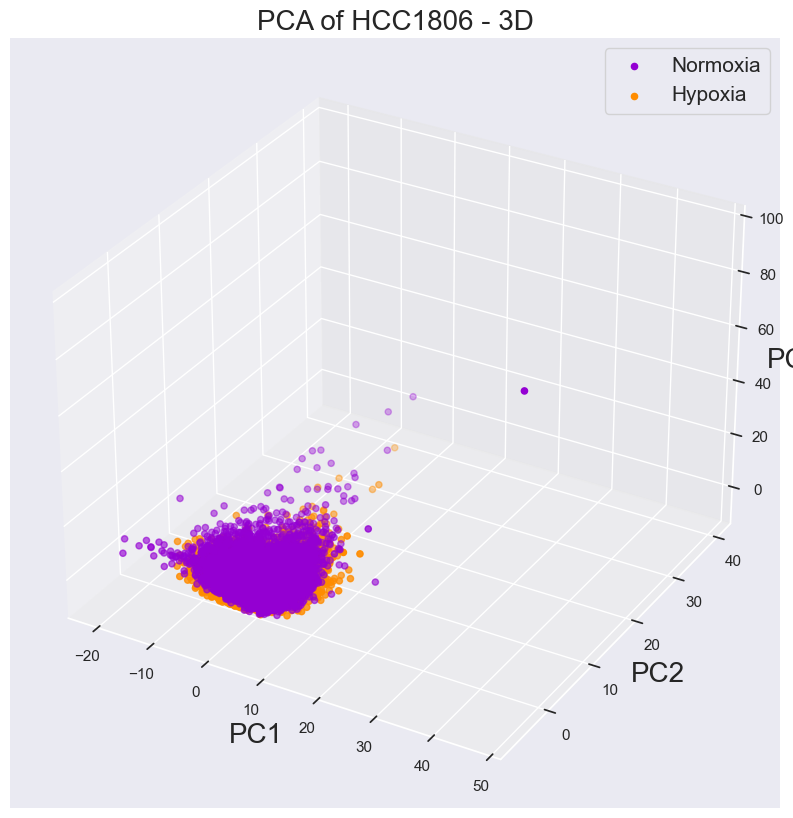

In [ ]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('PC1', fontsize=20)
ax.set_ylabel('PC2', fontsize=20)
ax.set_zlabel('PC3', fontsize=20)
ax.set_title('PCA of HCC1806 - 3D', fontsize=20)
targets = ['Normoxia', 'Hypoxia']
colors = ['darkviolet', 'darkorange']
for target, color in zip(targets, colors):
    indices = np.where(data_HCC1806D_merged['Condition'] == target)
    ax.scatter(data_HCC1806D_pca_3D.loc[indices, 'PC1'], data_HCC1806D_pca_3D.loc[indices, 'PC2'], data_HCC1806D_pca_3D.loc[indices, 'PC3'], color=color, s=20)
plt.legend(targets, prop={'size': 15})
plt.show()

PCA seems to be much more effective for the Smart datasets. We need for those less a significantly smaller number of principal components and the information held by them is also higher compared to the Drop datasets.

### CLUSTERING

Our aim is to perform the clustering; we will both deal with a more general (k-means algorithm) and a more accurate one (UMAP).

#### K-means algorithm

The first approach we chose to experiment with is the K-means algorithm, a widely implemented clustering algorithm used in ML and data analysis. After assigning the centroids, it iterates over the datapoints to adjust the centroids as to minimize the sum of squared distances. \
Since K-means is a parametric algorithm, it means that it needs the number of clusters to find beforehand. We have chosen to check what is the optimal number of clusters beforehand using elbow method.

For the K-Means Clustering section we will proceed as follows: \
- Preparing the data;
- Checking the optimal number of clusters using elbow method;
- Running the K-Means algorithm;
- Interpreting the results.

For data preparation, we will use the PCA already computed in the  section above. \


As previously mentioned, we use a specific technique called "Elbow method", which consists in plotting the within-cluster sum of squares (WCSS) against the number of clusters and looking for the “elbow point” in the graph, which is the point of inflection or bending in the curve. \
Once we find the optimal number of clusters, we run the K-means algorithm on each dataset and we visualize it both in 2D and 3D in such a way to envision better the plotting. Considering our aim is to detect hypoxia and normoxia in the cells, we would expect the optimal number of clusters to be 2. \

We build a unique function to implement the elbow method and the K-means algorithm in the SmartSeq MCF7 and HCC1806 Datasets.

In [ ]:
def elbow(dataset):
  wcss = []
  for i in range(1,11):
    model = KMeans(n_clusters = i, init = "k-means++", n_init=10)
    model.fit(dataset)
    wcss.append(model.inertia_)
  plt.figure(figsize=(10,6))
  plt.plot(range(1,11), wcss)
  plt.xlabel('Number of clusters')
  plt.ylabel('WCSS')
  plt.title('Elbow method')
  plt.show()

In [ ]:
def kmeans_algorithm(dataset, string, n):
  scaled_data = dataset.T
  pca = PCA(n_components=0.95)
  x_pca = pca.fit_transform(scaled_data)
  kmeans = KMeans(n_clusters=n, init='k-means++', n_init=10)
  clusters = kmeans.fit_predict(scaled_data)
  centroids = kmeans.cluster_centers_
  plt.figure(figsize=(10, 6))
  plt.title(string)
  plt.scatter(x_pca[:, 0], x_pca[:, 1], c=clusters, cmap='viridis', alpha=0.5)
  plt.colorbar(label='Cluster')
  plt.scatter(centroids[:, 0], centroids[:, 1], marker='o', s=200, color='red', label='Centroidi')
  plt.xlabel('First principal component')
  plt.ylabel('Second principal component')
  plt.legend()
  plt.show()

In [ ]:
def kmeans_algorithm_3d(dataset, string):
  scaled_data = dataset.T
  pca = PCA(n_components=3)
  x_pca = pca.fit_transform(scaled_data)
  kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10)
  clusters = kmeans.fit_predict(scaled_data)
  centroids = kmeans.cluster_centers_
  fig = plt.figure(figsize=(20, 8))
  ax = fig.add_subplot(111, projection='3d')
  ax.scatter(x_pca[:, 0], x_pca[:, 1], x_pca[:, 2], c=clusters, cmap='viridis', alpha=0.5)
  ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], marker='o', s=200, color='red', label='Centroids')
  ax.set_xlabel('First principal component')
  ax.set_ylabel('Second principal component')
  ax.set_zlabel('Third principal component')
  ax.set_title(string)
  ax.legend()
  ax.tick_params(axis='x', labelsize=8)
  ax.tick_params(axis='y', labelsize=8)
  ax.tick_params(axis='z', labelsize=8)
  plt.show()

##### MCF7 - SmartSeq

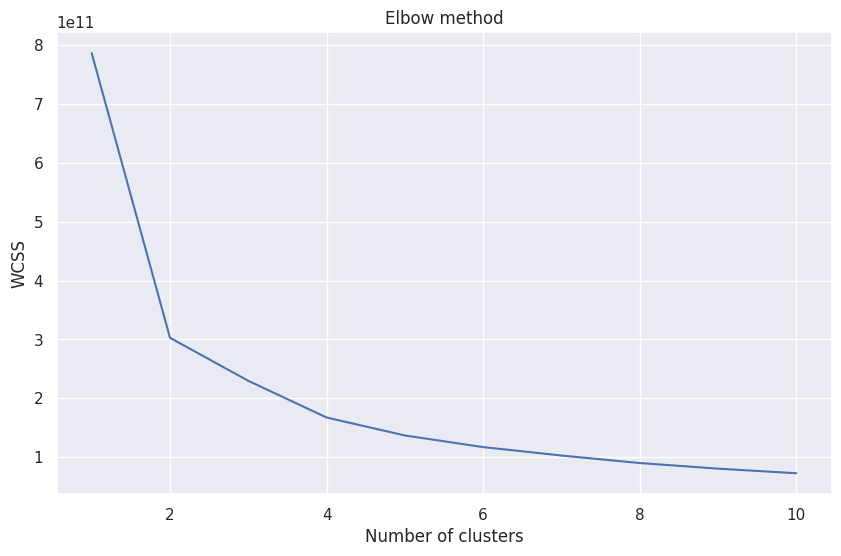

In [ ]:
elbow(df_MCF7_S_F_N)

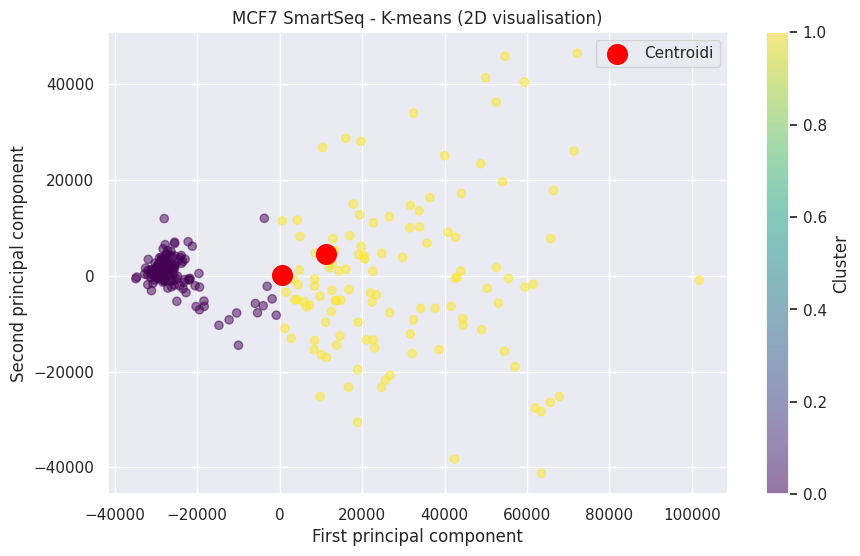

In [ ]:
kmeans_algorithm(df_MCF7_S_F_N, "MCF7 SmartSeq - K-means (2D visualisation)")

When plotting the two clusters generated by K-means alongside the labeled results from PCA, the visual representation shows that K-means separates the two groups based on their oxygen exposure conditions efficiently.

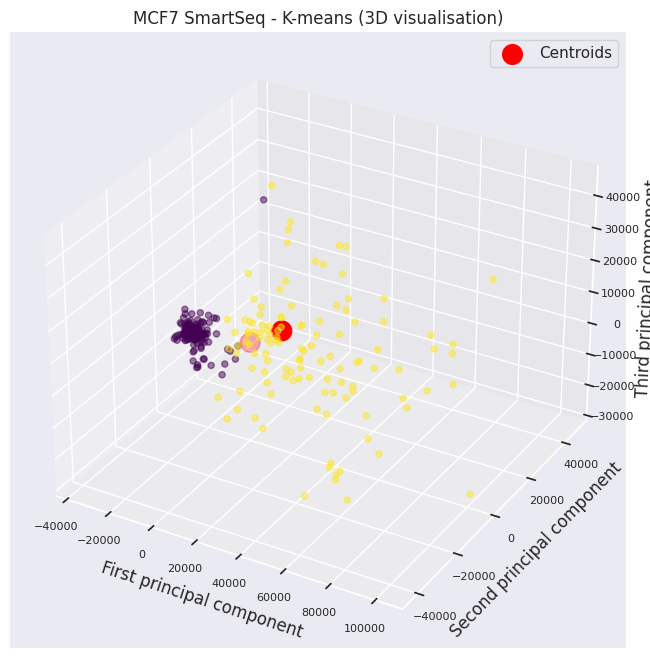

In [ ]:
kmeans_algorithm_3d(df_MCF7_S_F_N, "MCF7 SmartSeq - K-means (3D visualisation)")

##### HCC1806 - SmartSeq

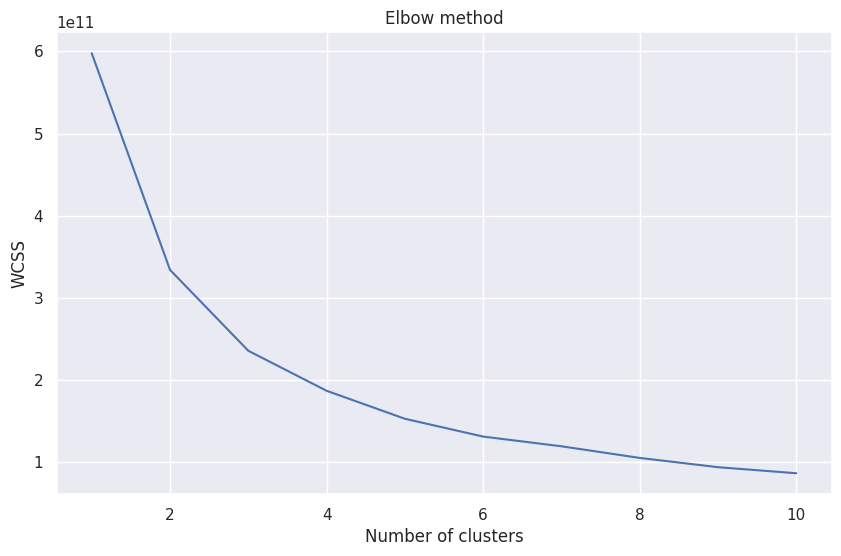

In [ ]:
elbow(df_HCC1806_S_F_N)

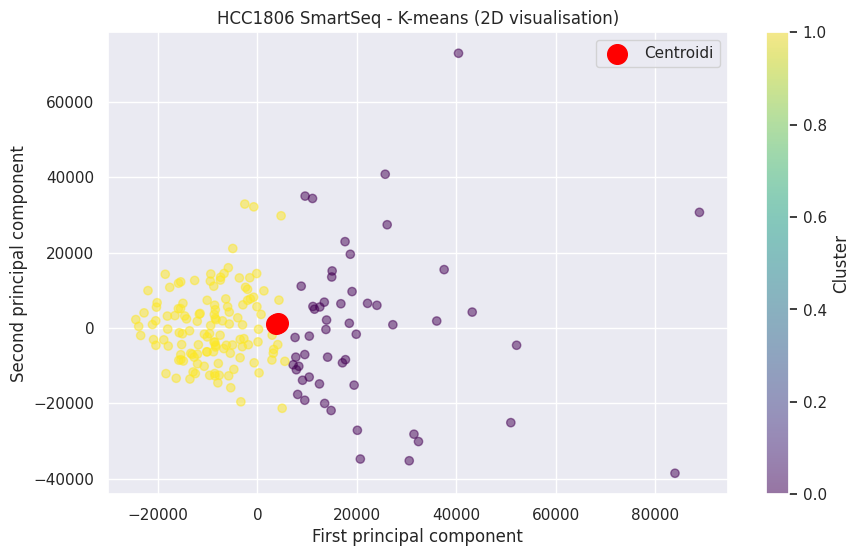

In [ ]:
kmeans_algorithm(df_HCC1806_S_F_N, "HCC1806 SmartSeq - K-means (2D visualisation)", 2)

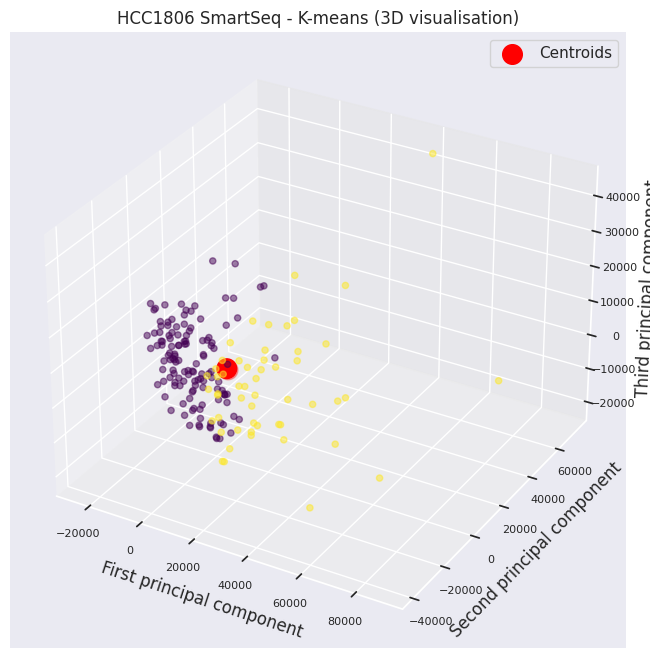

In [ ]:
kmeans_algorithm_3d(df_HCC1806_S_F_N, "HCC1806 SmartSeq - K-means (3D visualisation)", 2)

The HCC1806 K-means clustering seems to be less efficient than the MCF7 one As a matter of fact, the clustering isn't able to properly distinguish between the two classes, as could be expected by looking at the results in the PCA, in which the two groups aren't clearly separable in two distinct areas.

##### MCF7 - DropSeq

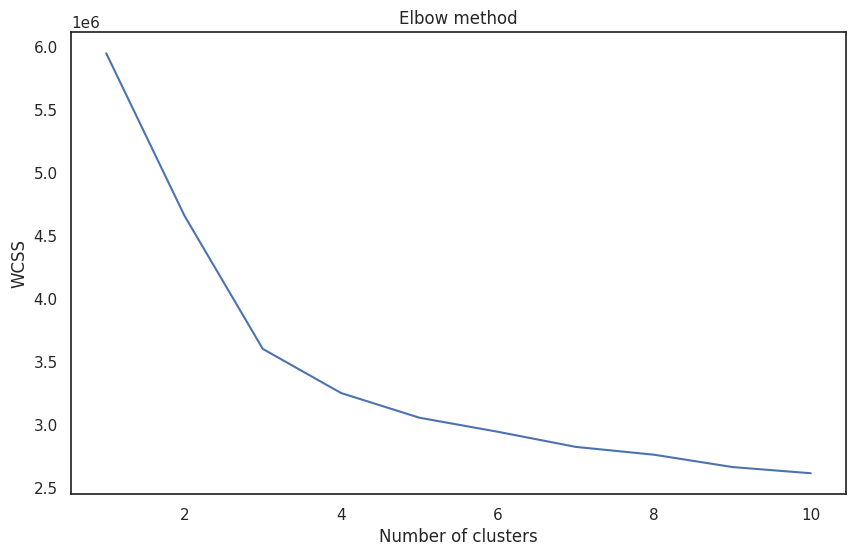

In [ ]:
elbow(df_MCF7_D_F_N)

The Elbow method shows that the optimal number of clusters should be three, instead of two as found before. To be consistent, we run the K-means algorithm with the new optimal number of clusters, but we tried also to plot it with two clusters to check the difference with the Hypoxia/Normoxia plotting done in the previous section.

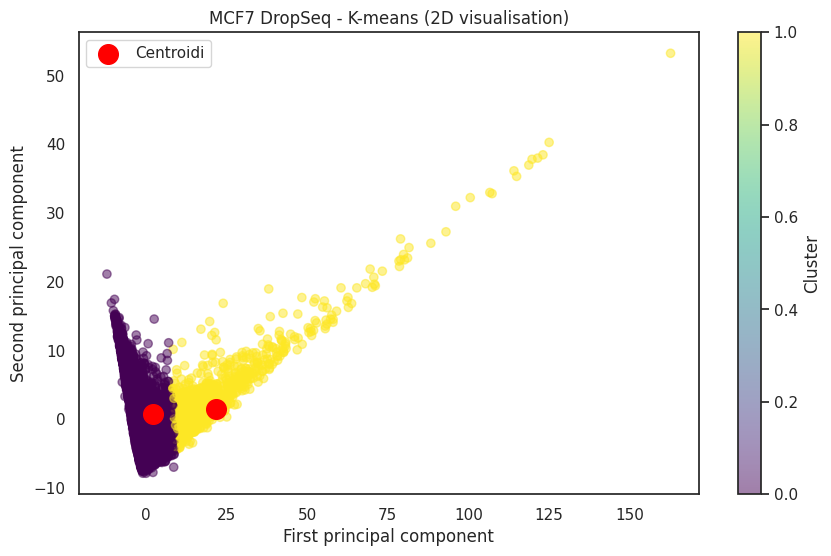

In [ ]:
# Two clusters
kmeans_algorithm(df_MCF7_D_F_N, "MCF7 DropSeq - K-means (2D visualisation)", 2)

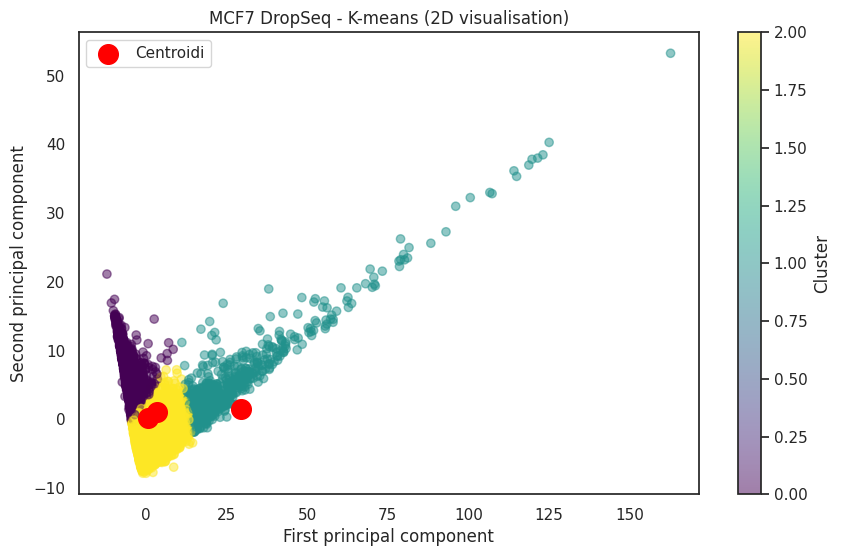

In [ ]:
# Three clusters
kmeans_algorithm(df_MCF7_D_F_N, "MCF7 DropSeq - K-means (2D visualisation)", 3)

##### HCC1806 - DropSeq

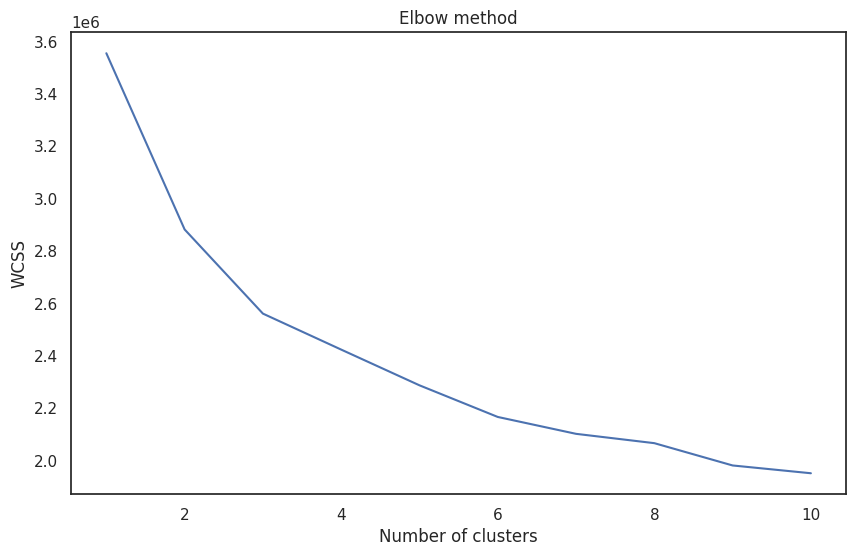

In [ ]:
elbow(df_HCC1806_D_F_N)

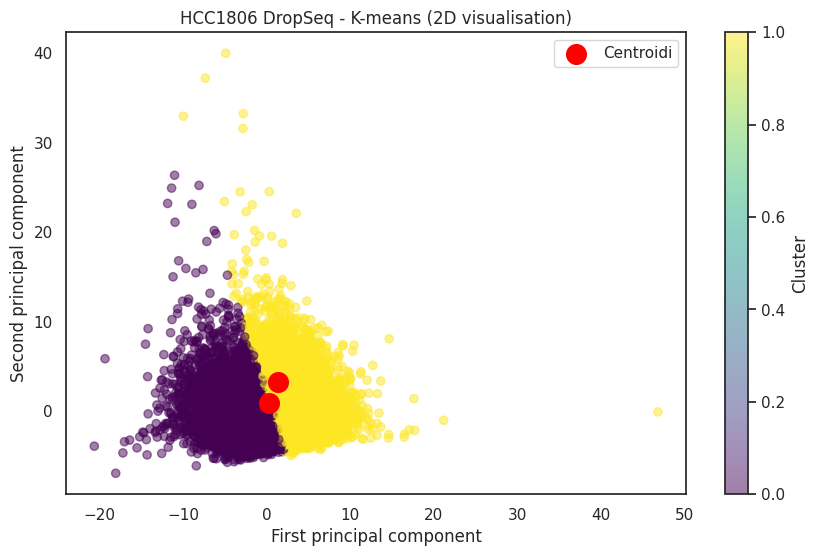

In [ ]:
kmeans_algorithm(df_HCC1806_D_F_N, "HCC1806 DropSeq - K-means (2D visualisation)", 2)

#### Leiden algorithm and UMAP visualisation

To uncover the underlying structure and relationships between individual cells based on their gene expression profiles, we'll combine two techniques: the Leiden algorithm and the UMAP visualisation. The algorithm is a method for community detection in networks and it is useful for identifying clusters within complex networks, such as biological ones. \
Uniform Manifold Approximation and Projection (UMAP) is a dimension reduction technique that can be used to visualize patterns of the clustering already performed thanks to Leiden algorithm. The main difference between UMAP and other similar techniques is that it focuses on local clustering. It means that it doesn't try to find a global structure, but groups similar observation and similar traits instead. \
As a consequence, we obtain a different plot that can lead to a more intuitive understanding of what could be the underlying reasons of the clustering.

In [ ]:
def umap_clustering(dataset):
  adata = sc.read_text(dataset)
  sc.pp.normalize_total(adata, target_sum=1e4)
  sc.pp.log1p(adata)
  adata.raw = adata
  sc.pp.neighbors(adata, n_pcs = 30)
  sc.tl.umap(adata)
  sc.pl.umap(adata)
  sc.tl.leiden(adata, resolution =1.3)
  adata.obs
  sc.pl.umap(adata, color=['leiden'])

##### MCF7 - SmartSeq

         Falling back to preprocessing with `sc.pp.pca` and default params.


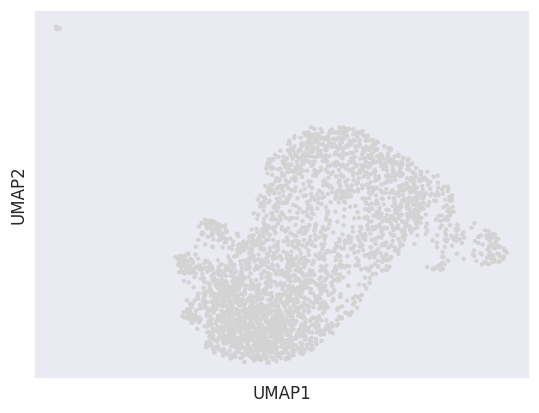

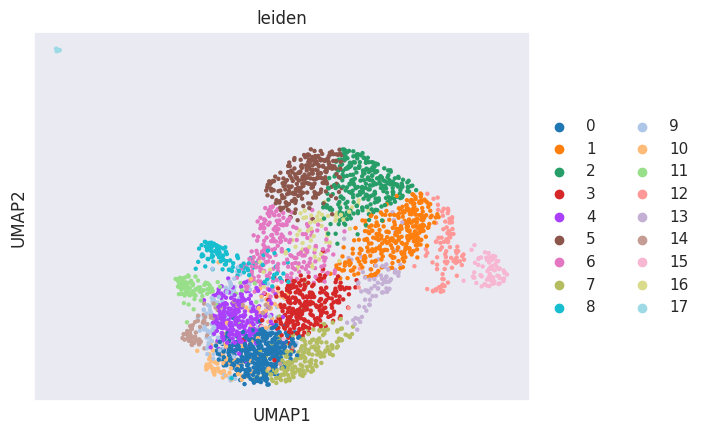

In [ ]:
umap_clustering("/content/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt")

##### HCC1806 - SmartSeq

         Falling back to preprocessing with `sc.pp.pca` and default params.


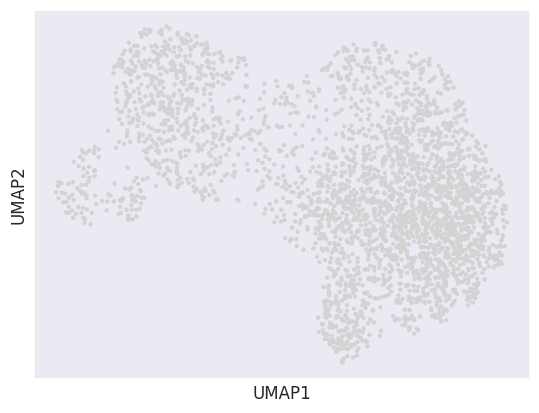

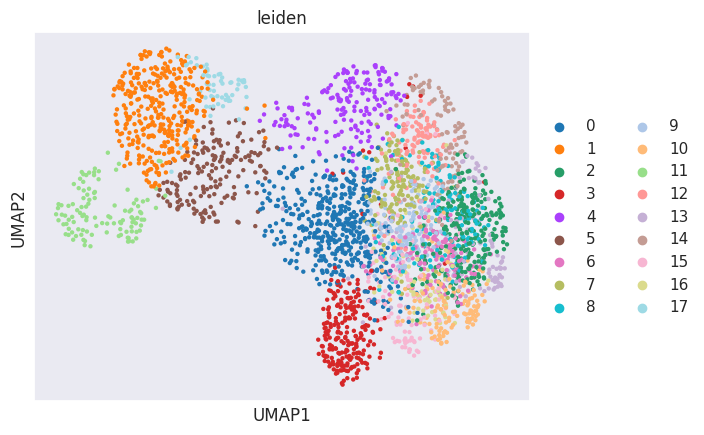

In [ ]:
umap_clustering("/content/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt")

#### Hierarchical Clustering - dendrogram

The last type of clustering we want to try is the hierarchical clustering through dendrogram charts, which is a procedure that attempts to identify relatively homogeneous groups of cases based on selected characteristics. The algorithm consists basically in starting with each single case in a separate cluster and combining clusters until only one is left. \
Looking also at this type of clustering is useful to have an alternative visualisation of the data and to understand better its structure. \
In particular, we focus on four methods: three based on between clusters distance measurements (complete, average and single linkage) and one on minimising the variance between clusters (Ward linkage).

In [ ]:
def generate_dendrogram(dataset, methods):
  fig, ax = plt.subplots(2, 2, figsize=(20, 6))
  sns.set_style("white")
  fig.subplots_adjust(hspace=0.3, wspace=0.3)

  for i, method in enumerate(methods):
    row = i // 2
    col = i % 2
    ax[row][col].set_title(f"Dendrogram using {method} method")
    clusters = shc.linkage(dataset, method=method, metric="euclidean")
    shc.dendrogram(Z=clusters, ax=ax[row][col])
  pca = PCA(n_components=0.95)
  plt.show()

##### MCF7 - SmartSeq

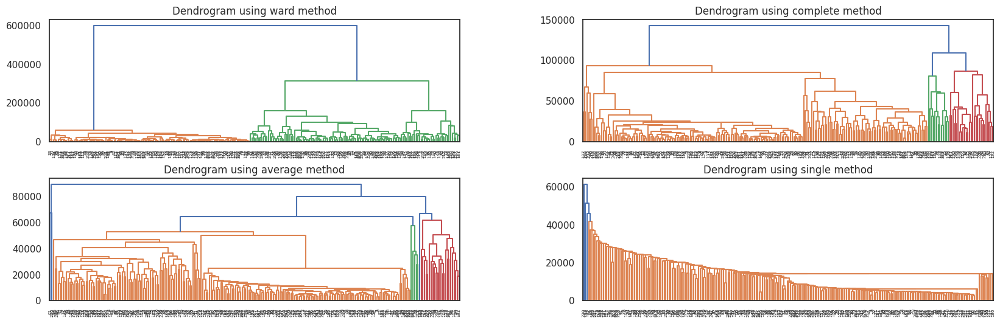

In [ ]:
x_pca = pca.fit_transform(df_MCF7_S_F_N.T)
generate_dendrogram(x_pca, methods=["ward", "complete", "average", "single"])

##### HCC1806 - SmartSeq

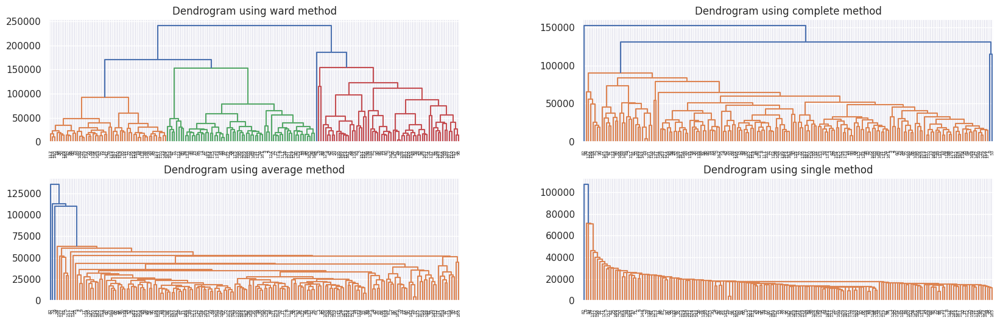

In [ ]:
x_pca = pca.fit_transform(df_HCC1806_S_F_N.T)
generate_dendrogram(x_pca, methods=["ward", "complete", "average", "single"])

## SUPERVISED LEARNING

### PREPARATION OF THE DATA

Before we start creating any model, we prepare the datasets by adding the binary target variables and splitting them into a train and test partitions.

#### MCF7 - SmartSeq

In [28]:
df_MCF7_S_F_N_T = df_MCF7_S_F_N.T
X_MCF7_S = df_MCF7_S_F_N.T
df_MCF7_S_F_N_T ['Condition'] = [1 if "Hypo" in index else 0 for index in df_MCF7_S_F_N_T .index]
y_MCF7_S = df_MCF7_S_F_N_T ['Condition']

In [ ]:
# We check dimension and that no NaN is in the target column.
print(X_MCF7_S.shape)
print(y_MCF7_S.shape)
y_MCF7_S.head(5)

(250, 3000)
(250,)


"output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam"    0
"output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam"    0
"output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam"    0
"output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam"    0
"output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam"    1
Name: Condition, dtype: int64

In [ ]:
assert [y_MCF7_S.isna() is False]

In [29]:
X_MCF7_S_train, X_MCF7_S_test, y_MCF7_S_train, y_MCF7_S_test = train_test_split(
    X_MCF7_S, y_MCF7_S, test_size=0.5, stratify=y_MCF7_S, random_state=42)

#### HCC1806 - SmartSeq

In [30]:
df_HCC1806_S_F_N_T = df_HCC1806_S_F_N.T
X_HCC1806_S = df_HCC1806_S_F_N.T
df_HCC1806_S_F_N_T ['Condition'] = [1 if "Hypo" in index else 0 for index in df_HCC1806_S_F_N_T .index]
y_HCC1806_S = df_HCC1806_S_F_N_T ['Condition']

In [ ]:
print(X_HCC1806_S.shape)
print(y_HCC1806_S.shape)
y_HCC1806_S.head(5)

(182, 3000)
(182,)


"output.STAR.PCRPlate1G12_Normoxia_S32_Aligned.sortedByCoord.out.bam"    0
"output.STAR.PCRPlate1G1_Hypoxia_S102_Aligned.sortedByCoord.out.bam"     1
"output.STAR.PCRPlate1G2_Hypoxia_S2_Aligned.sortedByCoord.out.bam"       1
"output.STAR.PCRPlate1G3_Hypoxia_S7_Aligned.sortedByCoord.out.bam"       1
"output.STAR.PCRPlate1G4_Hypoxia_S107_Aligned.sortedByCoord.out.bam"     1
Name: Condition, dtype: int64

In [ ]:
assert [y_HCC1806_S.isna() is False]

In [31]:
X_HCC1806_S_train, X_HCC1806_S_test, y_HCC1806_S_train, y_HCC1806_S_test = train_test_split(
    X_HCC1806_S, y_HCC1806_S, test_size=0.5, stratify=y_HCC1806_S, random_state=42)

#### MCF7 - DropSeq

In [32]:
df_MCF7_D_F_N_T = df_MCF7_D_F_N.T
X_MCF7_D = df_MCF7_D_F_N.T
df_MCF7_D_F_N_T['Condition'] = [1 if "Hypo" in index else 0 for index in df_MCF7_D_F_N_T.index]
y_MCF7_D = df_MCF7_D_F_N_T['Condition']

In [ ]:
print(X_MCF7_D.shape)
print(y_MCF7_D.shape)
y_MCF7_D.head(5)

(21626, 3000)
(21626,)


"AAAAACCTATCG_Normoxia"    0
"AAAACAACCCTA_Normoxia"    0
"AAAACACTCTCA_Normoxia"    0
"AAAACCAGGCAC_Normoxia"    0
"AAAACCTAGCTC_Normoxia"    0
Name: Condition, dtype: int64

In [ ]:
assert [y_MCF7_D.isna() is False]

In [33]:
X_MCF7_D_train, X_MCF7_D_test, y_MCF7_D_train, y_MCF7_D_test = train_test_split(
    X_MCF7_D, y_MCF7_D, test_size=0.3, stratify=y_MCF7_D, random_state=42)

#### HCC1806 - DropSeq

In [34]:
df_HCC1806_D_F_N_T = df_HCC1806_D_F_N.T
X_HCC1806_D = df_HCC1806_D_F_N.T
df_HCC1806_D_F_N_T ['Condition'] = [1 if "Hypo" in index else 0 for index in df_HCC1806_D_F_N_T .index]
y_HCC1806_D = df_HCC1806_D_F_N_T ['Condition']

In [ ]:
print(X_HCC1806_D.shape)
print(y_HCC1806_D.shape)
y_HCC1806_D.head(5)

(14682, 3000)
(14682,)


"AAAAAACCCGGC_Normoxia"    0
"AAAACCGGATGC_Normoxia"    0
"AAAACGAGCTAG_Normoxia"    0
"AAAACTTCCCCG_Normoxia"    0
"AAAAGCCTACCC_Normoxia"    0
Name: Condition, dtype: int64

In [ ]:
assert [y_HCC1806_D.isna() is False]

In [35]:
X_HCC1806_D_train, X_HCC1806_D_test, y_HCC1806_D_train, y_HCC1806_D_test = train_test_split(
    X_HCC1806_D, y_HCC1806_D, test_size=0.3, stratify=y_HCC1806_D, random_state=42)

### LOGISTIC REGRESSION

In the realm of machine learning, logistic regression serves as a robust and interpretable model for binary classification tasks. In our study, logistic regression is particularly useful due to its ability to model the probability of our binary outcome—normoxia or hypoxia, based ont the predictors—the gene expression levels.

Applying logistic regression to our data allows us to identify which genes are significant predictors of the cells' growth conditions. By analyzing these predictors, we can uncover the transcriptional changes associated with hypoxia, enhancing our understanding of the molecular mechanisms underlying cancer cell adaptation to low oxygen environments. This insight is crucial for developing targeted therapies aimed at these adaptive responses.

The function `grid_search_logistic` performs logistic regression with hyperparameter tuning through grid search, which systematically works through multiple combinations of parameter values to determine the best model. The key steps in building this function are:
*   initializing a logistic regression model setting `random_state` for reproducibility;
*   ensuring convergence through the `max_iter` parameter;
*   defining a grid of hyperparameters to search over, where we consider two penalties (L1 and L2 regularization) and a range of regularization strengths;
*   setting up `GridSearchCV` with 5-fold cross-validation.

After developing the models, we will make use of the mathematical linearity and intuitive understanding provided by logistic regression, checking on what genes are the most significant and what methabolic processes they are responsible of. To do this, we will get information on biological processes and genes functions from renowned genetical databases, as well as from accredited papers on cancer research. For those who are interested, links to our sources can be found at the end of our report, in the Bibliography section.

In [ ]:
def grid_search_logistic(X_train, y_train, X_test, y_test):
    log = LogisticRegression(solver='liblinear', random_state=42, max_iter=10000)

    params_log = {'penalty': ['l1', 'l2'],
                  'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]
                  }

    log_gs = GridSearchCV(log, params_log, cv=5, scoring='neg_log_loss', refit='neg_log_loss')
    log_gs.fit(X_train, y_train)

    best_log = log_gs.best_estimator_

    best_params = log_gs.best_params_

    coef = best_log.coef_

    y_pred = best_log.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)

    return best_log, best_params, accuracy, coef

In [ ]:
def print_logistic(best_log, best_params, accuracy, coef, df):
    print("Best Logistic Model:", best_log)
    print("Best Parameters:", best_params)
    print("Accuracy:", accuracy)

    genes = df.columns.tolist()
    coef_df = pd.DataFrame({'Genes': genes, 'Coefficient': coef.flatten()})
    coef_df['Absolute Coefficient'] = coef_df['Coefficient'].abs()
    coef_df = coef_df.sort_values(by='Absolute Coefficient', ascending=False)
    print("Top Genes:")
    print(coef_df.head(10))

    colors = ['darkorange' if coef > 0 else 'darkviolet' for coef in coef_df['Coefficient']]
    plt.figure(figsize=(10, 6))
    plt.barh(coef_df['Genes'][:25], coef_df['Coefficient'][:25], color=colors)
    plt.xlabel('Coefficient Value')
    plt.ylabel('Gene')
    plt.title('Top Features and Their Coefficients')
    plt.gca().invert_yaxis()
    plt.show()

#### MCF7 - SmartSeq

Best Logistic Model: LogisticRegression(C=1000, max_iter=10000, random_state=42, solver='liblinear')
Best Parameters: {'C': 1000, 'penalty': 'l2'}
Accuracy: 1.0
Top Genes:
         Genes  Coefficient  Absolute Coefficient
250   "MT-CO1"    -0.000497              0.000497
103   "MT-CYB"    -0.000492              0.000492
178   "MT-CO2"    -0.000435              0.000435
224     "PGK1"     0.000405              0.000405
0     "CYP1B1"     0.000391              0.000391
1485   "GAPDH"     0.000277              0.000277
159   "MT-CO3"    -0.000248              0.000248
262      "SCD"    -0.000248              0.000248
190     "CTSD"    -0.000235              0.000235
137     "XBP1"    -0.000228              0.000228


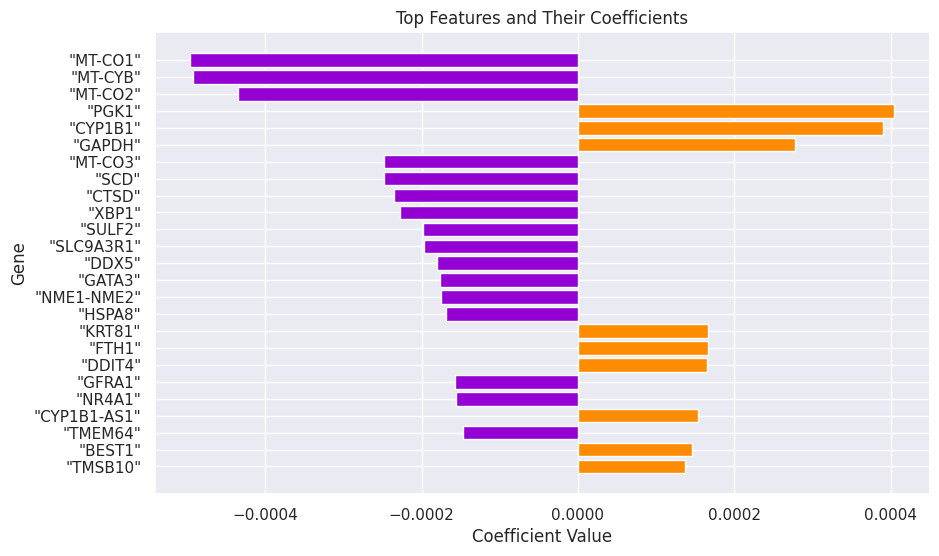

In [ ]:
best_log_MCF7_S, best_params_MCF7_S, accuracy_MCF7_S, coef_MCF7_S = grid_search_logistic(X_MCF7_S_train, y_MCF7_S_train, X_MCF7_S_test, y_MCF7_S_test)
joblib.dump(best_log_MCF7_S, 'log_MCF7_S.pkl')
print_logistic(best_log_MCF7_S, best_params_MCF7_S, accuracy_MCF7_S, coef_MCF7_S, X_MCF7_S_train)

First of all, we have to notice that not only does the model select genes which seem to be positively correlated to hypoxia (hence suggesting some sort of dependence between those genes and an oxigen-poor environment), but also genes with negtive correlation appear among the most significant features, which allows us to advance the hypothesis that some genes which are expressed in normoxic conditions become very rare in cells with little oxigen availability.

Indeed, the three most significant genes have negative correlation coefficients; if our model has correctly selected features, we expect these genes to appear in methabolic paths which characterize healthy cells, and not to be present in cancer cells. As a matter of fact, research shows that MT-CO1, MT-CYB and MT-CO2 contribute to the activity of the Mitochondrial Cytochrome C Oxidase (**COX**), an enzime which is the primary site of cellular respiration, both for oxygen utilization—it is the final step in the electron transport chain, making it essential for the utilization of oxygen in aerobic respiration—and for energy efficiency—an efficient functioning of cytochrome c oxidase is critical for optimal ATP production. Any dysfunction can lead to decreased energy production and is associated with various mitochondrial diseases and metabolic disorders.

Looking at genes which are positively correlated to hypoxia, we recognize **PGK1**, which is secreted by tumor cells where it participates in angiogenesis—the physiological process through which new blood vessels form from pre-existing vessels, playing a crucial role in growth of the tumor. We really should not overlook PGK1, since it will have high positive correlation also in all the other datasets. Due to its wide-spread presence, PGK1 could be an alarm for cells to be in hypoxic conditions—obviously a more in-dpeth analysis should be carried out before jumping to this conclusion.

Also, an overexpression of CYP1B1 was observed in human tumor cells and is associated with tumor progression. The literature reveals that CYP1B1 is overexpressed in breast, lung, colon, skin, and brain cancer cells, whereas low-level expression was observed in normal cells, such as in fallopian tube, ureter, uterus, and breast, etc., which provided the basis for cancer diagnosis and the development of chemotherapeutics which are selectively activated by CYP1B1.

For what regards glyceraldehyde-3-phosphate dehydrogenase (**GAPDH**), emerging evidence indicates that its expression status is related to cancer cells. Some studies have described GAPDH as a regulator of cell death and others have suggested that GAPDH participates in tumor progression; moreover, several cancer-related factors such as insulin and hypoxia inducible factors, not only modulate GAPDH gene expression but also affect protein functions via common pathways.

#### MCF7 - DropSeq

Best Logistic Model: LogisticRegression(C=0.1, max_iter=10000, random_state=42, solver='liblinear')
Best Parameters: {'C': 0.1, 'penalty': 'l2'}
Accuracy: 0.9808877928483354
Top Genes:
          Genes  Coefficient  Absolute Coefficient
1886     "PGK1"     1.102958              1.102958
5     "MT-RNR1"    -1.056439              1.056439
1853    "GAPDH"     1.013078              1.013078
9      "MT-CO3"    -1.011117              1.011117
14     "MT-ND3"    -0.912954              0.912954
1     "MT-RNR2"    -0.761013              0.761013
12     "MT-ND4"    -0.755197              0.755197
1896      "PKM"     0.726983              0.726983
15     "MT-CYB"    -0.718467              0.718467
34     "MT-ND6"    -0.717579              0.717579


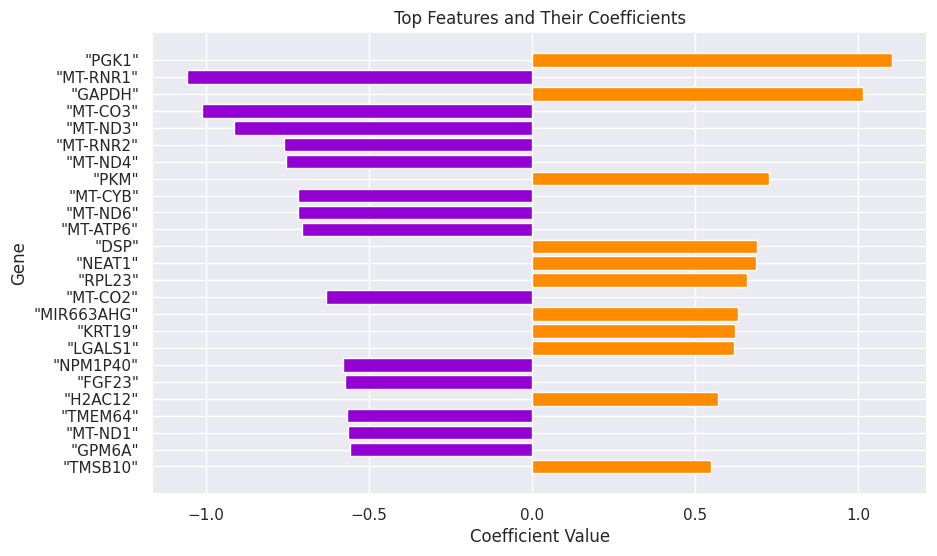

In [ ]:
best_log_MCF7_D, best_params_MCF7_D, accuracy_MCF7_D, coef_MCF7_D = grid_search_logistic(X_MCF7_D_train, y_MCF7_D_train, X_MCF7_D_test, y_MCF7_D_test)
joblib.dump(best_log_MCF7_D, 'log_MCF7_D.pkl')
print_logistic(best_log_MCF7_D, best_params_MCF7_D, accuracy_MCF7_D, coef_MCF7_D, X_MCF7_D_train)

For cells come froming form the MCF7 cell line, sequenced throuq the DropSeq method, PGK1 is the most relevant gene when trying to detect hypoxia. Also GAPDH and MTCYB, already detected in the MCF7-SmartSeq, appear again. MT-CO3 and MT-ND3 have a role in the aforementioned Mitochondrial Cytochrome C Oxidase, and in the cellular respiratory chain in general.

A question arouse when we collected information on MT-RNR1, for some papers say it was traced in cancer cells, which is in striking contradiction with its negative correlation coefficient. This would surely need further study, to better understand why MT-RNR1 was selected as *negatively* correlated to hypoxia.

On the other hand, MT-RNR2 contributes to a lot of cellular activities, among which we identify its ability to **suppress apoptosis**—the programmed process of cell death that allows the body to remove damaged or unnecessary cells in an orderly and controlled manner. As possible future research, one could see if MT-RNR2's positive correlation could suggest that cells express it to inhibit the process of apotosis which cancer cells tend to undergo.

#### HCC1806 - SmartSeq

Best Logistic Model: LogisticRegression(C=1, max_iter=10000, penalty='l1', random_state=42,
                   solver='liblinear')
Best Parameters: {'C': 1, 'penalty': 'l1'}
Accuracy: 0.967032967032967
Top Genes:
          Genes  Coefficient  Absolute Coefficient
62      "BNIP3"     0.002412              0.002412
299    "PFKFB3"     0.000969              0.000969
1     "ANGPTL4"     0.000946              0.000946
34        "FOS"     0.000813              0.000813
0       "DDIT4"     0.000723              0.000723
98       "DKK1"    -0.000656              0.000656
1031     "TFRC"    -0.000545              0.000545
5      "IGFBP3"     0.000529              0.000529
136      "PGK1"     0.000515              0.000515
1209     "CTSB"    -0.000497              0.000497


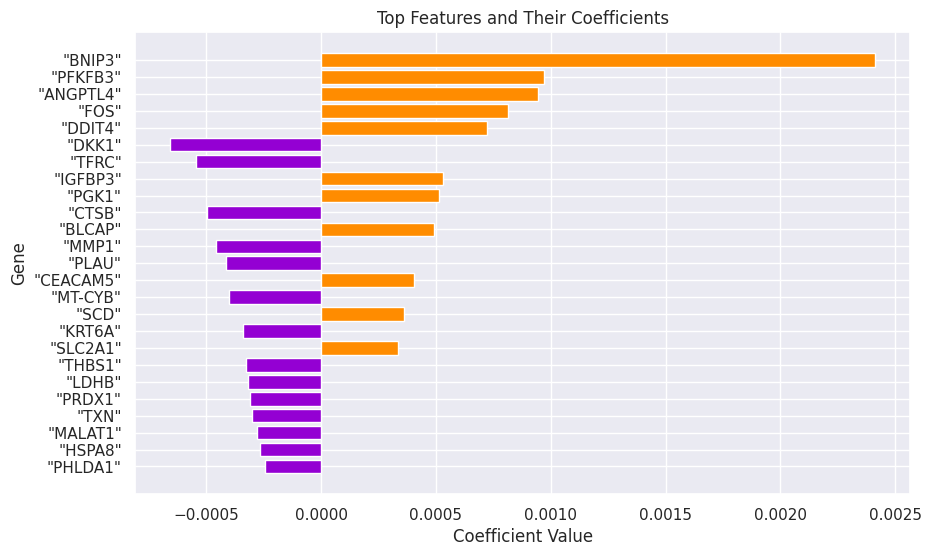

In [ ]:
best_log_HCC1806_S, best_params_HCC1806_S, accuracy_HCC1806_S, coef_HCC1806_S = grid_search_logistic(X_HCC1806_S_train, y_HCC1806_S_train, X_HCC1806_S_test, y_HCC1806_S_test)
joblib.dump(best_log_HCC1806_S, 'log_HCC1806_S.pkl')
print_logistic(best_log_HCC1806_S, best_params_HCC1806_S, accuracy_HCC1806_S, coef_HCC1806_S, X_HCC1806_S_train)

MTCYB and PGK1 are highly read also in HCC1806-SmartSeq, giving to these genes a higher significance when tracing hypoxia, and suggesting that their expression is independent of the type of cells we are dealing with.

**BNIP3** encodes for a protein which induces both cell death and autophagy. Consistent with its ability to induce cell death, BNIP3 is implicated in the pathogenesis of cancer. In tumor cells, it is regulated by hypoxia, and the deregulation of BNIP3 expression is associated with tumor growth. Our model correctly assigns to BNIP3 a large positive correlation to hypoxia.

Also **PFKFB3** is related to tumors, and in particular to **glycolysis**. As the reader may know, glycolysis is the metabolic pathway that converts glucose to pyruvate. The free energy released in this process is utilized to form the high-energy compounds ATP and NADH. A high rate of glycolytic flux, even in the presence of oxygen, is a central metabolic hallmark of tumors. This phenomenon is historically known as the ‘Warburg Effect’. The rate of glycolytic flux is controlled at different levels and by different mechanisms. As a vital regulator of glycolysis, accumulating studies have suggested that PFKFB3 is associated with many aspects of cancer, including carcinogenesis, cancer cell proliferation, vessel aggressiveness, drug resistance and tumor microenvironment. Knowledge of the function of PFKFB3 in cancer has advanced considerably in the past several years and PFKFB3 represents a promising
target for tumor treatment. However, until now, no PFKFB3 inhibitors have been approved to treat patients with cancer.

ANGPTL4, FOS and DDIT4 are all genes which are highly expressed in cells undergoing some threat: ANGPTL4 protein act as an apoptosis survival factor for vascular endothelial cells and can prevent metastasis by inhibiting vascular growth and tumor cell invasion; FOS has also been associated with apoptotic cell death; DDIT4 plays an important role in responses to cellular energy levels and cellular stress, including responses to hypoxia and DNA damage.

Also for this model, there is an apparent contradiction which would require a more in-depth analysis of the biological mechanisms laying behind our data. Namely, research shows that elevated expression of the DKK1 gene has been observed in numerous human cancers and its protein may promote proliferation, invasion and growth in cancer cell lines; however, on out model DKK1 has a negatve correlation coefficient.

#### HCC1806 - DropSeq

Best Logistic Model: LogisticRegression(C=0.1, max_iter=10000, random_state=42, solver='liblinear')
Best Parameters: {'C': 0.1, 'penalty': 'l2'}
Accuracy: 0.9545970488081725
Top Genes:
          Genes  Coefficient  Absolute Coefficient
76      "NDRG1"     1.627825              1.627825
701     "BNIP3"     0.998667              0.998667
327     "FGF23"     0.954707              0.954707
258     "GPM6A"     0.943587              0.943587
6      "IGFBP3"     0.941201              0.941201
40      "MT-TV"     0.864466              0.864466
800     "P4HA1"     0.856009              0.856009
650     "EGLN3"     0.842556              0.842556
1069  "NPM1P40"     0.840212              0.840212
836      "PGK1"     0.785354              0.785354


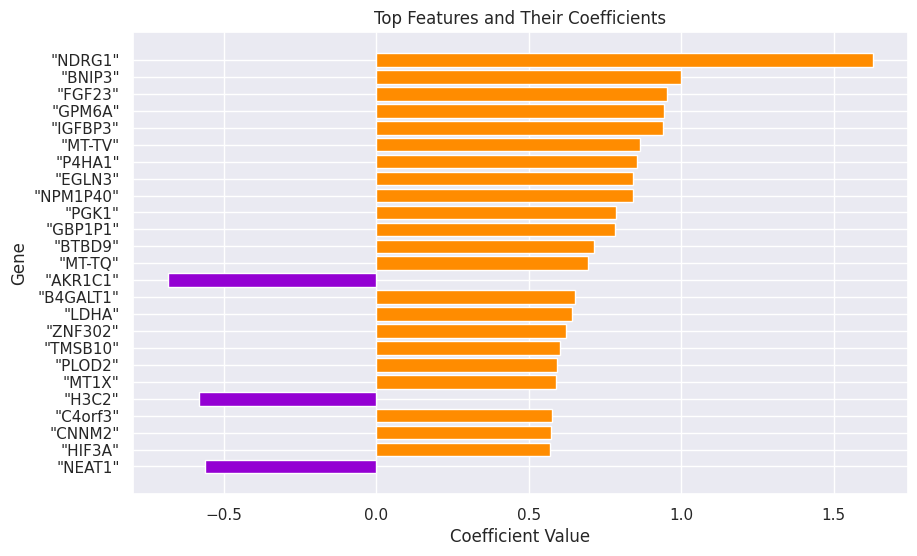

In [ ]:
best_log_HCC1806_D, best_params_HCC1806_D, accuracy_HCC1806_D, coef_HCC1806_D  = grid_search_logistic(X_HCC1806_D_train, y_HCC1806_D_train, X_HCC1806_D_test, y_HCC1806_D_test)
joblib.dump(best_log_HCC1806_D, 'log_HCC1806_D.pkl')
print_logistic(best_log_HCC1806_D, best_params_HCC1806_D, accuracy_HCC1806_D, coef_HCC1806_D, X_HCC1806_D_train)

In the pattern of significant genes for the HCC1806-DropSeq data, we recognize the ever-present BNIP3 and PGK1 genes.

The protein encoded by **NDRG1** is a cytoplasmic protein involved in stress responses, hormone responses, cell growth, and differentiation, and expression of this gene may be a prognostic indicator for several types of cancer. Also FGF23 and GPM6A, which have been selected by our model, are genes encoding for proteins which have been detected several times in cancer cells.

### SGD (Stocastic Gradient Descent)

Stochastic Gradient Descent is an optimization algorithm which works well in scenarios with large datasets. The core idea is to iteratively compute the gradient of the loss function with respect to the parameters of each training example and hence update the model parameters. We have a few things to keep in mind.
- The decision boundaries are linear.
- SGD is sensitive to feature scaling, but we recall our data has been standardized;
- We choose to implement SGD, which is a variant of the Standard Gradient Descent, because it is more computationally efficient in handling large datasets: the stochastic sampling of individual examples, i.e. batch size = 1 for GD, allows to escape local minima more easily and is less time expensive;
- We choose as loss function cross-entropy loss, which is the most commonly used for binary classification; in our case, the loss function is measuring the difference between predicted probabilities and the actual labels,  which represent presence (or absence) of hypoxia. Basically, our model is trained to minimize this difference. During training, the model associated a weight to each gene feature to minimize the loss, so each gene feature is contributing by influencing the decision boundary of the model. The genes with more significant way(both positive and negative) are those who have stronger influence.
- When tuning the hyperparameters we look at:
    - learning rate alpha: hyperparameter that determines the size of the steps in each iteration. It controls the trade-off between stability and convergence speed. We can choose to implement an adaptive learning rate, so that at each step the learning rate is adjusted properly to observed progresses.
    - number of iterations
    - tolerance for stopping
    - regularization: we consider adding an L1 or L2 regularization term to the loss function to avoid overfitting.

We build two functions:
- `random_search_sgd`:
    - initializes the `SGDClassifier` with `random_state`;
    - fintetunes the classifiers throught `RandomizedSearchCV` using a grid of hyperparameters we defined;
    - returns the tuned classifier, the tuned hyperparameters, the accuracy, the classification report, the confusion matrix and the coefficients assigned to the features;
- `print_sgd`, which prints:
    - the best model;
    - the best parameters;
    - the accuracy of the model;
    - the classification report;
    - the heatmap of the actual labels vs predicted labels;
    - the genes with higher coefficients;

In [ ]:
def random_search_sgd(X_train, y_train, X_test, y_test):
    sgd = SGDClassifier(loss='log_loss', random_state=42)

    param_sgd = {
    'alpha': [0.0001, 0.001, 0.01],  # Learning rate
    'penalty': ['l1', 'l2'],  # Regularization type
    'eta0': [0.01, 0.1],  # Initial learning rate
    'learning_rate': ['constant', 'adaptive'],  # Learning rate strategy
    'tol': [1e-3, 1e-4, 1e-5],  # Tolerance for stopping criteria
    }

    random_search = RandomizedSearchCV(estimator=sgd, param_distributions=param_sgd, cv=5, scoring='accuracy')
    random_search.fit(X_train, y_train)

    best_sgd = random_search.best_estimator_

    best_params = random_search.best_params_

    y_pred = best_sgd.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    classification_rep = classification_report(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)
    coef = best_sgd.coef_

    return best_sgd, best_params, accuracy, classification_rep, conf_matrix, coef

In [ ]:
def print_sgd(best_sgd, best_params, accuracy, classification_rep, conf_matrix, coef, df):
    print("Best SGD Model:", best_sgd)
    print("Best Parameters:", best_params)
    print("Accuracy:", accuracy)
    print("Classification Report:", classification_rep, sep='\n')

    class_labels = ['Normoxia', 'Hypoxia']
    plt.figure(figsize=(6, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="plasma", cbar=False,
                xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

    genes = df.columns.tolist()
    coef_df = pd.DataFrame({'Genes': genes, 'Coefficient': coef.flatten()})
    coef_df['Absolute Coefficient'] = coef_df['Coefficient'].abs()
    coef_df = coef_df.sort_values(by='Absolute Coefficient', ascending=False)
    print("Top Genes:")
    print(coef_df.head(10))

    colors = ['darkorange' if coef > 0 else 'darkviolet' for coef in coef_df['Coefficient']]
    plt.figure(figsize=(10, 6))
    plt.barh(coef_df['Genes'][:25], coef_df['Coefficient'][:25], color=colors)
    plt.xlabel('Coefficient Value')
    plt.ylabel('Gene')
    plt.title('Top Features and Their Coefficients')
    plt.gca().invert_yaxis()
    plt.show()

#### MCF7 - SmartSeq

Best SGD Model: SGDClassifier(alpha=0.001, eta0=0.01, learning_rate='constant', loss='log_loss',
              penalty='l1', random_state=42, tol=0.0001)
Best Parameters: {'tol': 0.0001, 'penalty': 'l1', 'learning_rate': 'constant', 'eta0': 0.01, 'alpha': 0.001}
Accuracy: 0.992
Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        63
           1       1.00      0.98      0.99        62

    accuracy                           0.99       125
   macro avg       0.99      0.99      0.99       125
weighted avg       0.99      0.99      0.99       125



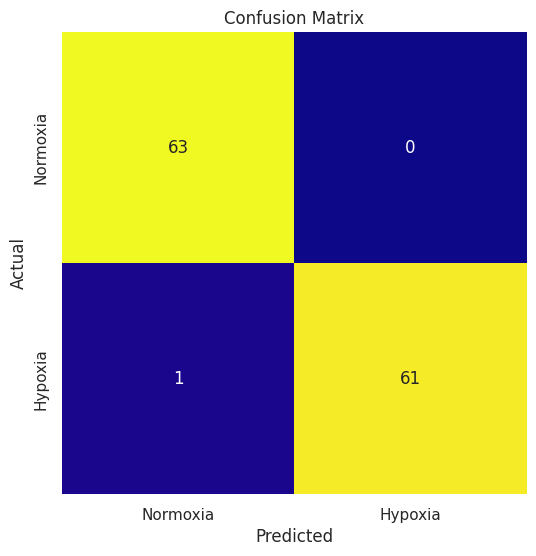

Top Genes:
         Genes  Coefficient  Absolute Coefficient
737    "SULF2"   -231.07625             231.07625
250   "MT-CO1"   -187.47625             187.47625
190     "CTSD"   -173.07125             173.07125
1485   "GAPDH"    170.66625             170.66625
224     "PGK1"    153.65125             153.65125
930    "ACTG1"    133.11125             133.11125
103   "MT-CYB"   -128.93125             128.93125
178   "MT-CO2"   -123.04625             123.04625
137     "XBP1"    -94.71625              94.71625
2165    "DDX5"    -71.77625              71.77625


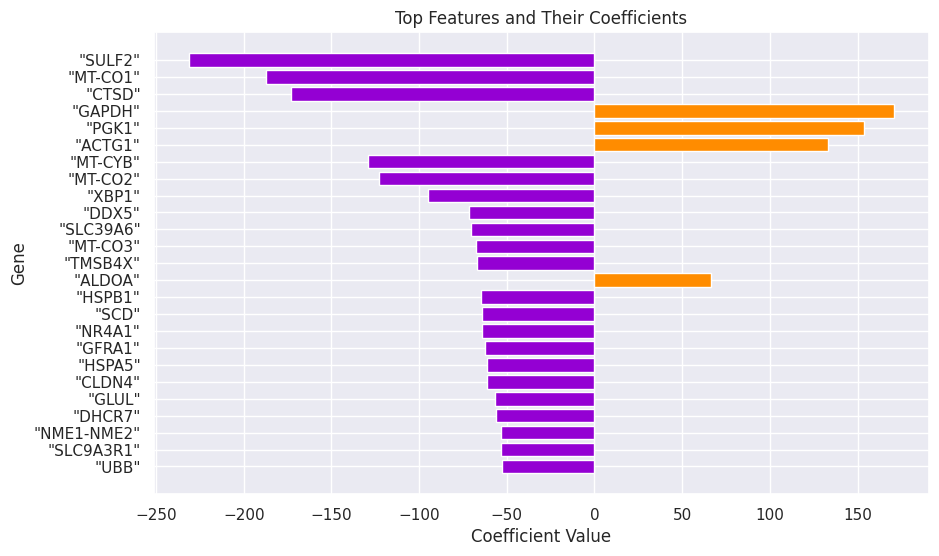

In [ ]:
best_sgd_1, best_params_1, accuracy_1, classification_rep_1, conf_matrix_1, coef_1 = random_search_sgd(X_MCF7_S_train, y_MCF7_S_train, X_MCF7_S_test, y_MCF7_S_test)
print_sgd(best_sgd_1, best_params_1, accuracy_1, classification_rep_1, conf_matrix_1, coef_1, X_MCF7_S_train)

In [ ]:
joblib.dump(best_sgd_1, 'sgd_MCF7_S.pkl')

['sgd_MCF7_S.pkl']

#### MCF7 - DropSeq

Best SGD Model: SGDClassifier(eta0=0.01, learning_rate='constant', loss='log_loss',
              penalty='l1', random_state=42)
Best Parameters: {'tol': 0.001, 'penalty': 'l1', 'learning_rate': 'constant', 'eta0': 0.01, 'alpha': 0.0001}
Accuracy: 0.9787299630086314
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      3812
           1       0.97      0.98      0.97      2676

    accuracy                           0.98      6488
   macro avg       0.98      0.98      0.98      6488
weighted avg       0.98      0.98      0.98      6488



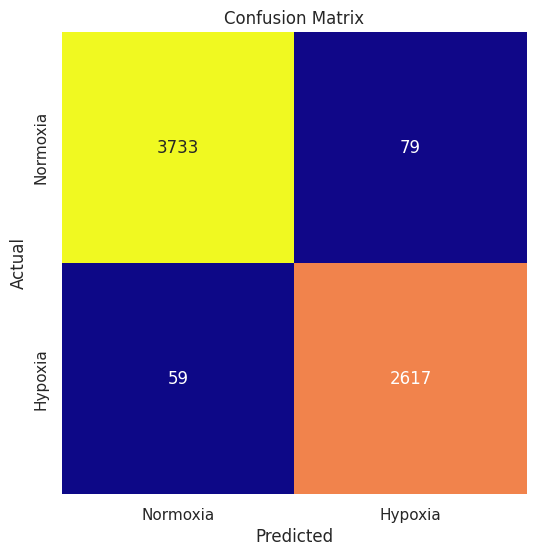

Top Genes:
            Genes  Coefficient  Absolute Coefficient
5       "MT-RNR1"    -1.783999              1.783999
9        "MT-CO3"    -1.746068              1.746068
14       "MT-ND3"    -1.669424              1.669424
1886       "PGK1"     1.509362              1.509362
1853      "GAPDH"     1.424653              1.424653
213   "MIR663AHG"     1.343902              1.343902
34       "MT-ND6"    -1.324808              1.324808
21      "MT-ATP6"    -1.220435              1.220435
46       "MT-ND1"    -1.157022              1.157022
2         "NEAT1"     1.112208              1.112208


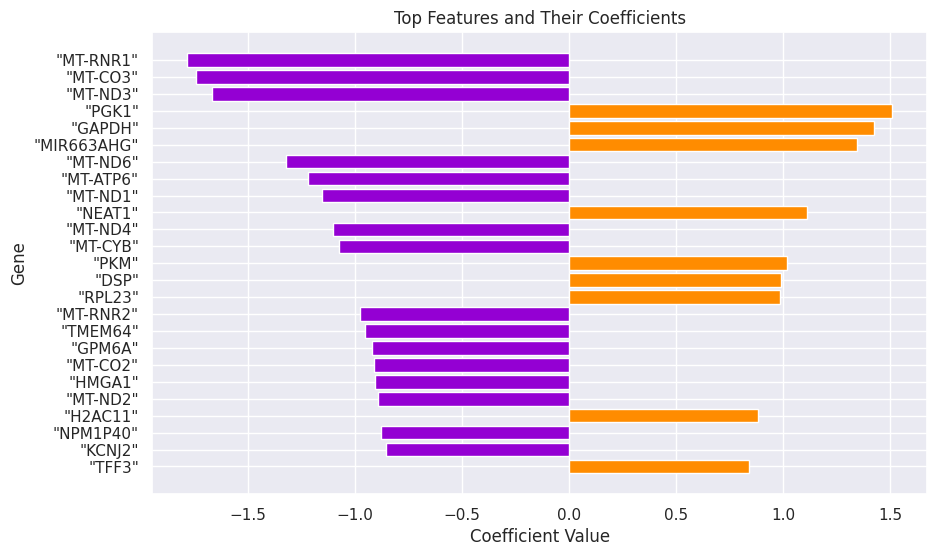

In [ ]:
best_sgd_2, best_params_2, accuracy_2, classification_rep_2, conf_matrix_2, coef_2 = random_search_sgd(X_MCF7_D_train, y_MCF7_D_train, X_MCF7_D_test, y_MCF7_D_test)
print_sgd(best_sgd_2, best_params_2, accuracy_2,  classification_rep_2, conf_matrix_2, coef_2, X_MCF7_D_train)

In [ ]:
joblib.dump(best_sgd_2, 'sgd_MCF7_D.pkl')

['sgd_MCF7_D.pkl']

#### HCC1806 - SmartSeq

Best SGD Model: SGDClassifier(alpha=0.001, eta0=0.1, learning_rate='constant', loss='log_loss',
              penalty='l1', random_state=42)
Best Parameters: {'tol': 0.001, 'penalty': 'l1', 'learning_rate': 'constant', 'eta0': 0.1, 'alpha': 0.001}
Accuracy: 0.989010989010989
Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        43
           1       1.00      0.98      0.99        48

    accuracy                           0.99        91
   macro avg       0.99      0.99      0.99        91
weighted avg       0.99      0.99      0.99        91



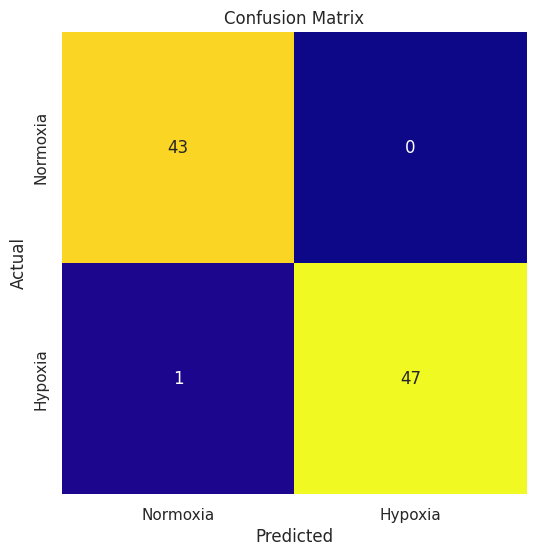

Top Genes:
          Genes  Coefficient  Absolute Coefficient
0       "DDIT4"   16626.1726            16626.1726
345      "LDHA"   13325.6226            13325.6226
1533    "ALDOA"    8830.4226             8830.4226
1431    "HSPA8"   -6762.8226             6762.8226
2601    "PSMD2"   -5443.8226             5443.8226
1     "ANGPTL4"    5416.1726             5416.1726
767    "S100A2"   -4921.2726             4921.2726
136      "PGK1"    4887.4726             4887.4726
82    "CEACAM5"    4761.6726             4761.6726
1920   "MT-CYB"   -4542.5226             4542.5226


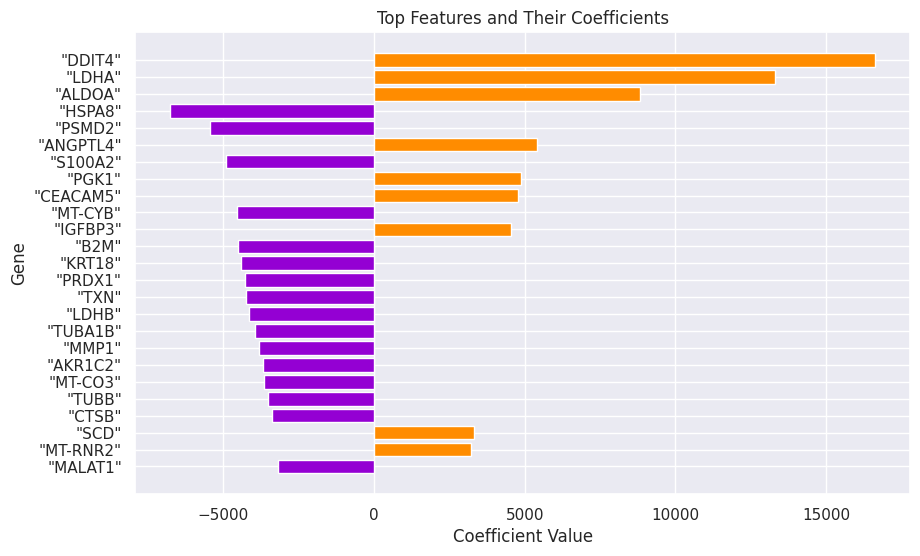

In [ ]:
best_sgd_3, best_params_3, accuracy_3, classification_rep_3, conf_matrix_3, coef_3 = random_search_sgd(X_HCC1806_S_train, y_HCC1806_S_train, X_HCC1806_S_test, y_HCC1806_S_test)
print_sgd(best_sgd_3, best_params_3, accuracy_3, classification_rep_3, conf_matrix_3, coef_3, X_HCC1806_S_train)

In [ ]:
joblib.dump(best_sgd_3, 'sgd_HCC1806_S.pkl')

['sgd_HCC1806_S.pkl']

#### HCC1806 - DropSeq

Best SGD Model: SGDClassifier(alpha=0.001, eta0=0.01, learning_rate='constant', loss='log_loss',
              random_state=42, tol=0.0001)
Best Parameters: {'tol': 0.0001, 'penalty': 'l2', 'learning_rate': 'constant', 'eta0': 0.01, 'alpha': 0.001}
Accuracy: 0.9500567536889898
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1735
           1       0.96      0.96      0.96      2670

    accuracy                           0.95      4405
   macro avg       0.95      0.95      0.95      4405
weighted avg       0.95      0.95      0.95      4405



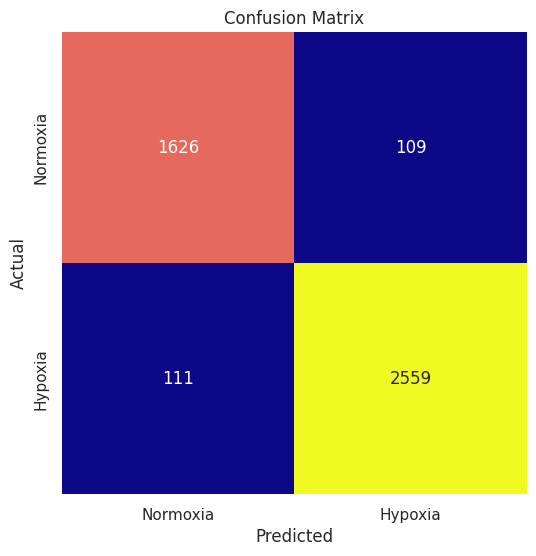

Top Genes:
          Genes  Coefficient  Absolute Coefficient
76      "NDRG1"     1.740253              1.740253
701     "BNIP3"     1.072314              1.072314
327     "FGF23"     1.037197              1.037197
6      "IGFBP3"     1.013604              1.013604
258     "GPM6A"     0.999511              0.999511
40      "MT-TV"     0.922115              0.922115
800     "P4HA1"     0.919578              0.919578
650     "EGLN3"     0.886961              0.886961
1069  "NPM1P40"     0.883411              0.883411
1732   "GBP1P1"     0.834486              0.834486


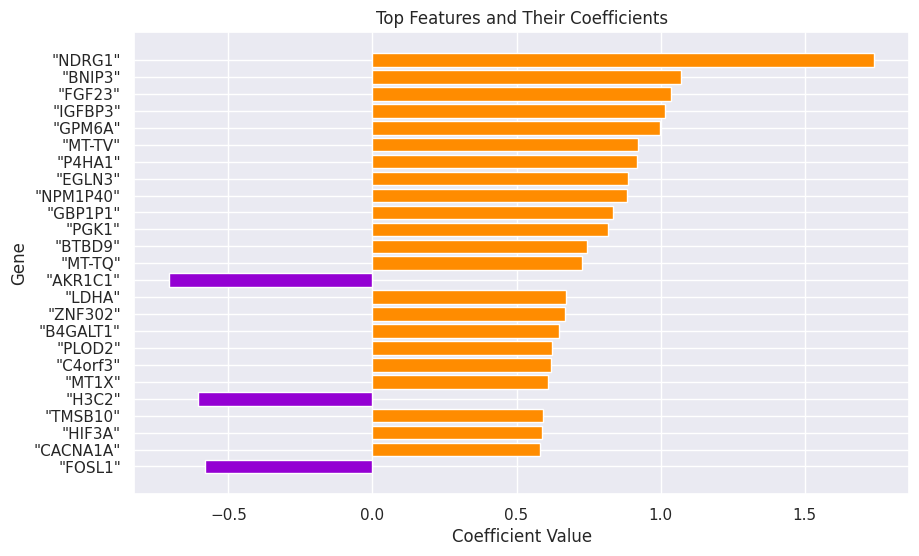

In [ ]:
best_sgd_4, best_params_4, accuracy_4, classification_rep_4, conf_matrix_4, coef_4 = random_search_sgd(X_HCC1806_D_train, y_HCC1806_D_train, X_HCC1806_D_test, y_HCC1806_D_test)
print_sgd(best_sgd_4, best_params_4, accuracy_4, classification_rep_4, conf_matrix_4, coef_4, X_HCC1806_D_train)

In [ ]:
joblib.dump(best_sgd_4, 'sgd_HCC1806_D.pkl')

['sgd_HCC1806_D.pkl']

#### FINAL CONSIDERATIONS ON SGD MODEL

We notice that:
- the model seems to perform pretty well on all of the four datasets, since it reaches an accuracy >=95%.
- the model is not overfitting the data since we added a l1 or l2 penalization.
- the best parameters found by RandomizedSearch are not always the same. They also vary when we change the split in train and test set.

The importance given to the different genes seems to overlap with what was found by logistic regression:
- **MCF7 - SmartSeq**: it looks like some of the revelant genes are still found relevant by SGD.
    - MT-CO1, MT-CYB, MT-C02, which we discussed before, are still found relevant with high negative association.
    - PGK1, which we also discussed before, has been assigned high positive association.
    - **SULF2** is found relevant in negative association. SULF2 is a gene encoding an enzyme that modifies heparan sulfate proteoglycans, influencing various signaling pathways and biological processes. Even thought SULF2 has been reported as an important mediator of carcinogenesis in many cancer types, it looks like here the correlation with hypoxia is negative. This might mean that hypoxia leads to the downregulation of pathways that SULF2 positively influences, or if SULF2 activity suppresses pathways activated by hypoxia, a negative correlation might be observed.
    - GAPDH, discussed before, still has positive association.
    - **CTSD** (Cathepsin D) is a gene that encodes an aspartic protease enzyme involved in the degradation of proteins in the lysosome. Researchs have shown that CTSD is downregulated in hypoxia‐exposed trophoblasts, which eventually leads to lysosome dysfunction.

- **MCF7 - DropSeq**: the most expressive genes are almost the same as the ones found by logistic regression and some actually also overlap with the ones found relevant for the dataset MCF7 - SmartSeq.
    - PGK1 and GAPDH have a clear positive association. The same behaviour has been observed also for the different sequencing.
    - MT-CO3, MT-CYB, MT-ND3 have already been observed with negative association.
- **HCC1806 - SmartSeq**: some genes overlap with the ones found by logistic, but SGD finds some genes that were not considered relevant.
    - PGK1, MT-CYB and MT-CO3 are observed once again.
    - DDIT4 and ANGPTL4 have been observed with positive association also in logistic regression.
    - **HSPA8** is observed with negative association. HSPA8 is a conserved molecular chaperone that plays an indispensable role in the cellular stress response. HSPA8 plays an important role in regulating the activity and autophagy of cancer cells. And it has been found that low expression of HSPA8 can inhibit the growth of cancer and stop cell proliferation.
    - **ALDOA**, not found by logistic regression, is one of the glycolytic enzymes that catalyzes the reversible conversion of fructose-1,6-bisphosphate to glyceraldehyde-3-phosphate and dihydroxyacetone phosphate. Studies have reported that ALDOA is a downstream target of hypoxia-inducible factors.
    - **LDHA** is found positively by SGD, while **LDHB** is found negatively by both methods. Lactate dehydrogenase A (LDHA) catalyzes the conversion of pyruvate to lactate and is considered to be a key checkpoint of anaerobic glycolysis. Studies have found that hypoxia induces an of LDHA. Oxygen regulated expression of LDHB is opposite and complementary to that of LDHA and provides a system to elucidate the mechanisms underlying hypoxia.
- **HCC1086 - DropSeq**: we find some overlapping, also with other datasets:
    - BNIP3 and PGK1 as before.
    - NDRG1 is found by both classifiers with positive association.
    - **EGLN3** is found positively by SGD but not by logistic. EGL stands for egg laying defective (Caenorhabditis elegans gene), is induced by hypoxia through a negative feedback loop.

Please note we have linked the studies mentioned above at the end of this report.



### SVC (Support Vector Machine for Classifiers)

#### MCF7 - SmartSeq

First we try linear classification with SVMs (with hinge loss by default).

In [ ]:
param_grid = {'C': [0.1, 1, 10, 100]}
grid_search = GridSearchCV(LinearSVC(dual=False), param_grid, cv=5)
grid_search.fit(X_MCF7_S_train, y_MCF7_S_train)

GridSearchCV(cv=5, estimator=LinearSVC(dual=False),
             param_grid={'C': [0.1, 1, 10, 100]})

In [ ]:
best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_C = best_params['C']
best_C

Best Parameters: {'C': 0.1}


0.1

In [ ]:
best_svm = LinearSVC(C=best_C, dual=False)
best_svm.fit(X_MCF7_S_train, y_MCF7_S_train)

LinearSVC(C=0.1, dual=False)

In [ ]:
y_pred = best_svm.predict(X_MCF7_S_test)
accuracy = accuracy_score(y_MCF7_S_test, y_pred)
print("Accuracy on test set:", accuracy)

Accuracy on test set: 1.0


In [ ]:
cv_results = grid_search.cv_results_

for mean_score, params in zip(cv_results['mean_test_score'], cv_results['params']):
    print("Mean CV Score:", mean_score, "Parameters:", params)

Mean CV Score: 1.0 Parameters: {'C': 0.1}
Mean CV Score: 1.0 Parameters: {'C': 1}
Mean CV Score: 1.0 Parameters: {'C': 10}
Mean CV Score: 1.0 Parameters: {'C': 100}


In [ ]:
y_pred = best_svm.predict(X_MCF7_S_test)
print(classification_report(y_MCF7_S_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        63
           1       1.00      1.00      1.00        62

    accuracy                           1.00       125
   macro avg       1.00      1.00      1.00       125
weighted avg       1.00      1.00      1.00       125



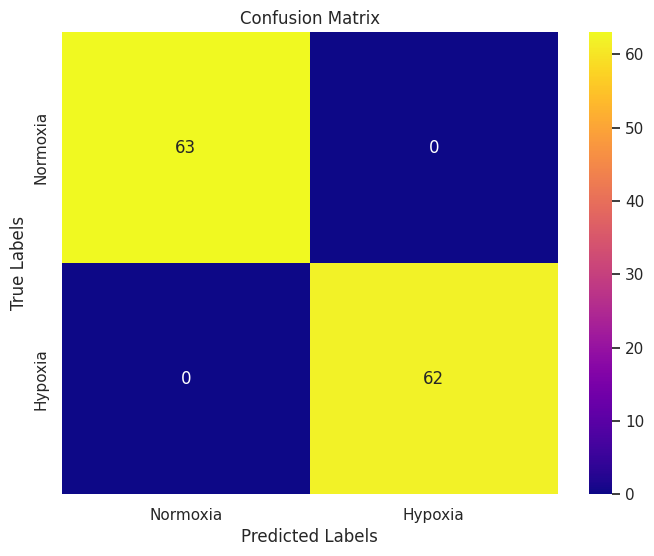

In [ ]:
conf_matrix = confusion_matrix(y_MCF7_S_test, y_pred)
class_labels = ['Normoxia', 'Hypoxia']

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="plasma", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

Such a high accuracy seems suspicious, but it can be well explained by the nature of this dataset: it's perfectly linearly separable, which is also shown by the precision-recall "curve" below. We see that the classifier is achieving perfect precision or recall for all threshold values.

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto

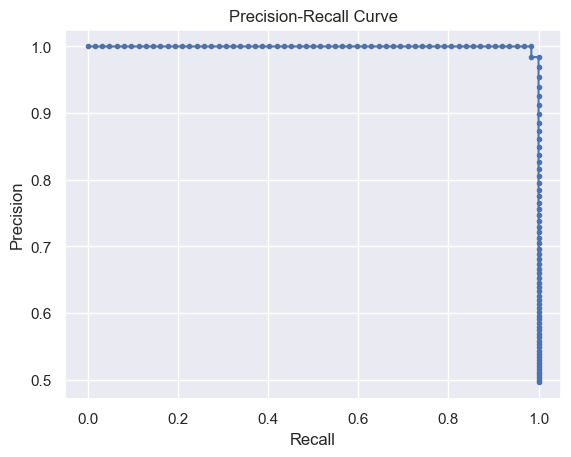

Accuracy on test set: 1.0


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


In [37]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import precision_recall_curve

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', LinearSVC())
])

predicted_probabilities = cross_val_predict(pipeline, X_MCF7_S_train, y_MCF7_S_train, cv=5, method='decision_function')

precision, recall, thresholds = precision_recall_curve(y_MCF7_S_train, predicted_probabilities)

plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

pipeline.fit(X_MCF7_S_train, y_MCF7_S_train)
test_accuracy = pipeline.score(X_MCF7_S_test, y_MCF7_S_test)
print("Accuracy on test set:", test_accuracy)

In [ ]:
joblib.dump(best_svm, 'svm_MCF7_S.pkl')

['svm_MCF7_S.pkl']

#### HCC1806 - SmartSeq

In [ ]:
param_grid = {'C': [0.1, 1, 10, 100]}
grid_search = GridSearchCV(LinearSVC(dual=False), param_grid, cv=5)
grid_search.fit(X_HCC1806_S_train, y_HCC1806_S_train)

GridSearchCV(cv=5, estimator=LinearSVC(dual=False),
             param_grid={'C': [0.1, 1, 10, 100]})

In [ ]:
best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_C = best_params['C']
best_C

Best Parameters: {'C': 0.1}


0.1

In [ ]:
best_svm = LinearSVC(C=best_C, dual=False)
best_svm.fit(X_HCC1806_S_train, y_HCC1806_S_train)

LinearSVC(C=0.1, dual=False)

In [ ]:
y_pred = best_svm.predict(X_HCC1806_S_test)
accuracy = accuracy_score(y_HCC1806_S_test, y_pred)
print("Accuracy on test set:", accuracy)

Accuracy on test set: 0.989010989010989


In [ ]:
cv_results = grid_search.cv_results_

for mean_score, params in zip(cv_results['mean_test_score'], cv_results['params']):
    print("Mean CV Score:", mean_score, "Parameters:", params)

Mean CV Score: 0.9450292397660819 Parameters: {'C': 0.1}
Mean CV Score: 0.9450292397660819 Parameters: {'C': 1}
Mean CV Score: 0.9450292397660819 Parameters: {'C': 10}
Mean CV Score: 0.9450292397660819 Parameters: {'C': 100}


In [ ]:
y_pred = best_svm.predict(X_HCC1806_S_test)
print(classification_report(y_HCC1806_S_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        43
           1       1.00      0.98      0.99        48

    accuracy                           0.99        91
   macro avg       0.99      0.99      0.99        91
weighted avg       0.99      0.99      0.99        91



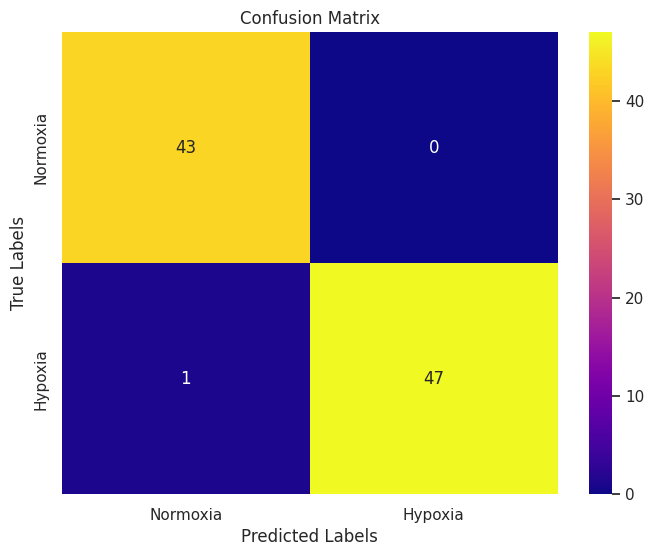

In [ ]:
conf_matrix = confusion_matrix(y_HCC1806_S_test, y_pred)
class_labels = ['Normoxia', 'Hypoxia']

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="plasma", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto

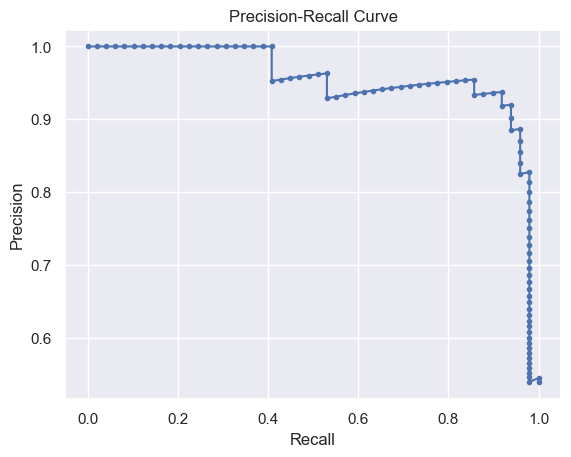

Accuracy on test set: 0.9120879120879121


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


In [38]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', LinearSVC())
])

predicted_probabilities = cross_val_predict(pipeline, X_HCC1806_S_train, y_HCC1806_S_train, cv=5, method='decision_function')

precision, recall, thresholds = precision_recall_curve(y_HCC1806_S_train, predicted_probabilities)

plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

pipeline.fit(X_HCC1806_S_train, y_HCC1806_S_train)
test_accuracy = pipeline.score(X_HCC1806_S_test, y_HCC1806_S_test)
print("Accuracy on test set:", test_accuracy)

Let's see if we can achieve a better accuracy using a nonlinear model with an RBF kernel.

In [ ]:
param_dist = {
    'C': reciprocal(0.1, 100),
    'gamma': reciprocal(0.001, 0.1)
}

random_search = RandomizedSearchCV(SVC(kernel='rbf'), param_distributions=param_dist, n_iter=10, cv=5)
random_search.fit(X_HCC1806_S_train, y_HCC1806_S_train)

best_params = random_search.best_params_
print("Best Parameters:", best_params)

best_svm_model = random_search.best_estimator_

test_accuracy = best_svm_model.score(X_HCC1806_S_test, y_HCC1806_S_test)
print("Accuracy on test set:", test_accuracy)

Best Parameters: {'C': 0.5928150744879372, 'gamma': 0.0059571823584415075}
Accuracy on test set: 0.5274725274725275


Nonlinear models doesn't seem to work well with this dataset. Let's try a different linear SVM model.

In [ ]:
kernel_matrix_train = pairwise_kernels(X_HCC1806_S_train, metric='linear')

svm_classifier = SVC(kernel='precomputed')
svm_classifier.fit(kernel_matrix_train, y_HCC1806_S_train)

SVC(kernel='precomputed')

In [ ]:
kernel_matrix_test = pairwise_kernels(X_HCC1806_S_test, X_HCC1806_S_train, metric='linear')
test_accuracy = svm_classifier.score(kernel_matrix_test, y_HCC1806_S_test)
print("Accuracy on test set:", test_accuracy)

Accuracy on test set: 0.989010989010989


In [ ]:
joblib.dump(best_svm, 'svm_HCC1806_S.pkl')

['svm_HCC1806_S.pkl']

#### MCF7 - DropSeq

In [ ]:
param_grid = {'C': [0.1, 1, 10, 100]}
grid_search = GridSearchCV(LinearSVC(dual=False), param_grid, cv=5)
grid_search.fit(X_MCF7_D_train, y_MCF7_D_train)

GridSearchCV(cv=5, estimator=LinearSVC(dual=False),
             param_grid={'C': [0.1, 1, 10, 100]})

In [ ]:
best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_C = best_params['C']
best_C

Best Parameters: {'C': 0.1}


0.1

In [ ]:
best_svm = LinearSVC(C=best_C, dual=False)
best_svm.fit(X_MCF7_D_train, y_MCF7_D_train)

LinearSVC(C=0.1, dual=False)

In [ ]:
y_pred = best_svm.predict(X_MCF7_D_test)
accuracy = accuracy_score(y_MCF7_D_test, y_pred)
print("Accuracy on test set:", accuracy)

Accuracy on test set: 0.9733353884093712


In [ ]:
cv_results = grid_search.cv_results_

for mean_score, params in zip(cv_results['mean_test_score'], cv_results['params']):
    print("Mean CV Score:", mean_score, "Parameters:", params)

Mean CV Score: 0.9715284151138215 Parameters: {'C': 0.1}
Mean CV Score: 0.9678952614492464 Parameters: {'C': 1}
Mean CV Score: 0.967829211251096 Parameters: {'C': 10}
Mean CV Score: 0.9676969799326972 Parameters: {'C': 100}


In [ ]:
y_pred = best_svm.predict(X_MCF7_D_test)
print(classification_report(y_MCF7_D_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      3812
           1       0.96      0.97      0.97      2676

    accuracy                           0.97      6488
   macro avg       0.97      0.97      0.97      6488
weighted avg       0.97      0.97      0.97      6488



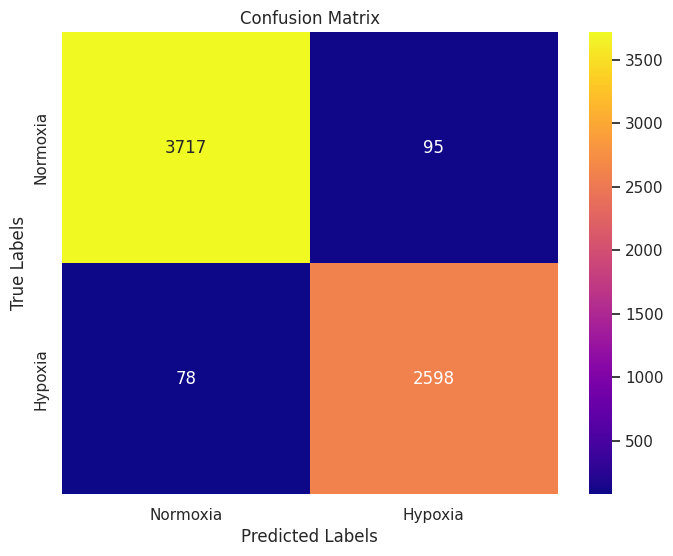

In [ ]:
conf_matrix = confusion_matrix(y_MCF7_D_test, y_pred)
class_labels = ['Normoxia', 'Hypoxia']

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="plasma", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto

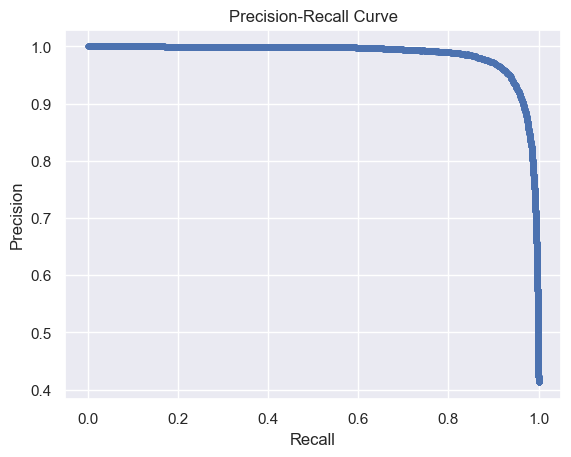

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


Accuracy on test set: 0.9577681874229347


In [39]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', LinearSVC())
])

predicted_probabilities = cross_val_predict(pipeline, X_MCF7_D_train, y_MCF7_D_train, cv=5, method='decision_function')

precision, recall, thresholds = precision_recall_curve(y_MCF7_D_train, predicted_probabilities)

plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

pipeline.fit(X_MCF7_D_train, y_MCF7_D_train)
test_accuracy = pipeline.score(X_MCF7_D_test, y_MCF7_D_test)
print("Accuracy on test set:", test_accuracy)

In [ ]:
joblib.dump(best_svm, 'svm_MCF7_D.pkl')

['svm_MCF7_D.pkl']

#### HCC1806 - DropSeq

In [ ]:
param_grid = {'C': [0.1, 1, 10, 100]}
grid_search = GridSearchCV(LinearSVC(dual=False), param_grid, cv=5)
grid_search.fit(X_HCC1806_D_train, y_HCC1806_D_train)

GridSearchCV(cv=5, estimator=LinearSVC(dual=False),
             param_grid={'C': [0.1, 1, 10, 100]})

In [ ]:
best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_C = best_params['C']
best_C

Best Parameters: {'C': 0.1}


0.1

In [ ]:
best_svm = LinearSVC(C=best_C, dual=False)
best_svm.fit(X_HCC1806_D_train, y_HCC1806_D_train)

LinearSVC(C=0.1, dual=False)

In [ ]:
y_pred = best_svm.predict(X_HCC1806_D_test)
accuracy = accuracy_score(y_HCC1806_D_test, y_pred)
print("Accuracy on test set:", accuracy)

Accuracy on test set: 0.9482406356413167


In [ ]:
cv_results = grid_search.cv_results_

for mean_score, params in zip(cv_results['mean_test_score'], cv_results['params']):
    print("Mean CV Score:", mean_score, "Parameters:", params)

Mean CV Score: 0.9435632934760999 Parameters: {'C': 0.1}
Mean CV Score: 0.9373360504416484 Parameters: {'C': 1}
Mean CV Score: 0.9377252975091597 Parameters: {'C': 10}
Mean CV Score: 0.9370441269751104 Parameters: {'C': 100}


In [ ]:
y_pred = best_svm.predict(X_HCC1806_D_test)
print(classification_report(y_HCC1806_D_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.94      0.93      1735
           1       0.96      0.95      0.96      2670

    accuracy                           0.95      4405
   macro avg       0.94      0.95      0.95      4405
weighted avg       0.95      0.95      0.95      4405



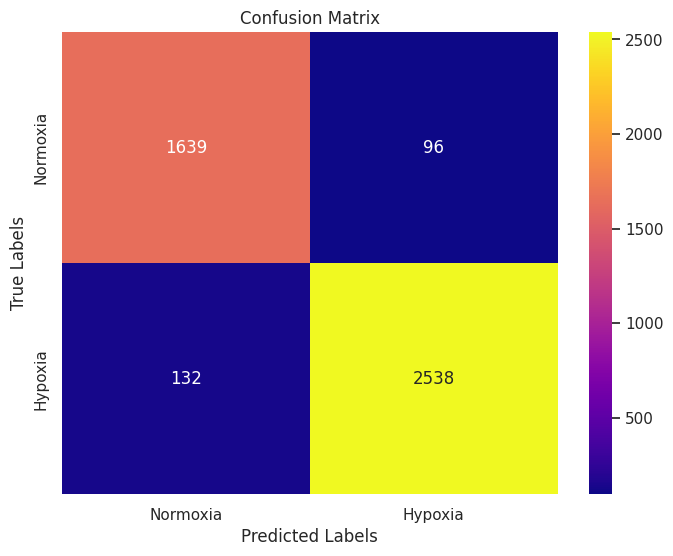

In [ ]:
conf_matrix = confusion_matrix(y_HCC1806_D_test, y_pred)
class_labels = ['Normoxia', 'Hypoxia']

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="plasma", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto

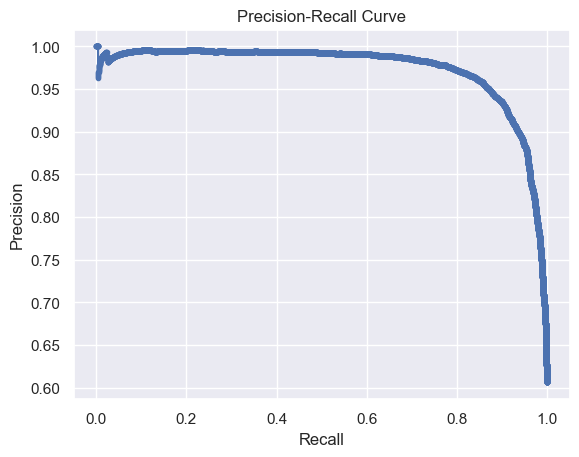

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


Accuracy on test set: 0.905788876276958


In [40]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', LinearSVC())
])

predicted_probabilities = cross_val_predict(pipeline, X_HCC1806_D_train, y_HCC1806_D_train, cv=5, method='decision_function')

precision, recall, thresholds = precision_recall_curve(y_HCC1806_D_train, predicted_probabilities)

plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

pipeline.fit(X_HCC1806_D_train, y_HCC1806_D_train)
test_accuracy = pipeline.score(X_HCC1806_D_test, y_HCC1806_D_test)
print("Accuracy on test set:", test_accuracy)

Let's see if we can increase accuracy by using a different SVM model, with a string kernel.

A string kernel is a type of kernel function specifically designed for processing sequences or strings of symbols. Unlike traditional kernels used in SVMs, which operate on vectors of numerical features, string kernels operate directly on strings or sequences, making them suitable for tasks involving text, DNA sequences, protein sequences, and other types of sequences.

In [ ]:
kernel_matrix_train = pairwise_kernels(X_HCC1806_D_train, metric='linear')

svm_classifier = SVC(kernel='precomputed')
svm_classifier.fit(kernel_matrix_train, y_HCC1806_D_train)

SVC(kernel='precomputed')

In [ ]:
kernel_matrix_test = pairwise_kernels(X_HCC1806_D_test, X_HCC1806_D_train, metric='linear')
test_accuracy = svm_classifier.score(kernel_matrix_test, y_HCC1806_D_test)
print("Accuracy on test set:", test_accuracy)

Accuracy on test set: 0.9375709421112373


In [ ]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', SVC(kernel='precomputed'))
])

kernel_matrix_train = pairwise_kernels(X_HCC1806_D_train, metric='linear')
print(kernel_matrix_train.shape)

(10277, 10277)


In [ ]:
n_folds = 5
kf = KFold(n_splits=n_folds)
cv_scores = []

for train_index, val_index in kf.split(kernel_matrix_train):
    kernel_train_fold = kernel_matrix_train[train_index][:, train_index]
    y_train_fold = y_HCC1806_D_train.iloc[train_index]  # Use .iloc to access by position

    svm_classifier.fit(kernel_train_fold, y_train_fold)

    val_kernel = kernel_matrix_train[val_index][:, train_index]
    val_labels = y_HCC1806_D_train.iloc[val_index]  # Use .iloc to access by position
    val_accuracy = svm_classifier.score(val_kernel, val_labels)

    cv_scores.append(val_accuracy)

print("Cross-validation scores:", cv_scores)
print("Mean CV score:", np.mean(cv_scores))
print("Standard deviation of CV scores:", np.std(cv_scores))

Cross-validation scores: [0.9309338521400778, 0.9396887159533074, 0.9362530413625304, 0.9416058394160584, 0.9347931873479318]
Mean CV score: 0.9366549272439813
Standard deviation of CV scores: 0.0037436264053778393


This model seems to perform a bit better than the one before on the same dataset. Let's see if we can get an even higher accuracy score.

In [ ]:
svm_classifier = SVC(kernel='rbf')
svm_classifier.fit(X_HCC1806_D_train, y_HCC1806_D_train)

SVC()

In [ ]:
y_pred_test = svm_classifier.predict(X_HCC1806_D_test)
test_accuracy = accuracy_score(y_HCC1806_D_test, y_pred_test)
print("Accuracy on test set:", test_accuracy)

Accuracy on test set: 0.9582292849035188


This seems to perform the best so far. Can we improve even further if we tune the hyperparameters used by the model?

In [ ]:
param_grid = {
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto', 0.1, 1]
}

grid_search = GridSearchCV(SVC(kernel='rbf'), param_grid, cv=5)
grid_search.fit(X_HCC1806_D_train, y_HCC1806_D_train)

best_params = grid_search.best_params_
print("Best Parameters:", best_params)

best_svm_model = grid_search.best_estimator_

test_accuracy = best_svm_model.score(X_HCC1806_D_test, y_HCC1806_D_test)
print("Accuracy on test set:", test_accuracy)

# Best Parameters: {'C': 10, 'gamma': 'scale'}
# Accuracy on test set: 0.9607264472190692

In [ ]:
best_params_rbf_HCC1806_D = {'C': 10, 'gamma': 'scale'}

In [ ]:
joblib.dump(best_svm_model, 'svc_model_rbf_HCC1806_D.joblib')

### RANDOM FOREST

**Random forest implementation** \
Now, we will try building a classifier using the Random Forest algorithm. This machine learning technique, used for both classification and regression, is mainly based on the concept of decision trees. In a decision tree each node represents a test to perform on our data; for instance, checking gene expression to be above or below a value. After performing a series of tests, the tree brings us to a leaf which will hopefully correctly label our data. The Random Forest method implements decision trees alongside ensamble learning. In the training phase, it uses different randomly chosen subsets of the data and the features to build multiple decision trees. In our case, our aim is to build a classifier which correctly distinguishes cells cultivated in hypoxia or normoxia. Since we are facing a classification problem, we will chose the best answer using majority among the trees' outcomes. 

**Random Forests in bioinformatics**\
The RF technique is highly data adaptive, nonparametric, interpretable, efficient and generally has high prediction accuracy. This has made RF particularly popular in recent work in computational biology due to its advantages when dealing with small sample size and high-dimensional feature space.

**Data preprocessing and dataset choice** \
When approaching this problem we had to choose whether to apply the Random Forest algorithm directly on the data or to use PCA to reduce the dimensionality of the data before approaching the problem. Using PCA will speed up the process, but it generally makes it harder to interpret feature importance.\
In order to have the best possible accuracy while still being able to make some insightful observations, I decided to start by implementing the Random Forest algorithm on the non-reduced data.\
In the preprocessing we have added a column to the dataset which will act as our target, denoting 1 for Hypoxia and 0 for Normoxia. Since the dataset is already Normalized and Filtered we don't need to make any further adjustments to the data.

**Splitting the dataset** \
In order to be able to  evaluate the classifier's performance, we need to split our data into a training set and a test set, so that we check accuracy on unseen data.\
In the data preprocessing section we have used the Scikit-learn “train_test_split” function to split the dataset accordingly and we'll use these split datasets in this section as well. For the SmartSeq dataset, we chose a 50/50 division since the dataset is relatively small and we want to make sure that both the training and the test sets have enough data to analyse. For the DropSeq, which has larger dimension, we chose a 70/30 split to help raise accuracy, while still keeping the test set large enough to avoid overfitting and have enough data to test the classifiers' accuracy on.

**Building the classifier** \
The next step consists of building and training our classifier on our training data using the RandomForestClassifier() method. First of all, we begin the hyperparameter tuning. \
Random Forest Hyperparameters:
1. n_estimators: defining the number of trees to be used in the model (default = 100)
2. max_features: maximum featurs to select for each tree (default = None)
3. max_depth: maximum number of splits for each tree (default = None)
4. max_leaf_nodes: maximum node division should be done (default = None)
5. max_sample: maximum dimension of the subsets used to build the tree(default = None)
6. min_sample_split: minimum number of decision tree observations in each node (default = 2) \
Plus, we will check if it's convinient to use bootstrap or not.
We will use RandomSearchCV method.




In [ ]:
#we build a unique function to tune the hyperparameters. This way we can easily use it for each dataset. We'll do the same later to build the classifier
#hyperparameter tuning
def hyperparameter_tuning_RandomForest(X_train, y_train):
  model = RandomForestClassifier(random_state=42)
  #setting ranges
  n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
  max_features = ['log2', 'sqrt']
  max_depth = [int(x) for x in np.linspace(start = 1, stop = 15, num = 15)]
  min_samples_split = [int(x) for x in np.linspace(start = 2, stop = 50, num = 10)]
  min_samples_leaf = [int(x) for x in np.linspace(start = 2, stop = 50, num = 10)]
  bootstrap = [True, False]
  param_dist = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
  #tuning
  rs = RandomizedSearchCV(model, param_dist, n_iter = 20,cv = 5, verbose = 1, n_jobs=-1, random_state=42)
  rs.fit(X_train, y_train)
  #printing and returning best parameters
  best_params = rs.best_params_
  print(best_params)
  return best_params

In [ ]:
def RandomForest(X_train, y_train, X_test, y_test, best_params):
  #building the classifier
  model_RandomForest= RandomForestClassifier(**best_params, random_state=42)
  model_RandomForest.fit(X_train, y_train)
  #model evaluation: After completing the training phase, we evaluate the classifier's performance on the test set.
  y_pred_rand = model_RandomForest.predict(X_test)
  print(classification_report(y_test, y_pred_rand))
  #In order to better visualize the prediction, we build a confusion matrix to visualize the product of our model.
  cm = confusion_matrix(y_test, y_pred_rand)
  # Create a heatmap of the confusion matrix
  plt.figure(figsize=(8, 6))
  sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
  # Add labels and title
  plt.xlabel('Predicted labels')
  plt.ylabel('True labels')
  plt.title('Confusion Matrix')
  # Show the plot
  plt.show()
  return model_RandomForest

**Results and interpretations**\
We now take a deeper look on what we can deduce from our model. In particular we will take a look at which features are most relevant for our classification process.\
For our evaluation we use the feature_importance_ property in the built-in method RandomForestClassifier(), i.e. the impurity-based feature importances. The higher **it is**, the more important the feature. The importance of a feature is computed as the (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance.

In [ ]:
def feature_importance_display(X_train, model):
    feats = {}
    for feature, importance in zip(X_train.columns, model.feature_importances_):
      feats[feature] = importance
    importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Feature Importance'})
    importances = importances.sort_values(by='Feature Importance', ascending=False)
    importances = importances.reset_index()
    importances = importances.rename(columns={'index': 'Features'})
    print(importances)
    # Extract the first 20 features and their importance scores
    top_20_features = importances.head(20)
    # Create the histogram
    plt.figure(figsize=(50, 25))
    plt.xticks(fontsize=40)
    plt.yticks(fontsize=40)
    plt.barh(top_20_features['Features'], top_20_features['Feature Importance'], color='skyblue')
    plt.xlabel('Feature Importance')
    plt.ylabel('Feature')
    plt.title('Top 20 Most Important Features', fontsize=40)
    plt.gca().invert_yaxis()  # Invert y-axis to display most important features at the top
    plt.tight_layout()  # Adjust layout to prevent clipping of labels
    plt.show()

#### MCF7 SmartSeq

Fitting 5 folds for each of 20 candidates, totalling 100 fits
{'n_estimators': 900, 'min_samples_split': 28, 'min_samples_leaf': 7, 'max_features': 'log2', 'max_depth': 5, 'bootstrap': False}
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        63
           1       0.98      1.00      0.99        62

    accuracy                           0.99       125
   macro avg       0.99      0.99      0.99       125
weighted avg       0.99      0.99      0.99       125



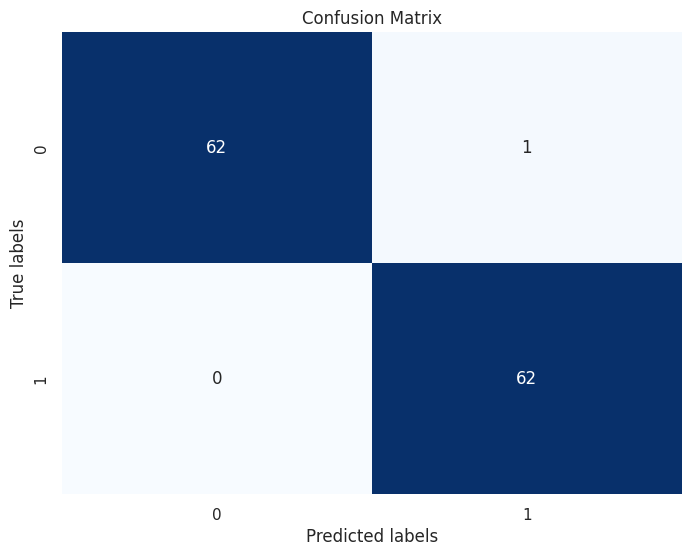

       Features  Feature Importance
0       "GAPDH"            0.009206
1      "ARPC1B"            0.008445
2         "UBC"            0.008233
3      "PFKFB4"            0.007958
4     "MT-ATP8"            0.007811
...         ...                 ...
2995    "FCRLB"            0.000000
2996   "CLTCL1"            0.000000
2997      "GCK"            0.000000
2998   "ADAM12"            0.000000
2999      "ACE"            0.000000

[3000 rows x 2 columns]


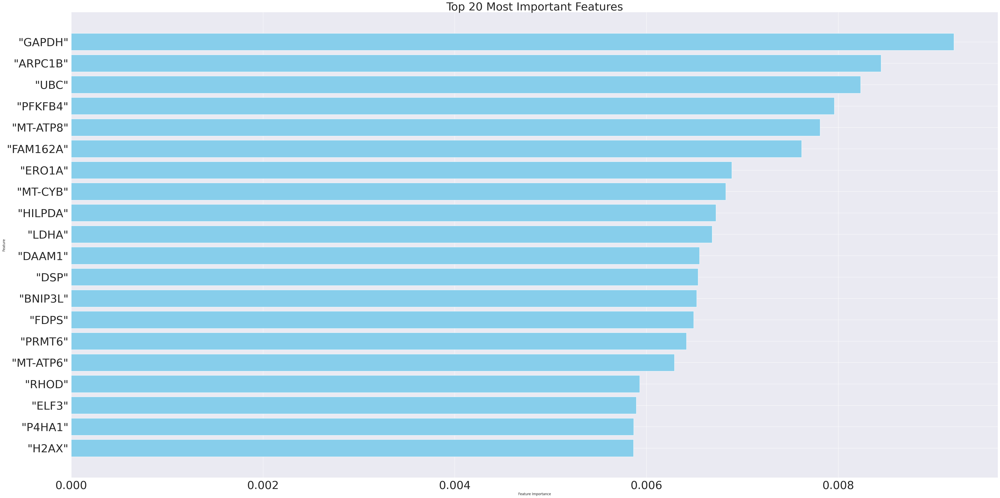

['rf_MCF7_S.pkl']

In [ ]:
best_paramsMCF7_S = hyperparameter_tuning_RandomForest(X_MCF7_S_train, y_MCF7_S_train)
rf_MCF7_S = RandomForest(X_MCF7_S_train, y_MCF7_S_train, X_MCF7_S_test, y_MCF7_S_test, best_paramsMCF7_S)
feature_importance_display(X_MCF7_S_train, rf_MCF7_S)
joblib.dump(rf_MCF7_S, 'rf_MCF7_S.pkl')

#### MCF7 DropSeq

Fitting 5 folds for each of 20 candidates, totalling 100 fits
{'n_estimators': 600, 'min_samples_split': 18, 'min_samples_leaf': 39, 'max_features': 'sqrt', 'max_depth': 15, 'bootstrap': False}
              precision    recall  f1-score   support

           0       0.93      0.99      0.96      3812
           1       0.99      0.89      0.94      2676

    accuracy                           0.95      6488
   macro avg       0.96      0.94      0.95      6488
weighted avg       0.95      0.95      0.95      6488



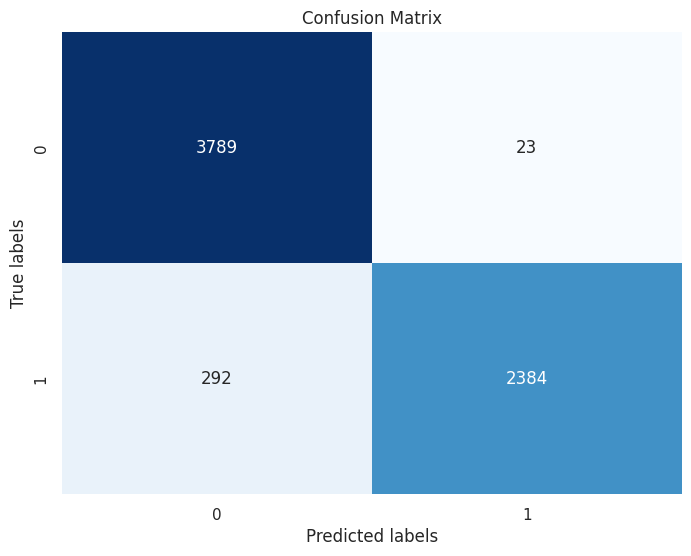

        Features  Feature Importance
0      "MT-RNR2"            0.054501
1         "TFF1"            0.053996
2        "KRT19"            0.045680
3       "TMSB10"            0.038756
4        "GAPDH"            0.037396
...          ...                 ...
2995     "LATS2"            0.000000
2996    "EMX2OS"            0.000000
2997    "MAGEF1"            0.000000
2998    "MSL3P1"            0.000000
2999  "GNAO1-DT"            0.000000

[3000 rows x 2 columns]


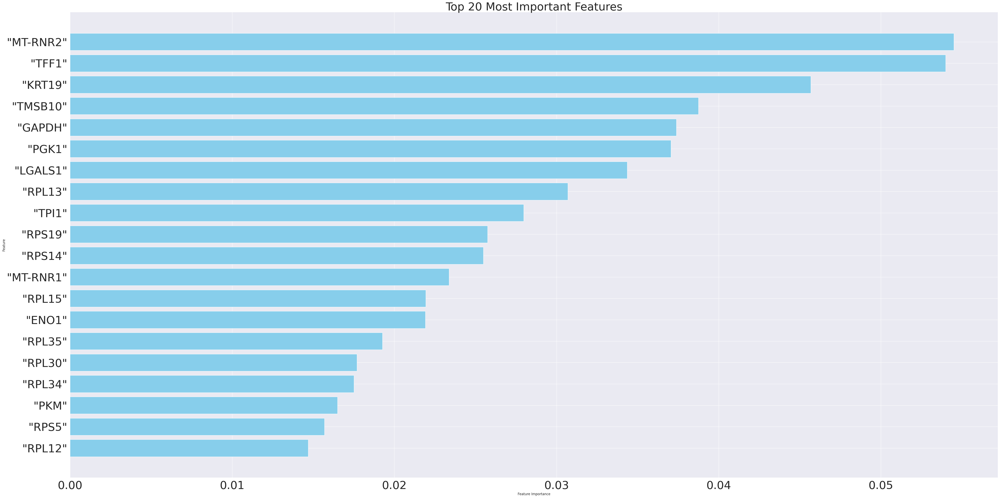

['rf_MCF7_D.pkl']

In [ ]:
best_paramsMCF7_D = hyperparameter_tuning_RandomForest(X_MCF7_D_train, y_MCF7_D_train)
rf_MCF7_D = RandomForest(X_MCF7_D_train, y_MCF7_D_train, X_MCF7_D_test, y_MCF7_D_test, best_paramsMCF7_D)
feature_importance_display(X_MCF7_D_train, rf_MCF7_D)
joblib.dump(rf_MCF7_D, 'rf_MCF7_D.pkl')

#### HCC1806 SmartSeq

Fitting 5 folds for each of 20 candidates, totalling 100 fits
{'n_estimators': 500, 'min_samples_split': 50, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'max_depth': 4, 'bootstrap': False}
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        43
           1       1.00      0.98      0.99        48

    accuracy                           0.99        91
   macro avg       0.99      0.99      0.99        91
weighted avg       0.99      0.99      0.99        91



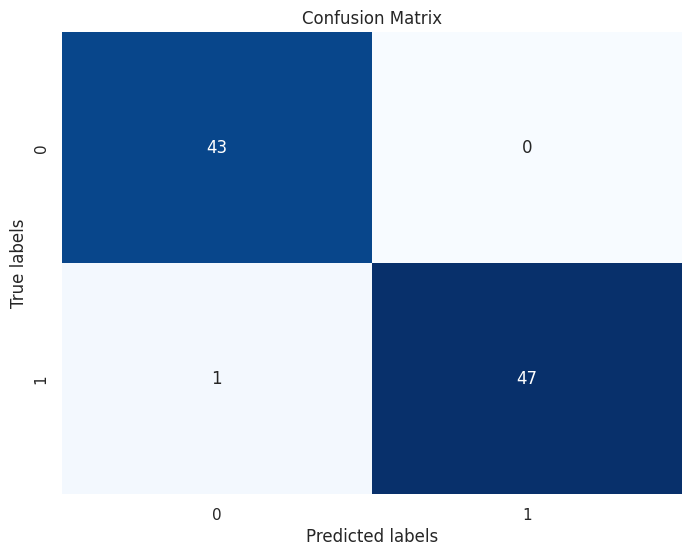

       Features  Feature Importance
0       "DDIT4"            0.029074
1      "KCTD11"            0.028161
2     "ANGPTL4"            0.026722
3       "FUT11"            0.024445
4        "LDHA"            0.023527
...         ...                 ...
2995    "RGS16"            0.000000
2996    "TTC28"            0.000000
2997     "TEP1"            0.000000
2998   "CACFD1"            0.000000
2999    "ODAD2"            0.000000

[3000 rows x 2 columns]


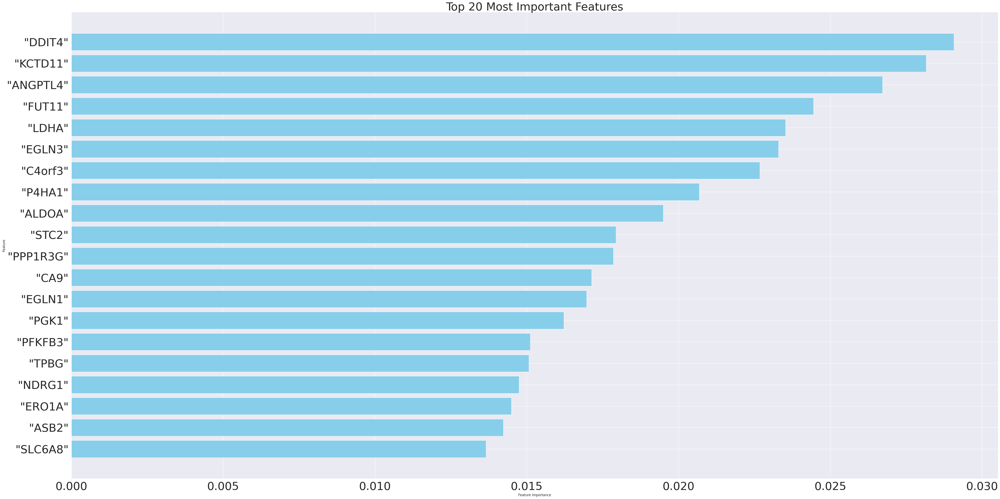

['rf_HCC1806_S.pkl']

In [ ]:
best_paramsHCC1806_S = hyperparameter_tuning_RandomForest(X_HCC1806_S_train, y_HCC1806_S_train)
rf_HCC1806_S = RandomForest(X_HCC1806_S_train, y_HCC1806_S_train, X_HCC1806_S_test, y_HCC1806_S_test, best_paramsHCC1806_S)
feature_importance_display(X_HCC1806_S_train, rf_HCC1806_S)
joblib.dump(rf_HCC1806_S, 'rf_HCC1806_S.pkl')

#### HCC1806 DropSeq

Fitting 5 folds for each of 20 candidates, totalling 100 fits
{'n_estimators': 600, 'min_samples_split': 18, 'min_samples_leaf': 39, 'max_features': 'sqrt', 'max_depth': 15, 'bootstrap': False}
              precision    recall  f1-score   support

           0       0.98      0.74      0.85      1735
           1       0.86      0.99      0.92      2670

    accuracy                           0.89      4405
   macro avg       0.92      0.87      0.88      4405
weighted avg       0.90      0.89      0.89      4405



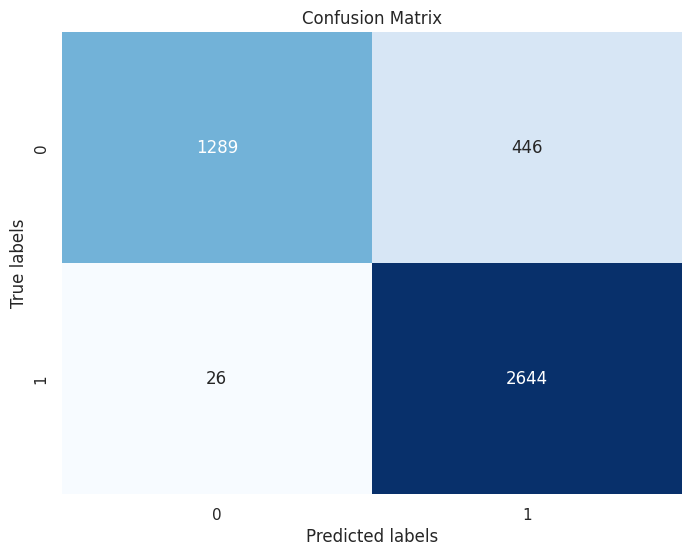

         Features  Feature Importance
0         "NDRG1"            0.055886
1        "AKR1C2"            0.048247
2        "AKR1C1"            0.043031
3         "FGF23"            0.039893
4         "WDR43"            0.037471
...           ...                 ...
2995  "MIF4GD-DT"            0.000000
2996       "ZXDC"            0.000000
2997      "MARK1"            0.000000
2998      "CDHR3"            0.000000
2999     "ZNF682"            0.000000

[3000 rows x 2 columns]


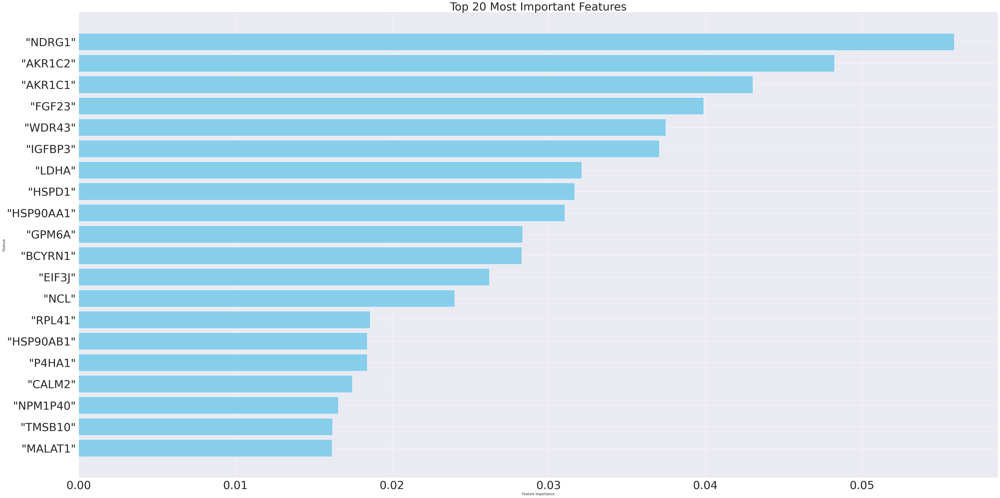

['rf_HCC1806_D.pkl']

In [ ]:
best_paramsHCC1806_D = hyperparameter_tuning_RandomForest(X_HCC1806_D_train, y_HCC1806_D_train)
rf_HCC1806_D = RandomForest(X_HCC1806_D_train, y_HCC1806_D_train, X_HCC1806_D_test, y_HCC1806_D_test, best_paramsHCC1806_D)
feature_importance_display(X_HCC1806_D_train, rf_HCC1806_D)
joblib.dump(rf_HCC1806_D, 'rf_HCC1806_D.pkl')

### BOOSTING

Our final goal, as defined previously, is to predict whether we have a Normoxia or Hypoxia condition. To address this predictive challenge, machine learning techniques offer a powerful toolset. Among these, CatBoost stands out as an efficient algorithm capable of effectively handling high-dimensional biological data, like the ones we have in this case, and categorical features, which are prevalent in genomic studies (in this case, precisely the condition). \
CatBoost is a gradient boosting framework, that combines multiple weak learners to create a strong learner. The basic idea behind boosting is to sequentially train a series of decision trees where each subsequent model corrects the errors of its predecessor. \
In particular, CatBoost excels in predicting binary outcomes, making it particularly useful for tasks like classifying cellular responses into normoxic or hypoxic conditions based on gene expression profiles. \
The steps that need to be done for what concerns this specific supervised technique are the following:
1. Preparing the data;
2. Building the classifier;
3. Training the classifier;
4. Checking the accuracy of the classifier.

**Preparing the data** \
This step has been already done in the section "Preparation of the data" in the beginning of the supervised learning part, where we have not only opened and rearranged the datasets, but also split the data in train and test set thanks to the appropriate Scikit-learn function. \
Recall that, analysing the dimension and the structure of the datasets, we decided to split the SmartSeq and DropSeq data respectively in 50/50 and 70/30 proportion. This choice has been made in order to avoid overfitting, still having a lot of data to test the classifier. \
With that being said, since the data has already been prepared, we can proceed with the next step.

**Building the classifier** \
To define the classifier, we need to both build it and execute the hyperparameters' tuning. At this regard, we define a function, since it's easier to then recall it when necessary (expecially for the ensemble learning), where appear four main parameters typical of the CatBoost technique:
- Iterations: number of necessary boosting iterations (or, at least, the sufficient ones);
- Learning rate: hyperparameter that controls the contribution of each tree to the final ensemble model;
- Evaluation metric: measure used to assess the performance of the model on unseen data, on which we base the whole boosting procedure;
- Verbose: parameter that controls the amount of information printed to the console during the training process.

Also note that for the hyperparameter tuning we'll use the Grid Search technique, so we will create a parameter grid for the hyperparameters we focus on and, after applying the GridSearchCV function, we'll find the optimal combination of hyperparameters for a given model in such a way that the accuracy is optimized.

In [ ]:
def grid_search_catboost(X_train, y_train, X_test, y_test):
  # Initializing the CatBoost classifier with a generic setting
  cb = CatBoostClassifier(eval_metric='Accuracy', verbose=5)
  # Defining the grid of hyperparameters
  params_cb = {
        'iterations': [500, 600, 700],
        'learning_rate': [0.2, 0.3, 0.4],
  }
  # Creating a GridSearchCV object based on the grid just created and fitting it to the training data
  cb_gridsearch = GridSearchCV(cb, params_cb, cv=3, scoring='accuracy', verbose=3)
  cb_gridsearch.fit(X_train, y_train)
  # Finding the best estimator model, parameters and cross-validated score achieved during Grid Search
  best_cb = cb_gridsearch.best_estimator_
  cb_bestparams = cb_gridsearch.best_params_
  cb_bestscore = cb_gridsearch.best_score_
  # Evaluating the accuracy of the best model on the test set
  cb_accuracy = best_cb.score(X_test, y_test)
  # Returning our results
  return best_cb, cb_bestparams, cb_bestscore, cb_accuracy

In [ ]:
# We define a print functions that outputs the relevant results found before
def print_catboost(best_cb, cb_bestparams, cb_bestscore, cb_accuracy):
  print("Best Parameters:", cb_bestparams)
  print("Best Score:", cb_bestscore)
  print("Accuracy on Test Set with Best Parameters:", cb_accuracy)

In addition, we can visually see how and how well the classifier works thanks to some plotting. \
The two ones we'll focus on are confusion matrix, that can help us visualizing the accuracy, and feature importance histograms, which show how the various gene influence the classification.

In [ ]:
def plot_confusion_matrix(y_true, y_pred):
  cm = confusion_matrix(y_true, y_pred)
  plt.figure(figsize=(8, 6))
  sns.heatmap(cm, annot=True, cmap='plasma', fmt='g', cbar=False)
  plt.xlabel('Predicted labels')
  plt.ylabel('True labels')
  plt.title('Confusion Matrix')
  plt.show()

In [ ]:
def plot_feature_importance(best_cb, feature_names):
  feature_importances = best_cb.get_feature_importance()
  feature_importance_df = pd.DataFrame({
      'Feature': feature_names,
      'Importance': feature_importances
  }).sort_values(by='Importance', ascending=False).head(20)     # we focus on the 20 most relevant features

  plt.figure(figsize=(30, 15))
  sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
  plt.xlim(0, feature_importance_df['Importance'].iloc[0]+1)
  plt.title('Feature Importance')
  plt.show()

At this point, we take one by one the various datasets and we proceed by doing the following steps (recalling the previously defined functions):
- Grid Search with the catboost function;
- Printing the results;
- Saving the best model;
- Plotting the confusion matrix and the feature importance.

#### MCF7 - SmartSeq

In [ ]:
best_cb_MCF7_S, cb_bestparams_MCF7_S, cb_bestscore_MCF7_S, cb_accuracy_MCF7_S = grid_search_catboost(X_MCF7_S_train, y_MCF7_S_train, X_MCF7_S_test, y_MCF7_S_test)
print_catboost(best_cb_MCF7_S, cb_bestparams_MCF7_S, cb_bestscore_MCF7_S, cb_accuracy_MCF7_S)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
0:	learn: 0.9638554	total: 35ms	remaining: 17.5s
5:	learn: 1.0000000	total: 176ms	remaining: 14.5s
10:	learn: 1.0000000	total: 311ms	remaining: 13.8s
15:	learn: 1.0000000	total: 445ms	remaining: 13.5s
20:	learn: 1.0000000	total: 573ms	remaining: 13.1s
25:	learn: 1.0000000	total: 682ms	remaining: 12.4s
30:	learn: 1.0000000	total: 804ms	remaining: 12.2s
35:	learn: 1.0000000	total: 939ms	remaining: 12.1s
40:	learn: 1.0000000	total: 1.09s	remaining: 12.3s
45:	learn: 1.0000000	total: 1.27s	remaining: 12.6s
50:	learn: 1.0000000	total: 1.42s	remaining: 12.5s
55:	learn: 1.0000000	total: 1.56s	remaining: 12.3s
60:	learn: 1.0000000	total: 1.7s	remaining: 12.2s
65:	learn: 1.0000000	total: 1.83s	remaining: 12.1s
70:	learn: 1.0000000	total: 1.97s	remaining: 11.9s
75:	learn: 1.0000000	total: 2.1s	remaining: 11.7s
80:	learn: 1.0000000	total: 2.24s	remaining: 11.6s
85:	learn: 1.0000000	total: 2.38s	remaining: 11.4s
90:	learn: 1.0000000	total:

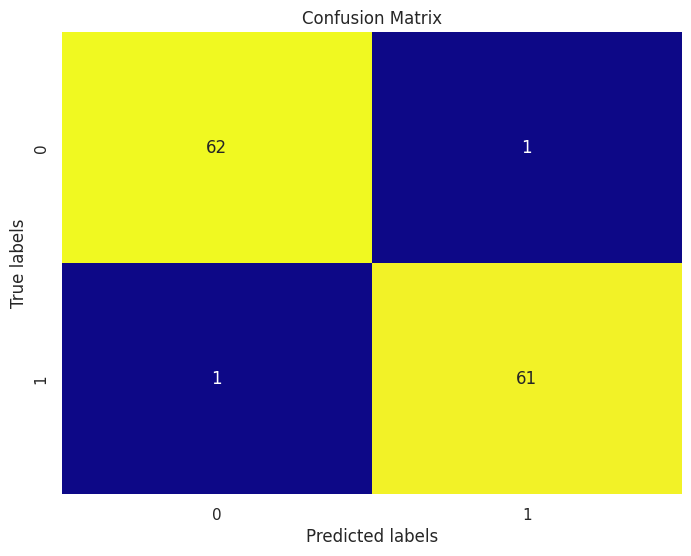

In [ ]:
# Confusion matrix
y_pred_MCF7_S = best_cb_MCF7_S.predict(X_MCF7_S_test)
plot_confusion_matrix(y_MCF7_S_test, y_pred_MCF7_S)

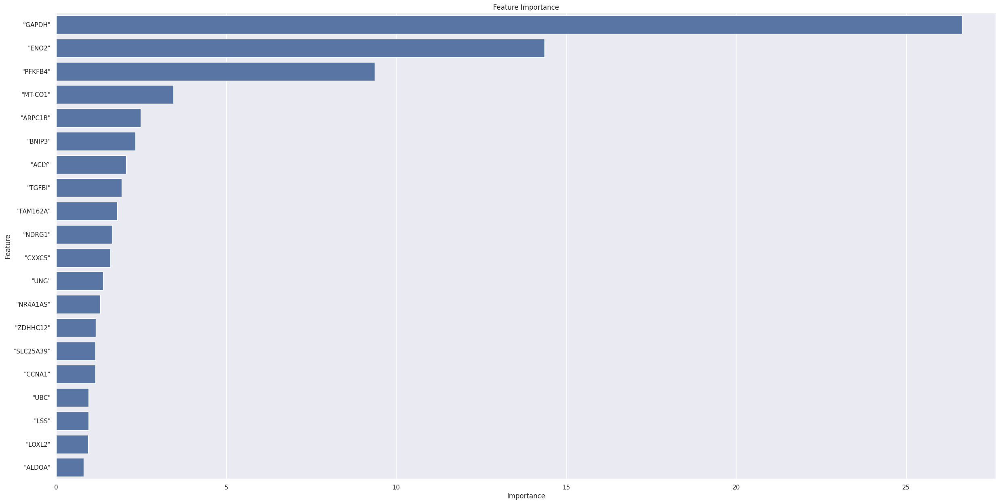

In [ ]:
# Feature importance
plot_feature_importance(best_cb_MCF7_S, X_MCF7_S_train.columns)

In [ ]:
joblib.dump(best_cb_MCF7_S, 'cb_MCF7_S.pkl')

['cb_MCF7_S.pkl']

#### MCF7 - DropSeq

In [ ]:
best_cb_MCF7_D, cb_bestparams_MCF7_D, cb_bestscore_MCF7_D, cb_accuracy_MCF7_D = grid_search_catboost(X_MCF7_D_train, y_MCF7_D_train, X_MCF7_D_test, y_MCF7_D_test)
print_catboost(best_cb_MCF7_D, cb_bestparams_MCF7_D, cb_bestscore_MCF7_D, cb_accuracy_MCF7_D)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
0:	learn: 0.8848593	total: 10.5ms	remaining: 5.23s
5:	learn: 0.9527348	total: 56.9ms	remaining: 4.69s
10:	learn: 0.9643282	total: 103ms	remaining: 4.58s
15:	learn: 0.9720571	total: 149ms	remaining: 4.51s
20:	learn: 0.9756243	total: 194ms	remaining: 4.43s
25:	learn: 0.9784978	total: 240ms	remaining: 4.38s
30:	learn: 0.9811732	total: 281ms	remaining: 4.26s
35:	learn: 0.9827586	total: 324ms	remaining: 4.18s
40:	learn: 0.9842449	total: 366ms	remaining: 4.1s
45:	learn: 0.9848395	total: 407ms	remaining: 4.02s
50:	learn: 0.9854340	total: 449ms	remaining: 3.95s
55:	learn: 0.9869203	total: 494ms	remaining: 3.92s
60:	learn: 0.9884067	total: 536ms	remaining: 3.86s
65:	learn: 0.9899921	total: 578ms	remaining: 3.8s
70:	learn: 0.9903884	total: 620ms	remaining: 3.75s
75:	learn: 0.9905866	total: 664ms	remaining: 3.7s
80:	learn: 0.9912802	total: 709ms	remaining: 3.67s
85:	learn: 0.9919738	total: 755ms	remaining: 3.63s
90:	learn: 0.9924693	tota

['cb_MCF7_D.pkl']

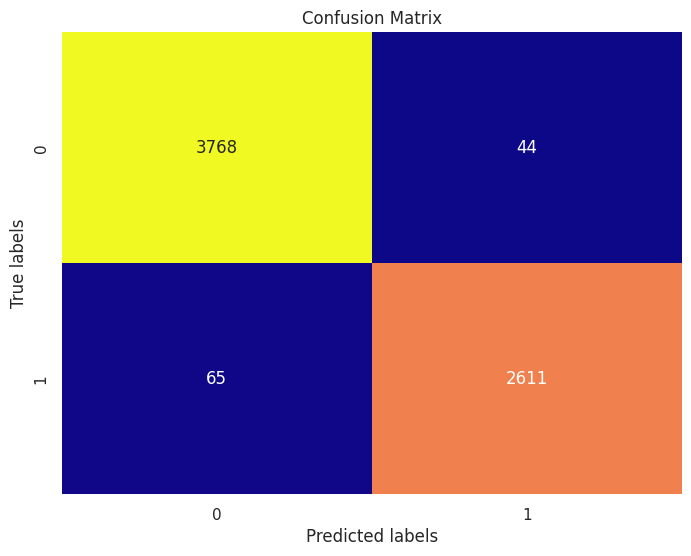

In [ ]:
# Confusion matrix
y_pred_MCF7_D = best_cb_MCF7_D.predict(X_MCF7_D_test)
plot_confusion_matrix(y_MCF7_D_test, y_pred_MCF7_D)

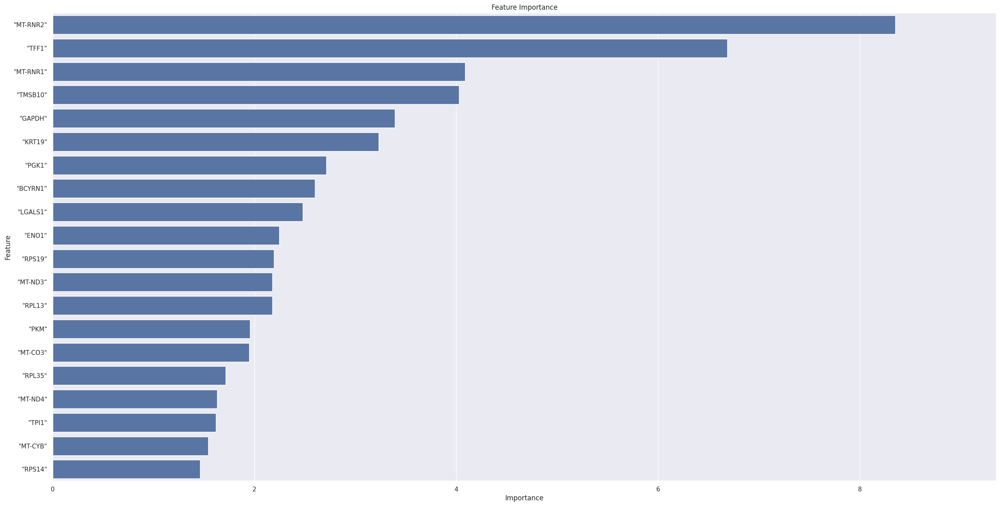

In [ ]:
# Feature importance
plot_feature_importance(best_cb_MCF7_D, X_MCF7_D_train.columns)

In [ ]:
joblib.dump(best_cb_MCF7_D, 'cb_MCF7_D.pkl')

['cb_MCF7_D.pkl']

#### HCC1806 - SmartSeq

In [ ]:
best_cb_HCC1806_S, cb_bestparams_HCC1806_S, cb_bestscore_HCC1806_S, cb_accuracy_HCC1806_S = grid_search_catboost(X_HCC1806_S_train, y_HCC1806_S_train, X_HCC1806_S_test, y_HCC1806_S_test)
print_catboost(best_cb_HCC1806_S, cb_bestparams_HCC1806_S, cb_bestscore_HCC1806_S, cb_accuracy_HCC1806_S)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
0:	learn: 0.9500000	total: 26ms	remaining: 13s
5:	learn: 1.0000000	total: 121ms	remaining: 9.98s
10:	learn: 1.0000000	total: 212ms	remaining: 9.4s
15:	learn: 1.0000000	total: 302ms	remaining: 9.14s
20:	learn: 1.0000000	total: 392ms	remaining: 8.95s
25:	learn: 1.0000000	total: 489ms	remaining: 8.91s
30:	learn: 1.0000000	total: 570ms	remaining: 8.62s
35:	learn: 1.0000000	total: 653ms	remaining: 8.41s
40:	learn: 1.0000000	total: 733ms	remaining: 8.2s
45:	learn: 1.0000000	total: 811ms	remaining: 8s
50:	learn: 1.0000000	total: 889ms	remaining: 7.83s
55:	learn: 1.0000000	total: 970ms	remaining: 7.69s
60:	learn: 1.0000000	total: 1.05s	remaining: 7.57s
65:	learn: 1.0000000	total: 1.14s	remaining: 7.48s
70:	learn: 1.0000000	total: 1.22s	remaining: 7.38s
75:	learn: 1.0000000	total: 1.32s	remaining: 7.36s
80:	learn: 1.0000000	total: 1.43s	remaining: 7.4s
85:	learn: 1.0000000	total: 1.53s	remaining: 7.37s
90:	learn: 1.0000000	total: 1.62s

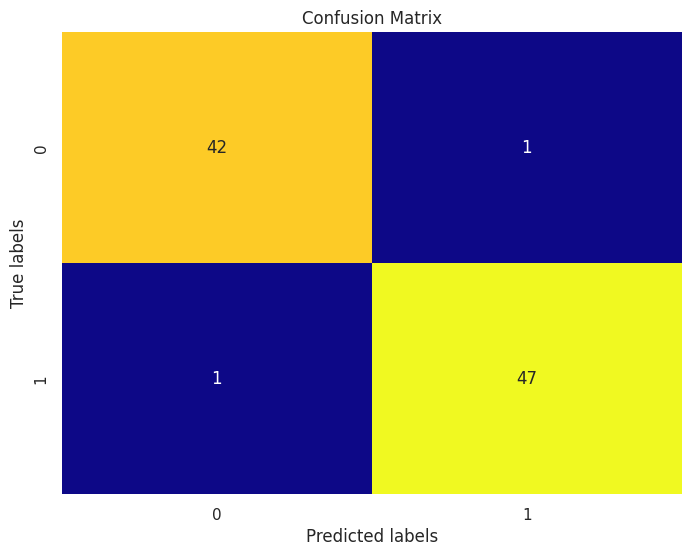

In [ ]:
# Confusion matrix
y_pred_HCC1806_S = best_cb_HCC1806_S.predict(X_HCC1806_S_test)
plot_confusion_matrix(y_HCC1806_S_test, y_pred_HCC1806_S)

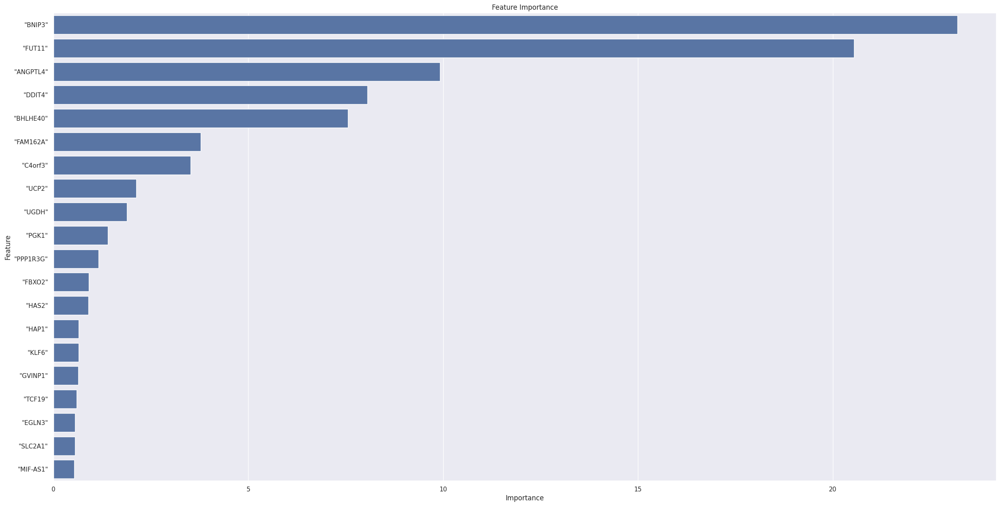

In [ ]:
# Feature importance
plot_feature_importance(best_cb_HCC1806_S, X_HCC1806_S_train.columns)

In [ ]:
joblib.dump(best_cb_HCC1806_S, 'cb_HCC1806_S.pkl')

['cb_HCC1806_S.pkl']

#### HCC1806 - DropSeq

In [ ]:
best_cb_HCC1806_D, cb_bestparams_HCC1806_D, cb_bestscore_HCC1806_D, cb_accuracy_HCC1806_D = grid_search_catboost(X_HCC1806_D_train, y_HCC1806_D_train, X_HCC1806_D_test, y_HCC1806_D_test)
print_catboost(best_cb_HCC1806_D, cb_bestparams_HCC1806_D, cb_bestscore_HCC1806_D, cb_accuracy_HCC1806_D)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
0:	learn: 0.7830974	total: 8.15ms	remaining: 4.07s
5:	learn: 0.8877536	total: 46.4ms	remaining: 3.82s
10:	learn: 0.9178222	total: 81.8ms	remaining: 3.64s
15:	learn: 0.9297913	total: 118ms	remaining: 3.57s
20:	learn: 0.9388410	total: 150ms	remaining: 3.43s
25:	learn: 0.9478908	total: 182ms	remaining: 3.32s
30:	learn: 0.9506641	total: 214ms	remaining: 3.23s
35:	learn: 0.9541673	total: 245ms	remaining: 3.16s
40:	learn: 0.9569406	total: 277ms	remaining: 3.1s
45:	learn: 0.9610276	total: 309ms	remaining: 3.05s
50:	learn: 0.9640928	total: 341ms	remaining: 3s
55:	learn: 0.9673040	total: 372ms	remaining: 2.95s
60:	learn: 0.9689096	total: 403ms	remaining: 2.9s
65:	learn: 0.9719749	total: 434ms	remaining: 2.85s
70:	learn: 0.9746022	total: 464ms	remaining: 2.8s
75:	learn: 0.9767917	total: 495ms	remaining: 2.76s
80:	learn: 0.9773756	total: 524ms	remaining: 2.71s
85:	learn: 0.9778135	total: 553ms	remaining: 2.66s
90:	learn: 0.9791271	total:

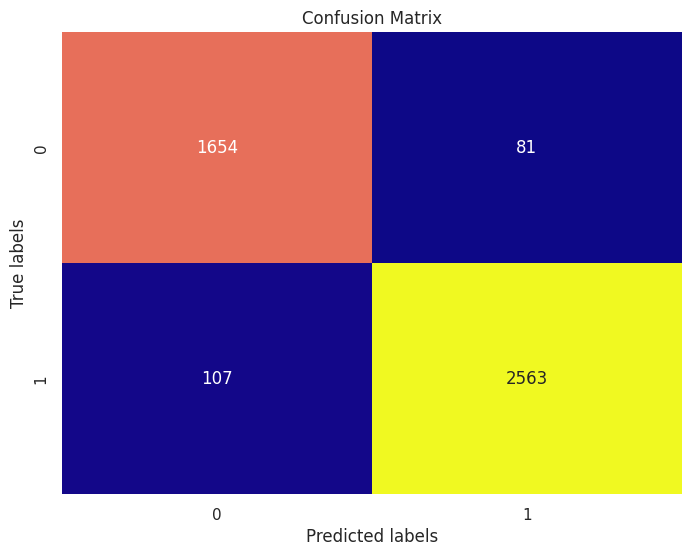

In [ ]:
# Confusion matrix
y_pred_HCC1806_D = best_cb_HCC1806_D.predict(X_HCC1806_D_test)
plot_confusion_matrix(y_HCC1806_D_test, y_pred_HCC1806_D)

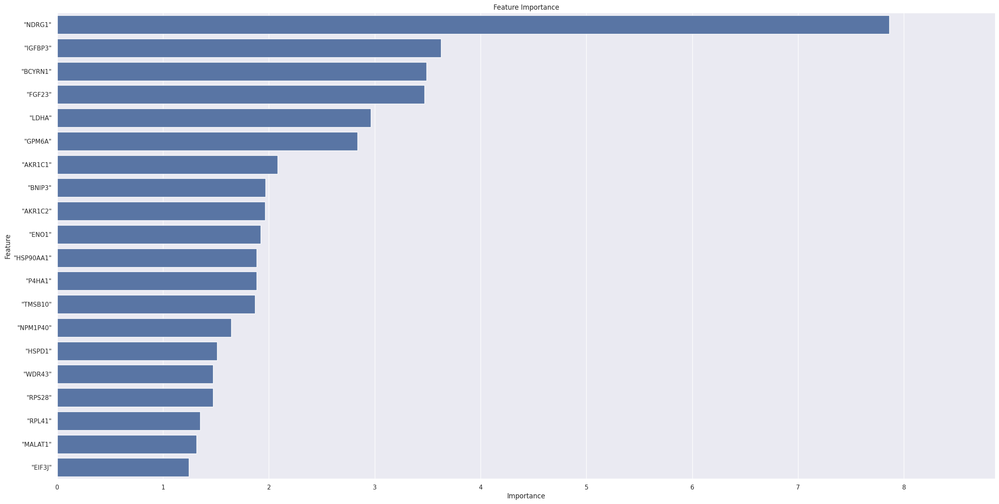

In [ ]:
# Feature importance
plot_feature_importance(best_cb_HCC1806_D, X_HCC1806_D_train.columns)

In [ ]:
joblib.dump(best_cb_HCC1806_D, 'cb_HCC1806_D.pkl')

['cb_HCC1806_D.pkl']

### NEURAL NETWORK

Neural networks, inspired by the structure and functioning of the human brain, are computational models comprised of interconnected nodes, or neurons, organized into layers. These models excel at learning complex patterns and relationships from data, making them invaluable tools in various fields, including cancer research.

As we have seen sevaral times throughout this report, cancer cells exhibit highly heterogeneous gene expression profiles, influenced by various factors. This heterogeneity poses a challenge for traditional analytical methods but presents an opportunity for neural networks to uncover hidden patterns and relationships within complex datasets.

For the sake of completeness, we will train neural networks for all of our datasets, even if the true objective is to have a high accuracy rate for those on which the previous models did not outperform, namely on the DropSeq data and on the general dataset.

To harness the potential of neural networks in analyzing cancer cell data, we have developed a function, grid_search_neural_network, aimed at optimizing neural network architectures for classifying cancer cells based on their gene expression profiles. A brief explanation of the key components of our function follows.

*   **Model Definition**. We start by defining a Multilayer Perceptron (MLP) classifier, a type of neural network capable of learning complex nonlinear relationships between input features and target labels. By customizing parameters such as activation functions and optimization algorithms, we can tailor the model to suit the characteristics of our dataset.

*   **Parameter Grid Specification**. We specify a parameter grid containing various hyperparameters that govern the architecture and training process of the neural network. These hyperparameters include the size and number of hidden layers, regularization strength, learning rate, and batch size. By systematically exploring different combinations of these hyperparameters, we aim to find the configuration that maximizes the model's predictive performance. Depending on the size of the datsets we are training the model on, we will either use an extensive hyperparameters finetuning through GridSearchCV, or a more computationally cheap procedure via RandomizedSearchCV.

*   **Regularization**. In order to prevent overfitting, we apply L2 (Ridge) regularization to the model, and finetune it through the search for a suitable value of the parameter `alpha`.

*   **Cross-Validation**. To ensure the robustness and generalizability of our models, we employ k-fold cross-validation. We set the number of splits to 5 for computational reasons. We could have even performed a one-leave-out crossvalidation, which would have strengthened our model; howver, on the hand it would have required high computational expenses on the largest models, while on the other hand it would have been of little use for smaller datsets, for previous mdoels already performed exceptionally well on these.

*   **Grid Search or Randomized Search**. Our function offers the flexibility to perform either grid search or randomized search for hyperparameter optimization. Grid search exhaustively evaluates all possible combinations of hyperparameters within the specified parameter grid, while randomized search samples from the parameter space according to a probability distribution. The former is applied to smaller datasets, while the latter to the larger ones, since it is computatinally cheaper. In both cases, it allows us to efficiently explore a wide range of hyperparameter configurations and identify promising candidates for further evaluation.

*   **Model Training and Evaluation**. Once the optimal hyperparameters are determined, we train the final neural network model on the entire training dataset. This involves iteratively adjusting the model's weights and biases to minimize the error between predicted and true labels. We then evaluate the trained model's performance on a separate test set, computing metrics such as accuracy, to assess its ability to correctly classify cancer cells based on their gene expression profiles.

In [ ]:
def grid_search_neural_network(X_train, y_train, X_test, y_test, random_state=42, random=True):
    # Define the neural network model
    mlp = MLPClassifier(activation='relu', solver='adam', random_state=random_state, max_iter=10000)

    # Define parameter grid for grid search
    param_grid = {
        'hidden_layer_sizes': [(50,), (100,), (50, 50)],
        'alpha': [0.0001, 0.001, 0.01],
        'learning_rate_init': [0.001, 0.01, 0.1],
        'batch_size': [16, 32, 64]
    }

    # Define k-fold cross-validation
    kfold = KFold(n_splits=5, shuffle=True, random_state=random_state)

    # Perform grid search with k-fold cross-validation
    if random is False:
        grid_search = GridSearchCV(mlp, param_grid, cv=kfold, scoring='accuracy')
    else:
        grid_search = RandomizedSearchCV(mlp, param_grid, cv=kfold, scoring='accuracy', random_state=random_state)
    grid_search.fit(X_train, y_train)

    # Print the best parameters and best score
    print("Best Parameters: ", grid_search.best_params_)

    # Train the final model with the best parameters
    best_mlp = MLPClassifier(activation='relu', solver='adam', random_state=random_state, max_iter=10000, **grid_search.best_params_)
    best_mlp.fit(X_train, y_train)

    # Make predictions
    y_pred = best_mlp.predict(X_test)

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy)

    return best_mlp

In [ ]:
NN_MCF7_S = grid_search_neural_network(X_MCF7_S_train, y_MCF7_S_train, X_MCF7_S_test, y_MCF7_S_test, random=False)
NN_MCF7_S
joblib.dump(NN_MCF7_S, 'nn_MCF7_S.pkl')

Best Parameters:  {'alpha': 0.0001, 'batch_size': 16, 'hidden_layer_sizes': (50,), 'learning_rate_init': 0.1}
Accuracy: 1.0


['nn_MCF7_S.pkl']

In [ ]:
NN_MCF7_D = grid_search_neural_network(X_MCF7_D_train, y_MCF7_D_train, X_MCF7_D_test, y_MCF7_D_test)
NN_MCF7_D
joblib.dump(NN_MCF7_D, 'nn_MCF7_D.pkl')

Best Parameters:  {'learning_rate_init': 0.001, 'hidden_layer_sizes': (100,), 'batch_size': 32, 'alpha': 0.01}
Accuracy: 0.9799630086313194


['nn_MCF7_D.pkl']

In [ ]:
NN_HCC1806_S = grid_search_neural_network(X_HCC1806_S_train, y_HCC1806_S_train, X_HCC1806_S_test, y_HCC1806_S_test, random=False)
NN_HCC1806_S
joblib.dump(NN_HCC1806_S, 'nn_HCC1806_S.pkl')

Best Parameters:  {'alpha': 0.001, 'batch_size': 32, 'hidden_layer_sizes': (50, 50), 'learning_rate_init': 0.01}
Accuracy: 0.978021978021978


['nn_HCC1806_S.pkl']

In [ ]:
NN_HCC1806_D = grid_search_neural_network(X_HCC1806_D_train, y_HCC1806_D_train, X_HCC1806_D_test, y_HCC1806_D_test)
NN_HCC1806_D
joblib.dump(NN_HCC1806_D, 'nn_HCC1806_D.pkl')

Best Parameters:  {'learning_rate_init': 0.01, 'hidden_layer_sizes': (100,), 'batch_size': 32, 'alpha': 0.0001}
Accuracy: 0.9507377979568672


['nn_HCC1806_D.pkl']

### ENSEMBLE LEARNING & FINAL TESTING

Individual models often face limitations in capturing the full complexity and variability inherent in biological data. Ensemble learning, which combines multiple models to create a more robust and accurate predictor, emerges as a powerful technique to address these limitations. By aggregating the strengths of various algorithms, ensemble methods can mitigate the weaknesses of single models and enhance predictive performance, particularly in challenging datasets such as gene expression profiles of cancer cells.

The gene expression data from cancer cells grown under normoxic and hypoxic conditions present significant challenges, including high dimensionality, noise, and intricate patterns of gene interaction. Individual models like logistic regression, random forests, stochastic gradient descent (SGD), support vector machines (SVM), CatBoost, and neural networks each have their unique advantages and disadvantages. However, none can fully encapsulate the complexity of the data on their own. This is where ensemble learning becomes invaluable. By combining the outputs of multiple models, we can achieve a more accurate and reliable prediction of gene expression changes in response to oxygen availability. Specifically, ensemble methods can reduce the variance and bias inherent in individual models, leading to better performance on both the training and validation datasets.

Through the deployment of ensemble learning techniques, we aim to leverage the full potential of our machine learning models, providing a comprehensive and nuanced analysis of transcriptional changes in HCC1806 and MCF7 cell lines under varying oxygen conditions. This approach not only enhances the reliability of our findings but also contributes to the broader goal of understanding cancer cell adaptation to hypoxia, ultimately informing the development of more effective therapeutic strategies.

In particular, we employed an ensemble learning approach using a VotingClassifier, which combines the predictions of multiple classifiers to produce a final prediction, either through majority voting (hard voting) or averaging the predicted probabilities (soft voting).

In [ ]:
def testing(path, model):
  # Load the new dataset
  df = pd.read_csv(path, delimiter="\ ",engine='python',index_col=0)
  df_T = df.T

  # Predict labels using the trained ensemble model
  model = joblib.load(model)
  predictions = model.predict(df_T)

  # Map the predictions from 0/1 to "Normoxia"/"Hypoxia"
  prediction_labels = ['Normoxia' if pred == 0 else 'Hypoxia' for pred in predictions]

  # Create a DataFrame to save predictions
  predictions_df = pd.DataFrame({
      'Sample': df_T.index,
      'Prediction': prediction_labels
  })

  return predictions_df

#### MCF7 - SmartSeq

In [ ]:
log_MCF7_S = joblib.load('/content/drive/MyDrive/AI_LAB/log_MCF7_S.pkl')
sgd_MCF7_S = joblib.load('/content/drive/MyDrive/AI_LAB/sgd_MCF7_S.pkl')
rf_MCF7_S = joblib.load('/content/drive/MyDrive/AI_LAB/rf_MCF7_S.pkl')
cb_MCF7_S = joblib.load('/content/drive/MyDrive/AI_LAB/cb_MCF7_S.pkl')
svm_MCF7_S = joblib.load('/content/drive/MyDrive/AI_LAB/svm_MCF7_S.pkl')
nn_MCF7_S = joblib.load('/content/drive/MyDrive/AI_LAB/nn_MCF7_S.pkl')

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator LogisticRegression from version 1.4.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SGDClassifier from version 1.4.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator LinearSVC from version 1.4.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more

In [ ]:
voting_classifier = VotingClassifier(estimators=[
    ('logistic', log_MCF7_S),
    ('sgd', sgd_MCF7_S),
    ('rf', rf_MCF7_S),
    ('catboost', cb_MCF7_S),
    ('svc', svm_MCF7_S),
    ('neural_network', nn_MCF7_S)
], voting='hard') # or voting='soft' for soft voting

voting_classifier.fit(X_MCF7_S_train, y_MCF7_S_train)

voting_classifier_score = voting_classifier.score(X_MCF7_S_test, y_MCF7_S_test)

joblib.dump(voting_classifier, 'ensemble_MCF7_S.pkl')

0:	learn: 0.9840000	total: 334ms	remaining: 2m 46s
5:	learn: 1.0000000	total: 1.61s	remaining: 2m 12s
10:	learn: 1.0000000	total: 2.92s	remaining: 2m 9s
15:	learn: 1.0000000	total: 4.18s	remaining: 2m 6s
20:	learn: 1.0000000	total: 5.33s	remaining: 2m 1s
25:	learn: 1.0000000	total: 6.55s	remaining: 1m 59s
30:	learn: 1.0000000	total: 7.73s	remaining: 1m 56s
35:	learn: 1.0000000	total: 9.4s	remaining: 2m 1s
40:	learn: 1.0000000	total: 11.4s	remaining: 2m 7s
45:	learn: 1.0000000	total: 13.6s	remaining: 2m 13s
50:	learn: 1.0000000	total: 15s	remaining: 2m 11s
55:	learn: 1.0000000	total: 16.3s	remaining: 2m 9s
60:	learn: 1.0000000	total: 17.6s	remaining: 2m 6s
65:	learn: 1.0000000	total: 19s	remaining: 2m 4s
70:	learn: 1.0000000	total: 20.2s	remaining: 2m 2s
75:	learn: 1.0000000	total: 21.6s	remaining: 2m
80:	learn: 1.0000000	total: 22.9s	remaining: 1m 58s
85:	learn: 1.0000000	total: 24.1s	remaining: 1m 56s
90:	learn: 1.0000000	total: 25.8s	remaining: 1m 56s
95:	learn: 1.0000000	total: 27.7

['ensemble_MCF7_S.pkl']

In [ ]:
pred_MCF7_S = testing("/content/drive/MyDrive/AI_LAB/SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt", 'ensemble_MCF7_S.pkl')

In [ ]:
pred_MCF7_S.to_csv('PREDICTIONS_MCF7_S.csv', index=False)

#### MCF7 - DropSeq

In [ ]:
log_MCF7_D = joblib.load('/content/drive/MyDrive/AI_LAB/log_MCF7_D.pkl')
sgd_MCF7_D = joblib.load('/content/drive/MyDrive/AI_LAB/sgd_MCF7_D.pkl')
rf_MCF7_D = joblib.load('/content/drive/MyDrive/AI_LAB/rf_MCF7_D.pkl')
cb_MCF7_D = joblib.load('/content/drive/MyDrive/AI_LAB/cb_MCF7_D.pkl')
svm_MCF7_D = joblib.load('/content/drive/MyDrive/AI_LAB/svm_MCF7_D.pkl')
nn_MCF7_D = joblib.load('/content/drive/MyDrive/AI_LAB/nn_MCF7_D.pkl')

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator LogisticRegression from version 1.4.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SGDClassifier from version 1.4.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator LinearSVC from version 1.4.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more

In [ ]:
voting_classifier = VotingClassifier(estimators=[
    ('logistic', log_MCF7_D),
    ('sgd', sgd_MCF7_D),
    ('rf', rf_MCF7_D),
    ('catboost', cb_MCF7_D),
    ('svc', svm_MCF7_D),
    ('neural_network', nn_MCF7_D)
], voting='hard') # or voting='soft' for soft voting

voting_classifier.fit(X_MCF7_D_train, y_MCF7_D_train)

voting_classifier_score = voting_classifier.score(X_MCF7_D_test, y_MCF7_D_test)

joblib.dump(voting_classifier, 'ensemble_MCF7_D.pkl')

0:	learn: 0.8769322	total: 315ms	remaining: 3m 8s
5:	learn: 0.9622143	total: 1.71s	remaining: 2m 48s
10:	learn: 0.9713965	total: 2.86s	remaining: 2m 33s
15:	learn: 0.9769454	total: 4.04s	remaining: 2m 27s
20:	learn: 0.9806447	total: 5.13s	remaining: 2m 21s
25:	learn: 0.9828907	total: 5.96s	remaining: 2m 11s
30:	learn: 0.9845422	total: 6.63s	remaining: 2m 1s
35:	learn: 0.9862597	total: 7.14s	remaining: 1m 51s
40:	learn: 0.9885057	total: 7.81s	remaining: 1m 46s
45:	learn: 0.9889021	total: 8.39s	remaining: 1m 41s
50:	learn: 0.9898930	total: 8.72s	remaining: 1m 33s
55:	learn: 0.9904875	total: 9.37s	remaining: 1m 31s
60:	learn: 0.9914123	total: 9.97s	remaining: 1m 28s
65:	learn: 0.9925353	total: 10.9s	remaining: 1m 27s
70:	learn: 0.9929978	total: 11.7s	remaining: 1m 27s
75:	learn: 0.9941868	total: 12.5s	remaining: 1m 25s
80:	learn: 0.9939886	total: 13.2s	remaining: 1m 24s
85:	learn: 0.9945832	total: 13.9s	remaining: 1m 23s
90:	learn: 0.9952438	total: 14.7s	remaining: 1m 22s
95:	learn: 0.995

['ensemble_MCF7_D.pkl']

In [ ]:
pred_MCF7_D = testing("/content/drive/MyDrive/AI_LAB/DropSeq/MCF7_Filtered_Normalised_3000_Data_test_anonim.txt", 'ensemble_MCF7_D.pkl')

In [ ]:
pred_MCF7_D.to_csv('PREDICTIONS_MCF7_D.csv', index=False)

#### HCC1806 - SmartSeq

In [ ]:
log_HCC1806_S = joblib.load('/content/drive/MyDrive/AI_LAB/log_HCC1806_S.pkl')
sgd_HCC1806_S = joblib.load('/content/drive/MyDrive/AI_LAB/sgd_HCC1806_S.pkl')
cb_HCC1806_S = joblib.load('/content/drive/MyDrive/AI_LAB/cb_HCC1806_S.pkl')
rf_HCC1806_S = joblib.load('/content/drive/MyDrive/AI_LAB/rf_HCC1806_S.pkl')
svm_HCC1806_S = joblib.load('/content/drive/MyDrive/AI_LAB/svm_HCC1806_S.pkl')
nn_HCC1806_S = joblib.load('/content/drive/MyDrive/AI_LAB/nn_HCC1806_S.pkl')

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator LogisticRegression from version 1.4.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SGDClassifier from version 1.4.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator LinearSVC from version 1.4.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more

In [ ]:
voting_classifier = VotingClassifier(estimators=[
    ('logistic', log_HCC1806_S),
    ('sgd', sgd_HCC1806_S),
    ('rf', rf_HCC1806_S),
    ('catboost', cb_HCC1806_S),
    ('svc', svm_HCC1806_S),
    ('neural_network', nn_HCC1806_S)
], voting='hard') # or voting='soft' for soft voting

voting_classifier.fit(X_HCC1806_S_train, y_HCC1806_S_train)

voting_classifier_score = voting_classifier.score(X_HCC1806_S_test, y_HCC1806_S_test)

joblib.dump(voting_classifier, 'ensemble_HCC1806_S.pkl')

0:	learn: 0.9450549	total: 376ms	remaining: 3m 7s
5:	learn: 1.0000000	total: 1.78s	remaining: 2m 26s
10:	learn: 1.0000000	total: 2.69s	remaining: 1m 59s
15:	learn: 1.0000000	total: 3.91s	remaining: 1m 58s
20:	learn: 1.0000000	total: 5.22s	remaining: 1m 59s
25:	learn: 1.0000000	total: 6.57s	remaining: 1m 59s
30:	learn: 1.0000000	total: 7.8s	remaining: 1m 57s
35:	learn: 1.0000000	total: 8.82s	remaining: 1m 53s
40:	learn: 1.0000000	total: 9.62s	remaining: 1m 47s
45:	learn: 1.0000000	total: 10.4s	remaining: 1m 43s
50:	learn: 1.0000000	total: 11.3s	remaining: 1m 39s
55:	learn: 1.0000000	total: 12.2s	remaining: 1m 36s
60:	learn: 1.0000000	total: 13s	remaining: 1m 33s
65:	learn: 1.0000000	total: 13.9s	remaining: 1m 31s
70:	learn: 1.0000000	total: 14.8s	remaining: 1m 29s
75:	learn: 1.0000000	total: 15.8s	remaining: 1m 28s
80:	learn: 1.0000000	total: 16.8s	remaining: 1m 26s
85:	learn: 1.0000000	total: 17.6s	remaining: 1m 24s
90:	learn: 1.0000000	total: 18.4s	remaining: 1m 22s
95:	learn: 1.00000

['ensemble_HCC1806_S.pkl']

In [ ]:
pred_HCC1806_S = testing("/content/drive/MyDrive/AI_LAB/SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt", 'ensemble_HCC1806_S.pkl')

In [ ]:
pred_HCC1806_S.to_csv('PREDICTIONS_HCC1806_S.csv', index=False)

#### HCC1806 - DropSeq

In [ ]:
log_HCC1806_D = joblib.load('/content/drive/MyDrive/AI_LAB/log_HCC1806_D.pkl')
sgd_HCC1806_D = joblib.load('/content/drive/MyDrive/AI_LAB/sgd_HCC1806_D.pkl')
cb_HCC1806_D = joblib.load('/content/drive/MyDrive/AI_LAB/cb_HCC1806_D.pkl')
rf_HCC1806_D = joblib.load('/content/drive/MyDrive/AI_LAB/rf_HCC1806_D.pkl')
svm_HCC1806_D = joblib.load('/content/drive/MyDrive/AI_LAB/svm_HCC1806_D.joblib')
nn_HCC1806_D = joblib.load('/content/drive/MyDrive/AI_LAB/nn_HCC1806_D.pkl')

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator LogisticRegression from version 1.4.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SGDClassifier from version 1.4.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator SVC from version 1.4.1.post1 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more

In [ ]:
voting_classifier = VotingClassifier(estimators=[
    ('logistic', log_HCC1806_D),
    ('sgd', sgd_HCC1806_D),
    ('catboost', cb_HCC1806_D),
    ('svc', svm_HCC1806_D),
    ('neural_network', nn_HCC1806_D)
], voting='hard') # or voting='soft' for soft voting

voting_classifier.fit(X_HCC1806_D_train, y_HCC1806_D_train)

voting_classifier_score = voting_classifier.score(X_HCC1806_D_test, y_HCC1806_D_test)

joblib.dump(voting_classifier, 'ensemble_HCC1806_D.pkl')

0:	learn: 0.7945899	total: 113ms	remaining: 56.4s
5:	learn: 0.8888781	total: 663ms	remaining: 54.6s
10:	learn: 0.9168045	total: 1.19s	remaining: 52.9s
15:	learn: 0.9287730	total: 1.69s	remaining: 51.2s
20:	learn: 0.9359735	total: 2.17s	remaining: 49.6s
25:	learn: 0.9436606	total: 2.42s	remaining: 44.2s
30:	learn: 0.9482339	total: 2.69s	remaining: 40.7s
35:	learn: 0.9521261	total: 2.95s	remaining: 38s
40:	learn: 0.9556291	total: 3.25s	remaining: 36.4s
45:	learn: 0.9599105	total: 3.53s	remaining: 34.9s
50:	learn: 0.9634134	total: 3.82s	remaining: 33.6s
55:	learn: 0.9653595	total: 4.13s	remaining: 32.7s
60:	learn: 0.9662353	total: 4.39s	remaining: 31.6s
65:	learn: 0.9687652	total: 4.66s	remaining: 30.6s
70:	learn: 0.9698356	total: 4.91s	remaining: 29.7s
75:	learn: 0.9709059	total: 5.18s	remaining: 28.9s
80:	learn: 0.9745062	total: 5.44s	remaining: 28.2s
85:	learn: 0.9752846	total: 5.7s	remaining: 27.4s
90:	learn: 0.9764523	total: 5.94s	remaining: 26.7s
95:	learn: 0.9783984	total: 6.23s	re

['ensemble_HCC1806_D.pkl']

In [ ]:
pred_HCC1806_D = testing("/content/drive/MyDrive/AI_LAB/DropSeq/HCC1806_Filtered_Normalised_3000_Data_test_anonim.txt", 'ensemble_HCC1806_D.pkl')

In [ ]:
pred_HCC1806_D.to_csv('PREDICTIONS_HCC1806_D.csv', index=False)

## CONCLUSIONS

Our journey through the exploration of gene expression data in cancer cells under varying oxygen conditions has been illuminating, revealing both the complexities and opportunities inherent in this critical field of study.

Through comprehensive Exploratory Data Analysis (EDA), we gained invaluable insights into the structure and characteristics of the datasets at our disposal. This foundational step provided a solid understanding of the underlying data distributions, guiding our subsequent modeling efforts.

Unsupervised learning techniques further enriched our understanding by uncovering subtle patterns and nuances within the data, informing our modeling strategies and highlighting key considerations for feature selection and model construction.

Our endeavors in supervised learning not only aimed at achieving high-performing models but also delved deeper into the biological significance of our findings. By meticulously examining the architecture of our models, we identified genes exhibiting significant expression under hypoxic conditions, offering potential targets for further investigation and therapeutic intervention.

As we reflect on our findings, several avenues for future research emerge. Firstly, there exists ample room for refining our modeling techniques, leveraging more sophisticated methodologies to improve predictive accuracy and efficiency. Computational constraints may have limited our exploration, suggesting the need for scalable approaches and optimization strategies, such as transitioning from RandomizedSearchCV to GridSearchCV.

Collaboration with domain experts in biology presents another promising avenue for deeper exploration. By harnessing the expertise of biologists, we can refine our biological interpretations and identify genes truly indicative of hypoxia, paving the way for targeted therapeutic interventions.

## BIBLIOGRAPHY

The following is a list of links to websites and citations of papers from which we collected some information for our report:
*   https://www.genecards.org/;
*   https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5842095/;
*   https://www.sciencedirect.com/topics/medicine-and-dentistry/cyp1b1;
*   https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4383849/;
*   https://www.mdpi.com/1422-0067/22/3/1119;
*   Zhang, J., Ney, P. Role of BNIP3 and NIX in cell death, autophagy, and mitophagy. Cell Death Differ 16, 939–946 (2009). https://doi.org/10.1038/cdd.2009.16;
*   Shi, L., Pan, H., Liu, Z. et al. Roles of PFKFB3 in cancer. Sig Transduct Target Ther 2, 17044 (2017). https://doi.org/10.1038/sigtrans.2017.44;
*   https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4013303/;
*   https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9321762/;
*   https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9903130/;
*   https://www.spandidos-publications.com/10.3892/or.2015.4525;
*   https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9705114/;
*   https://www.spandidos-publications.com/10.3892/ijo.2016.3814;
*   https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5421893/;
*   https://pubmed.ncbi.nlm.nih.gov/10620398/;
*   https://pubmed.ncbi.nlm.nih.gov/15823097/;


*   https://www.cs.cmu.edu/~qyj/papersA08/11-rfbook.pdf
*   https://www.gsea-msigdb.org/gsea/msigdb/index.jsp
*   https://hbctraining.github.io/scRNA-seq_online/lessons/cell_cycle_scoring.html
*   https://zzz.bwh.harvard.edu/luna/vignettes/nsrr-umap/
*   https://www.ibm.com/docs/en/spss-statistics/25.0.0?topic=features-hierarchical-cluster-analysis
*   https://www.learndatasci.com/glossary/hierarchical-clustering/
